# Emulators: First example

This example illustrates Bayesian inference on a time series, using [Adaptive Covariance MCMC](http://pints.readthedocs.io/en/latest/mcmc_samplers/adaptive_covariance_mcmc.html) with emulator neural networks .

It follows on from [Sampling: First example](../sampling/first-example.ipynb)

Like in the sampling example, I start by importing pints:

In [1]:
import pints

C:\Users\plagl\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\plagl\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\plagl\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\plagl\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:526: FutureWarning: Passi

Next, I create a model class using the "Logistic" toy model included in pints:

In [2]:
import pints.toy as toy
model = toy.LogisticModel()

In order to generate some test data, I choose an arbitrary set of "true" parameters:

In [3]:
true_parameters = [0.015, 500]

And a number of time points at which to sample the time series:

In [4]:
import numpy as np
times = np.linspace(0, 1000, 400)

Using these parameters and time points, I generate an example dataset:

In [5]:
org_values = model.simulate(true_parameters, times)

And make it more realistic by adding gaussian noise:

In [6]:
noise = 5
values = org_values + np.random.normal(0, noise, org_values.shape)

Using matplotlib, I look at the noisy time series I just simulated:

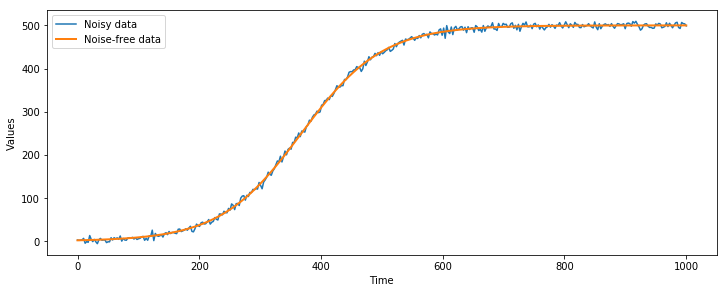

In [7]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,4.5))
plt.xlabel('Time')
plt.ylabel('Values')
plt.plot(times, values, label='Noisy data')
plt.plot(times, org_values, lw=2, label='Noise-free data')
plt.legend()
plt.show()

Now, I have enough data (a model, a list of times, and a list of values) to formulate a PINTS problem:

In [8]:
problem = pints.SingleOutputProblem(model, times, values)

I now have some toy data, and a model that can be used for forward simulations. To make it into a probabilistic problem, a _noise model_ needs to be added. This can be done using the `GaussianLogLikelihood` function, which assumes independently distributed Gaussian noise over the data, and can calculate log-likelihoods:

In [9]:
#log_likelihood = pints.GaussianLogLikelihood(problem)
log_likelihood = pints.GaussianKnownSigmaLogLikelihood(problem, noise)

This `log_likelihood` represents the _conditional probability_ $p(y|\theta)$, given a set of parameters $\theta$ and a series of $y=$ `values`, it can calculate the probability of finding those values if the real parameters are $\theta$.

This can be used in a Bayesian inference scheme to find the quantity of interest:

$p(\theta|y) = \frac{p(\theta)p(y|\theta)}{p(y)} \propto p(\theta)p(y|\theta)$

To solve this, a _prior_ is defined, indicating an initial guess about what the parameters should be. 
Similarly as using a _log-likelihood_ (the natural logarithm of a likelihood), this is defined by using a _log-prior_. Hence, the above equation simplifies to:

$\log p(\theta|y) \propto \log p(\theta) + \log p(y|\theta)$

In this example, it is assumed that we don't know too much about the prior except lower and upper bounds for each variable: We assume the first model parameter is somewhere on the interval $[0.01, 0.02]$, the second model parameter on $[400, 600]$, and the standard deviation of the noise is somewhere on $[1, 100]$.

In [13]:
# Create bounds for our parameters and get prior
bounds = pints.RectangularBoundaries([0.01, 400], [0.02, 600])
log_prior = pints.UniformLogPrior(bounds)

With this prior, the numerator of Bayes' rule can be defined -- the unnormalised log posterior, $\log \left[ p(y|\theta) p(\theta) \right]$, which is the natural logarithm of the likelihood times the prior:

In [14]:
# Create a posterior log-likelihood (log(likelihood * prior))
log_posterior = pints.LogPosterior(log_likelihood, log_prior)

Finally we create a list of guesses to use as initial positions. We'll run three MCMC chains so we create three initial positions:

In [15]:
xs = [
    np.array(true_parameters) * 0.9,
    np.array(true_parameters) * 1.05,
    np.array(true_parameters) * 1.15,
]

And this gives us everything we need to run an MCMC routine:

In [16]:
chains = pints.mcmc_sample(log_posterior, 3, xs)

Using Haario-Bardenet adaptive covariance MCMC
Generating 3 chains.
Running in sequential mode.
Iter. Eval. Accept.   Accept.   Accept.   Time m:s
0     3      0         0         0          0:00.0
[-1.36236894e-03  4.50532285e+02]
-inf


[1.91603068e-02 5.27665483e+02]
-50709.15070431655


[1.33993733e-02 5.75944904e+02]
-21858.312601605903
accepted


1     6      0         0         0.5        0:00.0
[-2.42318501e-03  4.47107541e+02]
-inf


[9.51123743e-03 5.22992961e+02]
-inf


[5.89853435e-03 5.74387857e+02]
-inf


2     9      0         0         0.333      0:00.0
[1.19501995e-02 4.49457704e+02]
-60748.573711934034


[6.40998950e-03 5.20523359e+02]
-inf


[3.46354081e-02 5.74626295e+02]
-inf


3     12     0         0         0.25       0:00.0
[1.03812760e-02 4.50042967e+02]
-130337.36593269807


[4.27906803e-02 5.27495925e+02]
-inf


[2.78272836e-02 5.72236213e+02]
-inf


[2.02246047e-02 4.49383032e+02]
-inf


[1.49804650e-02 5.29868819e+02]
-4764.549721802887
accepted


[2.02909

[1.18062785e-02 4.52507838e+02]
-63850.714515394604


[1.53278734e-02 5.32112728e+02]
-6643.656773578053


[1.44093986e-02 5.70037977e+02]
-18086.259291395017


60    183    0.115     0.0164    0.0492     0:00.2
[3.23596426e-02 4.53262538e+02]
-inf


[2.90250559e-02 5.25481967e+02]
-inf


[-7.20982575e-03  5.67105358e+02]
-inf


[2.93653736e-02 4.52158654e+02]
-inf


[1.50849222e-03 5.33274192e+02]
-inf


[1.92137400e-02 5.69784152e+02]
-86618.35590361507


[1.51955669e-02 4.54508827e+02]
-9216.555630250516


[1.63072586e-02 5.32153316e+02]
-13876.700418660059


[3.43556962e-03 5.69896008e+02]
-inf


[2.20908032e-02 4.53652142e+02]
-inf


[6.37842177e-03 5.28216793e+02]
-inf


[1.54981496e-02 5.71904375e+02]
-26332.827690599897


[1.70841701e-02 4.51648859e+02]
-14162.099421370649


[9.70886060e-03 5.29338712e+02]
-inf


[2.89750249e-02 5.65938843e+02]
-inf


[-6.41845582e-03  4.53469258e+02]
-inf


[-1.20646371e-03  5.31778088e+02]
-inf


[2.19053462e-02 5.69676943e+02]
-inf


[3.5439

[7.49825387e-03 4.53225542e+02]
-inf


[1.93328987e-02 5.32443171e+02]
-56729.344876717405


[1.00710631e-02 5.70876304e+02]
-113379.68490939906


[1.92993930e-02 4.53135162e+02]
-32311.31658574361


[7.15523990e-03 5.30439361e+02]
-inf


[1.90644655e-02 5.75401395e+02]
-89401.86576945812


[2.40879061e-02 4.54462848e+02]
-inf


[2.06342242e-02 5.26671232e+02]
-inf


[2.95367245e-02 5.68475492e+02]
-inf


[3.33256338e-03 4.51538224e+02]
-inf


[1.42899831e-02 5.29804086e+02]
-4638.849563385889
accepted


[2.84439310e-02 5.67978866e+02]
-inf


[-1.01394033e-03  4.59691436e+02]
-inf


[1.53368230e-02 5.32638576e+02]
-6841.96632212016


[1.38369294e-02 5.70069022e+02]
-17807.015971236804
accepted


[8.82101033e-03 4.50624063e+02]
-inf


[1.77014338e-02 5.32463069e+02]
-30936.85680593641


[-5.59541506e-03  5.71112188e+02]
-inf


[2.19204125e-02 4.55643220e+02]
-inf


[1.98628146e-02 5.31213680e+02]
-65000.680211199244


[1.77927745e-02 5.66467115e+02]
-55805.6902094004


[1.90404813e-02 4



[2.93033368e-02 4.56176751e+02]
-inf


[2.06171513e-02 5.25221261e+02]
-inf


[9.88242045e-03 5.64965135e+02]
-inf


[1.30112308e-02 4.55141785e+02]
-30615.18459259591


[3.14342563e-02 5.28541677e+02]
-inf


[3.40905893e-02 5.64401598e+02]
-inf


[3.72547011e-02 4.54324700e+02]
-inf


[1.90273854e-02 5.23907050e+02]
-46307.83969335978


[8.44314244e-03 5.62449924e+02]
-inf


Initial phase completed.
[1.09687150e-02 4.52707794e+02]
-97764.52914084074


[2.00599089e-02 5.27069265e+02]
-inf


[7.11446546e-03 5.61842090e+02]
-inf


200   603    0.039801  0.0199    0.0299     0:00.5
[1.60142967e-02 4.57389089e+02]
-8318.300701670441
accepted


[1.30289285e-02 5.26064331e+02]
-14413.846629794909


[1.43291488e-02 5.63045946e+02]
-14678.69252422657
accepted


[1.29745991e-02 4.55759802e+02]
-31035.93149944045


[2.43589627e-02 5.26732858e+02]
-inf


[1.42101177e-02 5.63426407e+02]
-14729.150435207934


[1.40368676e-02 4.54406740e+02]
-16086.031250358108


[1.80761766e-02 5.26609017e+02]
-3

[1.54833673e-02 4.57951746e+02]
-7677.998764021693


[1.46193018e-02 5.26609200e+02]
-3659.5344470862838
accepted


[1.46094165e-02 5.51100739e+02]
-10381.482378567429
accepted


[1.55023810e-02 4.58695434e+02]
-7440.1873384780965
accepted


[1.46103736e-02 5.26602087e+02]
-3660.469361475941
accepted


[1.46483838e-02 5.51231221e+02]
-10520.123566865564


[1.55550097e-02 4.59089887e+02]
-7314.720156809711
accepted


[1.46147076e-02 5.26602161e+02]
-3659.340299682629
accepted


[1.47244490e-02 5.48321348e+02]
-9644.165239888292
accepted


[1.55608236e-02 4.59268935e+02]
-7261.432748631538
accepted


[1.46178374e-02 5.26616070e+02]
-3661.085761540652


[1.46651836e-02 5.54212430e+02]
-11721.967995320678


[1.55955410e-02 4.59863886e+02]
-7092.633597809729
accepted


[1.45999490e-02 5.26547739e+02]
-3654.1486383288184
accepted


[1.48358711e-02 5.39910844e+02]
-7134.041446081153
accepted


[1.54779908e-02 4.58218568e+02]
-7596.3443594440405


[1.45991130e-02 5.26532766e+02]
-3651.80709380

-1579.4149886359291


[1.53950593e-02 4.77309985e+02]
-3100.6707159654425


[1.49588836e-02 5.13245309e+02]
-1881.067904934924


[1.46114784e-02 4.95588159e+02]
-1944.52770187994


[1.52092913e-02 4.94941662e+02]
-1369.8966676376674


[1.51822984e-02 5.14861931e+02]
-2434.618810130626


[1.50372436e-02 4.84133554e+02]
-2220.711209856929


[1.51689278e-02 4.87841300e+02]
-1753.052556722713


[1.50575229e-02 4.50092854e+02]
-11297.553269205702


[1.51082695e-02 4.91890358e+02]
-1458.0030719516728


[1.48628910e-02 5.07181197e+02]
-1403.9139743387623


[1.49052141e-02 5.06179795e+02]
-1351.5546122018127
accepted


[1.42205334e-02 5.40116160e+02]
-6943.760093127585


[1.49666266e-02 5.17489296e+02]
-2401.279958604634


[1.49467812e-02 4.95016357e+02]
-1358.38719692377


[1.46523958e-02 5.10374963e+02]
-1744.7258624185354


[1.46825922e-02 5.09677114e+02]
-1667.1536529730267


[1.50246450e-02 4.87269863e+02]
-1870.54344818909


[1.47412803e-02 5.01740172e+02]
-1415.8448493361661


[1.501618


[1.49453286e-02 5.04828440e+02]
-1299.1872286959756


[1.49885857e-02 4.98723426e+02]
-1229.814196296208


[1.50631241e-02 4.96487936e+02]
-1265.921583377414


[1.50562380e-02 4.99109719e+02]
-1227.975573872328


[1.50231882e-02 5.01690995e+02]
-1234.1483695436887


[1.49028538e-02 5.01217894e+02]
-1247.7696666183874


[1.49857561e-02 5.03712085e+02]
-1269.1162513694778


[1.50461634e-02 4.99686816e+02]
-1224.635135670608


[1.50605803e-02 4.98679335e+02]
-1231.2475440411517


[1.50845467e-02 4.97863734e+02]
-1245.2615300891782


[1.49196627e-02 4.98889887e+02]
-1256.2277209820404


[1.49853032e-02 4.98719288e+02]
-1230.582437069157


[1.51269399e-02 5.00718137e+02]
-1274.6187070234357


[1.49753851e-02 4.98084449e+02]
-1243.3443443744304


[1.49131642e-02 4.99627334e+02]
-1250.0028379518965


[1.49119133e-02 4.97571011e+02]
-1291.1475873178147


[1.49288179e-02 4.95782212e+02]
-1339.365208359404


[1.49330416e-02 5.00718439e+02]
-1233.5384038687473


[1.49161777e-02 5.04491293e+02]
-

accepted


[1.49867920e-02 4.99909414e+02]
-1221.1235227190828


[1.49448015e-02 5.00502285e+02]
-1229.4707354036202


[1.50387961e-02 5.00407886e+02]
-1225.0006575348555


[1.50356259e-02 5.00708900e+02]
-1226.2251055424333


[1.50013841e-02 4.99033905e+02]
-1224.5551574804094


[1.50108518e-02 5.00382099e+02]
-1220.5345658827325
accepted


[1.49973168e-02 5.00889864e+02]
-1222.2043459038866


[1.50008033e-02 4.99760715e+02]
-1220.374259671776
accepted


[1.50108629e-02 5.01093282e+02]
-1224.7551082515818


[1.50202192e-02 4.99529994e+02]
-1221.1640875846058


[1.49689975e-02 4.99338386e+02]
-1228.0525902681961


[1.50130689e-02 5.00508864e+02]
-1221.1738908423663
accepted


[1.50328430e-02 5.01328705e+02]
-1231.7903687832732


[1.49931099e-02 4.99401595e+02]
-1222.6982424173586


[1.49902759e-02 5.00473939e+02]
-1220.6103518633468
accepted


[1.49881437e-02 5.00371680e+02]
-1220.5858054156472
accepted


[1.50157219e-02 4.99115580e+02]
-1223.1366262197193


[1.49629683e-02 5.00362493e

[1.50125928e-02 4.99406935e+02]
-1221.4465948642169
accepted


[1.50214449e-02 5.00285380e+02]
-1221.2644127994845
accepted


[1.49944099e-02 4.99035041e+02]
-1225.4101575331304


540   1623   0.17      0.187     0.163      0:01.5
[1.49922109e-02 5.00047775e+02]
-1220.3082381443999
accepted


[1.50177404e-02 5.00633665e+02]
-1222.3156339919728
accepted


[1.50020170e-02 5.00092402e+02]
-1219.8528103517426
accepted


[1.50035009e-02 5.00348442e+02]
-1220.1256340530144
accepted


[1.50143675e-02 5.00505169e+02]
-1221.2830636884719
accepted


[1.50027641e-02 5.01305870e+02]
-1225.8478995902142


[1.49843576e-02 5.00096698e+02]
-1221.015279094624


[1.50169546e-02 4.99995952e+02]
-1220.3083884637833
accepted


[1.49986239e-02 5.00285426e+02]
-1220.011286593081
accepted


[1.50185751e-02 5.00162976e+02]
-1220.6371067754985


[1.50069045e-02 4.99794645e+02]
-1220.1339762179905
accepted


[1.50059253e-02 5.00442431e+02]
-1220.4478723017312
accepted


[1.49736184e-02 5.01513249e+02]
-1227.4767



[1.49888073e-02 4.99874206e+02]
-1220.9900374791573


[1.50249218e-02 5.00411540e+02]
-1222.2346008341963


[1.49901790e-02 5.00430295e+02]
-1220.5331197024386
accepted


[1.50051069e-02 5.00146457e+02]
-1219.8708379149637
accepted


[1.50278971e-02 4.99461835e+02]
-1221.9650360590442
accepted


[1.49878765e-02 5.00454642e+02]
-1220.7203718033186


[1.49904686e-02 5.00400059e+02]
-1220.4681811518858
accepted


[1.50282156e-02 5.00240100e+02]
-1222.1003613560908
accepted


[1.50085205e-02 5.00827409e+02]
-1222.4653999411817


[1.50229265e-02 5.00088509e+02]
-1220.9774255064451
accepted


[1.49719396e-02 5.00098390e+02]
-1222.999399902692


[1.49776893e-02 5.00557685e+02]
-1221.8861916292826
accepted


[1.50256106e-02 5.00827495e+02]
-1224.9216151943324


[1.50750155e-02 4.99522307e+02]
-1233.4696818927403


[1.49770410e-02 5.00329665e+02]
-1221.8020917984318
accepted


[1.50422952e-02 5.00485460e+02]
-1226.368728721405


[1.49971812e-02 5.00564053e+02]
-1220.6666491207648
accepted


[

[1.50374064e-02 4.99783768e+02]
-1222.8609299151815


[1.50393294e-02 5.00097360e+02]
-1223.7845465860212


[1.49847388e-02 5.01939419e+02]
-1232.1120925396615


[1.50162984e-02 5.00292363e+02]
-1220.7178609307073
accepted


[1.50158593e-02 4.99787723e+02]
-1220.3467312061707
accepted


[1.50192484e-02 4.99508282e+02]
-1221.184967517487


[1.50017546e-02 5.00700361e+02]
-1221.3107214459856
accepted


[1.50119935e-02 4.99691561e+02]
-1220.4036672036696
accepted


[1.49855650e-02 5.00779831e+02]
-1221.824449727092
accepted


[1.49602386e-02 5.00791489e+02]
-1225.3076078658826


[1.50245384e-02 5.00011691e+02]
-1221.0650482564135
accepted


[1.49831326e-02 4.99915574e+02]
-1221.5905232711457
accepted


[1.49551948e-02 5.01257434e+02]
-1228.17245591393


[1.50318248e-02 5.00494612e+02]
-1223.9167241523835


[1.50076052e-02 5.00138869e+02]
-1219.9159926462437
accepted


[1.49910511e-02 5.00812758e+02]
-1221.7634143696755


[1.50169561e-02 4.99670497e+02]
-1220.6154896871656
accepted


[1.49

[1.49765359e-02 5.00261796e+02]
-1221.9126532847924


[1.49871202e-02 4.99915795e+02]
-1221.0663986010302
accepted


[1.49761143e-02 5.00136413e+02]
-1222.1471453319562


[1.50232133e-02 4.98902947e+02]
-1224.7845561871918


[1.49560200e-02 5.00205394e+02]
-1226.6045480262803


[1.49913739e-02 4.99263771e+02]
-1223.9065499805272
accepted


[1.49939091e-02 5.00117482e+02]
-1220.1313875278183
accepted


[1.50208760e-02 5.00106379e+02]
-1220.7745063542216
accepted


[1.49959094e-02 4.98829905e+02]
-1227.2562862563238


[1.50203681e-02 4.99265448e+02]
-1222.2882140140855


[1.50224971e-02 5.00195812e+02]
-1221.1457217738398


[1.49919684e-02 4.99560392e+02]
-1221.909533302313
accepted


[1.50084026e-02 5.00354682e+02]
-1220.3120631387244
accepted


740   2223   0.236     0.244     0.231      0:02.0
[1.50226247e-02 5.00467797e+02]
-1222.1401771925698
accepted


[1.50210297e-02 5.00062371e+02]
-1220.7275179034575
accepted


[1.49731818e-02 5.02155185e+02]
-1235.0381078656935


[1.50165078e-0

[1.50584331e-02 4.99219357e+02]
-1228.197429554005


[1.49938068e-02 5.00040271e+02]
-1220.2035093670588


[1.50566598e-02 4.99555412e+02]
-1227.2977486472337


[1.49946580e-02 5.00963726e+02]
-1222.6104737728622


[1.49887420e-02 5.00687369e+02]
-1221.2996562671776
accepted


[1.50249352e-02 5.01198230e+02]
-1228.2567027844798


[1.50232149e-02 4.99202890e+02]
-1222.7451450142842


[1.49994378e-02 5.00311044e+02]
-1220.036049088665
accepted


[1.50324056e-02 4.99674252e+02]
-1222.079192477949


[1.50155769e-02 5.00679762e+02]
-1222.306174138734


[1.50013907e-02 5.00829812e+02]
-1221.9924975996344


[1.50388270e-02 5.00648921e+02]
-1226.5867766234358


[1.50262386e-02 4.98745047e+02]
-1226.210822326962


[1.49823928e-02 5.00539872e+02]
-1221.3324936697284
accepted


[1.49884547e-02 5.00244303e+02]
-1220.4903238057097
accepted


[1.49941713e-02 4.99442087e+02]
-1222.3200905751398


[1.49759967e-02 5.01660843e+02]
-1228.7947175135248


[1.50020971e-02 5.00171067e+02]
-1219.8726191907153

-1221.9852955648523
accepted


[1.49807897e-02 5.00668165e+02]
-1221.7966720262448


[1.50152443e-02 4.98836158e+02]
-1225.3996452605732


[1.50484385e-02 4.98100824e+02]
-1234.7220658309004


[1.49640196e-02 5.00104917e+02]
-1224.752835484009


[1.50576295e-02 5.00712236e+02]
-1233.225405440332


[1.49976223e-02 4.99123816e+02]
-1224.2024815862276


[1.49666167e-02 5.00277231e+02]
-1223.7515250705455


[1.50248619e-02 5.00810189e+02]
-1224.6417578201085


[1.49929171e-02 4.99384590e+02]
-1222.8330860175497


[1.49590222e-02 5.00224366e+02]
-1225.7106911380529


[1.50128356e-02 5.00492690e+02]
-1221.085153246312
accepted


[1.50225679e-02 5.00531363e+02]
-1222.4472227343886
accepted


[1.50278598e-02 5.00036276e+02]
-1221.5429242750565
accepted


[1.50288314e-02 5.00970710e+02]
-1226.8399976187543


[1.50509738e-02 4.99930711e+02]
-1226.216180092449


[1.49892121e-02 4.99593054e+02]
-1222.0838595768168
accepted


[1.49645179e-02 4.99229476e+02]
-1230.4330848070072


[1.50474489e-02 5.0

-1231.6215620660946


[1.50063863e-02 5.00685857e+02]
-1221.4772610888633


[1.50031910e-02 5.00360614e+02]
-1220.1463220748126
accepted


[1.50174249e-02 5.00204706e+02]
-1220.6103067389697
accepted


[1.50107041e-02 5.00265950e+02]
-1220.228983358608
accepted


[1.50305436e-02 5.01467208e+02]
-1232.950671718828


[1.50494499e-02 4.99620364e+02]
-1225.4025815063649


[1.50292569e-02 5.00082861e+02]
-1221.8411217218143


[1.49948075e-02 5.00785036e+02]
-1221.5918745458055


[1.50117412e-02 5.01510332e+02]
-1229.2937207482248


[1.50047902e-02 4.99546108e+02]
-1220.973640640446
accepted


[1.50050921e-02 5.00343516e+02]
-1220.1533834693603
accepted


940   2823   0.256     0.247     0.25       0:02.6
[1.50249389e-02 4.98542297e+02]
-1228.2070645232996


[1.50411262e-02 4.99323361e+02]
-1224.150328211068


[1.50065459e-02 4.98535710e+02]
-1229.2718641319723


[1.50012438e-02 5.00529290e+02]
-1220.5853463761944
accepted


[1.50275295e-02 4.98997687e+02]
-1224.2497103555472


[1.49951057e-

[1.49456141e-02 5.00228905e+02]
-1229.8845082880807


[1.49823386e-02 4.99226853e+02]
-1225.798220232998


[1.49893772e-02 5.00894515e+02]
-1222.2217342552472


[1.50223734e-02 4.99340116e+02]
-1222.010013102664


[1.50063227e-02 4.99782263e+02]
-1220.1651349784695
accepted


[1.50025308e-02 5.00196020e+02]
-1219.8894740825488
accepted


[1.49985975e-02 4.98495550e+02]
-1230.882686921054


[1.49994111e-02 5.00272161e+02]
-1219.9840277158285
accepted


[1.49779671e-02 5.00184731e+02]
-1221.7712284208487


[1.4995671e-02 4.9992343e+02]
-1220.2644844265844
accepted


[1.49795723e-02 4.98643324e+02]
-1233.0158757267493


[1.49764750e-02 4.99912376e+02]
-1222.698567799425


[1.49849423e-02 5.00102028e+02]
-1220.9379529753128
accepted


[1.50095158e-02 4.99748819e+02]
-1220.2361362847773
accepted


[1.50132942e-02 4.99650640e+02]
-1220.5374708990837
accepted


[1.50090979e-02 5.02162862e+02]
-1238.4975798317107


[1.50068791e-02 4.99957715e+02]
-1219.9015138139832
accepted


[1.50173897e-02 

[1.50039174e-02 5.00067553e+02]
-1219.8433789054704
accepted


[1.50555428e-02 4.99622768e+02]
-1227.002989912173


[1.4972053e-02 5.0148922e+02]
-1227.3811411687302


[1.49902367e-02 5.00207281e+02]
-1220.3502136486125


[1.49915699e-02 4.99414949e+02]
-1222.809291598463


[1.50522909e-02 5.01068594e+02]
-1235.0472837070158


[1.49555529e-02 5.00602819e+02]
-1226.1955853273364


[1.49845170e-02 4.98543903e+02]
-1233.1180939688434


[1.49841799e-02 5.00830889e+02]
-1222.1272247641202
accepted


[1.50300413e-02 4.98727583e+02]
-1226.517283382403


[1.50306541e-02 5.00186937e+02]
-1222.3435515329363


[1.50219280e-02 5.02430346e+02]
-1246.8842761685378


[1.49991196e-02 5.00379895e+02]
-1220.160353097313
accepted


[1.49971164e-02 5.00545576e+02]
-1220.6058235181122
accepted


1080  3243   0.258     0.25      0.253      0:03.0
[1.49401439e-02 5.01208643e+02]
-1231.8311836792288


[1.49754903e-02 5.00769444e+02]
-1222.6823287958696


[1.50073430e-02 5.00250096e+02]
-1220.0434530693994
acc

[1.49949156e-02 5.00889875e+02]
-1222.160456976667


[1.50364695e-02 5.01051443e+02]
-1229.5980545032512


[1.50031053e-02 5.01613417e+02]
-1229.3176084702943


[1.50310556e-02 5.00085877e+02]
-1222.1412510272512


[1.50224021e-02 4.99145982e+02]
-1223.0430172647355
accepted


[1.50065293e-02 4.99972632e+02]
-1219.8881648068104
accepted


[1.49578513e-02 5.00853127e+02]
-1225.976746459333


[1.50157374e-02 5.00067756e+02]
-1220.2643827069126
accepted


[1.49645779e-02 5.00647716e+02]
-1224.1530131739553


[1.50923230e-02 4.99936694e+02]
-1243.015810494633


[1.49500722e-02 4.98651127e+02]
-1243.6212337728048


[1.49664131e-02 5.01001275e+02]
-1224.8391750856501


[1.49237300e-02 4.99760839e+02]
-1242.5983350378117


[1.49736872e-02 5.00100532e+02]
-1222.656164910454


[1.50256434e-02 5.00266404e+02]
-1221.7831664400894


[1.50004164e-02 5.00344619e+02]
-1220.0880892831756
accepted


[1.50116296e-02 5.00527751e+02]
-1221.1268345898911


[1.50236521e-02 4.98993985e+02]
-1224.101638788802

-1225.1210458041553


[1.49844689e-02 4.99980078e+02]
-1221.2301108553236


[1.50214444e-02 4.98695523e+02]
-1226.6248521865086


[1.50248805e-02 4.97890622e+02]
-1237.003065678231


[1.50086334e-02 5.00650339e+02]
-1221.456110569549
accepted


[1.49963695e-02 5.00430124e+02]
-1220.2997657832473


[1.49706390e-02 4.98840106e+02]
-1232.9981325534916


[1.50440525e-02 5.00773647e+02]
-1229.1061631377256


[1.50400674e-02 4.99318140e+02]
-1223.9927825632815


[1.49913408e-02 5.00005570e+02]
-1220.4393623549759
accepted


[1.50522556e-02 5.00268165e+02]
-1227.9815727096418


[1.50014352e-02 4.99566479e+02]
-1221.0477919944342


[1.49897847e-02 5.00011353e+02]
-1220.5688766688045
accepted


[1.50363180e-02 5.00405821e+02]
-1224.4053814527188


[1.49366246e-02 5.00472545e+02]
-1232.5074798934538


[1.49657284e-02 5.00277629e+02]
-1223.9468369410781


[1.50129859e-02 5.00532334e+02]
-1221.2680759677703
accepted


[1.49832386e-02 5.01585855e+02]
-1227.829320123001


[1.49388494e-02 5.00686259e

[1.49633914e-02 5.01534582e+02]
-1228.7113843276054


[1.49186715e-02 5.01604959e+02]
-1241.3907206965525


[1.49688454e-02 4.99953111e+02]
-1224.1323799882764


[1.50298558e-02 4.99717540e+02]
-1221.6911927126716
accepted


[1.49704307e-02 5.00589321e+02]
-1222.9971030583906


[1.49810732e-02 4.99542636e+02]
-1223.6745568566569


[1.50620580e-02 4.98741779e+02]
-1231.2009713942234


[1.50194365e-02 4.99536294e+02]
-1221.1022875494655
accepted


[1.50176506e-02 4.98481128e+02]
-1229.059906140824


[1.51086526e-02 4.98175462e+02]
-1252.0160613589196


[1.50931454e-02 4.97361339e+02]
-1254.6343421858714


[1.50402459e-02 5.00679785e+02]
-1227.207131837281


[1.49311428e-02 5.00025048e+02]
-1236.832396814155


[1.50397790e-02 4.98730432e+02]
-1227.2777289486035


[1.50308419e-02 5.00445872e+02]
-1223.4520232402294


[1.50661684e-02 4.99746689e+02]
-1230.5765492135786


[1.50090228e-02 5.00358789e+02]
-1220.3555809682082
accepted


[1.50064519e-02 5.00919749e+02]
-1222.9078436407601


[1.5

[1.49572373e-02 4.99307584e+02]
-1232.0936183461818


[1.50379958e-02 5.00285903e+02]
-1224.198300398808


[1.50011270e-02 5.00091402e+02]
-1219.8652167135497
accepted


[1.49722730e-02 4.99470623e+02]
-1226.093398276027


[1.49863879e-02 4.99397932e+02]
-1223.6969797080335


[1.49760747e-02 5.00253869e+02]
-1221.9923963244203
accepted


[1.49857745e-02 4.99680281e+02]
-1222.1288204412965


[1.49726921e-02 4.99878781e+02]
-1223.5842401586276


[1.49349511e-02 4.99872922e+02]
-1236.1442078202706


[1.49939471e-02 4.99895905e+02]
-1220.4463534341712
accepted


[1.50507885e-02 4.99800757e+02]
-1225.8885582283117


[1.49240150e-02 5.00796968e+02]
-1237.2681898925164


[1.50871116e-02 4.98390695e+02]
-1241.2815079748584


[1.50291651e-02 5.00808785e+02]
-1225.5082945587628


[1.49992590e-02 5.00132593e+02]
-1219.901705126242
accepted


[1.49780748e-02 4.98738218e+02]
-1232.15063592306


[1.50277521e-02 5.00403948e+02]
-1222.6710607677321


[1.49030726e-02 5.00664159e+02]
-1248.4017023249496



[1.50483840e-02 5.01240728e+02]
-1235.7490269948778


[1.50271998e-02 5.00668022e+02]
-1224.0661081788314


[1.49628674e-02 5.00210550e+02]
-1224.7504282691154


[1.49947131e-02 4.99999947e+02]
-1220.196473603264
accepted


[1.50282958e-02 4.97517607e+02]
-1243.36035145794


[1.49121262e-02 5.00645342e+02]
-1243.375127853645


[1.49844259e-02 5.00180607e+02]
-1220.9110292879147
accepted


1420  4263   0.248     0.252639  0.252639   0:03.9
[1.50254596e-02 5.01385277e+02]
-1230.5577571299257


[1.49578166e-02 5.00484785e+02]
-1225.627352376667


[1.50051687e-02 5.00171172e+02]
-1219.8898802328617
accepted


[1.50230876e-02 5.00286061e+02]
-1221.4817627906154
accepted


[1.50462936e-02 4.99538473e+02]
-1224.7122099794854
accepted


[1.50299968e-02 5.01178083e+02]
-1229.2413288422983


[1.50012350e-02 5.00151632e+02]
-1219.8699624563894
accepted


[1.50114134e-02 5.00138757e+02]
-1220.0664484389915
accepted


[1.49616821e-02 5.00655364e+02]
-1224.7672529439158


[1.50235316e-02 5.0148266



[1.50473189e-02 4.98409298e+02]
-1231.102145454117


[1.49757039e-02 4.99518008e+02]
-1224.9398544891935


[1.49884928e-02 4.99287109e+02]
-1224.1699371501606


[1.49813089e-02 4.98938747e+02]
-1228.8961236848343


[1.50058376e-02 4.99777586e+02]
-1220.1813803990524
accepted


[1.50640407e-02 4.99162370e+02]
-1229.9151449467215


[1.50158488e-02 4.98500348e+02]
-1228.9233713703816


[1.50638163e-02 4.99685011e+02]
-1229.6323570810423


[1.50381328e-02 4.99663238e+02]
-1223.006039068263
accepted


[1.49957750e-02 4.99956111e+02]
-1220.1981161376216
accepted


[1.49807520e-02 4.99803158e+02]
-1222.3692001396414


[1.51274389e-02 4.96583917e+02]
-1281.2009955951698


[1.50110399e-02 5.00074455e+02]
-1219.996342848239
accepted


[1.50288812e-02 5.00134311e+02]
-1221.9003861112847
accepted


[1.50718319e-02 4.99359961e+02]
-1232.1883495471022


[1.50323569e-02 5.00383508e+02]
-1223.4412215515279


[1.50131976e-02 4.99888676e+02]
-1220.1132397666327
accepted


[1.50135841e-02 5.00950436e+0

-1227.8334195307289


[1.49628171e-02 5.00003626e+02]
-1225.4225980268636


[1.50104867e-02 5.00298269e+02]
-1220.2872358388943
accepted


[1.50368469e-02 4.97677472e+02]
-1240.2659324734093


[1.49340927e-02 5.00858533e+02]
-1233.1242298898715


[1.50166742e-02 4.99633558e+02]
-1220.6928152522978
accepted


[1.50118324e-02 4.99700710e+02]
-1220.378104725142
accepted


[1.50359143e-02 5.00172747e+02]
-1223.2992461801705


[1.49979047e-02 4.99417529e+02]
-1222.0816432943943


[1.50406239e-02 5.01066296e+02]
-1230.989243494056


[1.50346166e-02 4.98766779e+02]
-1226.4848474146847


[1.50287502e-02 4.99597848e+02]
-1221.7179387532055


[1.50020782e-02 4.99801276e+02]
-1220.2152004356715
accepted


[1.50466143e-02 4.99055381e+02]
-1226.1706859405003


[1.50541866e-02 4.98440338e+02]
-1231.8535572796302


1560  4683   0.25      0.249     0.25       0:04.3
[1.49853292e-02 4.99672510e+02]
-1222.2323424487051


[1.49952461e-02 5.00146779e+02]
-1220.0484930341022
accepted


[1.50523070e-02 4.99

[1.49898788e-02 5.00784667e+02]
-1221.6592608354179
accepted


[1.50120709e-02 5.00483776e+02]
-1220.9828291521203
accepted


[1.49485406e-02 5.01464810e+02]
-1230.9095921848864


[1.49832496e-02 5.01250894e+02]
-1224.7529878572664


[1.50330389e-02 5.00785434e+02]
-1226.2031894337554


[1.50191394e-02 4.98702518e+02]
-1226.5837949371373


[1.49785326e-02 4.99937456e+02]
-1222.2448490616014
accepted


[1.49940982e-02 4.98770384e+02]
-1228.2143798557333


[1.49986625e-02 4.98993644e+02]
-1225.2248627017498


[1.49764664e-02 5.00099295e+02]
-1222.1610095645756
accepted


[1.50549805e-02 4.99656025e+02]
-1226.8663622174722


[1.49243806e-02 5.00642831e+02]
-1237.3195805200573


[1.49716623e-02 5.00422153e+02]
-1222.663202206031
accepted


[1.50102225e-02 4.99579263e+02]
-1220.7313736988897
accepted


[1.50584585e-02 4.98718531e+02]
-1230.4979464072578


[1.49859803e-02 5.00835545e+02]
-1222.048526396738
accepted


[1.49973774e-02 5.00402127e+02]
-1220.2231680121115
accepted


[1.50343961e

[1.49727002e-02 5.01032090e+02]
-1224.119234797586


[1.49587657e-02 5.00899455e+02]
-1225.900005221467


[1.50003770e-02 5.00312137e+02]
-1220.0320954029528
accepted


[1.49759734e-02 5.00780327e+02]
-1222.6608988207402


[1.49431458e-02 5.01517765e+02]
-1232.6028203703129


[1.50413702e-02 5.01060619e+02]
-1231.1587130009164


[1.5031217e-02 5.0164362e+02]
-1235.6645313221281


[1.50441384e-02 4.98597059e+02]
-1228.9203604099105


[1.50379992e-02 4.99907820e+02]
-1223.0823675079084


[1.49774174e-02 4.98360874e+02]
-1237.867766740343


[1.49864738e-02 5.00176496e+02]
-1220.6938945035035


[1.49752405e-02 5.00146075e+02]
-1222.2795712241984


[1.50154809e-02 5.01189441e+02]
-1226.3333806944252


[1.49921792e-02 5.00952802e+02]
-1222.524206204633


[1.50004298e-02 4.99955190e+02]
-1219.9818284064597
accepted


[1.49253228e-02 5.02199289e+02]
-1243.7167919626238


[1.50507414e-02 5.00731113e+02]
-1230.8938062596492


[1.50254270e-02 4.99252049e+02]
-1222.6097430804807


[1.50435135e-02 

[1.50143984e-02 5.00726274e+02]
-1222.4430034190675


[1.49992075e-02 4.99616286e+02]
-1220.9743956167226


[1.50313608e-02 5.00555882e+02]
-1224.1827475689395


[1.49916160e-02 5.00281087e+02]
-1220.2755508203936
accepted


[1.50076293e-02 5.00536516e+02]
-1220.871597567654


[1.50215640e-02 5.00936642e+02]
-1225.0496340199977


[1.49974205e-02 5.00644474e+02]
-1220.966179171442


[1.50186223e-02 5.00815188e+02]
-1223.6088001968951


[1.49629566e-02 5.00930219e+02]
-1225.155721387715


[1.49734208e-02 4.99758393e+02]
-1223.9922698904995


[1.49749776e-02 5.00420117e+02]
-1222.120271845847


[1.5040274e-02 4.9991858e+02]
-1223.5641216787049


[1.49460479e-02 5.01688836e+02]
-1233.1634425160014


[1.50128795e-02 5.02363605e+02]
-1243.0425928355567


[1.50581008e-02 4.99534945e+02]
-1227.7092416324374


[1.50450750e-02 4.99757334e+02]
-1224.4230744510091


[1.50101323e-02 4.99834531e+02]
-1220.0835161508396
accepted


[1.49989272e-02 5.01058530e+02]
-1223.412743964969
accepted


[1.49473

[1.50320345e-02 5.00063443e+02]
-1222.2584059308747


[1.49996357e-02 4.99330824e+02]
-1222.4616551184458


[1.49865903e-02 4.99932974e+02]
-1221.0836427348665


[1.49801577e-02 5.00307220e+02]
-1221.3727461975247
accepted


[1.50291796e-02 4.97767787e+02]
-1238.8477771772405


[1.49941179e-02 4.99856825e+02]
-1220.5301023121249
accepted


[1.50137334e-02 4.99240035e+02]
-1222.3450778898878


[1.49887388e-02 4.99747635e+02]
-1221.435438444959
accepted


[1.49990265e-02 4.99590216e+02]
-1221.0989506660778


[1.49558080e-02 5.00581926e+02]
-1226.125520213496


[1.50111803e-02 5.00297679e+02]
-1220.3281504032802
accepted


[1.49800644e-02 5.00114127e+02]
-1221.5621760466433
accepted


[1.50425052e-02 5.00194773e+02]
-1224.8805836421175


[1.49774902e-02 4.98473987e+02]
-1236.0646088995873


[1.49737803e-02 4.99529891e+02]
-1225.297411036921


[1.49846438e-02 5.00842530e+02]
-1222.1525301070656
accepted


[1.49719415e-02 5.02148223e+02]
-1234.9690168091852


[1.50143467e-02 4.98922448e+02]

-1221.075508056685
accepted


[1.50468148e-02 4.99817057e+02]
-1224.898184569233


[1.49779804e-02 5.00623920e+02]
-1221.982977710702


[1.50349805e-02 4.99696333e+02]
-1222.4535946136493


[1.49951514e-02 5.01012030e+02]
-1222.9408569046673


[1.50162996e-02 5.01437831e+02]
-1229.223281846944


[1.50219490e-02 5.00032521e+02]
-1220.7900808800234
accepted


[1.50643104e-02 4.99574958e+02]
-1229.6549982851184


[1.50049740e-02 5.00214167e+02]
-1219.9299612809516
accepted


[1.50661738e-02 5.00518307e+02]
-1234.8867232230127


[1.49923353e-02 5.00265272e+02]
-1220.2241324747088
accepted


[1.50256073e-02 5.00563531e+02]
-1223.1220089001251


[1.50291611e-02 4.99378467e+02]
-1222.3692339761294


[1.49629043e-02 5.00265274e+02]
-1224.6255058961224


[1.49911501e-02 5.01368821e+02]
-1225.7502040460922


[1.50152177e-02 5.00055849e+02]
-1220.2183283378222
accepted


[1.50040178e-02 5.01351107e+02]
-1226.4318772988102


[1.50055600e-02 5.00315601e+02]
-1220.107236888612
accepted


[1.49867658


[1.50717748e-02 5.01040245e+02]
-1243.2609625724544


[1.50422829e-02 4.99392178e+02]
-1224.1605453586674


[1.49650024e-02 4.99741284e+02]
-1226.1500969560511


[1.50018908e-02 5.00313897e+02]
-1220.0376892041968
accepted


[1.50593515e-02 5.00257829e+02]
-1230.3063992161824


[1.50273402e-02 4.99792754e+02]
-1221.3271315338259


[1.50145919e-02 5.01009533e+02]
-1224.5356254770202


[1.50325873e-02 4.98838149e+02]
-1225.7551463436096


[1.50419315e-02 4.98999779e+02]
-1225.7008762272292


[1.50042039e-02 5.00051777e+02]
-1219.8456658809093
accepted


[1.50468688e-02 5.00163999e+02]
-1225.889678560535


[1.50216193e-02 5.00080727e+02]
-1220.8158831869441


[1.50205607e-02 4.99180901e+02]
-1222.7708158368548


[1.49680611e-02 4.98885923e+02]
-1233.2301559071961


[1.49460415e-02 5.00839422e+02]
-1229.0606274595766


[1.50396281e-02 4.99579747e+02]
-1223.3450292555967


[1.49889703e-02 4.99586409e+02]
-1222.1508818661052


[1.49921260e-02 5.00683601e+02]
-1221.1694388191388


[1.4989192


[1.50017286e-02 5.00556265e+02]
-1220.6926638034893
accepted


[1.50092638e-02 4.99374799e+02]
-1221.6538472271598


[1.49678464e-02 5.01280200e+02]
-1226.1912747573572


[1.49974599e-02 5.01457560e+02]
-1226.9621339783976


[1.49838992e-02 5.00997056e+02]
-1222.9970456979904


[1.49274584e-02 5.01406859e+02]
-1236.9749963208792


[1.50032212e-02 4.99946754e+02]
-1219.925510196194
accepted


[1.49771258e-02 5.00962255e+02]
-1223.2976646696357


[1.50430377e-02 4.99637207e+02]
-1223.9585031049528


[1.49430413e-02 5.01229170e+02]
-1231.0514183252487


[1.49749997e-02 5.00558695e+02]
-1222.2461531630363
accepted


[1.49522869e-02 5.01496676e+02]
-1230.3058084895802


[1.49905902e-02 4.98509669e+02]
-1232.1986761563583


[1.49837130e-02 5.00222612e+02]
-1220.9647426980816
accepted


[1.49629849e-02 5.01018125e+02]
-1225.4916851419237


[1.49612496e-02 4.99726983e+02]
-1227.30703952988


2040  6123   0.251     0.254     0.249      0:05.6
[1.50150062e-02 4.99705142e+02]
-1220.456099564223


[1.50007351e-02 5.00747241e+02]
-1221.5088424062253
accepted


[1.50148304e-02 5.00054629e+02]
-1220.191543553596
accepted


[1.50065451e-02 5.00184812e+02]
-1219.9304327523419
accepted


[1.49510816e-02 5.00517017e+02]
-1227.4653265914512


[1.50287737e-02 4.99106450e+02]
-1223.6350887722224


[1.50526837e-02 4.99362234e+02]
-1226.4248281025796


[1.49980411e-02 5.00711576e+02]
-1221.265159761418
accepted


[1.50300916e-02 4.99851445e+02]
-1221.688195898127


[1.49887424e-02 5.00952808e+02]
-1222.564995741638


[1.50245174e-02 5.01253368e+02]
-1228.773392174768


[1.50013246e-02 5.00532114e+02]
-1220.596765266511
accepted


[1.49939193e-02 4.99830322e+02]
-1220.619341460754
accepted


[1.49825977e-02 5.01904626e+02]
-1231.5922436530734


[1.5014670e-02 5.0105582e+02]
-1224.9475687549968


[1.49831188e-02 5.00059537e+02]
-1221.2349979976145
accepted


[1.49835046e-02 5.01703470e+02]
-1229.1277900224259


[1.50148820e-02 5.01893223e+02]
-1235.2622782529481


[1.50448711e-02 4.99282891e+

[1.50342469e-02 4.98565191e+02]
-1228.2800560301437


[1.49900997e-02 4.98438475e+02]
-1233.3181880149768


[1.49905286e-02 4.99427617e+02]
-1222.8682299659079
accepted


[1.50480541e-02 4.99725733e+02]
-1225.102246589191


[1.50302274e-02 4.98827697e+02]
-1225.6786614059204


[1.49822711e-02 5.00682432e+02]
-1221.7046164835126
accepted


[1.49610578e-02 5.00786337e+02]
-1225.12182901688


[1.50072115e-02 4.99003672e+02]
-1224.3184204785005


[1.50196187e-02 5.00987491e+02]
-1225.1416776713806


2180  6543   0.251     0.254     0.249      0:06.0
[1.50300367e-02 5.00066070e+02]
-1221.930364267029


[1.49864288e-02 5.00876307e+02]
-1222.225248871433
accepted


[1.49578416e-02 4.99632732e+02]
-1229.0232304013298


[1.50055056e-02 5.00053623e+02]
-1219.8498168839706
accepted


[1.49601675e-02 5.00072356e+02]
-1225.8723958416901


[1.49855591e-02 5.00988299e+02]
-1222.872085858218
accepted


[1.50239783e-02 4.99821416e+02]
-1220.9368817165073
accepted


[1.49546168e-02 4.99368155e+02]
-1232

[1.50069344e-02 4.99865168e+02]
-1220.0069277755076
accepted


[1.50079664e-02 5.02197591e+02]
-1238.8752151099975


[1.51317111e-02 4.98192188e+02]
-1264.7207315885082


[1.50501578e-02 4.97531960e+02]
-1243.2849983244218


[1.50467410e-02 5.00295057e+02]
-1226.4791642891055


[1.50051772e-02 5.00170293e+02]
-1219.8892750488126
accepted


[1.50164660e-02 4.99484992e+02]
-1221.162617972295


[1.49620242e-02 5.01283424e+02]
-1227.0566964248258


[1.50311258e-02 5.00589743e+02]
-1224.346016336965


[1.50388102e-02 5.00872480e+02]
-1228.4705566429159


[1.50262877e-02 5.00790102e+02]
-1224.7647000088682
accepted


[1.50530554e-02 5.00862131e+02]
-1233.0065493415468


[1.50018190e-02 5.01009019e+02]
-1223.207093108444


[1.51030761e-02 4.99717989e+02]
-1247.7421004938171


[1.50011297e-02 4.99684323e+02]
-1220.600619406014


[1.50415901e-02 4.99129323e+02]
-1224.9790853578352


[1.5073415e-02 5.0028280e+02]
-1236.1212333508447


[1.50100648e-02 5.00774194e+02]
-1222.2730222836917
accepted


-1230.3875454771678


[1.49981253e-02 5.00492630e+02]
-1220.4411819640418
accepted


[1.50108412e-02 4.99286301e+02]
-1222.1132696088516
accepted


[1.49171188e-02 5.00325518e+02]
-1242.0343876592624


[1.49905523e-02 5.00973704e+02]
-1222.6614496043037


[1.50010877e-02 4.98490220e+02]
-1230.563993836196


[1.50064646e-02 4.98848009e+02]
-1225.8060366959594


[1.49857182e-02 5.01048744e+02]
-1223.2365359250146


[1.50411790e-02 4.97248475e+02]
-1248.2120738328547


[1.49943741e-02 4.99808825e+02]
-1220.6449331984836
accepted


[1.49531066e-02 5.01595787e+02]
-1230.9026103668352


[1.50508411e-02 5.00692127e+02]
-1230.5754452129238


[1.49961210e-02 5.00101529e+02]
-1220.0214982759826
accepted


[1.49646610e-02 5.00713486e+02]
-1224.2437625121377


[1.50708590e-02 4.99606175e+02]
-1232.0027409677314


[1.50442045e-02 5.00535983e+02]
-1227.244384648365


[1.50540269e-02 4.98829587e+02]
-1228.8365425593963


[1.49935313e-02 4.99674754e+02]
-1221.2025935511108
accepted


[1.50261355e-02 5

[1.50091794e-02 4.99946779e+02]
-1219.9434909174017
accepted


[1.50528599e-02 5.00044055e+02]
-1227.125999341747


[1.50808314e-02 5.00435768e+02]
-1240.9181673021747


[1.49580835e-02 4.98239034e+02]
-1247.2193144303544


[1.49718713e-02 4.99731014e+02]
-1224.4848887859769


[1.50230361e-02 5.00040173e+02]
-1220.9205129422055


[1.5027549e-02 5.0020825e+02]
-1221.8927757660924


[1.50191098e-02 4.99496671e+02]
-1221.2186305982252
accepted


[1.50386036e-02 5.00631622e+02]
-1226.3992539000506


[1.49806842e-02 4.99558398e+02]
-1223.6495202458561


[1.49941223e-02 4.99505491e+02]
-1221.9602866875875


[1.49837690e-02 5.01939578e+02]
-1232.083722034147


[1.50207973e-02 4.99602740e+02]
-1220.993304557805
accepted


[1.50287935e-02 4.99713013e+02]
-1221.5598010353865
accepted


[1.50109875e-02 5.00359230e+02]
-1220.4764153019644


[1.49858427e-02 5.00090946e+02]
-1220.8503104285048
accepted


[1.50593242e-02 5.00338391e+02]
-1230.8098044159751


[1.49894998e-02 5.01769635e+02]
-1230.0964


[1.49952997e-02 5.02095152e+02]
-1235.173017547538


[1.50200044e-02 4.99984390e+02]
-1220.5561285652952
accepted


[1.50004727e-02 5.00186333e+02]
-1219.8951373097445
accepted


[1.50049460e-02 4.99808709e+02]
-1220.1251959788772
accepted


[1.49882329e-02 5.00419438e+02]
-1220.6395985837244
accepted


[1.50032096e-02 5.00833301e+02]
-1222.1081358967115


[1.49533563e-02 5.01557218e+02]
-1230.546664989277


[1.50019625e-02 5.00756879e+02]
-1221.6080747673918


[1.49404512e-02 4.99523090e+02]
-1236.6808917582068


[1.49479770e-02 4.99667745e+02]
-1232.2662430058879


[1.49669926e-02 5.01123965e+02]
-1225.3535316663956


[1.49878699e-02 5.00512545e+02]
-1220.8338887596408
accepted


[1.49861612e-02 5.00738247e+02]
-1221.622992026946


[1.50008408e-02 5.00483180e+02]
-1220.4294819374797
accepted


[1.50346567e-02 5.00541795e+02]
-1224.8179687244444


[1.50809687e-02 4.98163244e+02]
-1241.0176064203536


[1.50453404e-02 5.00321889e+02]
-1226.2308452154869


[1.49899919e-02 4.99624821e+02

-1220.9990084864883
accepted


[1.49716346e-02 4.99644269e+02]
-1225.049123050091


[1.49901440e-02 4.99116262e+02]
-1225.3306045182733


[1.49585882e-02 4.99542107e+02]
-1229.4851906022823


[1.49726226e-02 4.99745760e+02]
-1224.2346709590524


[1.49757345e-02 5.00963861e+02]
-1223.4434015677252


[1.49829490e-02 5.00681574e+02]
-1221.6452573008087
accepted


[1.49558321e-02 4.99341191e+02]
-1232.260900250367


[1.50282997e-02 4.99197615e+02]
-1223.0929970122259


[1.50087916e-02 4.99942588e+02]
-1219.9385623610174
accepted


[1.50241641e-02 5.00480185e+02]
-1222.436393781834


[1.49878675e-02 5.00464595e+02]
-1220.7384878307312


[1.49455764e-02 4.99681125e+02]
-1233.102259049439


[1.49808084e-02 4.99484613e+02]
-1224.1036723948323


2520  7563   0.248     0.25      0.248      0:06.9
[1.49934568e-02 5.00299948e+02]
-1220.1908861461047
accepted


[1.49986812e-02 5.01176677e+02]
-1224.3480228781186


[1.49432325e-02 5.00175039e+02]
-1230.9644410470164


[1.50484119e-02 5.00846361e+02]

[1.49342490e-02 5.01747939e+02]
-1236.773912582792


[1.49406484e-02 5.00577929e+02]
-1230.812352382281


[1.49968754e-02 4.99997152e+02]
-1220.0756090707316
accepted


[1.49673425e-02 4.99538757e+02]
-1226.8704521710004


[1.50052816e-02 5.01346083e+02]
-1226.51840056756


[1.50371305e-02 5.00627503e+02]
-1225.9919332006002


[1.49607797e-02 5.01571747e+02]
-1229.3946896861926


[1.50071012e-02 4.99699126e+02]
-1220.3683504962141
accepted


[1.50074925e-02 4.99091881e+02]
-1223.5816746438163
accepted


[1.50450507e-02 5.00213757e+02]
-1225.617183481855


[1.50044092e-02 4.99218788e+02]
-1222.8413395369562
accepted


[1.50136662e-02 4.99347154e+02]
-1221.7435371079225
accepted


[1.49666665e-02 5.01367518e+02]
-1226.9593883262735


[1.50324073e-02 4.97231571e+02]
-1248.8208554539622


[1.50256785e-02 4.98923934e+02]
-1224.6966444547063


[1.50227986e-02 4.98784359e+02]
-1225.7888861429876


[1.49804087e-02 4.99685982e+02]
-1222.976486796028
accepted


[1.49936616e-02 4.99749425e+02]
-1

[1.50156547e-02 5.00158260e+02]
-1220.370023054047
accepted


[1.50157745e-02 4.98632699e+02]
-1227.4207322570096


[1.49959522e-02 5.00060858e+02]
-1220.0563038420435
accepted


[1.49845274e-02 5.00224201e+02]
-1220.8726707410976
accepted


[1.50131567e-02 5.00272641e+02]
-1220.4041501408576


[1.50399362e-02 4.99868917e+02]
-1223.4206745326182


[1.49403375e-02 5.00207269e+02]
-1231.9337812571625


[1.50316542e-02 5.00204465e+02]
-1222.578104755688


[1.50166604e-02 4.99431661e+02]
-1221.3831782827551


[1.49553227e-02 4.99733572e+02]
-1229.133638577743


[1.49692770e-02 5.01288921e+02]
-1226.0768000230335


[1.50135481e-02 4.98408660e+02]
-1230.21370249065


[1.50260790e-02 4.99866378e+02]
-1221.1626516194167
accepted


[1.49668590e-02 5.00838243e+02]
-1224.1557586495635


[1.49894325e-02 4.99793283e+02]
-1221.1816425393445


[1.50495130e-02 5.00202501e+02]
-1226.81053986625


[1.50379678e-02 4.98967124e+02]
-1225.3706856344363


[1.50048321e-02 5.00067990e+02]
-1219.8448685911806
a

[1.50249139e-02 4.99638190e+02]
-1221.2430325521825
accepted


[1.50365764e-02 4.99975072e+02]
-1222.9135991687465


[1.49648740e-02 5.01316856e+02]
-1226.840762819306


[1.50019667e-02 5.00566751e+02]
-1220.7383486368194
accepted


[1.50694189e-02 4.97336717e+02]
-1249.0623773968698


[1.49724987e-02 5.00990737e+02]
-1223.9371474592338
accepted


[1.50328097e-02 4.99960413e+02]
-1222.2059413882787


[1.50404231e-02 5.00306320e+02]
-1224.8683836054556


[1.49893880e-02 4.99545532e+02]
-1222.3161062625065
accepted


[1.49986117e-02 5.00064551e+02]
-1219.9392887591384
accepted


[1.50075070e-02 5.00952486e+02]
-1223.2394424300269


[1.49933954e-02 4.98620974e+02]
-1230.153285659466


[1.50115022e-02 4.99822363e+02]
-1220.1317616894667
accepted


[1.5039682e-02 4.9944744e+02]
-1223.5763404286952


[1.49779401e-02 4.98667500e+02]
-1233.1335978270015


[1.50622927e-02 4.98783581e+02]
-1231.0106453799356


[1.49841293e-02 4.98788966e+02]
-1229.9875186846


[1.49694968e-02 4.99505961e+02]
-12

[1.49589127e-02 5.01395552e+02]
-1228.325828033742


[1.50279736e-02 5.00272695e+02]
-1222.1724938656741
accepted


[1.49804535e-02 5.01318002e+02]
-1225.3952866179577


[1.49803755e-02 4.99633321e+02]
-1223.265870831645


[1.50589598e-02 5.00636297e+02]
-1233.02742872072


[1.50212792e-02 5.00379108e+02]
-1221.570703474351
accepted


[1.49669585e-02 5.00133095e+02]
-1223.9725815844374


[1.50458241e-02 5.00152577e+02]
-1225.5610369808837


[1.49548310e-02 5.01045098e+02]
-1227.2624775410638


[1.50117968e-02 4.98731271e+02]
-1226.5905408698738


[1.49963939e-02 4.99338109e+02]
-1222.7334133891122
accepted


[1.50185337e-02 5.01466768e+02]
-1230.0217581109694


[1.49819568e-02 4.99540241e+02]
-1223.5262125248703


[1.49512845e-02 4.99826208e+02]
-1229.9038641998122


[1.50444652e-02 5.00849167e+02]
-1229.9377621001702


[1.50117418e-02 5.00873653e+02]
-1223.109704878753


[1.50059719e-02 4.98971681e+02]
-1224.688151793671


[1.49663470e-02 5.02522999e+02]
-1240.938181617312


[1.497803

accepted


2860  8583   0.247     0.25      0.245      0:07.8
[1.50442343e-02 4.97528916e+02]
-1242.9946903100122


[1.50270808e-02 4.99716496e+02]
-1221.352791287167
accepted


[1.50018534e-02 4.97427796e+02]
-1249.0314271483915


[1.50030175e-02 4.99853678e+02]
-1220.073047344069
accepted


[1.50645768e-02 4.99687258e+02]
-1229.8946557990653


[1.49871998e-02 5.00916331e+02]
-1222.4041138053558


[1.49698453e-02 4.99621712e+02]
-1225.6317577083935


[1.50091404e-02 5.00483616e+02]
-1220.7625331422732
accepted


[1.50088142e-02 4.99213220e+02]
-1222.6381442411564


[1.50065245e-02 4.99108623e+02]
-1223.511806119736


[1.4993758e-02 5.0087042e+02]
-1222.0417700757941


[1.50051953e-02 4.99315039e+02]
-1222.1603757031944


[1.49845784e-02 5.00110852e+02]
-1220.9686532133094


[1.50264677e-02 5.00754647e+02]
-1224.534000762757


[1.50269519e-02 4.98598892e+02]
-1227.6363435041892


[1.49310066e-02 5.00677840e+02]
-1234.394730776125


[1.50018685e-02 4.98544439e+02]
-1229.7486395056394




[1.50155550e-02 4.99751411e+02]
-1220.389145907052
accepted


[1.49994602e-02 4.98549672e+02]
-1230.035445670419


[1.50609354e-02 4.98381787e+02]
-1233.701098743709


[1.50192759e-02 4.97865661e+02]
-1237.7993380017303


[1.49880393e-02 5.00032609e+02]
-1220.7046241042897
accepted


[1.49644263e-02 5.01450094e+02]
-1227.8820854424278


[1.50466862e-02 4.98722182e+02]
-1228.2517092398475


[1.49736653e-02 4.98865773e+02]
-1231.7650013968757


[1.49884304e-02 5.01562728e+02]
-1227.6391405329307


[1.50429513e-02 5.01167872e+02]
-1232.9150491846708


[1.49863980e-02 4.99669402e+02]
-1222.0903978917813


[1.50048073e-02 5.00822647e+02]
-1222.1429290380004


[1.49825210e-02 4.99685386e+02]
-1222.6135659378033


[1.49615878e-02 5.00680492e+02]
-1224.8198094090064


[1.50297275e-02 5.01249439e+02]
-1229.9861727104117


[1.50218206e-02 4.99208199e+02]
-1222.655142028276


[1.49521338e-02 5.00486389e+02]
-1227.1836372282123


[1.50025536e-02 5.00597073e+02]
-1220.8763197415471
accepted


[1.50

[1.49820461e-02 5.00605568e+02]
-1221.5106510445012
accepted


[1.49825261e-02 4.99784901e+02]
-1222.1560087706844


[1.50609382e-02 5.00718200e+02]
-1234.5908421265513


[1.50060692e-02 5.00790616e+02]
-1222.0371337430117
accepted


[1.49608813e-02 5.01353901e+02]
-1227.706191447354


[1.49895044e-02 5.02042818e+02]
-1233.8337586884245


[1.49322302e-02 5.01112569e+02]
-1234.1962541395937


[1.50034910e-02 5.00879053e+02]
-1222.412327816179


[1.49779399e-02 5.00900620e+02]
-1222.928189629549


3000  9003   0.247     0.248     0.245      0:08.2
[1.50362733e-02 5.00339398e+02]
-1224.0588355967438


[1.49997554e-02 4.99872816e+02]
-1220.1456286395614
accepted


[1.49970667e-02 5.00091116e+02]
-1219.98438790608
accepted


[1.50311988e-02 4.98904484e+02]
-1225.1508071290853


[1.50111834e-02 4.98498696e+02]
-1229.2735976789884


[1.49816960e-02 5.00114045e+02]
-1221.3314220364634


[1.50218136e-02 4.99350030e+02]
-1221.9361927824846
accepted


[1.50288045e-02 4.99810728e+02]
-1221.5078503

[1.50261046e-02 5.01105787e+02]
-1227.5438137169972


[1.50066560e-02 5.00390972e+02]
-1220.3279139648805
accepted


[1.49901523e-02 4.99843134e+02]
-1220.937282608091
accepted


[1.49891449e-02 5.01764198e+02]
-1230.0110269783218


[1.50331274e-02 5.00275030e+02]
-1223.1158306959596


[1.49722566e-02 5.00791995e+02]
-1223.1761535757348


[1.50402302e-02 5.00003818e+02]
-1223.7278447782282
accepted


[1.50200766e-02 4.99531881e+02]
-1221.15025654838


[1.49569743e-02 5.00385295e+02]
-1225.9451672322966


[1.50101004e-02 5.01161019e+02]
-1225.2727347008097


[1.49812021e-02 5.00854124e+02]
-1222.4382467164899


[1.50359084e-02 5.00955938e+02]
-1228.467269550653


[1.50457834e-02 5.00718084e+02]
-1229.1506664518643


[1.50085409e-02 5.00221092e+02]
-1220.0424863490482
accepted


[1.49780921e-02 4.99944064e+02]
-1222.2990471318544


[1.50178946e-02 5.00310605e+02]
-1220.9305528852378
accepted


[1.49969549e-02 5.00460140e+02]
-1220.3619427573494
accepted


[1.49868448e-02 5.00449051e+02]


[1.49561237e-02 5.01571716e+02]
-1230.1480058563716


[1.50038269e-02 4.99659909e+02]
-1220.569291081228


[1.49494305e-02 5.01265171e+02]
-1229.5196902497844


[1.50046279e-02 4.99200560e+02]
-1222.9550918057398


[1.49475874e-02 5.00271352e+02]
-1229.0576781080897


[1.49287659e-02 5.01719486e+02]
-1238.3142244022422


[1.50118583e-02 4.99342108e+02]
-1221.7808292047862


[1.49845647e-02 4.99511575e+02]
-1223.2481092996059


[1.50012257e-02 4.98771104e+02]
-1227.156958743716


[1.50510721e-02 4.99929022e+02]
-1226.2390879490374


[1.49377788e-02 5.01284547e+02]
-1232.881687748328


[1.48925887e-02 5.01560898e+02]
-1254.1957454778396


[1.49795063e-02 5.00019416e+02]
-1221.847352370844


[1.50012395e-02 5.00469554e+02]
-1220.3946648416625
accepted


[1.49480761e-02 5.00845971e+02]
-1228.4709291683548


[1.50039624e-02 4.99189936e+02]
-1223.078736296247


[1.49970378e-02 5.00289634e+02]
-1220.0495231603895
accepted


[1.49648907e-02 5.02464209e+02]
-1240.0279434043375


[1.50698826e-02

[1.49353020e-02 5.01324731e+02]
-1233.8577256773315


[1.50295530e-02 4.98628452e+02]
-1227.4194216183841


[1.49919141e-02 5.01029061e+02]
-1223.0145246795296


[1.49679593e-02 5.02909179e+02]
-1248.0258874967465


[1.50744224e-02 4.98548039e+02]
-1235.8879826237096


[1.49807676e-02 5.00681363e+02]
-1221.837346752595


[1.50097910e-02 5.01161016e+02]
-1225.2333601482176
accepted


[1.49900914e-02 4.99832398e+02]
-1220.9773216022643
accepted


[1.49542116e-02 5.01558234e+02]
-1230.3899369688645


[1.50226345e-02 5.00800245e+02]
-1224.1582321495812
accepted


[1.50077630e-02 4.99554648e+02]
-1220.851321405336
accepted


[1.49873844e-02 5.00039595e+02]
-1220.7615267698368


[1.49794036e-02 5.00808417e+02]
-1222.4023453270888
accepted


[1.49777026e-02 5.00893211e+02]
-1222.9177022469019
accepted


[1.50206079e-02 5.00562969e+02]
-1222.3227570707916


[1.49254501e-02 5.01117622e+02]
-1236.8378215047046


[1.49599835e-02 4.99886752e+02]
-1226.7510807155154


[1.50028615e-02 5.00899798e+02

[1.50147100e-02 4.99333414e+02]
-1221.8176718630123
accepted


[1.49935093e-02 4.99832661e+02]
-1220.6472287215054
accepted


[1.50553793e-02 4.99123957e+02]
-1227.717374304522


[1.49976666e-02 4.99623714e+02]
-1221.054674546024
accepted


[1.50002428e-02 5.00498340e+02]
-1220.4682420822623
accepted


[1.50295851e-02 5.00249306e+02]
-1222.362760000288
accepted


[1.50427362e-02 4.98009765e+02]
-1235.3975183745133


[1.50192172e-02 4.99844027e+02]
-1220.498962494568
accepted


[1.50046874e-02 5.00674555e+02]
-1221.3190732341534
accepted


[1.50455919e-02 4.99047456e+02]
-1226.0296255480741


[1.50024845e-02 5.00284063e+02]
-1219.9931869145462
accepted


[1.50616256e-02 5.00921598e+02]
-1237.0738867446746


[1.49725852e-02 5.00309109e+02]
-1222.5364524251504
accepted


[1.50267673e-02 5.00132253e+02]
-1221.5724555370962


[1.49664546e-02 5.00737893e+02]
-1223.9584366782021


[1.49789782e-02 4.99299613e+02]
-1225.889486648747


[1.50119942e-02 5.00101733e+02]
-1220.0607265711749
accepted

[1.50496577e-02 5.00531841e+02]
-1228.8722317533272


[1.49916927e-02 4.99606046e+02]
-1221.7107363311063


[1.49274285e-02 5.02573963e+02]
-1247.701770227113


[1.50058385e-02 5.00313433e+02]
-1220.1112446120057
accepted


[1.50188128e-02 4.99791193e+02]
-1220.5174041155599


3340  10023  0.246     0.249     0.242      0:09.1
[1.50510004e-02 5.00152892e+02]
-1227.0194011512651


[1.50417449e-02 4.98620739e+02]
-1228.4241158707157


[1.50773218e-02 5.00151636e+02]
-1236.963774035677


[1.50746474e-02 5.00395869e+02]
-1237.577455703706


[1.49889970e-02 5.00967364e+02]
-1222.6457437407105


[1.49742023e-02 5.00518783e+02]
-1222.3104703009342


[1.50973650e-02 4.98343324e+02]
-1245.7180027749991


[1.50000723e-02 5.00655209e+02]
-1221.0506288642105


[1.50229983e-02 5.00613265e+02]
-1222.9717839537175


[1.50324509e-02 5.00097717e+02]
-1222.411910541229


[1.50480278e-02 5.00075516e+02]
-1225.8585996676848


[1.50865336e-02 4.98584722e+02]
-1239.8627582722959


[1.5079116e-02 4.9924538e+

[1.50196094e-02 5.00641221e+02]
-1222.6169370299795


[1.49751089e-02 5.00312306e+02]
-1222.1068299630945


[1.49480708e-02 5.00797753e+02]
-1228.404698583373


[1.50616498e-02 5.01246361e+02]
-1241.303889322944


[1.49992023e-02 5.00552944e+02]
-1220.6362452576743
accepted


[1.49711772e-02 5.01218523e+02]
-1225.3844260635217


[1.50248341e-02 5.00122740e+02]
-1221.281386833082


[1.49986547e-02 5.00677476e+02]
-1221.120123692705


[1.50024513e-02 4.99473350e+02]
-1221.4295887501544


[1.50550922e-02 4.99136199e+02]
-1227.6056467125347


[1.50624998e-02 4.98030819e+02]
-1237.7225902995303


[1.49390130e-02 5.01564982e+02]
-1234.0525949830267


[1.50169563e-02 4.98715418e+02]
-1226.5098574609208


[1.50155432e-02 5.00856986e+02]
-1223.4669582584665


[1.49880356e-02 4.99508403e+02]
-1222.7211065736371


[1.49990543e-02 4.99365313e+02]
-1222.2942400474658


[1.49963978e-02 4.98393033e+02]
-1232.6910882447792


[1.48995229e-02 5.01038088e+02]
-1249.6479747584806


[1.50320684e-02 5.01646

[1.50532294e-02 4.99377651e+02]
-1226.531260158977


[1.50018032e-02 5.01791936e+02]
-1231.4931157513565


[1.50360247e-02 5.00473991e+02]
-1224.7200827291617


[1.49904617e-02 5.00471224e+02]
-1220.5950111960913
accepted


[1.50257474e-02 5.00751412e+02]
-1224.3708245691498


[1.50574720e-02 4.99790137e+02]
-1227.78732514796


[1.49559830e-02 5.00886224e+02]
-1226.4900027332867


[1.50228575e-02 5.01110503e+02]
-1226.8993893667025


[1.50154016e-02 5.01421219e+02]
-1228.8567112641754


[1.50080058e-02 5.01117895e+02]
-1224.631011602125


[1.50471035e-02 5.01001927e+02]
-1232.39205429988


[1.50572336e-02 5.00178891e+02]
-1229.1255962042858


[1.49514701e-02 5.00607442e+02]
-1227.3124084206684


[1.50241847e-02 5.01090765e+02]
-1226.977134886286


3480  10443  0.245     0.247     0.241      0:09.5
[1.49931083e-02 5.01361000e+02]
-1225.7404165586352


[1.50169215e-02 5.02079160e+02]
-1238.8131302136032


[1.50123149e-02 4.99044691e+02]
-1223.7243647365099


[1.50056613e-02 5.00974158e+0

[1.49897879e-02 5.00188647e+02]
-1220.3885975604476
accepted


[1.50252290e-02 5.00067933e+02]
-1221.231378891818


[1.49812109e-02 5.00784735e+02]
-1222.1505693257711


[1.50250106e-02 4.98509458e+02]
-1228.5671962959636


[1.50191666e-02 5.00617481e+02]
-1222.417515885666


[1.49410028e-02 5.01407799e+02]
-1232.51908051801


[1.49641312e-02 4.99801573e+02]
-1226.039255503742


[1.50333921e-02 5.00040133e+02]
-1222.4476846223863


[1.50537683e-02 4.99644097e+02]
-1226.5234070979352


[1.50200747e-02 4.98336344e+02]
-1230.7490010437657


[1.50371841e-02 5.00567043e+02]
-1225.5836659698004


[1.50559949e-02 5.00861228e+02]
-1234.108219117339


[1.49633303e-02 5.00222179e+02]
-1224.610537036755


[1.50116447e-02 4.98230070e+02]
-1232.8278469279385


[1.49903984e-02 5.01838332e+02]
-1231.0317944201713


[1.49874022e-02 5.01568712e+02]
-1227.6797035277311


[1.49761141e-02 4.99410670e+02]
-1225.6350461416375


[1.50129280e-02 4.99980981e+02]
-1220.0609275922352
accepted


[1.49768468e-02 4

[1.50504819e-02 4.99872719e+02]
-1225.9409749088782


[1.50153580e-02 5.00491438e+02]
-1221.325530351122


[1.5001173e-02 4.9960202e+02]
-1220.9111296512021
accepted


[1.49779068e-02 5.01563374e+02]
-1227.717205520372


[1.49767299e-02 5.01384057e+02]
-1226.1382064303382


[1.50291942e-02 4.99404069e+02]
-1222.2818354911747
accepted


[1.5019624e-02 4.9881217e+02]
-1225.532454735787


[1.49983992e-02 4.98297958e+02]
-1233.7206899888633


[1.50274394e-02 4.99135930e+02]
-1223.3684468979493


[1.50221176e-02 4.99520185e+02]
-1221.3107999851118
accepted


[1.49876585e-02 5.01066210e+02]
-1223.2986031862608


[1.50808361e-02 4.99275494e+02]
-1235.6608521779115


[1.49884303e-02 5.01418233e+02]
-1226.1648216858127


[1.50416896e-02 4.98449887e+02]
-1230.0425850842284


[1.50163447e-02 4.99838873e+02]
-1220.3125550137897
accepted


[1.50535106e-02 4.97291315e+02]
-1247.8432923810035


[1.50119144e-02 4.99791297e+02]
-1220.1918564762962
accepted


[1.50704401e-02 4.98966798e+02]
-1232.479821

[1.50891811e-02 4.99835106e+02]
-1240.8183094419678


[1.50024358e-02 5.00759123e+02]
-1221.6416087256985
accepted


[1.50106958e-02 5.00173451e+02]
-1220.071906318868
accepted


[1.5045028e-02 4.9945480e+02]
-1224.556584293036


[1.49785410e-02 5.02469917e+02]
-1240.0786688935784


[1.49936989e-02 4.99353604e+02]
-1222.9423310117352


[1.50451243e-02 4.99826218e+02]
-1224.5066709872178


[1.49639547e-02 5.01284088e+02]
-1226.7575773718338


[1.5022348e-02 5.0012448e+02]
-1220.9721804214778


[1.50494874e-02 4.99955056e+02]
-1225.87296476882


[1.50059414e-02 5.00168939e+02]
-1219.9014719042375
accepted


[1.50176124e-02 4.99054899e+02]
-1223.5602429757525


[1.49900375e-02 5.00085714e+02]
-1220.4401269946015
accepted


[1.49886751e-02 4.99764665e+02]
-1221.3766667515094
accepted


[1.49968138e-02 5.00257353e+02]
-1220.0237739858273
accepted


[1.49556384e-02 4.99603952e+02]
-1229.9809866499988


[1.50173389e-02 4.99249488e+02]
-1222.3008311349402
accepted


[1.50107627e-02 4.99193214e

[1.50442713e-02 5.00779489e+02]
-1229.2260655782584


[1.49928129e-02 5.00929826e+02]
-1222.3847693699024


[1.49857613e-02 4.99667859e+02]
-1222.190629390952


[1.50359976e-02 5.00930063e+02]
-1228.2404628988222


[1.50464606e-02 4.99753814e+02]
-1224.7420829027765


[1.49717039e-02 5.01230998e+02]
-1225.40979302836


[1.49884096e-02 5.00842734e+02]
-1221.9815075162828
accepted


[1.50150787e-02 5.01273795e+02]
-1227.1379958454393


[1.49952481e-02 5.00703930e+02]
-1221.2126081485542


[1.49842133e-02 5.00748869e+02]
-1221.7852277574732
accepted


[1.50244933e-02 4.98690906e+02]
-1226.6814611897992


[1.50111596e-02 5.00972817e+02]
-1223.7850926956953


[1.49691088e-02 5.01686411e+02]
-1229.5029783532566


[1.50445802e-02 5.00834961e+02]
-1229.8377887064507


[1.50326358e-02 4.99707387e+02]
-1222.0854855322132


[1.49784472e-02 5.01983109e+02]
-1232.5961864124479


[1.49941079e-02 5.00408580e+02]
-1220.3151885665231
accepted


[1.49846932e-02 5.00913160e+02]
-1222.495868439087
accepte



[1.49476136e-02 5.01078463e+02]
-1229.1879310039815


[1.49506850e-02 5.01104635e+02]
-1228.4836380252711


[1.49964026e-02 5.00584789e+02]
-1220.7406981892502


[1.50457147e-02 4.98731126e+02]
-1228.0382842895474


3820  11463  0.239     0.244     0.240513   0:10.5
[1.50272297e-02 4.98829616e+02]
-1225.5113202235773


[1.50214277e-02 4.99285847e+02]
-1222.223980124749
accepted


[1.49575368e-02 4.99713674e+02]
-1228.543795172362


[1.50745571e-02 4.99982665e+02]
-1234.748748217419


[1.50445588e-02 4.98817155e+02]
-1227.2423470895862


[1.49277078e-02 5.00175381e+02]
-1237.5384026777392


[1.50504789e-02 4.98940174e+02]
-1227.4870380191885


[1.49814674e-02 4.99295313e+02]
-1225.3950353538837


[1.50187747e-02 5.00705763e+02]
-1222.890489017565


[1.49636255e-02 5.01024011e+02]
-1225.4035580051707


[1.50088174e-02 5.00484719e+02]
-1220.745667464931
accepted


[1.50270801e-02 4.99654549e+02]
-1221.433992720779
accepted


[1.49752330e-02 4.99702644e+02]
-1223.8994340877155


[1.50160

[1.50261581e-02 5.01465667e+02]
-1231.7591996985134


[1.50618106e-02 4.99721663e+02]
-1229.0308742487875


[1.49909267e-02 5.01124575e+02]
-1223.6865283415102
accepted


[1.49663669e-02 5.01944823e+02]
-1232.6046775095258


[1.50133029e-02 5.00034950e+02]
-1220.0890212284717
accepted


[1.49453561e-02 5.00664418e+02]
-1229.161677955282


[1.49873827e-02 5.00200945e+02]
-1220.5924542074385
accepted


[1.49932077e-02 4.99783238e+02]
-1220.8272155222064


[1.49925524e-02 5.00651754e+02]
-1221.0375260297749
accepted


[1.50170975e-02 5.00484053e+02]
-1221.4852975218262


[1.50092364e-02 5.00139963e+02]
-1219.970440990094
accepted


[1.49731412e-02 5.00192314e+02]
-1222.5747917160704
accepted


[1.49660337e-02 4.99372886e+02]
-1228.5989910087121


[1.4945324e-02 5.0072943e+02]
-1229.1824707423243


[1.49273063e-02 5.01142108e+02]
-1236.142396168315


[1.50134209e-02 4.98925017e+02]
-1224.6680376906377


[1.49543232e-02 5.01096055e+02]
-1227.5804663429021


[1.49893145e-02 4.99212697e+02]
-


[1.50457285e-02 4.99728957e+02]
-1224.5535675029585
accepted


[1.50778877e-02 4.98830940e+02]
-1235.5025694958292


[1.50808646e-02 4.99044469e+02]
-1235.941503198726


[1.50581278e-02 4.99867429e+02]
-1228.1778845080578


[1.49691820e-02 5.00865896e+02]
-1223.8725760235027


[1.49565287e-02 5.01965971e+02]
-1233.9440057668853


[1.50125242e-02 4.99875608e+02]
-1220.098420473015
accepted


[1.49877437e-02 5.00462315e+02]
-1220.7429766664386
accepted


[1.49865405e-02 5.01046751e+02]
-1223.1981846003712


[1.50181584e-02 5.00867448e+02]
-1223.9247845505258


[1.50177161e-02 5.01074249e+02]
-1225.5957857116318


[1.50032803e-02 5.01129763e+02]
-1224.2740256062532


[1.50328473e-02 5.00119962e+02]
-1222.5415097182374


[1.49590371e-02 5.01457218e+02]
-1228.7502733967676


[1.50439720e-02 4.99882315e+02]
-1224.3231454436009


[1.50137259e-02 5.01287708e+02]
-1227.0632074231648


[1.49519438e-02 5.00843541e+02]
-1227.4001154615578


[1.50323896e-02 4.99184294e+02]
-1223.5306150492254


[1

-1220.0264774402635
accepted


[1.50503689e-02 4.98473575e+02]
-1230.914740323139


[1.50092899e-02 4.99798996e+02]
-1220.1312019902382
accepted


[1.50489146e-02 5.00422492e+02]
-1227.87358642954


[1.50152276e-02 4.99314844e+02]
-1221.9185999009692


[1.49810931e-02 5.00100031e+02]
-1221.4382944646693


[1.50355604e-02 5.00462170e+02]
-1224.5447416345478


[1.50560400e-02 4.99193131e+02]
-1227.653451906817


[1.49876030e-02 5.00576552e+02]
-1221.0067129108427


[1.50126890e-02 4.99984117e+02]
-1220.04945682805
accepted


[1.50119671e-02 5.00259172e+02]
-1220.2920215641282
accepted


[1.50024050e-02 5.00941233e+02]
-1222.7597653005896
accepted


[1.50155807e-02 4.98821913e+02]
-1225.5209717354485


[1.50165811e-02 4.99945090e+02]
-1220.2737260414087
accepted


[1.50258754e-02 5.00954686e+02]
-1226.0467282276566


[1.49751983e-02 4.99210814e+02]
-1227.5770018669382


[1.50238374e-02 4.99450390e+02]
-1221.6590982550322


[1.50278653e-02 5.01533188e+02]
-1233.1168154344323


[1.49645835e

-1223.6160667678953
accepted


[1.50357132e-02 5.00105946e+02]
-1223.0500812445878


[1.49611361e-02 5.00104584e+02]
-1225.4964579543066


[1.49660285e-02 5.01237261e+02]
-1226.1551866657999


[1.49846818e-02 4.99836852e+02]
-1221.6320344271744


[1.50809601e-02 4.98086770e+02]
-1241.7521594970897


[1.50310583e-02 4.99555923e+02]
-1222.076399781201
accepted


[1.49260586e-02 5.02005236e+02]
-1241.5472327454738


[1.49426578e-02 5.00214080e+02]
-1231.0188148458271


[1.51110088e-02 4.99046613e+02]
-1250.407724689133


[1.50649337e-02 4.99592903e+02]
-1229.8803541149414


[1.50240981e-02 4.99799705e+02]
-1220.9609497386668


[1.50487066e-02 5.00465583e+02]
-1228.0977598470258


[1.49854846e-02 4.98170214e+02]
-1238.7032741110063


[1.50177609e-02 5.01001811e+02]
-1224.954400619589


[1.49969680e-02 5.01156908e+02]
-1224.0938470086712


[1.50006999e-02 4.99619296e+02]
-1220.8678208354995


[1.50400381e-02 4.99425546e+02]
-1223.6868530108363


[1.50384750e-02 4.98629411e+02]
-1228.0064888

-1220.0244063800235
accepted


[1.50057914e-02 5.00636690e+02]
-1221.1990533596386


[1.50256464e-02 4.97969210e+02]
-1235.7264952890293


[1.49819804e-02 4.98683278e+02]
-1231.8474489779614


[1.49935845e-02 4.99806580e+02]
-1220.7187121804384


[1.49583624e-02 5.00622716e+02]
-1225.499206159832


[1.50191412e-02 4.99934343e+02]
-1220.465653695356
accepted


[1.50039315e-02 4.99628076e+02]
-1220.6790882663079
accepted


[1.50041239e-02 4.98646187e+02]
-1228.2178222227274


[1.50206932e-02 4.99078888e+02]
-1223.4254009872723


[1.49650405e-02 5.00359742e+02]
-1223.9966752570463


[1.49770322e-02 4.99929842e+02]
-1222.534367801686


[1.50163993e-02 5.00657002e+02]
-1222.2761039717382


[1.50421782e-02 4.99547613e+02]
-1223.857843147738


[1.49763637e-02 5.00005878e+02]
-1222.4132231537187


[1.49402608e-02 5.00376297e+02]
-1231.3635283482392


[1.49951352e-02 5.00587866e+02]
-1220.7628110134663
accepted


[1.49926549e-02 4.99905328e+02]
-1220.5293001084754
accepted


[1.50312598e-02 4.9

[1.50352973e-02 5.00608767e+02]
-1225.4105255938396


[1.50000961e-02 5.01355912e+02]
-1226.1122425890926


4220  12663  0.24      0.243     0.24       0:11.6
[1.49831997e-02 4.98787255e+02]
-1230.2253443413929


[1.50022650e-02 5.00541497e+02]
-1220.6529929877963
accepted


[1.50010137e-02 5.01696728e+02]
-1230.124807193985


[1.50551051e-02 4.99226466e+02]
-1227.3272494011983


[1.49732704e-02 5.00774717e+02]
-1222.9829001440326


[1.50272566e-02 4.99208741e+02]
-1222.9563638441507


[1.49572070e-02 5.00318679e+02]
-1225.9931032934187


[1.49999069e-02 4.99470315e+02]
-1221.6171904283417


[1.49949896e-02 5.00845352e+02]
-1221.9086686609387


[1.49214004e-02 5.02741799e+02]
-1251.8436793915155


[1.4993096e-02 5.0030100e+02]
-1220.2092965323159
accepted


[1.50172448e-02 4.99441263e+02]
-1221.359213929414
accepted


[1.49605208e-02 4.99954892e+02]
-1226.2616359610427


[1.50370528e-02 5.00161319e+02]
-1223.4984695761214


[1.50287137e-02 4.98343987e+02]
-1230.5115603459265


[1.50136


[1.50115248e-02 4.99121636e+02]
-1223.1744030168954


[1.50757757e-02 4.97061852e+02]
-1255.1711392244163


[1.49770994e-02 5.00735360e+02]
-1222.384924757708


[1.49413852e-02 5.01781165e+02]
-1235.0719111630394


[1.49940837e-02 4.99833605e+02]
-1220.5963960342253
accepted


[1.49643571e-02 4.99633618e+02]
-1227.0244586563406


[1.49565567e-02 5.00057909e+02]
-1226.9665475103013


[1.49461695e-02 4.99923473e+02]
-1231.1592924368579


[1.50493874e-02 4.99613538e+02]
-1225.3875499661697


[1.48951529e-02 5.01609222e+02]
-1252.8756316248891


[1.50083894e-02 4.99387024e+02]
-1221.6129018195343


[1.50463963e-02 4.99057916e+02]
-1226.119363900745


[1.50082294e-02 4.98364105e+02]
-1231.3170833460986


[1.49901410e-02 5.01868809e+02]
-1231.421611234801


[1.49781233e-02 5.00078287e+02]
-1221.9307150242373
accepted


[1.49847718e-02 4.99118594e+02]
-1226.2896008233802


[1.50439667e-02 4.98731975e+02]
-1227.7835677492228


[1.49825831e-02 4.99945050e+02]
-1221.5822332325906
accepted


[1.

-1243.633711969339


4360  13083  0.239     0.242     0.238      0:12.0
[1.50294027e-02 4.99901300e+02]
-1221.6127349149283
accepted


[1.49864701e-02 5.01267414e+02]
-1224.8163135169427


[1.50111116e-02 5.00229086e+02]
-1220.1808842876057
accepted


[1.49623131e-02 4.98975654e+02]
-1234.0439034041012


[1.49671934e-02 5.00023072e+02]
-1224.2562649415845


[1.50535711e-02 5.00912581e+02]
-1233.7380226950386


[1.49989314e-02 4.99694872e+02]
-1220.688223780523
accepted


[1.49731070e-02 5.00061224e+02]
-1222.8664794459794


[1.50108623e-02 5.00388261e+02]
-1220.5541178506778
accepted


[1.49899079e-02 4.98510872e+02]
-1232.328550324932


[1.49175559e-02 5.02508105e+02]
-1249.887851360731


[1.49809368e-02 4.99650926e+02]
-1223.0669040389614


[1.49717704e-02 5.01208104e+02]
-1225.2514053501066


[1.49694612e-02 5.00500861e+02]
-1223.0808054178146


[1.50110434e-02 5.01131749e+02]
-1225.124644187643


[1.49700123e-02 5.00045048e+02]
-1223.5483778130556


[1.49724128e-02 4.99513289e+02]


-1230.8526869658147


[1.50522806e-02 4.97678994e+02]
-1241.0713006378191


[1.50957145e-02 4.98125668e+02]
-1246.654028156416


[1.49807794e-02 5.00272346e+02]
-1221.3005767192567
accepted


[1.5019292e-02 4.9763425e+02]
-1241.9097270997247


[1.50374588e-02 4.97762503e+02]
-1238.8656199329473


[1.50205629e-02 4.98642211e+02]
-1227.1734908020278


[1.50887055e-02 4.97184003e+02]
-1256.089997750795


[1.49693714e-02 4.98458963e+02]
-1238.9306799181225


[1.49905631e-02 5.00028855e+02]
-1220.4694269769961
accepted


[1.50297017e-02 4.99153211e+02]
-1223.442640495722
accepted


[1.51014511e-02 5.01358149e+02]
-1266.2308485630099


[1.50377812e-02 4.99542441e+02]
-1223.0771645942089


[1.50747075e-02 4.97598945e+02]
-1246.0145398052089


[1.50695322e-02 4.99848652e+02]
-1232.1294548741896


[1.50262295e-02 4.99707647e+02]
-1221.268588682663


[1.50561108e-02 4.98046471e+02]
-1236.4220590402483


[1.49744081e-02 4.99830256e+02]
-1223.4369985603478


[1.50284958e-02 4.99513617e+02]
-1221.8

-1228.9021258714693


[1.50386549e-02 5.00455540e+02]
-1225.2400972044318


[1.50026796e-02 4.99753871e+02]
-1220.3176751307872
accepted


[1.50549228e-02 4.98807208e+02]
-1229.160657350878


[1.50567226e-02 4.99643233e+02]
-1227.353809743462


[1.49331232e-02 4.99911456e+02]
-1236.6959597776636


[1.50627893e-02 4.97883446e+02]
-1239.6221155760352


[1.50248808e-02 5.01073925e+02]
-1226.9577572779071


4500  13503  0.237     0.241     0.238      0:12.3
[1.50402659e-02 4.97919909e+02]
-1236.52841408224


[1.50320736e-02 4.99259158e+02]
-1223.1474514667132


[1.50555036e-02 5.00321146e+02]
-1229.3552999257581


[1.49782825e-02 4.99708694e+02]
-1223.2538816599001


[1.50199540e-02 5.00346249e+02]
-1221.2812003556642


[1.50766912e-02 4.98694170e+02]
-1235.7369299638826


[1.49732616e-02 5.00153174e+02]
-1222.6227693878386


[1.50278060e-02 4.98985024e+02]
-1224.353417380795


[1.50182350e-02 5.00057952e+02]
-1220.4543782133896


[1.50028512e-02 4.98840109e+02]
-1226.2378398496364


[1.49



[1.49526029e-02 4.99760186e+02]
-1229.8802005952855


[1.50280638e-02 4.98824263e+02]
-1225.5921482627296


[1.50251276e-02 4.98744875e+02]
-1226.1847764954


[1.49035126e-02 5.00004258e+02]
-1252.2617860818052


[1.50160181e-02 4.99692610e+02]
-1220.524101445499
accepted


[1.49799995e-02 4.98817488e+02]
-1230.6389250910015


[1.49964776e-02 5.00541119e+02]
-1220.595622930252
accepted


[1.50461974e-02 5.00824090e+02]
-1230.2500212110801


[1.49427575e-02 4.99483494e+02]
-1236.0562780177663


[1.50148895e-02 5.00257342e+02]
-1220.5036677541718
accepted


[1.49808781e-02 5.00303365e+02]
-1221.28098428834


[1.50126696e-02 5.00320547e+02]
-1220.4881727469065
accepted


[1.49879197e-02 5.01598219e+02]
-1228.0131900295255


[1.49675896e-02 4.99942615e+02]
-1224.469773984078


[1.50060477e-02 4.99344013e+02]
-1221.9428186401112


[1.50418333e-02 4.98726724e+02]
-1227.5475633881601


[1.50024807e-02 5.01237383e+02]
-1225.164531803922


[1.50544068e-02 4.98664770e+02]
-1230.0245568790556



[1.49991317e-02 5.00828603e+02]
-1221.897009496269
accepted


[1.50027205e-02 5.00115336e+02]
-1219.8486100038929
accepted


[1.50174871e-02 4.98244597e+02]
-1232.1207978423306


[1.49905864e-02 5.02562427e+02]
-1242.7492516449843


[1.50326280e-02 4.99815365e+02]
-1222.0591511950956


[1.50041861e-02 5.00348696e+02]
-1220.1410014673065
accepted


[1.50489784e-02 5.01033604e+02]
-1233.4089365120406


[1.49956892e-02 5.01674955e+02]
-1229.3249311774903


[1.49761680e-02 4.99345847e+02]
-1226.1426742567435


[1.50003512e-02 5.00890408e+02]
-1222.3148706880124
accepted


[1.50176676e-02 5.00813041e+02]
-1223.4508775230627


[1.50391398e-02 4.98203096e+02]
-1232.6292855409906


[1.49634451e-02 5.01664684e+02]
-1229.876285854709


[1.49844927e-02 4.99940819e+02]
-1221.3287176752829


[1.49366988e-02 5.00192801e+02]
-1233.4611607757683


[1.49986687e-02 5.00469015e+02]
-1220.3742211323524
accepted


[1.49398792e-02 5.01061220e+02]
-1231.4308980339924


[1.50098791e-02 4.99891900e+02]
-1220.0



[1.49391860e-02 5.00395934e+02]
-1231.7153907972672


[1.49952370e-02 5.00161167e+02]
-1220.047150201297
accepted


[1.50314352e-02 4.97257951e+02]
-1248.3282685199797


[1.49910932e-02 5.00152800e+02]
-1220.3020389564979
accepted


4700  14103  0.237609  0.24      0.237      0:12.9
[1.49541296e-02 5.02041176e+02]
-1235.1669455835802


[1.50748588e-02 4.98186074e+02]
-1238.9760851669175


[1.50266430e-02 4.99401713e+02]
-1222.0531151713387
accepted


[1.49505514e-02 5.02339850e+02]
-1239.5487268779314


[1.49906299e-02 5.00889179e+02]
-1222.1678333318878


[1.50370021e-02 4.99732720e+02]
-1222.782138619945
accepted


[1.49576340e-02 4.99625932e+02]
-1229.142142609171


[1.49908060e-02 4.99253599e+02]
-1224.0696962110658


[1.50607895e-02 4.99430124e+02]
-1228.5297769114266


[1.49613756e-02 5.01228960e+02]
-1226.8348145366485


[1.50342076e-02 4.99875455e+02]
-1222.3486682965572


[1.50781888e-02 4.99522802e+02]
-1234.7458767215837


[1.49992315e-02 4.99368203e+02]
-1222.260501276956

[1.49620748e-02 4.99929182e+02]
-1225.9477523511782


[1.50271171e-02 4.99283377e+02]
-1222.5805828985226


[1.50223026e-02 4.99978798e+02]
-1220.7799210005678
accepted


[1.49819160e-02 5.00639069e+02]
-1221.6095977424816


[1.49853533e-02 4.98531222e+02]
-1233.0918563958012


[1.49518088e-02 5.00095562e+02]
-1228.2959930297777


[1.49854184e-02 4.99286414e+02]
-1224.7033372570174


[1.49790540e-02 4.99616065e+02]
-1223.6147265179743


[1.50359299e-02 4.98723095e+02]
-1226.9589395537457


[1.50304964e-02 5.01151626e+02]
-1229.0760733867032


[1.49084960e-02 5.02213769e+02]
-1250.1462474670655


[1.50571738e-02 4.98752655e+02]
-1229.9893981126268


[1.50351679e-02 5.00223171e+02]
-1223.3258906750584


[1.49714765e-02 5.00932698e+02]
-1223.804305419728


[1.50049945e-02 4.98739012e+02]
-1227.0746855199375


[1.49821772e-02 4.99445144e+02]
-1224.1132725451837


[1.50056818e-02 4.98395360e+02]
-1231.2002141700477


[1.50004126e-02 5.00879768e+02]
-1222.2509593994746


[1.49831508e-02 5.00


[1.5053666e-02 4.9912353e+02]
-1227.3182626369965


[1.50381795e-02 4.99733668e+02]
-1222.9940496187965


[1.50220983e-02 5.00656959e+02]
-1223.0913288064455


[1.50244024e-02 4.99243507e+02]
-1222.5899901910238


[1.50202554e-02 4.99536734e+02]
-1221.1450872515654


[1.49884078e-02 4.99979992e+02]
-1220.76656923087
accepted


[1.50095697e-02 5.00644583e+02]
-1221.5012011270326
accepted


[1.50187707e-02 4.99350911e+02]
-1221.8063092592834


[1.50104938e-02 4.99730840e+02]
-1220.2865253287441
accepted


[1.50519931e-02 5.00557984e+02]
-1229.8412100928833


[1.49916675e-02 4.99832859e+02]
-1220.8149701722662


[1.49813011e-02 4.99629622e+02]
-1223.118352845847


4840  14523  0.238     0.238     0.238      0:13.3
[1.50273523e-02 5.01325494e+02]
-1230.2892260663823


[1.49524114e-02 5.01358639e+02]
-1229.356430213448


[1.50836168e-02 4.99528023e+02]
-1237.0806907719896


[1.50472897e-02 5.00562073e+02]
-1228.3540556083794


[1.50167309e-02 4.98551772e+02]
-1228.2777710794692


[1.504117

[1.49913450e-02 5.00288312e+02]
-1220.2966161498782
accepted


[1.49735423e-02 5.00668805e+02]
-1222.6601620928752


[1.49616225e-02 5.00466820e+02]
-1224.7033742872293


[1.49657944e-02 5.00725772e+02]
-1224.0530877404117


[1.49776237e-02 4.99762300e+02]
-1223.1137403455614


[1.50446174e-02 5.00148814e+02]
-1225.2302680905364


[1.50243684e-02 5.00274033e+02]
-1221.621254413362
accepted


[1.50354616e-02 5.01559292e+02]
-1235.723837008413


[1.50242706e-02 5.00203382e+02]
-1221.3972000336926


[1.50400243e-02 4.99883152e+02]
-1223.4575650403394


[1.50151753e-02 5.00245950e+02]
-1220.501107034807
accepted


[1.50549942e-02 5.00291878e+02]
-1229.0054464017066


[1.49627511e-02 5.01535993e+02]
-1228.8101907810608


[1.49927441e-02 5.00312758e+02]
-1220.2378624345795
accepted


[1.50156851e-02 4.99925982e+02]
-1220.2198350843953
accepted


[1.50124267e-02 5.00746449e+02]
-1222.343136127509


[1.49930132e-02 4.99758699e+02]
-1220.9293439714436


[1.50090665e-02 4.97166584e+02]
-1253.352

-1224.6562626453372


[1.49920151e-02 5.01928985e+02]
-1232.3819576611068


[1.50231639e-02 4.99473431e+02]
-1221.532521581348
accepted


[1.49988187e-02 4.99938339e+02]
-1220.0674858782443
accepted


[1.49599224e-02 5.00863861e+02]
-1225.5523114659775


[1.49999823e-02 4.98476789e+02]
-1230.9118247572774


[1.49801899e-02 5.00003242e+02]
-1221.7817747555957
accepted


[1.49791575e-02 5.01437119e+02]
-1226.4716858351649


[1.50003523e-02 4.99397633e+02]
-1221.9892403984907
accepted


4980  14943  0.237     0.239     0.237904   0:13.6
[1.50004019e-02 5.00106476e+02]
-1219.876736667313
accepted


[1.48902609e-02 5.01047867e+02]
-1255.301507106052


[1.50240287e-02 4.98331166e+02]
-1230.6908486025657


[1.49874869e-02 4.99973389e+02]
-1220.8808843004592
accepted


[1.49491602e-02 5.01721500e+02]
-1232.7595570658784


[1.49666322e-02 4.98647405e+02]
-1236.9874427456623


[1.49904935e-02 4.99978605e+02]
-1220.5630673352032
accepted


[1.49941113e-02 5.03414117e+02]
-1262.7088481690662


[1.

[1.49477232e-02 5.01200468e+02]
-1229.641145256224


[1.49813114e-02 4.99052843e+02]
-1227.672954141365


[1.49678821e-02 4.99931255e+02]
-1224.4472368207023


[1.50511237e-02 4.97229522e+02]
-1248.86129511315


[1.50111025e-02 5.00031749e+02]
-1219.9834205297136
accepted


[1.49918941e-02 5.01841462e+02]
-1231.1726252212313


[1.49802754e-02 5.01379961e+02]
-1225.921933664809


[1.50213787e-02 4.99606559e+02]
-1221.022990076774


[1.49850289e-02 4.99181874e+02]
-1225.6595415647696


[1.50259742e-02 4.99580620e+02]
-1221.462531872913
accepted


[1.50022957e-02 5.00181945e+02]
-1219.8789598790506
accepted


[1.50056443e-02 4.99392317e+02]
-1221.6885013130982
accepted


[1.50347397e-02 4.98643452e+02]
-1227.5670461053517


[1.49758956e-02 5.00237657e+02]
-1222.0370207725791


[1.50552074e-02 4.98855287e+02]
-1228.9334548011982


[1.50112519e-02 5.00425857e+02]
-1220.7041949237043
accepted


[1.50585565e-02 5.00747079e+02]
-1233.9273681033665


[1.49943992e-02 5.00208270e+02]
-1220.091975



[1.50639652e-02 4.99590690e+02]
-1229.555220702649


[1.50104934e-02 4.99405203e+02]
-1221.47267986621
accepted


[1.50198511e-02 4.99960631e+02]
-1220.5317912071378
accepted


[1.50175582e-02 5.01477936e+02]
-1229.9631080330926


[1.50677643e-02 4.98818356e+02]
-1232.308519650552


[1.50020906e-02 4.99547077e+02]
-1221.0969531160717
accepted


[1.50359049e-02 5.00270239e+02]
-1223.667620966726


[1.50508328e-02 4.98431345e+02]
-1231.385651474226


[1.49944990e-02 4.99971876e+02]
-1220.254043379289
accepted


[1.49664601e-02 5.02459195e+02]
-1239.8810144026047


[1.50274836e-02 4.98631362e+02]
-1227.3226977508612


[1.50181021e-02 4.98976357e+02]
-1224.1522113909425


[1.49987722e-02 5.01449349e+02]
-1226.976229552092


[1.50037505e-02 5.00792838e+02]
-1221.8993295884923
accepted


[1.49632772e-02 5.00883484e+02]
-1224.9392134387363


[1.49972274e-02 5.01113608e+02]
-1223.7577579904894
accepted


[1.49781671e-02 5.01837970e+02]
-1230.7437807684505


[1.49810337e-02 5.00052197e+02]
-1

[1.50065906e-02 4.99786441e+02]
-1220.1535371186123
accepted


[1.50321183e-02 4.99784237e+02]
-1221.979155049066
accepted


[1.49683619e-02 5.01847759e+02]
-1231.3077222935653


[1.49937127e-02 5.00434715e+02]
-1220.3796938361638


[1.51051245e-02 4.98757094e+02]
-1247.5201848182753


[1.49927743e-02 5.00444707e+02]
-1220.4348410452862
accepted


[1.50259518e-02 4.98836579e+02]
-1225.405193312242


[1.49969389e-02 5.00888078e+02]
-1222.1843064258774


5180  15543  0.238757  0.238     0.24       0:14.2
[1.49970030e-02 4.99979913e+02]
-1220.0920265499544
accepted


[1.50165647e-02 5.00364325e+02]
-1220.9639113897063
accepted


[1.50492672e-02 5.00101396e+02]
-1226.3001856889805


[1.49718372e-02 4.99426954e+02]
-1226.543188845593


[1.49673534e-02 5.00001185e+02]
-1224.2972124004943


[1.49930868e-02 5.00088034e+02]
-1220.2036860851701
accepted


[1.49770396e-02 5.01215629e+02]
-1224.8221076164634


[1.50035527e-02 5.00781946e+02]
-1221.825572657576


[1.49673966e-02 5.00162212e+02]
-12

[1.49916874e-02 5.00091568e+02]
-1220.3004681800132
accepted


[1.49375469e-02 5.01253743e+02]
-1232.827021738173


[1.50219800e-02 5.00126658e+02]
-1220.933175041454
accepted


[1.49788483e-02 4.99432584e+02]
-1224.8677375300229


[1.49618698e-02 5.00900665e+02]
-1225.2645169278967


[1.50681175e-02 4.98238514e+02]
-1236.6969167750203


[1.50106195e-02 5.00565592e+02]
-1221.2089444778217


[1.50495993e-02 5.00392150e+02]
-1227.8893866364594


[1.50171713e-02 4.99215001e+02]
-1222.4996140339606


[1.49966052e-02 4.99886837e+02]
-1220.2814910258046
accepted


[1.49861038e-02 5.00951829e+02]
-1222.6410043311653


[1.50267368e-02 5.00072197e+02]
-1221.4440692821538
accepted


[1.49747807e-02 4.99861801e+02]
-1223.224353203572


[1.50484099e-02 5.00032690e+02]
-1225.8147499703425


[1.50693826e-02 5.00829108e+02]
-1239.463954546333


[1.49535032e-02 4.99519678e+02]
-1231.434593773913


[1.50160158e-02 5.00262460e+02]
-1220.6135023572267
accepted


[1.50171348e-02 5.01801914e+02]
-1234.3551

[1.49522678e-02 4.98823301e+02]
-1240.016563907402


[1.50436305e-02 5.01190378e+02]
-1233.4182705676915


[1.50519207e-02 5.00250840e+02]
-1227.7822839284347


[1.50180547e-02 4.99410332e+02]
-1221.5147610526938
accepted


[1.50316582e-02 4.99842781e+02]
-1221.9171878627535


[1.50096612e-02 5.00206834e+02]
-1220.069324338869
accepted


[1.50047892e-02 4.98879199e+02]
-1225.6512335850541


[1.49873149e-02 5.00579551e+02]
-1221.0325824487595
accepted


[1.50013047e-02 4.99574593e+02]
-1221.0198846856597
accepted


[1.50122897e-02 5.01527447e+02]
-1229.5992036057698


[1.50346703e-02 4.99684523e+02]
-1222.4115969565137


[1.49673787e-02 4.98454674e+02]
-1239.7106348005207


[1.49837491e-02 4.98705180e+02]
-1231.1264635130462


[1.49595194e-02 5.00995711e+02]
-1226.0642852978074


[1.49959735e-02 4.98983619e+02]
-1225.6731285185938


[1.49920498e-02 4.99523228e+02]
-1222.099883293119
accepted


[1.49732008e-02 5.00690153e+02]
-1222.7586851372073


[1.50475340e-02 4.99152485e+02]
-1225.91

[1.50270244e-02 5.01173919e+02]
-1228.4710870413076


[1.49961174e-02 5.00359631e+02]
-1220.1697055023972
accepted


[1.50547438e-02 5.00025302e+02]
-1227.629812611957


[1.49615820e-02 4.99430113e+02]
-1229.4626626802785


[1.50031755e-02 5.00166651e+02]
-1219.8690531202894
accepted


[1.50281932e-02 4.98423147e+02]
-1229.568024219925


[1.50156407e-02 5.00142613e+02]
-1220.3448491787972
accepted


[1.50218978e-02 4.99140211e+02]
-1223.0604739054477


[1.50137503e-02 5.00150533e+02]
-1220.2192141909907
accepted


[1.50126332e-02 5.00968174e+02]
-1223.930260653241


[1.50232372e-02 4.99360966e+02]
-1221.9674147905826


[1.50566849e-02 4.99971995e+02]
-1228.0455491210175


[1.50533450e-02 5.00553683e+02]
-1230.2683275190227


[1.49955113e-02 5.00077267e+02]
-1220.0665896458866
accepted


[1.50435275e-02 5.00210740e+02]
-1225.2062400279676


[1.50205139e-02 4.99612971e+02]
-1220.9495709908717
accepted


[1.49758443e-02 4.98981877e+02]
-1229.7841600277754


[1.50159266e-02 5.01135342e+02]


[1.50122276e-02 4.99357778e+02]
-1221.6941913076796
accepted


[1.50143195e-02 5.00556936e+02]
-1221.512997363211


[1.50236864e-02 5.00295673e+02]
-1221.5966015602132


[1.50079282e-02 4.99630733e+02]
-1220.570209852119
accepted


[1.50268016e-02 5.01527626e+02]
-1232.757220896309


[1.50586411e-02 4.99356876e+02]
-1227.984353299392


[1.50099942e-02 4.99388125e+02]
-1221.567746272433


[1.50472000e-02 5.00592231e+02]
-1228.5569306130346


[1.50346324e-02 5.00546996e+02]
-1224.845336136007


[1.50232241e-02 4.98557763e+02]
-1228.041338126811


[1.49774033e-02 5.00279018e+02]
-1221.7679702711712


[1.49870713e-02 5.00763524e+02]
-1221.6767810270808
accepted


[1.49629198e-02 4.98818215e+02]
-1235.8831319030467


[1.49564307e-02 5.00372175e+02]
-1226.1124643718517


[1.49425892e-02 5.00683404e+02]
-1230.0672414774165


[1.50158484e-02 5.00232956e+02]
-1220.5291868367258
accepted


[1.49916783e-02 4.99460417e+02]
-1222.5104071932012
accepted


[1.50239988e-02 5.00722502e+02]
-1223.84290

[1.49931163e-02 4.99370195e+02]
-1222.9035080362144


[1.49276027e-02 4.99385019e+02]
-1244.5061649808647


[1.50284911e-02 4.99052572e+02]
-1223.945685875104


[1.49794310e-02 4.98995672e+02]
-1228.7178915636007


[1.49792069e-02 5.00707043e+02]
-1222.0693389558767


[1.49805304e-02 5.00446351e+02]
-1221.3906213266648


5520  16563  0.237     0.238     0.24       0:15.1
[1.49714713e-02 5.00396973e+02]
-1222.6967958534935


[1.50353448e-02 5.00407291e+02]
-1224.1942032635843


[1.50469992e-02 4.97520855e+02]
-1243.2673687242768


[1.49812378e-02 4.99817652e+02]
-1222.22913355492


[1.50137916e-02 4.99999763e+02]
-1220.105934461619
accepted


[1.49631553e-02 4.99535842e+02]
-1228.0965261789472


[1.49812604e-02 5.01296331e+02]
-1225.185819027121


[1.50022961e-02 5.00786948e+02]
-1221.7884240194694


[1.49901002e-02 4.98648089e+02]
-1230.4498868545643


[1.49112634e-02 5.01782056e+02]
-1245.5814892685225


[1.50222095e-02 4.99941942e+02]
-1220.7505730156163


[1.50071955e-02 4.99454780e

[1.50174368e-02 4.99802808e+02]
-1220.4149686934084


[1.49791593e-02 4.99018950e+02]
-1228.5327264043958


[1.49568252e-02 5.01101457e+02]
-1227.0546188994522


[1.49324579e-02 5.00259153e+02]
-1234.9614004628577


[1.49870379e-02 4.97397375e+02]
-1253.844094807999


[1.50395850e-02 4.98697099e+02]
-1227.530465050936


[1.49903828e-02 5.01127568e+02]
-1223.7066769492694


[1.5001189e-02 5.0016254e+02]
-1219.8747757646127
accepted


[1.49752814e-02 4.99811772e+02]
-1223.3427411053935


[1.50143745e-02 5.00549479e+02]
-1221.4835469061306


[1.50335889e-02 5.00505943e+02]
-1224.3591293044367


[1.49934536e-02 4.99698278e+02]
-1221.114217720747
accepted


[1.50384262e-02 4.99117323e+02]
-1224.579877316946


[1.50026590e-02 5.00763755e+02]
-1221.677458121938


[1.49626867e-02 4.99956597e+02]
-1225.6561959576284


[1.49767536e-02 5.00146141e+02]
-1222.022902942393


[1.49766728e-02 5.00931240e+02]
-1223.1924988118792


[1.50660715e-02 4.99162792e+02]
-1230.5266524276328


[1.49864611e-02 5.

[1.49977467e-02 5.00316219e+02]
-1220.067353344765
accepted


[1.50612291e-02 4.99437553e+02]
-1228.657150809323


[1.49984658e-02 4.99129441e+02]
-1224.0584744485568


[1.49901033e-02 5.01013890e+02]
-1222.9193666199135


[1.50137210e-02 5.00729434e+02]
-1222.3832500275423


[1.49706311e-02 5.00152522e+02]
-1223.1356955745457


[1.49232694e-02 5.00307860e+02]
-1238.9902255533684


[1.49723199e-02 5.00017840e+02]
-1223.1498221891586


[1.49823169e-02 5.01002039e+02]
-1223.1113245388713


[1.49207195e-02 5.01921868e+02]
-1242.7084985677923


[1.49643616e-02 5.00544977e+02]
-1224.1017152716238


[1.49661815e-02 5.00265236e+02]
-1223.8657689282004


[1.49780574e-02 5.01172181e+02]
-1224.4489817400488


[1.50118936e-02 5.00248075e+02]
-1220.2643172746111


[1.49365278e-02 5.00381768e+02]
-1232.795874339359


[1.49932605e-02 4.99334996e+02]
-1223.125509521533


5660  16983  0.237     0.237     0.239      0:15.5
[1.49819907e-02 5.00389636e+02]
-1221.1748702084262
accepted


[1.49424816e-02 5


[1.5011852e-02 4.9926084e+02]
-1222.2446447274726
accepted


[1.50489979e-02 4.99610537e+02]
-1225.2937403823278


[1.50802362e-02 4.99441975e+02]
-1235.486201821464


[1.50343738e-02 4.97210252e+02]
-1249.1642174614228


[1.49743333e-02 5.00740302e+02]
-1222.7380582894407


[1.49282430e-02 4.98965859e+02]
-1249.869040683067


[1.50252125e-02 4.99196277e+02]
-1222.8879316643383


[1.50357829e-02 4.99477314e+02]
-1222.891002236834


[1.49747663e-02 5.00191946e+02]
-1222.2851405696522


[1.49331491e-02 4.98860889e+02]
-1248.7639961105326


[1.50174641e-02 4.99403099e+02]
-1221.52841389515


[1.49627930e-02 5.00137723e+02]
-1224.961421416676


[1.50502784e-02 5.00389446e+02]
-1228.0831612341544


[1.50344887e-02 5.01235704e+02]
-1231.1167267154615


[1.49895817e-02 4.98296402e+02]
-1235.58772499068


[1.49999124e-02 4.99524346e+02]
-1221.3415899279553
accepted


[1.49720292e-02 5.01495740e+02]
-1227.4408302601182


[1.50511069e-02 5.00528495e+02]
-1229.3179773912707


[1.49678964e-02 5.0

[1.50001449e-02 5.00457960e+02]
-1220.3489742199263
accepted


[1.49831294e-02 5.00198286e+02]
-1221.0489820960975


[1.50176635e-02 5.00136932e+02]
-1220.5061280202572
accepted


[1.50157488e-02 4.99526337e+02]
-1220.989925540697


[1.49830153e-02 5.00102318e+02]
-1221.1746373839555


[1.49857944e-02 5.01087369e+02]
-1223.4866928295887


[1.50223027e-02 5.00881195e+02]
-1224.7255949508797


[1.49863240e-02 5.00049265e+02]
-1220.8614156426243


[1.49558919e-02 5.01445500e+02]
-1229.2249123080262


[1.50042977e-02 4.99630505e+02]
-1220.6569091394713
accepted


[1.50213132e-02 5.01334713e+02]
-1229.0056211582635


[1.49510203e-02 5.00692969e+02]
-1227.4634744460275


[1.49529382e-02 4.99205443e+02]
-1234.8027804280562


[1.49681608e-02 5.00006184e+02]
-1224.0908371417709


[1.50818333e-02 5.00945054e+02]
-1247.2595233758818


[1.50387641e-02 4.98129030e+02]
-1233.5517554363948


[1.50008131e-02 5.00112752e+02]
-1219.868924076193
accepted


[1.49795598e-02 4.99218319e+02]
-1226.4706375956

[1.50334398e-02 4.99867506e+02]
-1222.213435269341
accepted


[1.49808126e-02 5.01141615e+02]
-1224.0665502398235


[1.50130796e-02 5.00053522e+02]
-1220.0855123052313
accepted


[1.49946714e-02 5.00780592e+02]
-1221.569714090115
accepted


[1.50051579e-02 5.00079342e+02]
-1219.8471585085192
accepted


[1.49648711e-02 4.99629016e+02]
-1226.9104347733219


[1.50356701e-02 4.98956398e+02]
-1225.1833098477998


[1.50326836e-02 5.00518804e+02]
-1224.2390263273282


[1.50046791e-02 4.99486515e+02]
-1221.2488368487952


[1.50272031e-02 5.00592694e+02]
-1223.5834500020355


[1.5031790e-02 4.9891896e+02]
-1225.089615258751


[1.49833138e-02 5.00965089e+02]
-1222.8471073869287


[1.49764063e-02 5.02182337e+02]
-1235.405645471131


[1.49577637e-02 5.00779052e+02]
-1225.8363445951636


[1.49783164e-02 5.00776634e+02]
-1222.3905691718248


5860  17583  0.236     0.237     0.239      0:16.1
[1.50292395e-02 4.98971027e+02]
-1224.5393537178543


[1.50010649e-02 5.01734051e+02]
-1230.6193375460116


[

[1.50133342e-02 5.00386852e+02]
-1220.7381788449204


[1.50240246e-02 4.99187998e+02]
-1222.8683983898238


[1.49971044e-02 5.00368320e+02]
-1220.162523075046
accepted


[1.50023631e-02 5.00770932e+02]
-1221.702574223409


[1.49983408e-02 5.00505898e+02]
-1220.4799911877026
accepted


[1.49459740e-02 5.00678488e+02]
-1228.9651522056784


[1.49803240e-02 5.00164459e+02]
-1221.4499219008062
accepted


[1.50172003e-02 4.99703603e+02]
-1220.5571027051315
accepted


[1.50338944e-02 5.00724191e+02]
-1225.9208462837294


[1.49350292e-02 5.00063174e+02]
-1234.8505881032318


[1.50523194e-02 4.99852215e+02]
-1226.4036882047415


[1.49798080e-02 4.99088603e+02]
-1227.6546015085453


[1.50529383e-02 4.99117739e+02]
-1227.1755379785354


[1.49712917e-02 5.00343747e+02]
-1222.747036860034


[1.49954145e-02 5.01132549e+02]
-1223.836077434741


[1.49992219e-02 5.00223074e+02]
-1219.93888054908
accepted


[1.49539181e-02 5.00831489e+02]
-1226.8677488620979


[1.49961161e-02 4.99609906e+02]
-1221.24264



[1.50385423e-02 4.99485677e+02]
-1223.305066940175


[1.50060113e-02 5.01033003e+02]
-1223.7176809736836


[1.50509574e-02 4.99107362e+02]
-1226.7863452657455


[1.49950810e-02 4.99429307e+02]
-1222.2958080604224


[1.50648826e-02 4.99011505e+02]
-1230.631216367547


[1.50316211e-02 4.99117493e+02]
-1223.8080656801594


[1.49692260e-02 5.01325739e+02]
-1226.3446344354613


[1.49933135e-02 5.00668717e+02]
-1221.0864488570776
accepted


[1.50457814e-02 4.98765170e+02]
-1227.7951164947465


[1.49693884e-02 5.02321055e+02]
-1237.5980516885818


[1.49778359e-02 5.00742491e+02]
-1222.3256485074162


[1.50566026e-02 4.99609971e+02]
-1227.2974197799995


[1.50150178e-02 4.99982680e+02]
-1220.1744477486725
accepted


[1.50202181e-02 5.00838622e+02]
-1224.0341915603606


[1.50358421e-02 4.99068117e+02]
-1224.520821551527


[1.50664758e-02 4.98913234e+02]
-1231.488304060163


[1.49813272e-02 5.00206118e+02]
-1221.2692887962041


[1.50241804e-02 4.98550799e+02]
-1228.1138273795914


[1.50562613e

[1.49731423e-02 5.00406270e+02]
-1222.4099891048522


[1.50122091e-02 5.00594267e+02]
-1221.483360252957


[1.50120767e-02 4.98416383e+02]
-1230.235261927974


[1.50270013e-02 4.98134108e+02]
-1233.260026305424


[1.50069526e-02 5.00807724e+02]
-1222.2078748352435


[1.50173011e-02 4.98900797e+02]
-1224.7778248584686


[1.50003812e-02 4.99042957e+02]
-1224.581295804089


[1.49971862e-02 5.00763595e+02]
-1221.5036613609068
accepted


[1.50182699e-02 5.00452169e+02]
-1221.4861671781794


[1.50145559e-02 4.99945251e+02]
-1220.1497873611868
accepted


[1.50085607e-02 4.99798979e+02]
-1220.1255659458095
accepted


[1.50031507e-02 4.99445221e+02]
-1221.5339956625699
accepted


[1.50036876e-02 4.99496585e+02]
-1221.2473921942737


[1.50139406e-02 5.00564122e+02]
-1221.5080701180257


6060  18183  0.237     0.237     0.24       0:16.7
[1.50172766e-02 4.98778660e+02]
-1225.8810736516289


[1.49888038e-02 5.00346533e+02]
-1220.5123863893452


[1.49966294e-02 4.99917698e+02]
-1220.216385060781
ac

accepted


[1.49821828e-02 5.00813602e+02]
-1222.1890106214314


[1.49784356e-02 5.01031803e+02]
-1223.5511394184084


[1.50331585e-02 4.98122573e+02]
-1233.4276491726862


[1.49329911e-02 5.00029972e+02]
-1235.9555961528026


[1.49794757e-02 5.01523670e+02]
-1227.2698609144306


[1.50121200e-02 4.99812728e+02]
-1220.1630294646425
accepted


[1.4992118e-02 4.9814377e+02]
-1237.4732776144995


[1.49943692e-02 4.98464714e+02]
-1232.058898626167


[1.50369509e-02 5.01251836e+02]
-1232.0363902806678


[1.49623204e-02 5.01285359e+02]
-1227.0208978107794


[1.50205976e-02 4.99787678e+02]
-1220.6532205981266
accepted


[1.49524870e-02 4.99764678e+02]
-1229.8899467167664


[1.50015977e-02 5.00763137e+02]
-1221.6259746709384


[1.49950289e-02 4.99710371e+02]
-1220.9229718595152
accepted


[1.50316372e-02 4.98980331e+02]
-1224.6514416307941


[1.49989878e-02 5.00368926e+02]
-1220.1393344730666
accepted


[1.49861644e-02 4.99690564e+02]
-1222.0238448760085


[1.49497763e-02 4.99094449e+02]
-1237.

[1.49837427e-02 5.01765027e+02]
-1229.8558717225044


[1.49515386e-02 5.02305342e+02]
-1238.9265070562687


[1.50100889e-02 4.99311168e+02]
-1221.9859956637656
accepted


[1.49540811e-02 5.00602642e+02]
-1226.586126444265


[1.49432767e-02 5.02167284e+02]
-1238.6102821296695


[1.49881673e-02 5.00243601e+02]
-1220.5144855044982
accepted


[1.49539705e-02 5.00019841e+02]
-1227.9324614438142


[1.49460092e-02 5.01953444e+02]
-1235.648109237973


[1.49482782e-02 5.00482024e+02]
-1228.3623383541972


[1.49974299e-02 5.01664697e+02]
-1229.3481383830988


[1.49635836e-02 4.99722989e+02]
-1226.6557153012288


[1.49447510e-02 5.00728283e+02]
-1229.3636132128502


[1.49950817e-02 4.99999417e+02]
-1220.173946004714
accepted


[1.50182786e-02 5.00999878e+02]
-1225.0225835693518


[1.50015715e-02 4.99904890e+02]
-1220.0207876698375
accepted


[1.50456033e-02 5.00387232e+02]
-1226.6756573404618


[1.49953511e-02 5.01192291e+02]
-1224.3182371353143


[1.50041387e-02 5.00983959e+02]
-1223.18441307138

[1.49739861e-02 5.00503346e+02]
-1222.327224222548
accepted


[1.49447423e-02 5.01925311e+02]
-1235.6305774667208


[1.50104438e-02 5.01066878e+02]
-1224.4728242958367
accepted


[1.49219794e-02 5.00054366e+02]
-1241.1390051635558


[1.50230280e-02 4.99697415e+02]
-1220.9710897491534


[1.50017731e-02 5.00466955e+02]
-1220.3960252568336
accepted


[1.49104362e-02 5.00385293e+02]
-1245.3788638067995


[1.49948734e-02 4.98519164e+02]
-1231.215905929924


[1.49927174e-02 5.02146597e+02]
-1235.7077227273703


[1.50079398e-02 4.98868606e+02]
-1225.4872805470648


[1.50010176e-02 4.99061570e+02]
-1224.353223229637


[1.49572939e-02 5.00902588e+02]
-1226.2332487989734


[1.49472363e-02 5.00067197e+02]
-1229.9875048867043


[1.50051357e-02 4.99801686e+02]
-1220.1373307890126
accepted


[1.50487779e-02 5.00240207e+02]
-1226.7807591746518


[1.49161864e-02 5.02214734e+02]
-1247.0635775216856


[1.49863133e-02 4.99257894e+02]
-1224.7731452433404


[1.50524184e-02 4.99424600e+02]
-1226.26067333485

-1236.7539775231228


[1.49859256e-02 5.01285750e+02]
-1224.9743763991191


[1.50847088e-02 4.97903850e+02]
-1244.8587202598228


[1.50075177e-02 5.00621421e+02]
-1221.2350911300018
accepted


[1.49819099e-02 5.00889217e+02]
-1222.5466369363214
accepted


[1.50418913e-02 5.00488510e+02]
-1226.279315495449


[1.50313522e-02 5.00560299e+02]
-1224.2082089729379


[1.49657107e-02 5.01090759e+02]
-1225.372375862178


[1.49953463e-02 5.02445843e+02]
-1241.1877357673372


[1.50223142e-02 4.99501820e+02]
-1221.3815422727678
accepted


[1.50397778e-02 4.99754514e+02]
-1223.3000506809037
accepted


[1.49802259e-02 5.00865295e+02]
-1222.566471011931
accepted


[1.50185570e-02 4.98420765e+02]
-1229.7506403349016


6340  19023  0.237     0.237502  0.238      0:17.4
[1.50572063e-02 4.99880096e+02]
-1227.922388548635


[1.50039190e-02 5.00242978e+02]
-1219.9496202056414
accepted


[1.50080502e-02 4.99344475e+02]
-1221.8571188133967
accepted


[1.50281520e-02 5.00094871e+02]
-1221.695792007148
accepte


[1.50128855e-02 4.99997356e+02]
-1220.0587869157707
accepted


[1.50097366e-02 5.00359599e+02]
-1220.3984711809899
accepted


[1.49868736e-02 5.01953179e+02]
-1232.3897535438202


[1.50126114e-02 5.00236729e+02]
-1220.288337175878
accepted


[1.50460339e-02 5.00933970e+02]
-1231.2976241848446


[1.49992568e-02 5.00459255e+02]
-1220.3481664845226
accepted


[1.49962095e-02 5.00003871e+02]
-1220.102250833383
accepted


[1.50353511e-02 4.99565399e+02]
-1222.6543206339268


[1.49731708e-02 5.00244953e+02]
-1222.4943958241306


[1.50363010e-02 4.98980278e+02]
-1225.0970404122747


[1.49880920e-02 4.99968279e+02]
-1220.8257236512552


[1.50379713e-02 4.99512791e+02]
-1223.159188156093


[1.49554568e-02 4.98606412e+02]
-1241.9640185214387


[1.50349388e-02 4.99513942e+02]
-1222.6874541212303


[1.50113805e-02 4.99645639e+02]
-1220.5200191466058
accepted


[1.49751790e-02 4.99695853e+02]
-1223.948111256363


[1.49955707e-02 5.00789174e+02]
-1221.6157314521477
accepted


[1.50289458e-02 4.9889

accepted


[1.50192493e-02 5.01100550e+02]
-1226.110591258165


[1.50346698e-02 5.00698511e+02]
-1225.910661975528


[1.50530323e-02 5.00354051e+02]
-1228.7391506835124


[1.5084274e-02 5.0037157e+02]
-1242.0901674982


[1.50829399e-02 4.99064140e+02]
-1236.7240366347496


[1.50551324e-02 4.99462413e+02]
-1226.9136582896485


[1.50952345e-02 4.97098853e+02]
-1259.4756038742075


[1.49386307e-02 5.01255310e+02]
-1232.489371545836


[1.50595776e-02 5.00200636e+02]
-1230.0540980984604


[1.49554038e-02 4.99564717e+02]
-1230.3775784892293


[1.50351354e-02 4.99389910e+02]
-1223.0330719603962


[1.50185919e-02 4.99158590e+02]
-1222.8646012801687
accepted


[1.50779913e-02 4.98041347e+02]
-1241.3302786750266


[1.50348757e-02 4.99051906e+02]
-1224.5069720223778


[1.50544384e-02 4.99888430e+02]
-1227.101299106658


[1.50242826e-02 4.97138313e+02]
-1251.5426290912494


[1.50541475e-02 4.99292020e+02]
-1226.9267694533617


[1.50202614e-02 4.98251731e+02]
-1231.86150726313


[1.49762063e-02 4.9



[1.49527104e-02 4.99547946e+02]
-1231.4789125593059


6540  19623  0.238     0.236     0.237      0:18.0
[1.50747465e-02 4.97688928e+02]
-1244.7553218202897


[1.49430837e-02 5.01150650e+02]
-1230.7264945315321


[1.49974832e-02 5.00589078e+02]
-1220.754084438756
accepted


[1.50140725e-02 5.01675875e+02]
-1231.8829638873829


[1.50148134e-02 5.01263288e+02]
-1226.9821917358386


[1.50036004e-02 5.01997072e+02]
-1234.7634386151724


[1.50705984e-02 5.00521009e+02]
-1236.8335028674078


[1.49382894e-02 5.00845119e+02]
-1231.5920955736105


[1.49926100e-02 4.99194889e+02]
-1224.2738019199328


[1.50589892e-02 4.98932727e+02]
-1229.3950619372492


[1.50420717e-02 4.99782929e+02]
-1223.7815213476244


[1.49899089e-02 5.00713102e+02]
-1221.351813869843
accepted


[1.50023854e-02 5.01046318e+02]
-1223.5274948976607


[1.49734523e-02 5.02138757e+02]
-1234.7980124007927


[1.50154720e-02 5.01065401e+02]
-1225.1538872056685


[1.50262243e-02 5.00853941e+02]
-1225.2564841797564


[1.49649387e-

-1223.4331189615252


[1.49761920e-02 4.99234319e+02]
-1227.1116198705652


[1.50258669e-02 4.99976808e+02]
-1221.1943621123442
accepted


[1.49933144e-02 5.00019890e+02]
-1220.2634211871339
accepted


[1.49772511e-02 4.99321006e+02]
-1226.0984575045866


[1.49394805e-02 5.02090079e+02]
-1238.5740678804


[1.49889201e-02 5.01054251e+02]
-1223.1977913173314


[1.49969942e-02 5.00286866e+02]
-1220.047559821515
accepted


[1.50008905e-02 4.99697299e+02]
-1220.568273282237
accepted


[1.50562011e-02 4.99778910e+02]
-1227.3806076705484


[1.50066195e-02 5.01818111e+02]
-1232.56095704003


[1.49987290e-02 4.99538986e+02]
-1221.3582117534263
accepted


[1.49771486e-02 5.00359108e+02]
-1221.784159055695


[1.50514176e-02 4.99967275e+02]
-1226.4449963752734


[1.49786504e-02 4.99530183e+02]
-1224.2285735240007


[1.50166318e-02 5.00650932e+02]
-1222.270650891687


[1.49790032e-02 4.99596944e+02]
-1223.737939986476


[1.49920435e-02 5.00298346e+02]
-1220.2627010954589
accepted


[1.49334504e-02 

[1.49925844e-02 5.00859297e+02]
-1221.9831732303155
accepted


[1.50081769e-02 5.00618008e+02]
-1221.2645185108838


[1.50188009e-02 4.98583763e+02]
-1227.838823181878


[1.49975004e-02 5.01495906e+02]
-1227.3811033899842


[1.50075056e-02 5.01565823e+02]
-1229.3161760643823


[1.49935865e-02 5.01185432e+02]
-1224.2036377764534


[1.49813042e-02 5.01641181e+02]
-1228.4367108835704


[1.50360492e-02 5.00669794e+02]
-1226.0324967449546


[1.50356584e-02 4.98390659e+02]
-1230.2033626038667


[1.50358355e-02 5.02338242e+02]
-1249.7890329111322


[1.50017508e-02 5.00144175e+02]
-1219.8624008114102
accepted


[1.49743543e-02 5.01332508e+02]
-1225.8936332044436


[1.50350492e-02 5.00678972e+02]
-1225.8555188544597


[1.49250908e-02 5.00118730e+02]
-1239.136847418717


[1.49869944e-02 5.01027455e+02]
-1223.0625399943226


[1.49818569e-02 5.01479576e+02]
-1226.7787453952199


[1.50368156e-02 5.00750204e+02]
-1226.8570307814937


[1.49723063e-02 5.00230296e+02]
-1222.671271859673


[1.49963455e-

[1.49687241e-02 5.02058894e+02]
-1233.8831482897938


[1.49741475e-02 4.99981098e+02]
-1222.9037228770512


[1.50492693e-02 4.99436590e+02]
-1225.4984016562694


[1.50745290e-02 4.99728707e+02]
-1233.7182178523435


[1.49883905e-02 4.99674652e+02]
-1221.7923536121643


[1.49693569e-02 4.99174098e+02]
-1229.5256059238627


[1.50165204e-02 4.99216106e+02]
-1222.4872409680145


[1.49105821e-02 5.01609383e+02]
-1244.9559328472901


[1.50178027e-02 4.99234119e+02]
-1222.395958497372


[1.49906249e-02 5.00181810e+02]
-1220.3259843240355
accepted


[1.50487208e-02 4.99666313e+02]
-1225.2326501297491


[1.50009523e-02 4.98897446e+02]
-1225.8751756412178


[1.49661827e-02 5.01378778e+02]
-1227.1048116524696


[1.49943725e-02 5.00927486e+02]
-1222.3795661400427


[1.50326612e-02 5.00099519e+02]
-1222.4541299155158


[1.49967345e-02 4.99653609e+02]
-1221.0034549588345


[1.49714297e-02 5.01403167e+02]
-1226.7089529623158


[1.50619841e-02 4.99455975e+02]
-1228.8791325965492


[1.49969335e-02 4.99

-1235.3543746570765


[1.49668267e-02 4.99501188e+02]
-1227.2996472504767


[1.49728073e-02 4.99912708e+02]
-1223.421261102411


[1.50389468e-02 5.01368455e+02]
-1234.1618974961393


[1.50020248e-02 5.00905994e+02]
-1222.500061684574


[1.50666047e-02 4.99295646e+02]
-1230.4556795497176


[1.50300639e-02 5.00830095e+02]
-1225.8807221578352


[1.49490092e-02 5.00772433e+02]
-1228.1035315027254


[1.49795601e-02 5.00897370e+02]
-1222.7677888814594


[1.49408705e-02 5.00609417e+02]
-1230.7002137342138


[1.50191893e-02 4.98046825e+02]
-1234.8918085988494


[1.49792276e-02 5.00056748e+02]
-1221.8022757496628


[1.49954292e-02 5.00013002e+02]
-1220.1349361437256
accepted


[1.49582078e-02 5.01718790e+02]
-1231.1090648727977


[1.50020457e-02 4.99713671e+02]
-1220.4611519271707
accepted


[1.50558384e-02 4.98743578e+02]
-1229.7616717357403


[1.49883171e-02 4.98882357e+02]
-1228.0088068039047


[1.49785349e-02 4.99752899e+02]
-1222.9867932571378


[1.49441569e-02 5.00622942e+02]
-1229.565507

[1.49656101e-02 5.00459028e+02]
-1223.8225631066523


[1.50346935e-02 4.99021332e+02]
-1224.670606925555


[1.50329122e-02 5.01718197e+02]
-1237.3350261032467


[1.49947372e-02 5.00465703e+02]
-1220.417330066295


[1.50006538e-02 4.99340100e+02]
-1222.3155608074442


[1.50410895e-02 4.99696254e+02]
-1223.5514171093744


[1.49769052e-02 5.00508320e+02]
-1221.9146241203093


[1.49984704e-02 4.99788991e+02]
-1220.4152306283936
accepted


[1.49993177e-02 5.02396554e+02]
-1240.885067627264


[1.50408199e-02 5.01078545e+02]
-1231.1867170646663


[1.50009636e-02 4.99016875e+02]
-1224.7495865219357


[1.50434087e-02 5.00684055e+02]
-1228.1425814427894


[1.49784524e-02 4.99690815e+02]
-1223.3146940520949


[1.50027912e-02 5.00099514e+02]
-1219.846362317624
accepted


[1.49909334e-02 5.01629916e+02]
-1228.4818957647797


[1.49802292e-02 4.99617027e+02]
-1223.385394412753


[1.50271708e-02 4.99935695e+02]
-1221.328837213986


[1.49609308e-02 5.01110764e+02]
-1226.2850600572121


[1.49738038e-02 

-1220.0906589219157
accepted


[1.49384267e-02 4.99545425e+02]
-1237.375899282562


[1.49711530e-02 4.99874016e+02]
-1223.9395078050466


[1.49889494e-02 4.99936055e+02]
-1220.8089112205669
accepted


[1.49844467e-02 4.99411686e+02]
-1223.933259245491


[1.49833770e-02 5.00477495e+02]
-1221.1290113858531
accepted


[1.49824738e-02 5.00188366e+02]
-1221.1378129906516
accepted


[1.50358554e-02 4.98639719e+02]
-1227.6858054578915


[1.49394123e-02 5.01633462e+02]
-1234.4186035708528


[1.49621403e-02 4.99708497e+02]
-1227.1634980652548


[1.50038861e-02 5.01454625e+02]
-1227.5336814956115


[1.49975376e-02 5.00730709e+02]
-1221.3478924774906
accepted


[1.49625551e-02 5.00048723e+02]
-1225.3176194266211


[1.50070464e-02 5.00288943e+02]
-1220.1030706320082
accepted


[1.50251032e-02 5.01191636e+02]
-1228.2227585897976


[1.49905957e-02 4.98876875e+02]
-1227.6371511629318


[1.49552528e-02 5.00452709e+02]
-1226.3328342916213


[1.50256699e-02 5.00433308e+02]
-1222.4543785120266
accepted



[1.50118581e-02 4.99086471e+02]
-1223.421417125501


[1.49887192e-02 4.99132647e+02]
-1225.4247717945848


[1.49622060e-02 5.00605979e+02]
-1224.6036310581594


[1.50744048e-02 4.98746028e+02]
-1234.714161894076


[1.50547020e-02 4.98902538e+02]
-1228.5592287091595


[1.49858486e-02 5.00511782e+02]
-1220.9758352786785


[1.50488928e-02 5.00562212e+02]
-1228.857726982777


[1.50774381e-02 5.00051268e+02]
-1236.3883318587818


[1.49936796e-02 5.02641392e+02]
-1244.7161035879635


[1.50216387e-02 4.99400075e+02]
-1221.7123244900033
accepted


[1.50598692e-02 5.00175055e+02]
-1230.0165859265933


[1.49937003e-02 5.00639301e+02]
-1220.9675831332686


[1.5024321e-02 4.9870411e+02]
-1226.5523856316192


[1.50342024e-02 4.98921923e+02]
-1225.2725609460224


[1.50048774e-02 4.99631760e+02]
-1220.633171831153
accepted


[1.50069182e-02 4.99228815e+02]
-1222.6220349065345


[1.50009306e-02 5.00970667e+02]
-1222.8780682238248
accepted


[1.50063628e-02 4.99705637e+02]
-1220.3599957103158
accepted


-1245.4009516836124


[1.49762708e-02 5.01062586e+02]
-1223.9124642369436


[1.49801266e-02 4.99377082e+02]
-1225.0188206277346


[1.49829121e-02 5.00183210e+02]
-1221.0880375759596


[1.49757869e-02 5.01071842e+02]
-1224.0104241300044


[1.49737307e-02 5.01600649e+02]
-1228.3007827545105


[1.49983471e-02 4.99699507e+02]
-1220.709536733298
accepted


[1.49827152e-02 5.01272429e+02]
-1224.9404729801179
accepted


[1.50079755e-02 5.01119910e+02]
-1224.6453793166286


[1.49980475e-02 5.00079415e+02]
-1219.951464463806
accepted


[1.49028567e-02 5.01154577e+02]
-1247.7292057197492


[1.49905667e-02 5.01390071e+02]
-1225.936837253829


[1.50101924e-02 5.00227650e+02]
-1220.1286555312238
accepted


[1.49674875e-02 5.02569103e+02]
-1241.69110747531


[1.49732406e-02 5.01157484e+02]
-1224.7737676446684


[1.50293265e-02 5.00210630e+02]
-1222.189658413451


7100  21303  0.236     0.235319  0.237      0:19.5
[1.50594027e-02 4.99101852e+02]
-1228.802610232868


[1.49403952e-02 5.01504529e+02]
-1

-1222.957976262948


[1.50378986e-02 4.98317868e+02]
-1231.170082091568


[1.49901333e-02 5.01885007e+02]
-1231.6396952624627


[1.50313934e-02 4.99472043e+02]
-1222.3163424462234


[1.50808242e-02 5.00516134e+02]
-1241.6872291687653


[1.49954844e-02 5.01230345e+02]
-1224.6475323228685


[1.50367124e-02 4.99659591e+02]
-1222.762629582016


[1.50596439e-02 4.98554230e+02]
-1231.9522133520934


[1.50186905e-02 5.00966753e+02]
-1224.8067831004032


[1.50319202e-02 4.98767531e+02]
-1226.2801924506243


[1.50580368e-02 5.00346581e+02]
-1230.4006177734705


[1.49919325e-02 4.99124824e+02]
-1224.9685234359633


[1.49820172e-02 5.00428077e+02]
-1221.2049064863509
accepted


[1.50589672e-02 4.99602778e+02]
-1227.9878840654003


[1.50563765e-02 5.01071225e+02]
-1236.69018609394


[1.50291363e-02 5.01354791e+02]
-1231.1058850841416


[1.50251655e-02 4.98729561e+02]
-1226.326759660579


[1.50558249e-02 5.00775785e+02]
-1233.159388278752


[1.49896741e-02 5.00371411e+02]
-1220.4786323475437
accept

[1.49836159e-02 4.99959417e+02]
-1221.3968020106938
accepted


[1.50349886e-02 5.00746431e+02]
-1226.362693509652
accepted


[1.5033300e-02 4.9935029e+02]
-1222.9267321935224


[1.49422849e-02 5.01659527e+02]
-1233.846471417191


[1.50643888e-02 5.02009937e+02]
-1256.065125927904


[1.49277424e-02 5.01022344e+02]
-1235.750825488352


[1.49898951e-02 5.00649147e+02]
-1221.1137294158173
accepted


[1.50204004e-02 4.99877310e+02]
-1220.5781527700872
accepted


[1.49627085e-02 4.99423540e+02]
-1229.1642063597903


[1.49722607e-02 5.02235746e+02]
-1236.2349318812826


[1.50232669e-02 5.00235631e+02]
-1221.3513870558352


[1.49618048e-02 5.01121191e+02]
-1226.1776675321128


[1.49847226e-02 5.00625151e+02]
-1221.3371138350321
accepted


[1.50163662e-02 5.00590072e+02]
-1221.9065587542664
accepted


[1.49573981e-02 5.00908221e+02]
-1226.2259565966638


[1.50253327e-02 5.01024556e+02]
-1226.5766002813014


[1.50230519e-02 5.00033189e+02]
-1220.9137919368952
accepted


[1.49705540e-02 5.0056817

[1.50223990e-02 4.99632429e+02]
-1221.0389581524607


[1.50741158e-02 4.98837824e+02]
-1234.1857255408868


[1.50331672e-02 5.00794865e+02]
-1226.311430210246


[1.50581380e-02 4.99157742e+02]
-1228.292317854436


[1.50526011e-02 4.99555906e+02]
-1226.2009524721796


[1.50198766e-02 5.01247494e+02]
-1227.7300969757111


[1.50127371e-02 4.99955168e+02]
-1220.0568729524723
accepted


[1.49769626e-02 4.99934341e+02]
-1222.5314696612224


[1.50005847e-02 5.00084194e+02]
-1219.8767503949111
accepted


[1.50182677e-02 5.00487094e+02]
-1221.638211132421


[1.50702175e-02 4.98937762e+02]
-1232.517857384066


[1.50187972e-02 5.01057618e+02]
-1225.6271489829687


7300  21903  0.234     0.237     0.237      0:20.0
[1.50505075e-02 4.99733755e+02]
-1225.7270133100849


[1.50161003e-02 5.00042749e+02]
-1220.2710884233582
accepted


[1.49451714e-02 5.01136695e+02]
-1230.0731128059558


[1.50097061e-02 4.99512305e+02]
-1220.9938041882158


[1.50434369e-02 4.99624870e+02]
-1224.0460742636487


[1.49924

[1.49813744e-02 4.99775747e+02]
-1222.3821027021816


[1.49242429e-02 5.02652193e+02]
-1249.7043240911655


[1.50423597e-02 4.99401298e+02]
-1224.1524800389054


[1.50366481e-02 4.99853677e+02]
-1222.7636149394666


[1.50157886e-02 4.99505071e+02]
-1221.0682746050718
accepted


[1.49357842e-02 4.99903823e+02]
-1235.5475268838802


[1.49822438e-02 5.00917598e+02]
-1222.6625914980762


[1.50274642e-02 4.98940299e+02]
-1224.6554564386536


[1.50132745e-02 4.98947628e+02]
-1224.4796404190704


[1.49410356e-02 5.02037420e+02]
-1237.6354665547321


[1.49411730e-02 5.00105389e+02]
-1232.0764706434566


[1.49619270e-02 4.99072904e+02]
-1233.0058844659475


[1.49469877e-02 4.98941911e+02]
-1240.6511726198921


[1.50446919e-02 4.97806362e+02]
-1238.473675998623


[1.49875729e-02 4.99522608e+02]
-1222.7049424571367


[1.50194375e-02 4.99300446e+02]
-1222.0754039632075


[1.49632356e-02 5.00218654e+02]
-1224.641464536499


[1.49976359e-02 4.99069096e+02]
-1224.6687788192833


[1.50167187e-02 5.002

[1.49893677e-02 4.98876580e+02]
-1227.8694146065038


[1.50451590e-02 5.00080684e+02]
-1225.1191232635895


[1.50339163e-02 5.00400627e+02]
-1223.8491820610307
accepted


[1.49485855e-02 4.98891354e+02]
-1240.6474268220877


[1.50652848e-02 4.99211654e+02]
-1230.1774322166398


[1.50519818e-02 5.00327300e+02]
-1228.236032175403


[1.49734312e-02 4.99064702e+02]
-1229.522999177176


[1.50111466e-02 5.00268597e+02]
-1220.2606454020026
accepted


[1.50152666e-02 5.00461597e+02]
-1221.1915639916647
accepted


[1.50036160e-02 5.00240671e+02]
-1219.9428965234422
accepted


[1.49664069e-02 5.00815640e+02]
-1224.166066896742


[1.50304478e-02 5.00038612e+02]
-1221.9431196535704


[1.49971386e-02 4.99793861e+02]
-1220.4841044118778


[1.50531932e-02 5.00393211e+02]
-1229.0454684527494


[1.50059768e-02 5.01223645e+02]
-1225.3756590560058


[1.50012156e-02 4.99509583e+02]
-1221.3254696245465


[1.49426300e-02 5.00254724e+02]
-1230.8738977933724


[1.50315110e-02 5.01013806e+02]
-1227.89415370773

-1229.079559611763


[1.49745926e-02 5.00581250e+02]
-1222.3394047069828
accepted


[1.50142735e-02 5.00072628e+02]
-1220.1688221426584
accepted


[1.50229932e-02 4.99958009e+02]
-1220.840715560624


[1.49853796e-02 5.00420746e+02]
-1220.8667321761116
accepted


[1.50178328e-02 4.99314171e+02]
-1221.9612791133075


[1.49910248e-02 4.99995983e+02]
-1220.4830072158636


7500  22503  0.236     0.237     0.235      0:20.6
[1.50139989e-02 5.00824435e+02]
-1223.0342770466873
accepted


[1.50211618e-02 4.99839893e+02]
-1220.6596179332455


[1.50480099e-02 5.00051711e+02]
-1225.770126990692


[1.49836965e-02 5.00737632e+02]
-1221.7793737336149
accepted


[1.50033721e-02 4.99572265e+02]
-1220.9224994092986
accepted


[1.49753749e-02 5.00546508e+02]
-1222.175423533208
accepted


[1.49411311e-02 5.00589169e+02]
-1230.6281963862525


[1.49970664e-02 5.00112688e+02]
-1219.9758362268956
accepted


[1.49872620e-02 5.00795928e+02]
-1221.8074127563418
accepted


[1.49331535e-02 5.01302380e+02]
-1234.48

[1.50187946e-02 4.99351410e+02]
-1221.8047170094328


[1.49642650e-02 4.99922496e+02]
-1225.3905205414612


[1.49707719e-02 5.00613069e+02]
-1222.975622263788
accepted


[1.50303450e-02 5.00575809e+02]
-1224.09542908541


[1.50117698e-02 5.00148291e+02]
-1220.0962183338252
accepted


[1.50167503e-02 5.00857822e+02]
-1223.642694614214
accepted


[1.50658978e-02 4.99338983e+02]
-1230.1812787321358


[1.49930855e-02 4.99296566e+02]
-1223.4223362120783


[1.50685857e-02 5.01782332e+02]
-1253.7610328743738


[1.51122691e-02 4.99137008e+02]
-1251.2114643134832


[1.49876403e-02 4.99828474e+02]
-1221.271825044577


[1.49869422e-02 5.02013522e+02]
-1233.2435888469915


[1.50141016e-02 4.99652865e+02]
-1220.5518937666398
accepted


[1.50221712e-02 5.00806482e+02]
-1224.1235672512703


[1.49726816e-02 4.99161654e+02]
-1228.71588049131


[1.50487823e-02 4.99884366e+02]
-1225.5133286021223


[1.49808953e-02 4.99740156e+02]
-1222.624048996159


[1.49664183e-02 5.00136311e+02]
-1224.087842661015
acc

[1.50072445e-02 4.99903260e+02]
-1219.9568050323664
accepted


[1.50331817e-02 5.00003370e+02]
-1222.3387102439403


[1.50279321e-02 4.99907850e+02]
-1221.4122253317335
accepted


[1.50012709e-02 5.01304642e+02]
-1225.7017961537013


[1.50125038e-02 5.00756658e+02]
-1222.4146164730303


[1.50422107e-02 5.01160947e+02]
-1232.5873127578043


[1.50092021e-02 4.98912773e+02]
-1224.9876246028725


[1.49885709e-02 5.02192665e+02]
-1236.0646055760815


[1.50046979e-02 5.01436412e+02]
-1227.4243204618401


[1.49949760e-02 4.99460606e+02]
-1222.1217748404497


[1.49876343e-02 5.01245671e+02]
-1224.6291523351726


[1.49833251e-02 5.01437689e+02]
-1226.3545600942798


[1.50645922e-02 4.99615857e+02]
-1229.7917280511756


[1.50007372e-02 5.01636720e+02]
-1229.3328424291878


[1.49998188e-02 5.00008418e+02]
-1219.941561848381
accepted


[1.50126261e-02 5.00673090e+02]
-1221.9355029181693


[1.49822196e-02 5.02528702e+02]
-1241.320395592997


[1.50533648e-02 4.98172242e+02]
-1234.5060287771882


[1.



[1.49950500e-02 5.02004397e+02]
-1233.7550966736078


[1.50415674e-02 4.99657276e+02]
-1223.6542184614023
accepted


[1.50283818e-02 4.99265511e+02]
-1222.7658381198528


[1.50837741e-02 4.99991894e+02]
-1239.0030774191341


[1.50934275e-02 4.98115248e+02]
-1245.8388165007798


[1.51222405e-02 4.99719904e+02]
-1259.9600244380038


[1.49910575e-02 5.01146847e+02]
-1223.855021271202


[1.50261860e-02 5.00242181e+02]
-1221.786678877352
accepted


[1.49734838e-02 4.99975858e+02]
-1223.0519898460582


[1.50185617e-02 5.01924526e+02]
-1236.6153719570373


[1.50512991e-02 5.00360328e+02]
-1228.2211274371987


[1.49854998e-02 4.98708128e+02]
-1230.678990764001


[1.50215696e-02 5.00811920e+02]
-1224.0604991149228


[1.50384739e-02 4.99781272e+02]
-1223.0588038124254
accepted


[1.50014911e-02 5.00032459e+02]
-1219.880603422354
accepted


[1.49982525e-02 4.99744472e+02]
-1220.5630797717845
accepted


[1.50492887e-02 4.99060164e+02]
-1226.6509860093163


[1.49651200e-02 5.00769285e+02]
-1224.2

[1.50307764e-02 4.99447620e+02]
-1222.313014523411
accepted


[1.50334906e-02 4.97388078e+02]
-1245.5996272592233


[1.49527875e-02 5.00705930e+02]
-1226.985509474931


[1.50165765e-02 4.99253299e+02]
-1222.2696156837997
accepted


[1.49469762e-02 5.00114527e+02]
-1229.861642084412


[1.49706751e-02 4.99994255e+02]
-1223.5719887163589


[1.50759601e-02 4.98175133e+02]
-1239.394272208528


[1.49688128e-02 5.02574169e+02]
-1241.7562546603947


[1.49288191e-02 5.00946105e+02]
-1235.2349671898496


[1.50310343e-02 4.99806399e+02]
-1221.817765506392
accepted


[1.49454797e-02 5.00294731e+02]
-1229.710862804064


[1.50108904e-02 4.99886179e+02]
-1220.0359197961407
accepted


[1.50609393e-02 5.00410732e+02]
-1231.9213969106581


[1.50123735e-02 4.99060983e+02]
-1223.5970846532155


[1.49890653e-02 5.00614023e+02]
-1221.035176383457


[1.50436188e-02 4.98819069e+02]
-1227.0931176124516


[1.49604695e-02 5.00019812e+02]
-1225.9933174620403


7780  23343  0.236     0.237     0.235      0:21.3
[1

[1.50031088e-02 5.01353214e+02]
-1226.3597393906728


[1.50549201e-02 5.00587946e+02]
-1231.101711250794


[1.50012214e-02 5.01554514e+02]
-1228.389620637365


[1.49997053e-02 4.99800672e+02]
-1220.3167242802544
accepted


[1.50173498e-02 5.01131539e+02]
-1226.0761423249915


[1.50310508e-02 5.00575892e+02]
-1224.2422828068031


[1.49878805e-02 5.00098689e+02]
-1220.6251000589004
accepted


[1.50107467e-02 5.01272958e+02]
-1226.457684152504


[1.50474694e-02 5.00872635e+02]
-1231.1464920791866


[1.49877935e-02 5.01653792e+02]
-1228.6353888251567


[1.49942106e-02 5.00667693e+02]
-1221.0690988637496
accepted


[1.50297128e-02 5.00329238e+02]
-1222.6917506925745
accepted


[1.50199214e-02 4.98495781e+02]
-1228.7988572023162


[1.49807635e-02 4.99775257e+02]
-1222.4870686562087
accepted


[1.50172931e-02 4.99892163e+02]
-1220.3348780802057
accepted


[1.49864496e-02 4.99937995e+02]
-1221.087466918008


[1.49775301e-02 4.98792484e+02]
-1231.5997336242572


[1.50826899e-02 4.98702673e+02]


-1241.6345677851684


[1.49672881e-02 4.99203058e+02]
-1229.8439422777174


[1.50482072e-02 5.00793912e+02]
-1230.6225545534016


[1.50043770e-02 4.99386428e+02]
-1221.7851361647388


[1.50050177e-02 5.00364329e+02]
-1220.1994759711315
accepted


[1.50558226e-02 5.01571539e+02]
-1243.6943967927498


[1.50292304e-02 4.99130401e+02]
-1223.5312621166413


[1.49672591e-02 5.00683021e+02]
-1223.7004593627782


[1.50800647e-02 4.98499874e+02]
-1238.0340625766387


[1.50021750e-02 5.00914372e+02]
-1222.5640710890618


[1.49398665e-02 5.01407054e+02]
-1232.8442580162125


[1.49836184e-02 5.00684405e+02]
-1221.6012499392787


[1.50029195e-02 4.99773069e+02]
-1220.2581625386358
accepted


[1.49522472e-02 5.00602629e+02]
-1227.0919836621072


[1.50569338e-02 4.99201271e+02]
-1227.8552510545612


[1.49450892e-02 5.00103617e+02]
-1230.5942340721047


[1.50160614e-02 5.00921679e+02]
-1224.030518159012


[1.50065581e-02 5.00337207e+02]
-1220.1878472682613
accepted


[1.49480667e-02 5.00242260e+02]
-1

[1.50135377e-02 5.01153225e+02]
-1225.6753363126702


[1.49746803e-02 5.01552201e+02]
-1227.7711194028896


[1.49510864e-02 5.01613607e+02]
-1231.4497434118923


[1.50330523e-02 4.98217111e+02]
-1232.176869499392


[1.49881445e-02 5.00684746e+02]
-1221.31796483944
accepted


[1.49812301e-02 5.00609639e+02]
-1221.5988333595171
accepted


[1.50291078e-02 5.00617684e+02]
-1224.1101705282506


[1.49961100e-02 5.00294208e+02]
-1220.0810200200874
accepted


[1.49311814e-02 5.00115399e+02]
-1236.263254406055


[1.50086863e-02 5.00330438e+02]
-1220.2653408073447
accepted


[1.50027461e-02 5.00333138e+02]
-1220.081773202348
accepted


[1.49963562e-02 5.01150046e+02]
-1224.0112701130645


[1.49605501e-02 4.99650937e+02]
-1228.0319127628463


[1.50084578e-02 5.01171349e+02]
-1225.1659769959424


[1.49741549e-02 5.00820163e+02]
-1223.0195045643588


[1.49774443e-02 5.01220261e+02]
-1224.8253153582382


[1.50264870e-02 4.98731552e+02]
-1226.340857212079


[1.49861043e-02 4.99904135e+02]
-1221.22373

[1.50177789e-02 5.00720809e+02]
-1222.8448904605336


[1.49927372e-02 5.00713610e+02]
-1221.2793632429787


[1.49707747e-02 5.01242745e+02]
-1225.5898362701607


[1.50863717e-02 4.99966953e+02]
-1240.1325015387429


[1.50293971e-02 5.01188356e+02]
-1229.204820719323


[1.50308957e-02 5.00902112e+02]
-1226.6924640753725


[1.50232120e-02 4.98433887e+02]
-1229.4475980195546


[1.50227833e-02 5.01180718e+02]
-1227.604374280823


[1.49723232e-02 5.00056963e+02]
-1223.0329595328105


[1.49881898e-02 5.00367393e+02]
-1220.5778783421163
accepted


[1.49599290e-02 5.01751946e+02]
-1231.1838848576758


[1.49877154e-02 5.00654507e+02]
-1221.2349176421721


[1.49951066e-02 5.00246363e+02]
-1220.0765258434874
accepted


[1.50113629e-02 5.00046486e+02]
-1219.9982414707456
accepted


[1.50103410e-02 4.99579243e+02]
-1220.7312122049373
accepted


[1.50040178e-02 5.00520815e+02]
-1220.6351530763986


[1.49848741e-02 5.00621847e+02]
-1221.316413820069
accepted


[1.50143320e-02 4.99027871e+02]
-1223.79


[1.49695425e-02 4.99060986e+02]
-1230.6808969789827


[1.49382420e-02 5.00001789e+02]
-1233.8415266157974


[1.50228695e-02 4.99909488e+02]
-1220.8095457109034
accepted


[1.49640784e-02 5.01042301e+02]
-1225.406512651731


[1.50170695e-02 4.99327121e+02]
-1221.879162373123
accepted


[1.49723540e-02 4.99375742e+02]
-1226.8294716533871


[1.49682173e-02 5.01484662e+02]
-1227.7065978946293


[1.50635904e-02 4.98000253e+02]
-1238.3021578616851


[1.50568232e-02 4.99231462e+02]
-1227.745897342572


8120  24363  0.236     0.238148  0.236      0:22.3
[1.49578487e-02 4.99444517e+02]
-1230.5690050302892


[1.50414276e-02 5.00099037e+02]
-1224.267111128561


[1.49972620e-02 5.00319933e+02]
-1220.0824893395302
accepted


[1.49886292e-02 5.00388253e+02]
-1220.5697233634974
accepted


[1.49730054e-02 5.00238397e+02]
-1222.5323058761253
accepted


[1.49258151e-02 5.00658874e+02]
-1236.6432554936237


[1.50027138e-02 5.01721587e+02]
-1230.6588896648198


[1.49730754e-02 5.00352345e+02]
-1222.42775

[1.49919700e-02 5.00697024e+02]
-1221.2266192512052


[1.49593092e-02 5.00441825e+02]
-1225.276972428332


[1.49729331e-02 5.00377597e+02]
-1222.44576538939


[1.49428774e-02 5.01821868e+02]
-1235.0656803034942


[1.50273462e-02 4.99892538e+02]
-1221.3272296558555


[1.49000536e-02 5.00201773e+02]
-1252.8613135564508


[1.50207210e-02 4.99116653e+02]
-1223.1752940348915


[1.49991008e-02 4.99691124e+02]
-1220.6909756462237


[1.49912399e-02 5.00607956e+02]
-1220.924150192741


[1.49834943e-02 5.00363564e+02]
-1220.9952608637907
accepted


[1.50349231e-02 4.98075847e+02]
-1234.1094221943033


[1.49944271e-02 5.01152440e+02]
-1223.961934375719


[1.50111477e-02 5.01374038e+02]
-1227.6001538038963


[1.50172634e-02 4.99955895e+02]
-1220.3216321056907


[1.49484640e-02 5.00300079e+02]
-1228.6793337591046


[1.49444034e-02 5.01431359e+02]
-1231.7230626858973


[1.49747188e-02 4.99974967e+02]
-1222.8134066440125


[1.50480995e-02 5.00595544e+02]
-1228.8647829828749


[1.49950827e-02 4.989366

-1224.3437500715731


[1.50306130e-02 4.98562182e+02]
-1228.122518156577


[1.51251766e-02 4.97738085e+02]
-1264.085386329725


[1.49586321e-02 5.00563430e+02]
-1225.4094711072883


[1.50125504e-02 5.00950887e+02]
-1223.783412284858


[1.49602599e-02 5.02654132e+02]
-1243.454001218516


[1.50456421e-02 4.99309856e+02]
-1225.009250943551


[1.50217050e-02 4.99431158e+02]
-1221.592785966511


[1.49774267e-02 5.01418011e+02]
-1226.3869788073343


[1.50862814e-02 5.00567367e+02]
-1245.1055961295283


[1.50729469e-02 4.98382786e+02]
-1236.6809766533268


[1.50364291e-02 4.99365727e+02]
-1223.2886364088133


[1.50154048e-02 5.00012017e+02]
-1220.206342041022
accepted


[1.49675053e-02 5.00711693e+02]
-1223.7137728177338


[1.50038887e-02 4.99440268e+02]
-1221.5191184311043


[1.49940653e-02 5.00431347e+02]
-1220.3609918768489
accepted


8260  24783  0.236     0.239     0.235      0:22.7
[1.50183821e-02 5.00513665e+02]
-1221.7751023904834


[1.50157390e-02 4.98411302e+02]
-1230.0241691713404


[1.49940648e-02 4.99435617e+02]
-1222.3714071721413


[1.51142884e-02 4.97261784e+02]
-1264.1993016229917


[1.50112639e-02 5.00939067e+02]
-1223.5360721377638
accepted


[1.50131041e-02 4.99947861e+02]
-1220.0757607450498
accepted


[1.49908344e-02 4.99227670e+02]
-1224.2711731170514


[1.49994530e-02 5.00183745e+02]
-1219.910260128171
accepted


[1.50398096e-02 4.99463839e+02]
-1223.5629320852026


[1.50060980e-02 4.99282032e+02]
-1222.317685219173
accepted


[1.49954966e-02 5.00839891e+02]
-1221.883204177886


[1.49348099e-02 5.02504908e+02]
-1244.8583756945682


[1.50084830e-02 4.99044197e+02]
-1223.9020018593112


[1.49794673e-02 4.99055377e+02]
-1228.0747255031968


[1.50194835e-02 4.99534725e+02]
-1221.109674515847


[1.50251369e-02 4.99307996e+02]
-1222.3234006393964
accepted


[1.49909004e-02 5.02261038e+02]
-1237.3892286158573


[1.50185518e-02 5.00151045e+02]
-1220.612958214474
accepted


[1.50152607e-02 5.00316450e+02]
-1220.6897008365672
accepted


[1.49552636e-02 5.011824

-1220.274598554615
accepted


[1.50247999e-02 5.01644126e+02]
-1233.8771758862456


[1.49917538e-02 5.00612802e+02]
-1220.9226986688004
accepted


[1.50144129e-02 5.00640883e+02]
-1221.9505598127241


[1.50331330e-02 5.00109871e+02]
-1222.5667561874054


[1.50585531e-02 4.99385795e+02]
-1227.922900355317


[1.50774918e-02 4.99438818e+02]
-1234.3609145679263


[1.49698045e-02 5.01251052e+02]
-1225.7563133420588


[1.50460588e-02 4.98271638e+02]
-1232.4213824921414


[1.50027187e-02 4.98603545e+02]
-1228.8995176633578


[1.50192478e-02 5.00057722e+02]
-1220.5455222073458
accepted


[1.50496487e-02 5.00222955e+02]
-1226.9498528438264


[1.50558659e-02 4.99990337e+02]
-1227.8517020603501


[1.49870577e-02 5.00703747e+02]
-1221.4429638092352
accepted


[1.49929360e-02 4.98506875e+02]
-1231.7549535900478


[1.50214075e-02 4.99879852e+02]
-1220.6669542126028
accepted


[1.49637943e-02 5.01158261e+02]
-1226.0320927075145


[1.50070789e-02 5.00111775e+02]
-1219.8854045149383
accepted


[1.50006

[1.50178998e-02 4.99810613e+02]
-1220.4354412115872


[1.49772234e-02 5.00663155e+02]
-1222.1667930155554


[1.49829060e-02 5.01224478e+02]
-1224.5614810164827


[1.49778002e-02 5.00035230e+02]
-1222.0849069281946


[1.49456165e-02 5.00516886e+02]
-1229.1785166487273


[1.50535993e-02 4.99103381e+02]
-1227.3795558393351


[1.50540021e-02 5.00776324e+02]
-1232.4843077303121


[1.50130024e-02 5.00328680e+02]
-1220.5355238598156
accepted


[1.50073651e-02 4.99099756e+02]
-1223.5282395416361


[1.49681356e-02 4.99711795e+02]
-1225.5004895230709


[1.50290757e-02 5.00636318e+02]
-1224.2256614159721
accepted


[1.49941507e-02 5.00547487e+02]
-1220.6510048431653
accepted


[1.49553107e-02 4.99975636e+02]
-1227.7183847992042


[1.50516787e-02 5.01691884e+02]
-1243.9043898913994


[1.49810342e-02 5.01371370e+02]
-1225.8189076102456


[1.49883926e-02 4.99764919e+02]
-1221.4102627886994


[1.50719499e-02 5.00064437e+02]
-1234.0775012445192


[1.50315722e-02 5.00809388e+02]
-1226.0540345716627


[

[1.4973635e-02 5.0111632e+02]
-1224.4828902967183


[1.50181704e-02 5.01222032e+02]
-1227.1346099790032


[1.50171128e-02 4.98919339e+02]
-1224.6235883206052


[1.50041611e-02 4.98292095e+02]
-1232.8641691485448


[1.50138869e-02 5.00664959e+02]
-1222.0249114432531
accepted


[1.50512190e-02 5.00178324e+02]
-1227.2018960777436


[1.50531527e-02 4.99773718e+02]
-1226.491401343294


[1.49707269e-02 5.03280657e+02]
-1256.1692450201451


[1.49706410e-02 4.99811679e+02]
-1224.34682826561


[1.49549930e-02 5.01757399e+02]
-1231.9917372489138


[1.49809143e-02 5.02547716e+02]
-1241.5812514882641


[1.50151525e-02 4.99396047e+02]
-1221.5126202464617


[1.50306168e-02 4.99098081e+02]
-1223.829951489229


[1.50093111e-02 5.00895033e+02]
-1222.999610873999
accepted


[1.50431391e-02 4.99067470e+02]
-1225.5221583150708


[1.50056250e-02 5.00272392e+02]
-1220.0279903985484
accepted


[1.49636292e-02 5.03389095e+02]
-1258.4198102152093


[1.50015002e-02 4.99878456e+02]
-1220.0690163420284
accepted



[1.50367715e-02 5.00610300e+02]
-1225.7796330893245


[1.49777595e-02 5.00236726e+02]
-1221.7456878776213


[1.49443929e-02 5.01199198e+02]
-1230.5393296431523


[1.49249849e-02 5.00210181e+02]
-1238.6545098161512


[1.49509605e-02 5.00636704e+02]
-1227.4596352614728


[1.50162070e-02 4.99596945e+02]
-1220.775709285865


[1.50005660e-02 5.01258839e+02]
-1225.2076419621114


8600  25803  0.237     0.238     0.235      0:23.6
[1.50000240e-02 4.98739682e+02]
-1227.6615870257097


[1.49408411e-02 5.00913444e+02]
-1230.8062305938001


[1.50115116e-02 5.00608837e+02]
-1221.4902643893718


[1.50377178e-02 4.99976266e+02]
-1223.1411314348243


[1.50212580e-02 5.00067994e+02]
-1220.7589527699088
accepted


[1.49821461e-02 5.00393063e+02]
-1221.1600719050114


[1.49985962e-02 4.99846804e+02]
-1220.2583995176456
accepted


[1.50403545e-02 5.00078506e+02]
-1223.9562729421643


[1.49776745e-02 5.00017528e+02]
-1222.1523283318575


[1.49849468e-02 5.00072914e+02]
-1220.9816186910768


[1.49617799e-0

-1229.9845780315004


[1.50122237e-02 5.00343468e+02]
-1220.5183907066546
accepted


[1.49965523e-02 5.00593597e+02]
-1220.7711082664744
accepted


[1.50161665e-02 5.01455441e+02]
-1229.412206314969


[1.49666042e-02 5.00250315e+02]
-1223.797290707343


[1.49844313e-02 5.01662353e+02]
-1228.6667618061765


[1.49386328e-02 5.00695586e+02]
-1231.4417199075488


[1.49982635e-02 4.99519507e+02]
-1221.4916462666374


[1.50618421e-02 4.99303843e+02]
-1228.9780423609866


[1.49409702e-02 5.00793460e+02]
-1230.635148564337


[1.50051856e-02 5.00451120e+02]
-1220.4450619043723
accepted


[1.49484714e-02 5.01840303e+02]
-1234.0015592441514


[1.50022959e-02 5.00789053e+02]
-1221.800270636636
accepted


[1.50118448e-02 4.99511213e+02]
-1220.9887401899337


[1.50025104e-02 5.01757774e+02]
-1231.1180535375452


[1.49633999e-02 5.01442240e+02]
-1227.96226175336


[1.49904216e-02 5.00215018e+02]
-1220.3359930684173
accepted


[1.50338944e-02 5.00804678e+02]
-1226.5701954198023


[1.49951377e-02 5.008

[1.50756941e-02 4.98669706e+02]
-1235.541666284078


[1.50371147e-02 4.98687262e+02]
-1227.370094542174


[1.49795866e-02 5.00948984e+02]
-1223.0156716704005


[1.49407182e-02 5.00862695e+02]
-1230.7789507900286


[1.50055205e-02 4.98593537e+02]
-1228.6811284912105


[1.50476126e-02 4.98901417e+02]
-1227.1840249865684


[1.50148061e-02 4.98876748e+02]
-1225.0451878389401


[1.49747431e-02 5.00697133e+02]
-1222.5650310806877


[1.49744451e-02 4.99557393e+02]
-1224.9555032820992


[1.50295644e-02 5.00200975e+02]
-1222.1995734872219


[1.49834945e-02 5.00315863e+02]
-1220.9753338436951
accepted


[1.50183692e-02 5.00761387e+02]
-1223.1954166524367


[1.49840523e-02 5.00048072e+02]
-1221.1359377994422
accepted


[1.50033967e-02 4.99951391e+02]
-1219.9176860624818
accepted


8740  26223  0.237     0.237387  0.235      0:24.0
[1.50101162e-02 4.99604966e+02]
-1220.6422819232178
accepted


[1.49162316e-02 5.01240826e+02]
-1241.0888704046042


[1.50296641e-02 4.99717903e+02]
-1221.6659025589493

[1.50163377e-02 4.98368849e+02]
-1230.5293844952869


[1.50712446e-02 5.01361800e+02]
-1247.74098442396


[1.50362472e-02 4.99771863e+02]
-1222.6504685883474


[1.50348497e-02 5.00389843e+02]
-1223.9950486048997


[1.50204444e-02 5.00101765e+02]
-1220.7215057621713
accepted


[1.49613148e-02 4.99322484e+02]
-1230.5450059574746


[1.50600610e-02 4.98742271e+02]
-1230.713731703233


[1.51006311e-02 5.00286375e+02]
-1250.538485427178


[1.49217911e-02 4.99486279e+02]
-1246.5269120450012


[1.50238069e-02 4.98832412e+02]
-1225.3819563446468


[1.50478261e-02 5.00460253e+02]
-1227.7917749514431


[1.50164072e-02 4.99731945e+02]
-1220.4636053222114
accepted


[1.49676993e-02 5.00491161e+02]
-1223.406352033225


[1.50437525e-02 4.99573074e+02]
-1224.1449001686412


[1.49911645e-02 5.00381704e+02]
-1220.4025650818187
accepted


[1.50769725e-02 4.99409675e+02]
-1234.1340299633146


[1.50208793e-02 5.01636091e+02]
-1232.7926423066476


[1.49988759e-02 5.00250173e+02]
-1219.968426220118
accepted


[1.50446834e-02 4.99903738e+02]
-1224.5289845775278


[1.50682043e-02 4.99747241e+02]
-1231.3169921911579


[1.50360590e-02 5.01319117e+02]
-1232.6105472240588


[1.50294488e-02 4.98856115e+02]
-1225.4063588878755


[1.49973308e-02 5.00681504e+02]
-1221.1211826887138


[1.50018941e-02 5.00153927e+02]
-1219.8650410091211
accepted


[1.50149003e-02 4.99635039e+02]
-1220.6235405527384
accepted


[1.50041318e-02 5.00099164e+02]
-1219.844421643038
accepted


[1.49760147e-02 4.99514330e+02]
-1224.8961966195654


[1.49780363e-02 5.01332682e+02]
-1225.6379443201374


[1.50065309e-02 5.00227845e+02]
-1219.9833808317555


[1.50156834e-02 4.99570066e+02]
-1220.8405143942837
accepted


[1.50205975e-02 4.99142123e+02]
-1223.0095211457904


[1.49885279e-02 5.00622520e+02]
-1221.088656852555


[1.50187938e-02 4.98963162e+02]
-1224.2550509390726


[1.50295643e-02 5.00128110e+02]
-1221.9950184808451
accepted


[1.49925845e-02 4.98518968e+02]
-1231.659081262937


[1.50565857e-02 4.99136230e+02]
-1227.96

[1.50065158e-02 5.01430653e+02]
-1227.5833338941331


[1.50781036e-02 4.98571633e+02]
-1236.9147475680218


[1.49700920e-02 5.00174207e+02]
-1223.1997636160315


8940  26823  0.239     0.236     0.235      0:24.5
[1.50638821e-02 5.00107907e+02]
-1231.1182608932322


[1.50216721e-02 4.99995580e+02]
-1220.7262892674182
accepted


[1.49896198e-02 5.00950359e+02]
-1222.533078608769


[1.50687152e-02 4.98337938e+02]
-1235.9183372549144


[1.50838962e-02 5.00894952e+02]
-1247.7346829333462


[1.50217172e-02 4.99521851e+02]
-1221.2794286398498


[1.50062443e-02 4.99310203e+02]
-1222.1350584969923


[1.49823586e-02 4.99374634e+02]
-1224.5906338091202


[1.49595702e-02 5.00236012e+02]
-1225.5350420513394


[1.49783120e-02 5.00767087e+02]
-1222.3575299222912


[1.50221535e-02 4.99167095e+02]
-1222.906334314207
accepted


[1.49978656e-02 5.00761795e+02]
-1221.5058518478245


[1.49734294e-02 5.00310297e+02]
-1222.3880400839707


[1.49922856e-02 4.99749560e+02]
-1221.0331758437817
accepted


[1.503

[1.49945231e-02 4.98828863e+02]
-1227.4862745300663


[1.49766103e-02 4.99522229e+02]
-1224.7112484676811


[1.49758923e-02 5.01126897e+02]
-1224.3294207151419


[1.49862239e-02 5.01094137e+02]
-1223.5201924243454


[1.50057840e-02 5.00687457e+02]
-1221.4471120548408
accepted


[1.50274177e-02 4.98844214e+02]
-1225.3992432749494


[1.50417266e-02 5.00341907e+02]
-1225.3752049267919


[1.50300104e-02 5.00622375e+02]
-1224.3248771749045


[1.50475121e-02 5.00191063e+02]
-1226.1856784411993


[1.50062744e-02 4.99923658e+02]
-1219.9300740419574
accepted


[1.50287690e-02 4.99024755e+02]
-1224.1443533631884


[1.50149548e-02 4.98306304e+02]
-1231.457066661577


[1.50144404e-02 4.99797348e+02]
-1220.267813279793
accepted


[1.50383089e-02 4.99826581e+02]
-1223.0541378330554


[1.49899909e-02 5.00047943e+02]
-1220.4920856820718
accepted


[1.49811212e-02 4.98331012e+02]
-1237.2501556560826


[1.49967417e-02 4.99780672e+02]
-1220.5502907711493
accepted


[1.49717811e-02 5.00098520e+02]
-1223.0

[1.49541141e-02 5.00645911e+02]
-1226.5901634586653


[1.49884616e-02 5.00025657e+02]
-1220.6733703148545
accepted


[1.49713608e-02 5.00713376e+02]
-1223.0855438495466
accepted


[1.49896958e-02 4.99965855e+02]
-1220.6651307432132
accepted


[1.5016662e-02 4.9904441e+02]
-1223.639973508492


[1.49919191e-02 5.00303969e+02]
-1220.2742593736084
accepted


[1.48965411e-02 4.99636244e+02]
-1260.9366235154603


[1.49688706e-02 4.99950588e+02]
-1224.1365454706547


[1.49877663e-02 5.01760747e+02]
-1229.9088170277205


[1.50320942e-02 5.00093994e+02]
-1222.3395035014837


[1.49783674e-02 4.99038069e+02]
-1228.5224630370064


[1.49343153e-02 5.02008672e+02]
-1239.060319035977


[1.49629248e-02 5.00890881e+02]
-1225.0295183613398


[1.50059997e-02 4.99960112e+02]
-1219.894772220199
accepted


[1.50163619e-02 4.99678083e+02]
-1220.571238279038
accepted


[1.50021479e-02 5.00360212e+02]
-1220.129511714206
accepted


[1.49887629e-02 4.99468085e+02]
-1222.8615168749723


[1.50016335e-02 4.99172486



[1.49842970e-02 4.98599185e+02]
-1232.4028109423568


[1.49991289e-02 5.00039812e+02]
-1219.9378770688957
accepted


[1.49794067e-02 5.01482756e+02]
-1226.8812580574229


[1.49968487e-02 4.99429658e+02]
-1222.110613926937


[1.49474083e-02 4.99339082e+02]
-1235.5668920471976


[1.49997803e-02 4.99657397e+02]
-1220.773481327316
accepted


[1.49924517e-02 5.01336390e+02]
-1225.4854338448524


[1.50321068e-02 5.00321190e+02]
-1223.1072950809553


[1.50621443e-02 4.98146300e+02]
-1236.328089358376


[1.49911028e-02 5.01245902e+02]
-1224.6507637437076


[1.50052124e-02 4.99756985e+02]
-1220.2413960122049


[1.49744243e-02 4.98975638e+02]
-1230.240196605581


[1.5008133e-02 4.9969366e+02]
-1220.3746957305748


[1.49745297e-02 4.99371764e+02]
-1226.3198431846217


9160  27483  0.239     0.236     0.235018   0:25.1
[1.49781912e-02 4.99349916e+02]
-1225.6480480641621


[1.49514144e-02 5.01883548e+02]
-1233.8709329537057


[1.49970793e-02 4.98912868e+02]
-1226.2156417394272


[1.49836617e-02 5

[1.49718455e-02 4.98486972e+02]
-1237.6423779381944


[1.49500042e-02 5.01783044e+02]
-1233.1479191901476


[1.50614066e-02 5.00144001e+02]
-1230.3996755781677


[1.50201872e-02 4.99621696e+02]
-1220.9075801606073
accepted


[1.50234559e-02 4.98495654e+02]
-1228.7282789143237


[1.50091175e-02 5.00928749e+02]
-1223.2232347367233


[1.50218698e-02 5.00321171e+02]
-1221.4366362536002
accepted


[1.49519367e-02 4.99863506e+02]
-1229.4436242455722


[1.50233284e-02 5.00545482e+02]
-1222.6410116562568


[1.49635444e-02 5.00609244e+02]
-1224.3201106221798


[1.50075519e-02 4.99031129e+02]
-1224.0653720207706


[1.50221437e-02 4.99154250e+02]
-1222.9831337038443


[1.50193463e-02 4.99950789e+02]
-1220.485122156171
accepted


[1.50281141e-02 5.00019767e+02]
-1221.5540460091663
accepted


[1.50558165e-02 5.00440937e+02]
-1230.2710680070873


[1.50762083e-02 4.98432893e+02]
-1237.2581818868932


[1.50209895e-02 5.01347459e+02]
-1229.086358327858
accepted


[1.49789859e-02 5.00649084e+02]
-1221.9


[1.50122541e-02 4.99176480e+02]
-1222.7733497876839


[1.50039424e-02 5.02766006e+02]
-1249.2437128262488


[1.50238494e-02 5.00561737e+02]
-1222.814332511817
accepted


[1.49594929e-02 5.00149636e+02]
-1225.7944507216905


[1.49727197e-02 5.02113391e+02]
-1234.4574110760982


[1.49818848e-02 5.01309800e+02]
-1225.2709733586616


[1.50319491e-02 5.01325379e+02]
-1231.498015146998


[1.49556937e-02 5.00943202e+02]
-1226.7172295924836


[1.50611437e-02 5.02034602e+02]
-1254.8713323819948


[1.49574180e-02 4.98511631e+02]
-1242.6797717233237


[1.50293852e-02 4.98773459e+02]
-1226.08356849622


[1.49942968e-02 4.99319133e+02]
-1223.1061078315863
accepted


[1.49945278e-02 4.98666998e+02]
-1229.3712536762318


[1.49982550e-02 5.01773274e+02]
-1230.8244414650521


[1.49730496e-02 4.98655716e+02]
-1234.7404461476558


[1.50363300e-02 5.01115022e+02]
-1230.2500805399086


9300  27903  0.239     0.236     0.236      0:25.5
[1.49435134e-02 5.01410475e+02]
-1231.8361635748458


[1.49837966e-02 

[1.49903470e-02 4.98772423e+02]
-1228.8701703057081


[1.49797032e-02 4.99647987e+02]
-1223.3092589000269


[1.49771643e-02 4.99641964e+02]
-1223.8400688352287


[1.50008465e-02 5.00119469e+02]
-1219.8685779678929
accepted


[1.49907316e-02 5.00280743e+02]
-1220.3312084872916
accepted


[1.49674581e-02 4.98713535e+02]
-1235.745125431287


[1.49948676e-02 5.00294458e+02]
-1220.124825979374
accepted


[1.49763678e-02 5.01034332e+02]
-1223.7454049587177


[1.49717855e-02 5.00181841e+02]
-1222.8484084964002
accepted


[1.50220328e-02 4.98724937e+02]
-1226.337492390308


[1.48694020e-02 5.02438571e+02]
-1273.347380457586


[1.50028363e-02 5.01857454e+02]
-1232.5555009751663


[1.50230682e-02 5.00011754e+02]
-1220.8919141552904
accepted


[1.50179912e-02 4.99334821e+02]
-1221.8615176422718


[1.48934193e-02 5.00896820e+02]
-1253.5960653806167


[1.49879068e-02 5.00023663e+02]
-1220.7340832365774
accepted


[1.49868787e-02 4.99758125e+02]
-1221.631322094612


[1.50000526e-02 4.99094622e+02]
-

[1.50187336e-02 5.00329723e+02]
-1221.0823965165912
accepted


[1.49963327e-02 4.99350679e+02]
-1222.656654762225
accepted


[1.49965465e-02 5.00722373e+02]
-1221.2983337818932
accepted


[1.49739515e-02 5.00456460e+02]
-1222.296479263819
accepted


[1.50147654e-02 4.98739671e+02]
-1226.3479058897265


[1.50156904e-02 5.01135401e+02]
-1225.8382352446024


[1.49513178e-02 5.00654417e+02]
-1227.361775321894


[1.49525228e-02 4.99979731e+02]
-1228.5978446613906


[1.50010576e-02 5.01287306e+02]
-1225.5161514000752


[1.49755480e-02 4.99600596e+02]
-1224.429841626032


[1.49507950e-02 5.00798878e+02]
-1227.634502481051


[1.49871248e-02 5.00906573e+02]
-1222.3543112784985


[1.49653653e-02 5.01439771e+02]
-1227.6771900832284


[1.50439848e-02 4.98541146e+02]
-1229.4066833605339


[1.49826650e-02 5.00585271e+02]
-1221.4046485748925
accepted


[1.49795634e-02 4.99533697e+02]
-1224.0223662720625
accepted


[1.50233645e-02 4.98599008e+02]
-1227.600729765966


[1.49410478e-02 5.01726298e+02]
-1


[1.49697194e-02 5.00318093e+02]
-1223.0626349892354


[1.5046696e-02 5.0110384e+02]
-1233.4234687555297


[1.50039326e-02 4.99564642e+02]
-1220.9298122804519
accepted


[1.49696770e-02 5.00398595e+02]
-1223.0245875307837


[1.50369006e-02 5.01360318e+02]
-1233.4035564213766


[1.50126147e-02 4.98767405e+02]
-1226.1747493842306


[1.49649037e-02 5.00594389e+02]
-1224.0259396566448


[1.49971486e-02 4.98825950e+02]
-1227.1137548472511


[1.50531919e-02 4.99279712e+02]
-1226.7248091291185


[1.49274478e-02 5.01043698e+02]
-1235.8998370900601


[1.49913856e-02 5.00223190e+02]
-1220.2689333487763
accepted


[1.49889997e-02 5.00816351e+02]
-1221.8342553809832
accepted


[1.49755050e-02 5.00613069e+02]
-1222.271093530634
accepted


[1.49914652e-02 4.99892360e+02]
-1220.6674520452455
accepted


[1.49556641e-02 5.01409058e+02]
-1229.0144312616978


[1.49685154e-02 5.01385844e+02]
-1226.8750455353766


[1.50182127e-02 5.00727043e+02]
-1222.945998137903


[1.49671026e-02 5.01668744e+02]
-1229.51

[1.49934263e-02 5.00416042e+02]
-1220.3536334988166
accepted


[1.50444796e-02 4.98556361e+02]
-1229.3278062784145


[1.50011311e-02 4.99147390e+02]
-1223.6381102150403


[1.50139634e-02 4.98635345e+02]
-1227.4848217476201


[1.50035792e-02 4.97620367e+02]
-1244.617599322031


[1.50279960e-02 5.00163682e+02]
-1221.8365899706134
accepted


[1.49921767e-02 5.00341882e+02]
-1220.2977977724447
accepted


[1.50666384e-02 4.98298537e+02]
-1235.7636780952932


[1.49772403e-02 4.99911784e+02]
-1222.5602861757


[1.49599989e-02 5.01336759e+02]
-1227.739869076769


[1.49948115e-02 4.99147472e+02]
-1224.3597735380288


[1.50826989e-02 5.00670175e+02]
-1244.3072921704431


[1.49708118e-02 4.99684920e+02]
-1224.9982253911758


[1.49800996e-02 4.99653368e+02]
-1223.205987055258
accepted


[1.50237305e-02 4.99793461e+02]
-1220.9280997851192
accepted


[1.50399736e-02 4.97868157e+02]
-1237.2858202012162


[1.49384086e-02 4.99754299e+02]
-1235.5205868151552


[1.50574053e-02 4.99340674e+02]
-1227.67024

[1.50164787e-02 4.98756946e+02]
-1226.1128459121344


[1.50545015e-02 4.99833578e+02]
-1226.9887453221709


[1.50029513e-02 4.99881758e+02]
-1220.0235703407516
accepted


[1.49532062e-02 5.02167116e+02]
-1236.8518648623522


[1.50296421e-02 4.99878804e+02]
-1221.63438373143


[1.50009079e-02 4.98303859e+02]
-1233.1979853571581


[1.50671234e-02 4.99879070e+02]
-1231.3232278610967


[1.50306546e-02 5.01060164e+02]
-1228.148048064461


[1.49076719e-02 4.98993561e+02]
-1262.459961417022


[1.50328201e-02 5.00983115e+02]
-1227.9216465229472


9640  28923  0.238     0.236     0.238      0:26.4
[1.50078918e-02 5.00708185e+02]
-1221.7024510127997
accepted


[1.50401147e-02 4.99761290e+02]
-1223.3686202409842


[1.50747971e-02 4.98459421e+02]
-1236.6280548261723


[1.49545082e-02 5.02208637e+02]
-1237.209653611169


[1.50650819e-02 4.99191025e+02]
-1230.1592100409878


[1.50875761e-02 5.00073243e+02]
-1241.4216304706235


[1.50283247e-02 5.00973370e+02]
-1226.7496914319024


[1.50067724e-02 4.



[1.49903441e-02 4.99052310e+02]
-1225.8891408762563


[1.50324165e-02 5.00568575e+02]
-1224.48751760086


[1.49614551e-02 5.01722351e+02]
-1230.6866203978122


[1.50093790e-02 5.00075902e+02]
-1219.9328815523377
accepted


[1.49839381e-02 5.01774472e+02]
-1229.9729825044276


[1.50085671e-02 4.98858771e+02]
-1225.5353172018738


[1.49712020e-02 4.99092665e+02]
-1229.847417634742


[1.49880275e-02 5.01302466e+02]
-1225.105040268432


[1.49798158e-02 4.99291665e+02]
-1225.7735571497683


[1.49600533e-02 5.02105646e+02]
-1235.200149632049


[1.49966541e-02 5.00676773e+02]
-1221.0965774187098
accepted


[1.49383403e-02 5.00536162e+02]
-1231.718863637263


[1.50099296e-02 4.99365907e+02]
-1221.6856257352567


[1.49818343e-02 5.00758134e+02]
-1221.998519791726
accepted


[1.50202996e-02 5.01066897e+02]
-1225.981939150351


[1.50023346e-02 5.00617993e+02]
-1220.9560770847659


[1.49558609e-02 5.02123262e+02]
-1235.9263525790277


[1.50201292e-02 4.99613521e+02]
-1220.923887320254
accepted





[1.50263676e-02 4.99017411e+02]
-1224.0512503670698


[1.49784820e-02 4.99510851e+02]
-1224.391958682878


[1.50091546e-02 4.99196342e+02]
-1222.7378428496024


[1.50325610e-02 4.99672126e+02]
-1222.1035421686693


[1.50221479e-02 4.99722159e+02]
-1220.8592857619103
accepted


[1.50234170e-02 5.00947443e+02]
-1225.4885573578213


[1.49951927e-02 5.01392100e+02]
-1226.140673550116


[1.50005014e-02 4.99641904e+02]
-1220.7900586825801
accepted


[1.50060560e-02 4.99288346e+02]
-1222.280010499678


[1.50012236e-02 4.99789377e+02]
-1220.2775304537925


[1.50116896e-02 4.99404074e+02]
-1221.464693084611
accepted


[1.49651399e-02 5.00526774e+02]
-1223.9313312267516


[1.50133981e-02 4.99906803e+02]
-1220.1088511840878
accepted


[1.50175971e-02 5.00496490e+02]
-1221.5993522902584
accepted


[1.49791938e-02 5.01374305e+02]
-1225.9209687335172


[1.49920103e-02 4.98865016e+02]
-1227.5137209982627


[1.50188336e-02 4.98073740e+02]
-1234.507064642883


[1.50434346e-02 5.01244351e+02]
-1234.03

[1.49901180e-02 4.99289069e+02]
-1223.8999230267177


[1.49414383e-02 5.01149538e+02]
-1231.2154394620084


[1.50887504e-02 4.97700866e+02]
-1248.5568153878357


[1.50112973e-02 4.98882230e+02]
-1225.1444086615945


[1.50301643e-02 5.00259468e+02]
-1222.500658821484


[1.49831179e-02 5.00038801e+02]
-1221.2761977057428
accepted


[1.50103967e-02 4.98825759e+02]
-1225.7300828517066


[1.49897727e-02 5.00253394e+02]
-1220.3878750924925


9840  29523  0.238     0.237     0.236      0:27.0
[1.49797891e-02 4.99038324e+02]
-1228.1763174221687


[1.49344722e-02 5.01358228e+02]
-1234.283897718818


[1.49509249e-02 5.01617337e+02]
-1231.5131362112752


[1.50174815e-02 5.01003955e+02]
-1224.9277884498488
accepted


[1.49556700e-02 4.99500523e+02]
-1230.8280060604932


[1.49801218e-02 5.00753140e+02]
-1222.1307821563812
accepted


[1.49975577e-02 5.00011172e+02]
-1220.0261006469805
accepted


[1.49671029e-02 4.98311958e+02]
-1242.218996239717


[1.49817804e-02 5.00308238e+02]
-1221.1699716109636


[1.50665266e-02 4.96966027e+02]
-1255.5433005801842


[1.49584678e-02 5.01916596e+02]
-1233.1207014164625


[1.50478058e-02 5.00500896e+02]
-1228.0662590095528


[1.49717897e-02 4.99667336e+02]
-1224.8710006941326


[1.49981608e-02 4.99779102e+02]
-1220.4622313188531


[1.50304538e-02 4.99605315e+02]
-1221.908610787992


[1.50426667e-02 5.00116114e+02]
-1224.6203430538046


[1.50308894e-02 4.99751235e+02]
-1221.8096786122494


[1.49938511e-02 4.99998409e+02]
-1220.2565132750606
accepted


[1.49384227e-02 5.00233373e+02]
-1232.5802752116626


[1.49832779e-02 5.00760164e+02]
-1221.8942381065758


[1.49838567e-02 5.00544024e+02]
-1221.2062966765195
accepted


[1.50398189e-02 4.99479443e+02]
-1223.5332145548866


[1.50360873e-02 5.00596288e+02]
-1225.5144288118415


[1.49240833e-02 5.01886398e+02]
-1241.1998910219588


[1.50263365e-02 4.98238806e+02]
-1231.8464510994954


[1.50305858e-02 4.99858228e+02]
-1221.7622955545355


[1.50088914e-02 4.98648342e+02]
-1227.7057014983764


[1.50896556

[1.50237464e-02 5.00780268e+02]
-1224.2092841367446


[1.49872060e-02 5.01460358e+02]
-1226.5601167769084


[1.49913646e-02 4.99269328e+02]
-1223.8652300298365


[1.50072745e-02 5.00103299e+02]
-1219.8856680306621
accepted


[1.50025053e-02 4.98445051e+02]
-1230.959146320737


[1.49821512e-02 5.01949055e+02]
-1232.1726914339906


9980  29943  0.238     0.237     0.236      0:27.3
[1.50377897e-02 5.00336387e+02]
-1224.388006728841


[1.50080240e-02 4.99078279e+02]
-1223.6568604403733


[1.49771360e-02 4.99435549e+02]
-1225.2152575647697


[1.49867308e-02 5.01042517e+02]
-1223.1656296805804


[1.49819117e-02 5.00311684e+02]
-1221.1544475817352


[1.4988323e-02 5.0042458e+02]
-1220.6409555143039
accepted


[1.50252220e-02 5.00509751e+02]
-1222.7600990182773


[1.49706823e-02 4.99607953e+02]
-1225.5134660309484


[1.49591642e-02 5.01102311e+02]
-1226.5816835409553


[1.50344802e-02 4.99482123e+02]
-1222.6923938561692


[1.49890730e-02 5.00118143e+02]
-1220.4920812065366
accepted


[1.49889

In [18]:
chain = chains[0]
chain = chain[2000:]

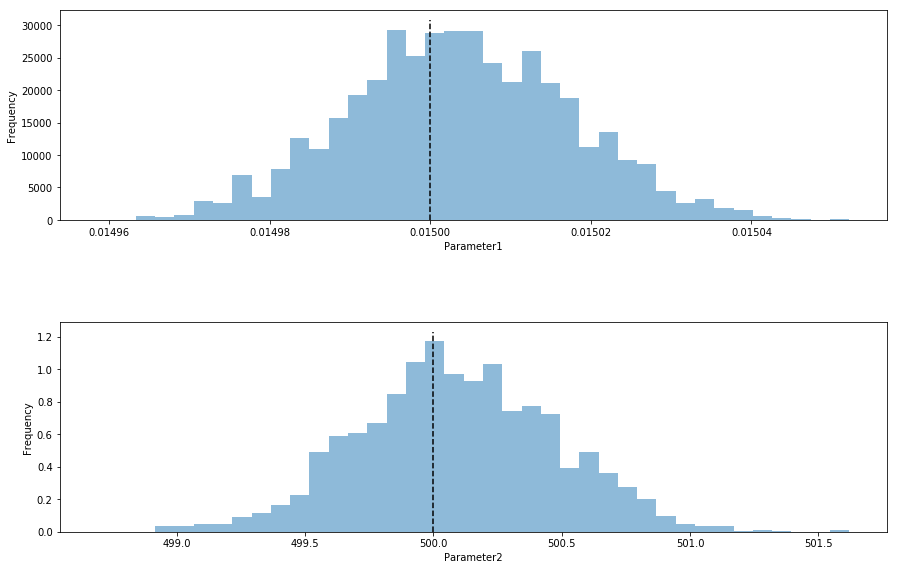

In [20]:
fig, axes = pints.plot.histogram([chain], ref_parameters=true_parameters)

# Show where the sample standard deviation of the generated noise is:
noise_sample_std = np.std(values - org_values)
#axes[-1].axvline(noise_sample_std, color='orange', label='Sample standard deviation of noise')
#axes[-1].legend()

fig.set_size_inches(14, 9)
plt.show()

Here we've analysed each parameter in isolation, but we can also look at correlations between parameters we found using the [pairwise()](http://pints.readthedocs.io/en/latest/diagnostic_plots.html#pints.plot.pairwise) plot.

To speed things up, we'll first apply some _thinning_ to the chain:

In [21]:
thinned_chain = chain[::10]

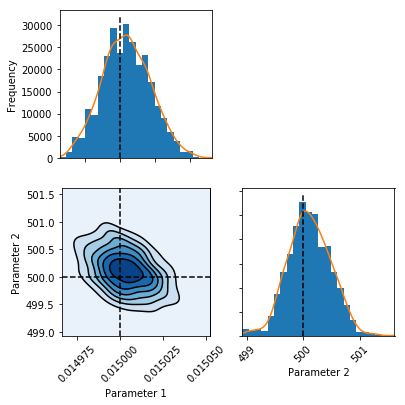

In [22]:
pints.plot.pairwise(thinned_chain, kde=True, ref_parameters=true_parameters)
plt.show()

Finally, we can look at the bit that really matters: The model predictions made from models with the parameters we found (a _posterior predictive check_). Thes can be plotted using the [series()](http://pints.readthedocs.io/en/latest/diagnostic_plots.html#pints.plot.series) method.

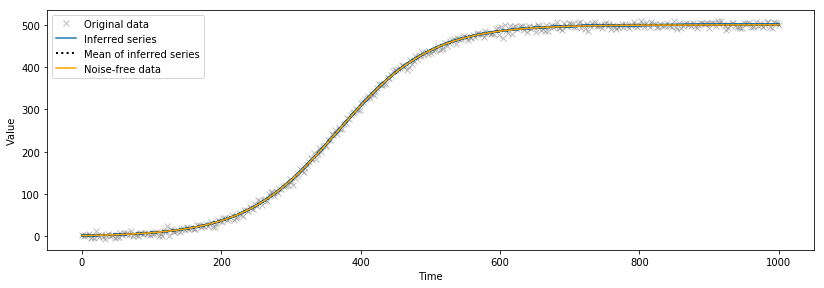

In [24]:
fig, axes = pints.plot.series(chain, problem)

# Customise the plot, and add the original, noise-free data
fig.set_size_inches(12,4.5)
plt.plot(times, org_values, c='orange', label='Noise-free data')
plt.legend()
plt.show()

-1296.5667314356012
[1.48498762e-02 4.99911498e+02]
-1219.2507835822366


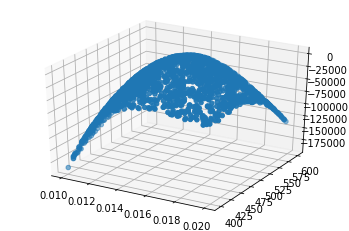

In [25]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 

input_parameters = log_prior.sample(2000)
xs = [p[0] for p in input_parameters]
ys = [p[1] for p in input_parameters]
input_parameters[:5]

likelihoods = np.apply_along_axis(log_likelihood, 1, input_parameters)
likelihoods[:5]

print(max(likelihoods))
idx = list(likelihoods).index(max(likelihoods))
print(input_parameters[idx])
print(log_likelihood([0.015, 500]))

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs, ys, list(likelihoods))
plt.show()

In [26]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split

X_train, X_valid, y_train, y_valid = train_test_split(input_parameters, likelihoods, test_size=0.3, random_state=0)

emu = pints.MultiLayerNN(log_likelihood, X_train, y_train, 
                          input_scaler=MinMaxScaler(), output_scaler=StandardScaler())
#emu.set_parameters(layers=6, neurons=64, hidden_activation='relu', activation='tanh', learning_rate=0.00001)
emu.set_parameters(layers=6, neurons=64, hidden_activation='relu', activation='linear', learning_rate=0.0001)
hist = emu.fit(epochs=1000, batch_size=32, X_val=X_valid, y_val=y_valid, verbose=0)
#emu.summary()

In [27]:
emu([0.015, 500])

array([[-1325.2368]], dtype=float32)

In [28]:
log_likelihood([0.015, 500])

-1219.2507835822366

dict_keys(['val_loss', 'val_mean_absolute_error', 'loss', 'mean_absolute_error'])


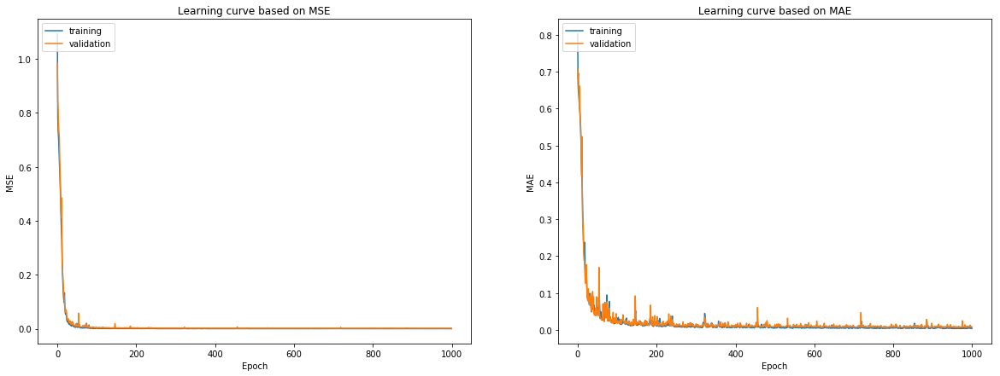

In [53]:
# summarize history for loss
print(hist.history.keys())
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))                 
ax1.title.set_text('Learning curve based on MSE')
ax2.title.set_text('Learning curve based on MAE')

ax1.plot(hist.history['loss'])
ax1.plot(hist.history['val_loss'])
ax1.set_ylabel('MSE')
ax1.set_xlabel('Epoch')
ax1.legend(['training', 'validation'], loc='upper left')

ax2.plot(hist.history['mean_absolute_error'])
ax2.plot(hist.history['val_mean_absolute_error'])
ax2.set_ylabel('MAE')
ax2.set_xlabel('Epoch')
ax2.legend(['training', 'validation'], loc='upper left')

plt.show()

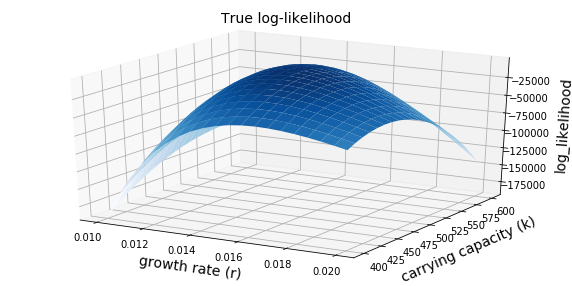

In [31]:
test_splits = 20 # number of splits along each axis
r_grid, k_grid, test_data = pints.generate_grid(bounds.lower(), bounds.upper(), test_splits)
model_prediction = pints.predict_grid(log_likelihood, test_data)

plt.figure(figsize = (10, 5))
ax = pints.plot.surface(r_grid, k_grid, model_prediction, title = "True log-likelihood",
                     x_label = "growth rate (r)",
                     y_label = "carrying capacity (k)")

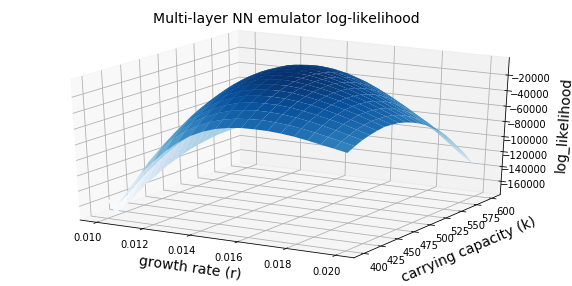

In [32]:
emu_prediction = pints.predict_grid(emu, test_data)

plt.figure(figsize = (10, 5))
ax = pints.plot.surface(r_grid, k_grid, emu_prediction, title = "Multi-layer NN emulator log-likelihood",
                        x_label = "growth rate (r)",
                        y_label = "carrying capacity (k)")

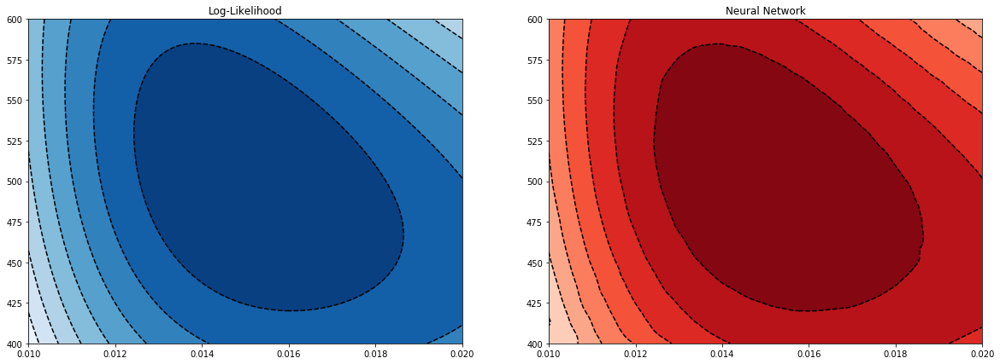

In [81]:
# Create grid
test_splits = 100 # number of splits along each axis
xx, yy, test_data = pints.generate_grid(bounds.lower(), bounds.upper(), test_splits)
params = [list(n) for n in zip(xx, yy)]
ll = np.apply_along_axis(log_likelihood, 1, params)
ll_emu = np.apply_along_axis(emu, 1, params)
ll_emu = [list(e[0][0]) for e in ll_emu]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
ax1.title.set_text('Log-Likelihood')
ax2.title.set_text('Neural Network')
ax1.contourf(xx, yy, ll, cmap='Blues', extent=[xmin, xmax, ymin, ymax])
ax1.contour(xx, yy, ll, colors='k')
ax2.contourf(xx, yy, ll_emu, cmap='Reds', extent=[xmin, xmax, ymin, ymax])
ax2.contour(xx, yy, ll_emu, colors='k')
plt.show()

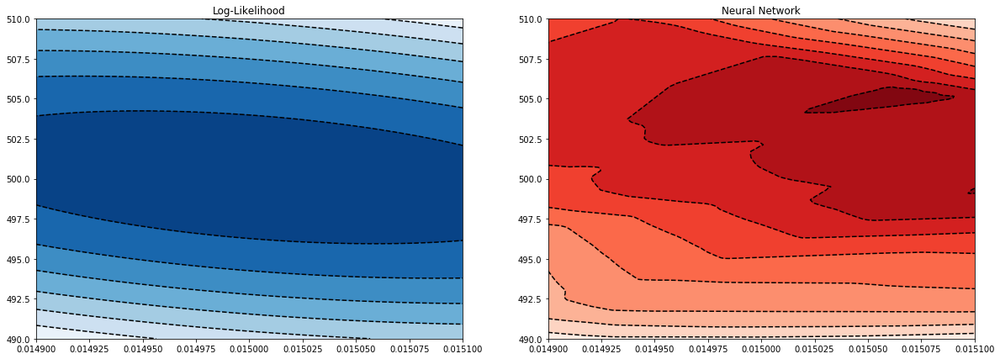

In [79]:
# Create grid
test_splits = 100 # number of splits along each axis
xx, yy, test_data = pints.generate_grid([0.0149, 490], [0.0151, 510], test_splits)
xmin, xmax = 0.0149, 0.0151
ymin, ymax = 490, 510
params = [list(n) for n in zip(xx, yy)]
ll = np.apply_along_axis(log_likelihood, 1, params)
ll_emu = np.apply_along_axis(emu, 1, params)
ll_emu = [list(e[0][0]) for e in ll_emu]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
ax1.title.set_text('Log-Likelihood')
ax2.title.set_text('Neural Network')
ax1.contourf(xx, yy, ll, cmap='Blues', extent=[xmin, xmax, ymin, ymax])
ax1.contour(xx, yy, ll, colors='k')
ax2.contourf(xx, yy, ll_emu, cmap='Reds', extent=[xmin, xmax, ymin, ymax])
ax2.contour(xx, yy, ll_emu, colors='k')
plt.show()

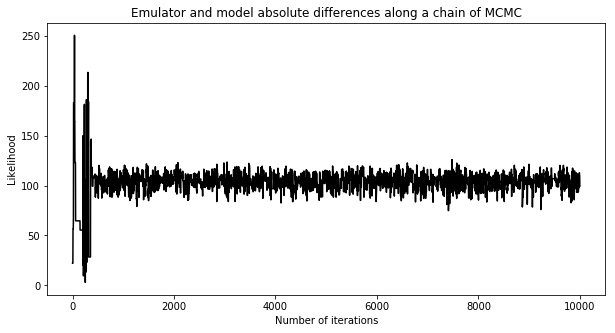

99.26811218863372

In [33]:
chain = chains[0]
emu_prediction = np.apply_along_axis(emu, 1, chain).flatten()
model_prediction = np.apply_along_axis(log_likelihood, 1, chain).flatten()
diffs = np.abs(model_prediction - emu_prediction)

iters = np.linspace(0, 10000, len(chain))
plt.figure(figsize=(10, 5))
plt.title("Emulator and model absolute differences along a chain of MCMC")
plt.xlabel("Number of iterations")
plt.ylabel("Likelihood")
plt.plot(iters, diffs, color = "Black")
plt.show()

diffs[-1]

In [34]:
log_posterior_emu = pints.LogPosterior(emu, log_prior)
xs = [
    np.array(true_parameters) * 0.9,
    np.array(true_parameters) * 1.05,
    np.array(true_parameters) * 1.15,
]

Running...
[1.25286723e-02 4.50804433e+02]
-43487.67937051435


[3.38629264e-02 5.25554018e+02]
-inf


[2.17895066e-02 5.79010788e+02]
-inf


[2.49697418e-02 4.48492957e+02]
-inf


[5.72720967e-03 5.29215716e+02]
-inf


[1.86149770e-02 5.78009991e+02]
-82723.44886613516


[2.59437537e-03 4.49448448e+02]
-inf


[1.03734191e-02 5.28203808e+02]
-100614.11235579987


[2.52197244e-02 5.71475592e+02]
-inf


[8.16621124e-03 4.51602926e+02]
-inf


[3.21849488e-03 5.25695875e+02]
-inf


[1.11713024e-02 5.76055381e+02]
-63638.89610937226


[-4.26849238e-04  4.48907554e+02]
-inf


[7.71277254e-03 5.22516808e+02]
-inf


[-1.50599720e-02  5.74310003e+02]
-inf


[2.19799463e-02 4.50698065e+02]
-inf


[2.95160761e-02 5.27580190e+02]
-inf


[1.01026505e-02 5.75956022e+02]
-111574.9145290379


[1.23456592e-02 4.47822278e+02]
-49894.157896217424


[1.15573531e-02 5.24507946e+02]
-49137.179075174776


[3.65704630e-03 5.74638522e+02]
-inf


[2.39561422e-02 4.51583503e+02]
-inf


[1.17343324e-02 5.25013478

[4.19179582e-02 5.75797679e+02]
-inf


[1.01401968e-02 4.47497051e+02]
-146546.91931749455


[5.52334705e-03 5.26125544e+02]
-inf


[5.83780716e-03 5.72574990e+02]
-inf


[2.41583081e-02 4.49341549e+02]
-inf


[-7.32750055e-04  5.23229386e+02]
-inf


[1.25983126e-02 5.74543058e+02]
-29075.768925752527


[1.44928421e-02 4.48743746e+02]
-14739.32033551746


[6.47405758e-03 5.24099857e+02]
-inf


[1.90710871e-02 5.74848621e+02]
-88951.4467876544


[1.69755100e-02 4.49643671e+02]
-14120.96073432156


[2.02807972e-03 5.29304678e+02]
-inf


[4.00979558e-03 5.76564712e+02]
-inf


[2.32082114e-02 4.48941616e+02]
-inf


[2.18365541e-02 5.23477481e+02]
-inf


[-4.92162707e-03  5.74677013e+02]
-inf


[1.11990220e-02 4.48118288e+02]
-89936.01934622435


[2.25957180e-02 5.27159332e+02]
-inf


[3.51648308e-02 5.71322295e+02]
-inf


[1.54386886e-02 4.47502264e+02]
-11489.72790012171


[1.97634466e-02 5.26478149e+02]
-59989.77629930266


[-3.63637564e-04  5.73812967e+02]
-inf


[1.01942802e-02 4.49990



[1.29481322e-02 5.69100170e+02]
-22961.87898953591


[1.24653903e-02 4.53051712e+02]
-43906.103915619344


[1.08658973e-02 5.30563629e+02]
-75618.16584502779


[3.20710542e-02 5.67816170e+02]
-inf


[2.42381479e-02 4.49226399e+02]
-inf


[2.71306583e-02 5.27260549e+02]
-inf


[1.67035036e-02 5.62641553e+02]
-35102.703379744875


[-3.44084638e-03  4.53096752e+02]
-inf


[1.51256129e-02 5.27195375e+02]
-4547.925380868844


[-3.18115752e-03  5.69691297e+02]
-inf


[1.75932454e-02 4.50364650e+02]
-17707.448118685756


[3.37294478e-02 5.24302989e+02]
-inf


[1.46585355e-02 5.68458110e+02]
-18193.47220547952


[5.30317000e-03 4.52086078e+02]
-inf


[7.50798823e-03 5.22985439e+02]
-inf


[1.30510050e-02 5.66490198e+02]
-21063.23399800067


[2.53296476e-02 4.46165816e+02]
-inf


[1.57753388e-02 5.23817312e+02]
-6862.4120602203675


[1.04182682e-02 5.65344537e+02]
-94777.58847277962


[1.52143858e-03 4.54237519e+02]
-inf


[1.8366279e-02 5.2441408e+02]
-36409.68879144191


[5.74384287e-03 5.6

accepted


[1.56444422e-02 4.55877681e+02]
-8329.371743900936


[1.47135290e-02 5.23871372e+02]
-3185.824653486916
accepted


[1.37702868e-02 5.58236395e+02]
-13484.403542003964


[1.54817958e-02 4.56117356e+02]
-8271.315703088167
accepted


[1.48651711e-02 5.23915489e+02]
-3299.8034337135114


[1.39841380e-02 5.58167152e+02]
-12845.11991870749


[1.56806898e-02 4.56094182e+02]
-8273.636995975728


[1.47275103e-02 5.23889898e+02]
-3192.1955139831634


[1.39813694e-02 5.58554147e+02]
-12989.194516265503


[1.54422862e-02 4.56272382e+02]
-8244.833381215529
accepted


[1.47811359e-02 5.23890173e+02]
-3217.2278794193726


[1.40310496e-02 5.58448041e+02]
-12864.808796959822


[1.54103888e-02 4.56269739e+02]
-8271.665420727917


[1.46600842e-02 5.23866142e+02]
-3184.91841317897
accepted


[1.42603691e-02 5.58793606e+02]
-12865.84316401823


[1.54497373e-02 4.56354990e+02]
-8212.17478293996
accepted


[1.47002203e-02 5.23907175e+02]
-3189.869484525215


[1.42220780e-02 5.58831787e+02]
-12872.

[1.45119986e-02 4.79853404e+02]
-4453.847019093339
accepted


[1.46820733e-02 5.23559266e+02]
-3132.8471456207662
accepted


[1.40284978e-02 5.15408760e+02]
-4182.937599132678


[1.44968617e-02 4.81955013e+02]
-4120.114034609944
accepted


[1.47166052e-02 5.23638776e+02]
-3147.941794062738


[1.39783512e-02 4.92927340e+02]
-5642.443624602875


[1.48895327e-02 4.72192565e+02]
-4688.863160615617


[1.47043150e-02 5.23543826e+02]
-3130.704392084146
accepted


[1.39272134e-02 4.89119418e+02]
-6656.930012381489


[1.44453126e-02 4.85994495e+02]
-3676.9068114545134
accepted


[1.47345423e-02 5.23463855e+02]
-3123.4165082976797
accepted


[1.40531270e-02 5.23489277e+02]
-4621.655520299491


[1.43945922e-02 4.85187153e+02]
-4066.0500944056785


[1.47666024e-02 5.23509687e+02]
-3143.970744273707


[1.40527351e-02 5.22563482e+02]
-4532.069147680113


[1.43315909e-02 4.85297284e+02]
-4396.085730870731


[1.47449728e-02 5.23240409e+02]
-3089.9871401391547
accepted


[1.40907399e-02 5.25564324e+02]

[1.49555597e-02 5.01634809e+02]
-1230.7774005700446


[1.55061018e-02 5.07968061e+02]
-2559.3981470704166


[1.47207048e-02 5.02854368e+02]
-1443.37131199899


[1.50133629e-02 5.00546681e+02]
-1221.36878995857
accepted


[1.52461258e-02 5.13566971e+02]
-2420.5964018177046


[1.53641234e-02 4.97099789e+02]
-1557.4655888452578


[1.50534706e-02 5.05586102e+02]
-1373.9367552212818


[1.55539275e-02 5.06393904e+02]
-2570.6634913133958


[1.48777325e-02 4.98423429e+02]
-1298.5333093722854


[1.50121321e-02 5.01279913e+02]
-1226.7322603229475


[1.54064926e-02 5.09605514e+02]
-2403.0222745419683


[1.54592370e-02 4.92757029e+02]
-1783.1189350269576


[1.49696970e-02 4.94865751e+02]
-1349.0895285838826


[1.54354820e-02 5.06154486e+02]
-2148.891026571831
accepted


[1.46299381e-02 5.05725446e+02]
-1626.3579328601675


[1.50963497e-02 5.00761123e+02]
-1253.3404772164793


[1.53031972e-02 5.08444012e+02]
-1989.0448496110869
accepted


[1.45086867e-02 5.13742551e+02]
-2207.9073397177863


[1.490


[1.49629865e-02 5.01797141e+02]
-1231.2628181933285


[1.50226628e-02 4.99726002e+02]
-1220.8979016809224
accepted


[1.50098151e-02 4.97244110e+02]
-1251.4164031021567


[1.51461492e-02 4.98384712e+02]
-1273.8078452110367


[1.50803086e-02 5.01740551e+02]
-1259.6860229939095


[1.50567360e-02 5.07593046e+02]
-1492.0093868634397


[1.50621329e-02 5.00668532e+02]
-1234.5909829012153


[1.50518795e-02 5.00711009e+02]
-1231.1040139284223


[1.50349180e-02 5.01423259e+02]
-1233.6347576636708


[1.48983344e-02 5.02397173e+02]
-1256.522644945204


[1.4978019e-02 4.9787204e+02]
-1246.558076252052


[1.51104367e-02 4.97838724e+02]
-1255.6471379882275


[1.49584646e-02 4.99436564e+02]
-1230.4310058239748


[1.50401018e-02 4.98744919e+02]
-1227.1981152681174


[1.51022101e-02 5.01889122e+02]
-1277.8154072060372


[1.50277345e-02 5.00421087e+02]
-1222.7482099861488


[1.50137031e-02 4.99301137e+02]
-1221.990588056721
accepted


[1.51349513e-02 5.02278175e+02]
-1316.4045774734577


[1.51222384e-0

[1.50533328e-02 5.00084979e+02]
-1227.4305854025756


[1.49880056e-02 5.00301932e+02]
-1220.5426492197805


[1.49934140e-02 5.00767169e+02]
-1221.5102825284196


[1.50224356e-02 4.98855302e+02]
-1225.1635562619333


[1.50505502e-02 4.99387102e+02]
-1225.874366353152


[1.49882641e-02 5.00367918e+02]
-1220.572890372637
accepted


[1.50383625e-02 5.00643288e+02]
-1226.4228819140171


[1.50097525e-02 4.99931275e+02]
-1219.9673574205892
accepted


[1.49753200e-02 5.00153543e+02]
-1222.2522405682232
accepted


[1.49876765e-02 4.99025214e+02]
-1226.6310496523784


[1.49941198e-02 5.00520795e+02]
-1220.5747483006437


[1.49688554e-02 4.99779724e+02]
-1224.9361188567862


[1.49971489e-02 4.97533966e+02]
-1247.8755832373654


[1.50084691e-02 5.00574319e+02]
-1221.0854351444048
accepted


[1.49882746e-02 5.00340450e+02]
-1220.5465307446782
accepted


[1.49801835e-02 4.98656064e+02]
-1232.6778311472708


[1.49864487e-02 5.00748934e+02]
-1221.6492209328874


[1.50066098e-02 5.00984905e+02]
-1223.3

[1.50251683e-02 5.00111377e+02]
-1221.302959596155
accepted


[1.5033784e-02 5.0010718e+02]
-1222.6803807988008


[1.50449676e-02 5.00087900e+02]
-1225.095076753894


[1.49955976e-02 5.00729540e+02]
-1221.3271852688438
accepted


[1.50408146e-02 5.00015930e+02]
-1223.8867029549108


[1.50063132e-02 4.99816668e+02]
-1220.0930076659586
accepted


[1.49825334e-02 5.00398777e+02]
-1221.122306168653
accepted


[1.50075591e-02 5.00279823e+02]
-1220.1047946631952
accepted


[1.50248181e-02 5.00157077e+02]
-1221.3552144635569


[1.49693334e-02 5.00699369e+02]
-1223.3748717051214


[1.50154327e-02 5.00366966e+02]
-1220.8609411888135


[1.50253065e-02 4.99380239e+02]
-1222.0281272432449


[1.49544419e-02 5.00661019e+02]
-1226.5117552394797


[1.49910049e-02 5.00471029e+02]
-1220.5673636247302


[1.50100898e-02 5.00364406e+02]
-1220.4332714182362
accepted


[1.49624171e-02 5.00249362e+02]
-1224.776049280519


[1.50127093e-02 5.00572732e+02]
-1221.4272306329176


[1.50117733e-02 5.00376777e+02]
-1

[1.50344295e-02 5.00203392e+02]
-1223.1043204729156


[1.50283490e-02 4.99216389e+02]
-1223.0008001718477


[1.49766531e-02 5.00972152e+02]
-1223.392263764644


[1.49745877e-02 4.99862472e+02]
-1223.2603818909904


[1.50167444e-02 5.00174522e+02]
-1220.4888140736555


[1.49689573e-02 5.00920270e+02]
-1224.109222585544


[1.50079025e-02 4.99610523e+02]
-1220.6397958381594
accepted


[1.50197919e-02 4.99526220e+02]
-1221.1529231538402
accepted


[1.50113143e-02 5.00254612e+02]
-1220.2417029929318
accepted


[1.50156137e-02 4.99672398e+02]
-1220.5533686671274
accepted


[1.50249481e-02 4.99286068e+02]
-1222.4129265056397


[1.50245982e-02 5.00826701e+02]
-1224.7194141194489


[1.50418301e-02 4.99422764e+02]
-1224.0069875035852


[1.50375592e-02 4.99717555e+02]
-1222.8831823025098


[1.49991284e-02 4.99711657e+02]
-1220.617532980554
accepted


[1.50266040e-02 4.99511112e+02]
-1221.6971951994335
accepted


[1.50294487e-02 4.99385107e+02]
-1222.3739603779832
accepted


[1.49860870e-02 4.9958

[1.50077161e-02 4.99503289e+02]
-1221.0674800210816
accepted


[1.50099987e-02 4.99077593e+02]
-1223.5610703149716


[1.50122699e-02 4.99894605e+02]
-1220.0720994811966
accepted


[1.49669829e-02 5.00063069e+02]
-1224.1713148720698


[1.49463689e-02 5.00591175e+02]
-1228.863568758547


[1.49956420e-02 4.99775415e+02]
-1220.6473400258408
accepted


[1.49888384e-02 4.99921267e+02]
-1220.8575078386973
accepted


[1.50138259e-02 4.99264570e+02]
-1222.1984575039073


[1.49780245e-02 5.01139731e+02]
-1224.2367832764842


[1.49943617e-02 4.99791820e+02]
-1220.6983314683998
accepted


[1.49922715e-02 5.00412762e+02]
-1220.3957798184629
accepted


[1.49977720e-02 4.99672022e+02]
-1220.8513494541128
accepted


[1.50164644e-02 4.99013431e+02]
-1223.8753108053588


[1.49714124e-02 5.01149720e+02]
-1224.9256679421537


[1.49903418e-02 4.98909076e+02]
-1227.3355978602829


[1.49718802e-02 5.00181025e+02]
-1222.8316437553492


[1.50159317e-02 4.99403928e+02]
-1221.4888132153062


[1.50022129e-02 4.99

[1.49587554e-02 5.00403733e+02]
-1225.4529363037175


[1.49718012e-02 5.00773509e+02]
-1223.1838569928402


[1.50064063e-02 4.99323602e+02]
-1222.046362155286
accepted


[1.49904481e-02 4.99667419e+02]
-1221.5688652086287
accepted


[1.49804121e-02 5.00320707e+02]
-1221.3392164472868


[1.49801685e-02 4.99035294e+02]
-1228.1185614830858


[1.49896996e-02 4.99375510e+02]
-1223.334534304494


[1.49974082e-02 4.99478158e+02]
-1221.782526340056


[1.50353238e-02 4.99048693e+02]
-1224.5742317656704


[1.49912348e-02 4.99309477e+02]
-1223.5828655703283


[1.50114930e-02 4.99368046e+02]
-1221.6480921442935


[1.50136806e-02 4.98918227e+02]
-1224.717583919756


[1.50047242e-02 4.98872172e+02]
-1225.7259884471994


[1.49741847e-02 4.99619621e+02]
-1224.6123067514134


[1.49782320e-02 4.99515344e+02]
-1224.4134057292288


[1.49630421e-02 4.99901641e+02]
-1225.81475492382


[1.49788445e-02 5.00609711e+02]
-1221.851265577309


[1.49980302e-02 4.99995519e+02]
-1220.0228117301579
accepted


[1.49693



[1.50645108e-02 4.98381913e+02]
-1234.4972027688138


[1.49894591e-02 5.01835061e+02]
-1230.9338430787243


[1.50138479e-02 4.99178090e+02]
-1222.734169782543


[1.50149991e-02 4.99120604e+02]
-1223.1079796383112


[1.50049816e-02 4.99581873e+02]
-1220.8185777360204
accepted


[1.50207723e-02 5.00678989e+02]
-1223.0199091845961


[1.50252181e-02 4.99335318e+02]
-1222.2076615649457


[1.49996218e-02 4.99840667e+02]
-1220.2217200407279
accepted


[1.50179064e-02 4.99418123e+02]
-1221.476635665851


[1.50125992e-02 5.00578468e+02]
-1221.4440290419982
accepted


[1.50028881e-02 5.00105614e+02]
-1219.8464013888427
accepted


[1.50292396e-02 4.99965778e+02]
-1221.6470194998333


[1.50344860e-02 5.00637922e+02]
-1225.4221152983112


[1.50135667e-02 4.98923590e+02]
-1224.67513541457


[1.50476759e-02 4.98979558e+02]
-1226.7494158378074


[1.49955560e-02 5.00975845e+02]
-1222.706180139409


[1.50548199e-02 5.00395468e+02]
-1229.6070900478865


[1.50498427e-02 4.99301523e+02]
-1225.90227348096

accepted


[1.49913640e-02 4.98938717e+02]
-1226.8427410981683


[1.49407088e-02 5.01192342e+02]
-1231.594990682436


[1.49999541e-02 5.00102278e+02]
-1219.886861473972
accepted


[1.49824787e-02 4.99629919e+02]
-1222.910423171856


[1.49659105e-02 5.00362335e+02]
-1223.8046477275261


[1.50105592e-02 4.99330003e+02]
-1221.8682494719353


[1.49632389e-02 4.99071535e+02]
-1232.572349224666


[1.49644644e-02 4.99632930e+02]
-1226.9986431373188


[1.49908296e-02 5.00083770e+02]
-1220.3756693506264
accepted


[1.50282505e-02 5.00438338e+02]
-1222.9238132464727


[1.49430499e-02 5.00263559e+02]
-1230.6868315532975


[1.49109602e-02 5.00836004e+02]
-1243.557867199663


[1.49823306e-02 4.99690945e+02]
-1222.6176794249932
accepted


[1.50328739e-02 5.00066538e+02]
-1222.4128767175023


[1.49672862e-02 4.99357380e+02]
-1228.370460014221


[1.49161358e-02 4.99034156e+02]
-1256.1321921665476


[1.49484268e-02 5.01451324e+02]
-1230.8471088837678


[1.50712720e-02 4.99543408e+02]
-1232.067285731231

[1.50258804e-02 5.00781488e+02]
-1224.6193920529283


[1.50035564e-02 5.00744371e+02]
-1221.6178409144943
accepted


[1.50044290e-02 5.00348084e+02]
-1220.1455966063957
accepted


[1.49912411e-02 5.00364426e+02]
-1220.3753831004767


[1.49695439e-02 5.01161971e+02]
-1225.2241698733685


[1.49803744e-02 5.00192743e+02]
-1221.4102005370498


[1.49838327e-02 5.00968479e+02]
-1222.8379030131082
accepted


[1.49831173e-02 5.00801572e+02]
-1222.0708462969185
accepted


[1.50633729e-02 5.00824519e+02]
-1236.7209085408358


[1.49820586e-02 5.00941341e+02]
-1222.7961287638225
accepted


[1.49797064e-02 4.98973661e+02]
-1228.8920033407173


[1.49860202e-02 5.00674738e+02]
-1221.4014405789567


[1.49780414e-02 5.00459114e+02]
-1221.7105952005948
accepted


[1.49514331e-02 5.01455409e+02]
-1230.1959685643187


[1.50044829e-02 5.01836452e+02]
-1232.492640910726


[1.49590897e-02 5.00113522e+02]
-1226.0242405512824


[1.49973767e-02 5.00495827e+02]
-1220.4535660276151
accepted


[1.49995470e-02 5.01



[1.50318707e-02 4.98549458e+02]
-1228.3072541118438


[1.50005511e-02 4.99791560e+02]
-1220.3007487600244
accepted


[1.50258263e-02 4.99635795e+02]
-1221.3355042398277
accepted


[1.49988288e-02 4.99591710e+02]
-1221.1065398824624
accepted


[1.50181255e-02 4.99600938e+02]
-1220.8458539779056


[1.49938871e-02 4.99353659e+02]
-1222.9187406545175
accepted


[1.50166583e-02 4.99525275e+02]
-1221.021349292408
accepted


[1.49834863e-02 5.00378010e+02]
-1221.005777619408


[1.49675555e-02 4.99747299e+02]
-1225.4410063486714


[1.49731470e-02 5.00542823e+02]
-1222.499079612798


[1.50196673e-02 5.00792428e+02]
-1223.6074175962015


[1.49981360e-02 4.99757286e+02]
-1220.529855312404
accepted


[1.50200634e-02 5.00676148e+02]
-1222.8943986651136


[1.50040374e-02 4.99802839e+02]
-1220.1556271206753
accepted


[1.50178184e-02 4.98136000e+02]
-1233.6508708433155


[1.50136987e-02 5.00200259e+02]
-1220.294349938782
accepted


[1.49881462e-02 5.01024904e+02]
-1223.0188523094348


[1.49468326e-

[1.50025504e-02 5.00878339e+02]
-1222.3508264613426
accepted


[1.49961089e-02 5.01072440e+02]
-1223.399559298222


[1.49746578e-02 5.00274039e+02]
-1222.2068080540432


[1.50461511e-02 5.01132931e+02]
-1233.582201676875


[1.49758327e-02 4.99987068e+02]
-1222.5657547251324


[1.50069521e-02 4.99617508e+02]
-1220.6312121406677
accepted


[1.49996759e-02 5.01952643e+02]
-1233.5233439751344


[1.49872135e-02 5.01124044e+02]
-1223.7060713303545


[1.50519347e-02 4.99487828e+02]
-1226.0709754667532


[1.49868696e-02 5.01629345e+02]
-1228.3341687053278


[1.49807777e-02 4.99533812e+02]
-1223.786171338908


[1.50122068e-02 4.99989251e+02]
-1220.0273213838934
accepted


[1.49386990e-02 5.00709436e+02]
-1231.413138121245


[1.49706162e-02 5.00055543e+02]
-1223.3877944418562


[1.50340509e-02 5.00546270e+02]
-1224.708490523303


[1.50384014e-02 5.01173060e+02]
-1231.5279191075049


[1.50010208e-02 5.00617665e+02]
-1220.9146963407456
accepted


[1.50018720e-02 5.00889778e+02]
-1222.3862029934178

[1.49873026e-02 5.01312769e+02]
-1225.1940540640408


[1.50010073e-02 5.00153704e+02]
-1219.8733354251674
accepted


[1.50202656e-02 4.97834102e+02]
-1238.2487409150497


[1.50174162e-02 4.99424604e+02]
-1221.433965425577


[1.50429739e-02 4.98444919e+02]
-1230.2256559077307


[1.50107440e-02 4.98903094e+02]
-1224.9841366582916


[1.50229130e-02 5.01213962e+02]
-1227.9868139041073


[1.49848831e-02 5.00539269e+02]
-1221.1097281470195
accepted


[1.50882074e-02 4.98796053e+02]
-1239.5840136626703


[1.50223109e-02 5.00449903e+02]
-1222.0114624152056


[1.49743739e-02 5.00637955e+02]
-1222.4761405085108


[1.50426156e-02 4.98729751e+02]
-1227.6219617774082


[1.50168733e-02 4.99463903e+02]
-1221.256643346027


[1.49640371e-02 5.00005738e+02]
-1225.0964954183778


[1.50027971e-02 4.99092264e+02]
-1223.9266474473902
accepted


[1.49798765e-02 5.00854701e+02]
-1222.54983044937


[1.49388457e-02 5.01649130e+02]
-1234.6912015316293


[1.4949068e-02 5.0067654e+02]
-1228.0198484891944


[1.5030



[1.50040542e-02 4.99086545e+02]
-1223.8662336484088


[1.50657418e-02 4.98585809e+02]
-1233.1684805612622


[1.49998466e-02 5.01955165e+02]
-1233.5831555294774


[1.50088590e-02 5.00912264e+02]
-1223.0772408994633


[1.49846710e-02 5.01058863e+02]
-1223.3392539409597


[1.49719562e-02 5.00843024e+02]
-1223.3893940403427


[1.50330864e-02 4.99718165e+02]
-1222.1460949426537


[1.49971680e-02 5.00299257e+02]
-1220.057591080708
accepted


[1.49671289e-02 5.01710293e+02]
-1229.9252334208586


[1.50134011e-02 5.00632213e+02]
-1221.7945990532064
accepted


[1.49910763e-02 5.00373051e+02]
-1220.395723847717
accepted


[1.49915906e-02 5.00893149e+02]
-1222.1774294776608


[1.50132467e-02 5.00116665e+02]
-1220.1456147172617
accepted


[1.49944525e-02 4.99711806e+02]
-1220.968268903248
accepted


[1.49829130e-02 5.01003039e+02]
-1223.0831372148843


[1.49899473e-02 4.99560503e+02]
-1222.1597309777244


[1.50587627e-02 4.98359600e+02]
-1233.4646151123


[1.50196425e-02 4.99413134e+02]
-1221.562

[1.50250762e-02 4.99417485e+02]
-1221.8687782310728


[1.50075452e-02 4.97949026e+02]
-1237.7928497006744


[1.49932758e-02 5.00973199e+02]
-1222.6554485518855


[1.49961736e-02 5.00382449e+02]
-1220.2075980151096
accepted


[1.49410782e-02 5.01743999e+02]
-1234.8350054876146


[1.49865532e-02 5.00995276e+02]
-1222.8775374911695


[1.50225437e-02 5.01547495e+02]
-1231.9626419271297


[1.49792731e-02 4.99699888e+02]
-1223.112430044923


[1.49523737e-02 5.01295332e+02]
-1228.993073527325


[1.50270920e-02 4.99046264e+02]
-1223.8982726673196


[1.49667765e-02 5.01008796e+02]
-1224.8152644158358


[1.49266461e-02 5.02768518e+02]
-1250.7678434762395


[1.49771652e-02 5.00301737e+02]
-1221.792240395778


[1.50441540e-02 4.98895964e+02]
-1226.656849581415


[1.49788620e-02 5.00451695e+02]
-1221.598152427613


[1.49554125e-02 5.00083930e+02]
-1227.2067789104503


[1.49754560e-02 5.01570044e+02]
-1227.898671034215


[1.49729472e-02 5.00254309e+02]
-1222.523480499506


[1.49846809e-02 5.00464345

[1.49728058e-02 5.00702723e+02]
-1222.84591599389


[1.50478465e-02 4.99625173e+02]
-1225.019154099141


[1.50292186e-02 5.01951226e+02]
-1240.0348566561156


[1.50137430e-02 4.99513036e+02]
-1220.9970483136447


[1.49616512e-02 5.01503205e+02]
-1228.696279653558


[1.50479888e-02 5.00377846e+02]
-1227.3124392675666


[1.49578198e-02 5.01158033e+02]
-1227.1145590962444


[1.50146339e-02 5.00877619e+02]
-1223.4959510041244


[1.50348095e-02 5.00118061e+02]
-1222.9065632638467


[1.49487888e-02 5.01776165e+02]
-1233.3293255477217


[1.49639885e-02 5.01231352e+02]
-1226.4217034397188


[1.5010467e-02 4.9984230e+02]
-1220.078794421477
accepted


[1.49461067e-02 5.00639134e+02]
-1228.9266566528083


[1.50459238e-02 4.98256528e+02]
-1232.5783221226793


[1.50213408e-02 5.01607106e+02]
-1232.495320218144


[1.49775887e-02 5.00593215e+02]
-1221.9644507538067


[1.49943759e-02 4.99592449e+02]
-1221.4869091959274


[1.50275673e-02 4.99904795e+02]
-1221.3618491495808


[1.50000835e-02 5.01252224e

[1.49732928e-02 4.98731079e+02]
-1233.6220883350486


[1.49932467e-02 4.99612122e+02]
-1221.5097043716519


[1.49964234e-02 5.00142414e+02]
-1219.9958280445599
accepted


[1.50098408e-02 5.00745697e+02]
-1222.079887945428


[1.50121737e-02 4.99333689e+02]
-1221.822752918175


[1.50098646e-02 4.99665505e+02]
-1220.4522441307956


[1.49930042e-02 4.98925900e+02]
-1226.699437602146


[1.49591644e-02 5.01370008e+02]
-1228.1063768955496


[1.50422140e-02 4.99706823e+02]
-1223.7793239694327


[1.49986852e-02 4.99082131e+02]
-1224.4307667974324


[1.49703613e-02 5.00788416e+02]
-1223.4412433152506


[1.49813719e-02 5.00122524e+02]
-1221.3627092638233


[1.5029365e-02 5.0046231e+02]
-1223.2519662169398


[1.50242877e-02 5.00208543e+02]
-1221.4135019220134


[1.49986151e-02 4.99657370e+02]
-1220.848833897574
accepted


[1.50301647e-02 4.98578273e+02]
-1227.9413951579606


[1.50042137e-02 5.00116714e+02]
-1219.8489486311219
accepted


[1.49270981e-02 4.99980974e+02]
-1239.0670743780963


[1.5052

[1.50333641e-02 4.98935552e+02]
-1225.1024154093789


[1.50304178e-02 5.00742167e+02]
-1225.2610573433835


[1.50109701e-02 4.99216046e+02]
-1222.545261335075


[1.49632175e-02 5.00356710e+02]
-1224.4132029858429


[1.50688286e-02 4.98475891e+02]
-1234.7985206578398


[1.50032820e-02 5.00282191e+02]
-1219.9983984882654
accepted


[1.49866007e-02 5.00143226e+02]
-1220.7074217665966
accepted


[1.49551765e-02 5.01391113e+02]
-1228.9891336635778


[1.50582471e-02 4.99364261e+02]
-1227.8648694473816


[1.50163911e-02 4.99886979e+02]
-1220.2792565428333
accepted


[1.50344817e-02 5.00106506e+02]
-1222.8108657689272


[1.49891172e-02 5.00975801e+02]
-1222.694300123325


[1.49564411e-02 5.00085900e+02]
-1226.8891924465706


[1.50000804e-02 5.00079981e+02]
-1219.889246594562
accepted


[1.49617328e-02 4.99668983e+02]
-1227.5474779933818


[1.50137376e-02 4.99593876e+02]
-1220.7145592771801
accepted


[1.50051770e-02 5.00414721e+02]
-1220.3364469877395
accepted


[1.50313442e-02 4.98816062e+02]

-1223.6130865614834


[1.50089550e-02 5.01228189e+02]
-1225.7683146929376


[1.49772776e-02 5.00938909e+02]
-1223.1694853078075
accepted


[1.49935659e-02 5.00503419e+02]
-1220.5432908022676
accepted


[1.50110574e-02 4.99217768e+02]
-1222.5317477551564
accepted


[1.49652260e-02 5.00907566e+02]
-1224.6662424637623


[1.49484086e-02 5.02206095e+02]
-1238.1106083550958


[1.50091484e-02 5.00172326e+02]
-1220.0009799433071
accepted


[1.49768728e-02 5.02044519e+02]
-1233.4351914998651


[1.50158961e-02 4.99946341e+02]
-1220.2288233298266
accepted


[1.51110282e-02 5.00067667e+02]
-1255.1059542667576


[1.50134852e-02 5.00025315e+02]
-1220.0954383350077
accepted


[1.50141102e-02 5.00481757e+02]
-1221.1589256846312


[1.49709647e-02 5.00544627e+02]
-1222.8533817006846


[1.50449203e-02 5.00601458e+02]
-1227.9352737909046


[1.49942691e-02 4.99248987e+02]
-1223.6214543811122


[1.50176893e-02 5.00055231e+02]
-1220.40521591786
accepted


[1.49949621e-02 5.00835914e+02]
-1221.8570134855172



accepted


[1.50217801e-02 5.00525785e+02]
-1222.2997733924553
accepted


[1.50092939e-02 5.01304551e+02]
-1226.584040142024


[1.49832925e-02 5.00847303e+02]
-1222.2575085373262
accepted


[1.50061029e-02 5.02335751e+02]
-1240.9983451551993


[1.49690115e-02 4.99179579e+02]
-1229.570457592143


[1.50321435e-02 4.99678066e+02]
-1222.0381946841985
accepted


[1.50130890e-02 5.01814429e+02]
-1233.679933696301


[1.48962672e-02 5.00935897e+02]
-1251.7358694423826


[1.50761847e-02 4.99781581e+02]
-1234.5751887315432


[1.50042645e-02 5.00238030e+02]
-1219.948019877423
accepted


[1.50073114e-02 5.00376206e+02]
-1220.316618342078
accepted


[1.49963390e-02 5.00431939e+02]
-1220.3043678902154
accepted


[1.50427431e-02 4.99480026e+02]
-1224.0637998064178


[1.49845601e-02 5.00988986e+02]
-1222.918786804606


[1.50175727e-02 5.00247639e+02]
-1220.723732427614
accepted


[1.50414475e-02 4.99513267e+02]
-1223.7662767576765


[1.49993588e-02 4.99454512e+02]
-1221.7452694055528


[1.50923985e-02

[1.50666993e-02 4.95973574e+02]
-1279.7591559615933


[1.5010565e-02 4.9877902e+02]
-1226.1816222101336


[1.50255265e-02 5.00607441e+02]
-1223.367416772479


[1.50013245e-02 4.98895994e+02]
-1225.8466712903462


[1.50064295e-02 5.00610655e+02]
-1221.1164545514164


[1.50503058e-02 5.00080263e+02]
-1226.5139398091853


[1.49367466e-02 4.98957298e+02]
-1245.3852379363352


[1.50198039e-02 4.99060176e+02]
-1223.538738802513


[1.50381778e-02 4.99799909e+02]
-1223.0116444305015


[1.5033308e-02 4.9866105e+02]
-1227.3069374200738


[1.50141736e-02 5.00527540e+02]
-1221.3622407122036


[1.50207784e-02 4.98481336e+02]
-1228.942013231308


[1.49966780e-02 4.97757501e+02]
-1243.4194345276633


[1.50025231e-02 4.99567779e+02]
-1220.982653679159
accepted


[1.50549749e-02 4.98861046e+02]
-1228.8501478817948


[1.50117891e-02 4.98937273e+02]
-1224.6286163808813


[1.49792324e-02 5.00978583e+02]
-1223.196897355814


[1.49641083e-02 5.00224821e+02]
-1224.4177082679994


[1.50182171e-02 4.99580399e+

[1.50597490e-02 4.98777179e+02]
-1230.4243490534725


[1.49904978e-02 5.01962959e+02]
-1232.7474722879579


[1.50115068e-02 5.00688612e+02]
-1221.909543124468


[1.49740300e-02 4.97289033e+02]
-1261.3006465970027


[1.50205216e-02 4.98436782e+02]
-1229.4781932881197


[1.49899762e-02 5.01944726e+02]
-1232.4532493328113


[1.50078612e-02 4.99132160e+02]
-1223.2547671891882


[1.50138595e-02 4.98590688e+02]
-1227.989253747337


[1.49983265e-02 4.99957312e+02]
-1220.0603627833325
accepted


[1.49688554e-02 5.01631609e+02]
-1228.9798079153613


[1.49656668e-02 4.99221943e+02]
-1230.148829726294


[1.50062844e-02 5.00356164e+02]
-1220.2225925831879
accepted


[1.49794863e-02 5.00077783e+02]
-1221.7170668584317
accepted


[1.50161836e-02 4.97757649e+02]
-1239.990256823274


[1.50093518e-02 4.99413404e+02]
-1221.452592325296


[1.49546231e-02 5.01185552e+02]
-1227.9190516180934


[1.50182843e-02 4.99624723e+02]
-1220.7910226867662
accepted


[1.49662279e-02 5.02717598e+02]
-1244.3560397195365

[1.49808189e-02 4.99194990e+02]
-1226.4047278931675


[1.50385686e-02 4.99709997e+02]
-1223.0675215115805


[1.49933003e-02 5.01325948e+02]
-1225.4180796290373


[1.49970421e-02 5.00901518e+02]
-1222.268269405587


[1.49985262e-02 4.99349141e+02]
-1222.445116301816


[1.49899009e-02 4.98724241e+02]
-1229.5362953041968


[1.49643433e-02 5.01578677e+02]
-1228.9720881032881


[1.50849184e-02 4.98606884e+02]
-1239.1280983811396


[1.50048288e-02 5.00720023e+02]
-1221.5587632593802
accepted


[1.49679378e-02 5.00608704e+02]
-1223.4592018167627


[1.49857344e-02 5.01095249e+02]
-1223.5415031568969


[1.50356636e-02 5.00765392e+02]
-1226.6859661373603


[1.49993893e-02 4.99284329e+02]
-1222.7945056628594


[1.49964792e-02 4.98979037e+02]
-1225.6469253803205


[1.49998112e-02 5.00740866e+02]
-1221.4465767680877
accepted


[1.50345737e-02 5.01910354e+02]
-1241.0778935739609


[1.50641589e-02 5.00000936e+02]
-1230.7106655014186


[1.50055899e-02 4.99664490e+02]
-1220.5013947771322
accepted


[1.

[1.50218110e-02 5.00685641e+02]
-1223.2261409958599


[1.50263285e-02 5.01113700e+02]
-1227.6750643133555


[1.49830953e-02 5.00209566e+02]
-1221.044952552935


[1.50305941e-02 4.99673783e+02]
-1221.8305981666927


[1.49688408e-02 4.99817850e+02]
-1224.7413948392598


[1.49723891e-02 4.99893550e+02]
-1223.5869224042272


[1.49852029e-02 4.99554877e+02]
-1222.881637362074


[1.50091314e-02 4.99708341e+02]
-1220.3327426667895
accepted


[1.49454218e-02 5.00553449e+02]
-1229.2011768234051


[1.49753651e-02 5.00618254e+02]
-1222.3002209656079


[1.49752686e-02 4.99135630e+02]
-1228.2936063214165


[1.49956401e-02 5.00161827e+02]
-1220.028429558133
accepted


[1.50009214e-02 4.98975833e+02]
-1225.127453519028


[1.48946369e-02 4.98806043e+02]
-1275.5980184593661


[1.50197750e-02 4.99565362e+02]
-1221.0323613420026


[1.50614532e-02 4.99586834e+02]
-1228.741845083717


[1.49670543e-02 4.99748927e+02]
-1225.5605493649234


[1.50662331e-02 4.99850686e+02]
-1230.8966038123888


[1.49776390e-02



[1.49714171e-02 5.01148554e+02]
-1224.9181190875452


[1.50056147e-02 5.00912774e+02]
-1222.7900968610306


[1.50382150e-02 5.00477594e+02]
-1225.264443446499


[1.50645874e-02 5.01289857e+02]
-1243.3049414367288


[1.49735168e-02 4.99668438e+02]
-1224.4670550099079


[1.50213963e-02 5.00171680e+02]
-1220.956742820788
accepted


[1.49909321e-02 5.00936438e+02]
-1222.432849883532


[1.49491993e-02 5.00586976e+02]
-1227.9852953749707


[1.50894077e-02 4.99672990e+02]
-1240.2175405426262


[1.49403174e-02 5.01936221e+02]
-1236.7697717980602


[1.49902334e-02 5.00530941e+02]
-1220.743821068622
accepted


[1.50014517e-02 5.01039566e+02]
-1223.4128051009147


[1.49236545e-02 5.00701801e+02]
-1237.5439733090464


[1.49415313e-02 5.00709647e+02]
-1230.4224038831233


[1.50286768e-02 4.98996946e+02]
-1224.324324971029


[1.50098597e-02 4.99889217e+02]
-1220.0078763538804
accepted


[1.50303453e-02 4.99793284e+02]
-1221.7203597257442


[1.50338327e-02 4.99561282e+02]
-1222.437389495284


[1.49

[1.50080191e-02 4.99621323e+02]
-1220.6008593834256
accepted


[1.49886298e-02 4.99630359e+02]
-1221.972037133318


[1.50192449e-02 4.98432006e+02]
-1229.5828535326316


[1.50136556e-02 4.99517518e+02]
-1220.9787544365524
accepted


[1.49755439e-02 5.00518971e+02]
-1222.115167164754
accepted


[1.49919470e-02 4.98973327e+02]
-1226.39126534813


[1.49945584e-02 5.01338891e+02]
-1225.5915670942165


[1.49806292e-02 5.00732421e+02]
-1222.0124912794317
accepted


[1.50296224e-02 4.98316567e+02]
-1230.857709918479


[1.51057226e-02 4.96973540e+02]
-1265.192424181004


[1.50452077e-02 5.01342335e+02]
-1235.9520799753209


[1.50100607e-02 4.99177794e+02]
-1222.8295510926296


[1.5075506e-02 4.9845609e+02]
-1236.8689951525148


[1.49834308e-02 4.99016517e+02]
-1227.578711606112


[1.49973874e-02 4.99489197e+02]
-1221.7246529150661
accepted


[1.49874706e-02 4.99727355e+02]
-1221.6802537304131
accepted


[1.49492329e-02 5.00829117e+02]
-1228.1146338910569


[1.49674136e-02 4.99777833e+02]
-1225

[1.49818307e-02 5.00602735e+02]
-1221.5240372705064
accepted


[1.49834187e-02 4.99395434e+02]
-1224.2359697288794


[1.49994307e-02 4.99412886e+02]
-1221.9747751593222
accepted


[1.50037098e-02 5.00675730e+02]
-1221.2749916782006
accepted


[1.50420937e-02 4.99642293e+02]
-1223.7648478470715


[1.50061913e-02 4.99462515e+02]
-1221.302936217162
accepted


[1.50058157e-02 4.98982690e+02]
-1224.603102538782


[1.50582566e-02 4.98948968e+02]
-1229.1384501636282


[1.50499778e-02 4.98043547e+02]
-1235.6249146938756


[1.50070802e-02 4.99297202e+02]
-1222.175099995519
accepted


[1.49990229e-02 5.00245112e+02]
-1219.961088431767
accepted


[1.50624960e-02 4.96820736e+02]
-1258.1552685745


[1.50541972e-02 4.98336418e+02]
-1232.8617215556526


[1.50251197e-02 5.00801625e+02]
-1224.625387112193


[1.50505220e-02 5.00568265e+02]
-1229.4321005556249


[1.49789578e-02 4.99924608e+02]
-1222.2150085225683
accepted


[1.50152852e-02 4.98983324e+02]
-1224.1294379423866


[1.50533857e-02 5.00161931e

[1.49634044e-02 4.99538316e+02]
-1228.002560721142


[1.50097820e-02 4.98197916e+02]
-1233.5077695179646


[1.49878227e-02 5.00490285e+02]
-1220.7903358647104
accepted


[1.49826583e-02 5.00939807e+02]
-1222.7499304264081
accepted


[1.50303653e-02 4.97580195e+02]
-1242.0918677425987


[1.49597360e-02 5.01013649e+02]
-1226.089711035418


[1.49414148e-02 4.99778886e+02]
-1234.0379195939688


[1.50120348e-02 4.99251353e+02]
-1222.298882922613


[1.49938865e-02 5.00918711e+02]
-1222.322236144544


[1.49344118e-02 5.02293990e+02]
-1242.1921153524834


[1.49440193e-02 4.99152102e+02]
-1239.211858487576


[1.50009574e-02 4.99642979e+02]
-1220.7602812379562
accepted


[1.49758301e-02 5.00339755e+02]
-1221.9830607725664
accepted


[1.49475290e-02 5.01214833e+02]
-1229.7565014096488


[1.50259789e-02 4.98734530e+02]
-1226.2997040368161


[1.49537152e-02 4.99200776e+02]
-1234.5523507969613


[1.49719526e-02 4.99591118e+02]
-1225.3147618292178


[1.50593032e-02 5.00762381e+02]
-1234.3773276423117

-1248.7269642907825


[1.50133836e-02 4.99816332e+02]
-1220.199352755685


[1.50692416e-02 4.99026025e+02]
-1231.8974200583189


[1.49440597e-02 5.00834518e+02]
-1229.6644889238698


[1.50017777e-02 5.00429739e+02]
-1220.2912102887763


[1.50349407e-02 4.99865263e+02]
-1222.4669594191607


[1.49601521e-02 5.00838926e+02]
-1225.4378959952073


[1.49998994e-02 5.01373286e+02]
-1226.2723012106103


[1.50248511e-02 4.99231021e+02]
-1222.6810417771906


[1.49321947e-02 5.01178590e+02]
-1234.3887416924435


[1.50246770e-02 5.00890931e+02]
-1225.252866463143


[1.50513935e-02 4.97601154e+02]
-1242.2323824042946


[1.49877597e-02 4.99430568e+02]
-1223.253954809763
accepted


[1.50762199e-02 5.00350438e+02]
-1237.9311670493814


[1.50156031e-02 4.98022296e+02]
-1235.5786276796628


[1.49653112e-02 4.98890046e+02]
-1234.0899951975327


[1.49680961e-02 5.00465121e+02]
-1223.3231586352706


[1.50236155e-02 4.99161530e+02]
-1223.0007572297936


[1.49869104e-02 4.98614846e+02]
-1231.5739079101572




[1.49692421e-02 4.99782688e+02]
-1224.8261826692435


[1.49952862e-02 5.00142575e+02]
-1220.0473649313324
accepted


[1.49642439e-02 4.99397251e+02]
-1228.9210401266607


[1.49710829e-02 4.99389512e+02]
-1227.0442973563606


[1.50363653e-02 4.98625699e+02]
-1227.8552265640021


[1.49370648e-02 5.01256495e+02]
-1232.9935337477566


[1.49863851e-02 4.99539238e+02]
-1222.7869407514656


[1.49633460e-02 5.00932665e+02]
-1225.092193976905


[1.49934946e-02 5.00743888e+02]
-1221.4016714930553


[1.50089795e-02 4.99316347e+02]
-1221.9876078678792


[1.49973701e-02 5.00318699e+02]
-1220.078436578745
accepted


[1.49548647e-02 4.99523688e+02]
-1230.911504072238


[1.49986590e-02 5.00659591e+02]
-1221.04229948799
accepted


[1.50001889e-02 4.98843947e+02]
-1226.510541031411


[1.50185128e-02 4.99786768e+02]
-1220.5023041967843
accepted


[1.49836542e-02 5.01456715e+02]
-1226.5294027900845


[1.49698304e-02 5.01423202e+02]
-1227.0280203170826


[1.50905232e-02 4.99104376e+02]
-1239.9124171956325



[1.49913156e-02 4.99932022e+02]
-1220.5855382001882
accepted


[1.49787315e-02 5.01015376e+02]
-1223.435639345069


[1.50481563e-02 5.00625780e+02]
-1229.1245759350293


[1.50133340e-02 5.00499904e+02]
-1221.1606586242472
accepted


[1.49965425e-02 5.00541671e+02]
-1220.596825479494
accepted


[1.50147611e-02 5.01301633e+02]
-1227.3839189438818


[1.50246600e-02 4.98491033e+02]
-1228.7734060109708


[1.50066049e-02 5.00860722e+02]
-1222.5181792968958


[1.50175383e-02 4.99252380e+02]
-1222.2875439307074


[1.50255782e-02 4.99887926e+02]
-1221.1061833194028
accepted


[1.49953880e-02 5.00954063e+02]
-1222.5609934206611
accepted


[1.49938167e-02 4.99145240e+02]
-1224.5150747765715


[1.50054671e-02 4.98645831e+02]
-1228.0701997670676


[1.50328306e-02 5.00128398e+02]
-1222.5616451754765
accepted


[1.49851145e-02 5.00548993e+02]
-1221.1126773390506
accepted


[1.50456857e-02 5.00892110e+02]
-1230.7527980342568


[1.50376646e-02 5.00601531e+02]
-1225.941198910887


[1.49152870e-02 5.016

[1.50116933e-02 5.01118933e+02]
-1225.094007499807


[1.50184186e-02 5.00292397e+02]
-1220.9322632089425
accepted


[1.50784151e-02 4.97835275e+02]
-1243.7981299682888


[1.49863531e-02 5.00269412e+02]
-1220.6785366835818
accepted


[1.50246562e-02 5.01214097e+02]
-1228.3676442781557


[1.50028833e-02 5.01949990e+02]
-1233.9296176708879


[1.50377689e-02 5.00854264e+02]
-1228.0125719193984


[1.50125392e-02 4.99980314e+02]
-1220.042910641739
accepted


[1.50945669e-02 4.99256222e+02]
-1241.8105124066212


[1.50117930e-02 5.01030292e+02]
-1224.3309781620835


[1.50250546e-02 4.99268166e+02]
-1222.5060855191434


[1.49557060e-02 5.00801919e+02]
-1226.3681120420547


[1.50203625e-02 5.00602203e+02]
-1222.5017806781525


[1.50170296e-02 5.00931532e+02]
-1224.2528288913168


[1.49787511e-02 5.01758740e+02]
-1229.792865454673


[1.49824365e-02 4.99821606e+02]
-1222.0218789949624


[1.50189303e-02 5.00302230e+02]
-1221.0177617441336
accepted


[1.49948855e-02 4.99859400e+02]
-1220.46405601145

[1.50095336e-02 4.98250449e+02]
-1232.7655672197084


[1.50414125e-02 5.01788223e+02]
-1241.4213552274655


[1.50360563e-02 5.01052562e+02]
-1229.4936646721785


[1.49531918e-02 5.00245617e+02]
-1227.3303585167848


[1.50025532e-02 5.00533622e+02]
-1220.6328240218106
accepted


[1.50146459e-02 5.00344291e+02]
-1220.7169155880906
accepted


[1.50042002e-02 4.99353766e+02]
-1221.9835910965996
accepted


[1.49842289e-02 5.00079569e+02]
-1221.0578357004301
accepted


[1.50104876e-02 4.99550282e+02]
-1220.8373245311616
accepted


[1.49907919e-02 4.99115658e+02]
-1225.2299011960533


[1.50376037e-02 4.99630777e+02]
-1222.9374845411007


[1.50421759e-02 4.99879226e+02]
-1223.9121465447759


[1.50209895e-02 4.99685879e+02]
-1220.8270297607703
accepted


[1.49500851e-02 5.01002072e+02]
-1228.2803959429866


[1.50279055e-02 4.99916368e+02]
-1221.4138231247778


[1.49999466e-02 4.99970301e+02]
-1219.9786012219026
accepted


[1.49721738e-02 5.02582892e+02]
-1241.903901976788


[1.50820393e-02 4.98

[1.49447148e-02 5.00219353e+02]
-1230.2416222281915


[1.49813610e-02 5.00295982e+02]
-1221.2215716222838


[1.50357521e-02 4.99762778e+02]
-1222.5639505218262


[1.49494374e-02 5.00544999e+02]
-1227.9370894262433


[1.49815697e-02 5.01419742e+02]
-1226.2289306153434


[1.50508164e-02 4.98287405e+02]
-1232.851147107024


[1.49655104e-02 5.00566867e+02]
-1223.8798966768968


[1.49877598e-02 5.01087128e+02]
-1223.4383509723366


[1.50037147e-02 4.99316126e+02]
-1222.2424608941894


[1.49648278e-02 5.01842929e+02]
-1231.5627820951893


[1.50459376e-02 4.99709563e+02]
-1224.591604058695


[1.49793035e-02 5.00434235e+02]
-1221.5271272769337


[1.49451720e-02 5.00654494e+02]
-1229.2222722092447


[1.49812975e-02 4.99241470e+02]
-1225.8874124526137


[1.50741188e-02 4.99936707e+02]
-1234.3399875806901


[1.49323461e-02 5.01417493e+02]
-1235.2823419535084


[1.50152590e-02 5.01233202e+02]
-1226.7419213478545


[1.50044642e-02 4.98917375e+02]
-1225.3153359403252


[1.50176386e-02 4.99998916e+02


[1.50443422e-02 5.00641648e+02]
-1228.0766968123603


[1.50028254e-02 5.00261542e+02]
-1219.9630157920592
accepted


[1.49430005e-02 5.01787488e+02]
-1234.7277828752021


[1.49870461e-02 5.00038455e+02]
-1220.8000293113773
accepted


[1.49925582e-02 5.00774144e+02]
-1221.552751975819


[1.50089577e-02 5.00004140e+02]
-1219.9133810252647
accepted


[1.49447298e-02 5.01381204e+02]
-1231.3428580197813


[1.49863922e-02 4.99605712e+02]
-1222.4138547422388


[1.50383469e-02 4.99723730e+02]
-1223.0251586098402


[1.49666487e-02 5.01627883e+02]
-1229.1608112681256


[1.49809780e-02 5.01476813e+02]
-1226.774289567727


[1.49752005e-02 4.98972195e+02]
-1230.0671506035912


[1.49458146e-02 5.00117244e+02]
-1230.2665244320144


[1.50230339e-02 5.00440026e+02]
-1222.0728551896052


[1.50316180e-02 4.99881176e+02]
-1221.9304595672957


[1.49992359e-02 4.99341023e+02]
-1222.4317056890827


[1.49821315e-02 4.99864579e+02]
-1221.9089224549934


[1.50674249e-02 4.99463123e+02]
-1230.6417322982945


[1

accepted


[1.50118793e-02 5.01033821e+02]
-1224.371733571562


[1.50466010e-02 5.00312494e+02]
-1226.5330566596178


[1.50217378e-02 4.98979885e+02]
-1224.1554246467845


[1.50190845e-02 4.99217318e+02]
-1222.5182011966078


[1.49762410e-02 4.99051516e+02]
-1228.9155513266687


[1.49835364e-02 4.99921710e+02]
-1221.5144963917082
accepted


[1.49978160e-02 5.00632387e+02]
-1220.920240326799
accepted


[1.49824832e-02 5.02276090e+02]
-1237.0106425086578


[1.49457081e-02 4.98594946e+02]
-1246.609383969676


[1.49905593e-02 5.01324441e+02]
-1225.3266009791632


[1.50169442e-02 4.98962590e+02]
-1224.270045149174


[1.49683997e-02 4.99067790e+02]
-1230.95112223098


[1.50296076e-02 5.00581173e+02]
-1223.9790614309031


[1.50139303e-02 5.00242513e+02]
-1220.3943403746866
accepted


[1.49368233e-02 4.99483601e+02]
-1238.743961046017


[1.50063684e-02 4.99221891e+02]
-1222.6983979957774


[1.50368925e-02 4.99596085e+02]
-1222.854782997497


[1.50539727e-02 5.00499923e+02]
-1230.0670792492417


[1.49976334e-02 5.00537922e+02]
-1220.5797961783376
accepted


[1.50906785e-02 4.97445035e+02]
-1252.6166211175303


[1.49825098e-02 4.99801239e+02]
-1222.091313018479


[1.49978727e-02 4.99720963e+02]
-1220.666114955462
accepted


[1.50153240e-02 4.99211415e+02]
-1222.5122657980462
accepted


[1.50171611e-02 4.99880678e+02]
-1220.3316743528417
accepted


[1.49460929e-02 4.99494239e+02]
-1234.5400319679304


[1.50594683e-02 5.00017903e+02]
-1229.1316391286916


[1.50582288e-02 4.98744074e+02]
-1230.2793435080723


[1.49960354e-02 4.99375436e+02]
-1222.5278452699135


[1.50089142e-02 5.00049193e+02]
-1219.9109536311705
accepted


[1.50627213e-02 4.98961530e+02]
-1230.2269849748325


[1.49743859e-02 5.00804211e+02]
-1222.934733530404


[1.50326347e-02 4.99092148e+02]
-1224.0466708682488


[1.50420421e-02 5.00693772e+02]
-1227.8244193680682


[1.50295908e-02 4.99527480e+02]
-1221.9644635944633


[1.50346596e-02 4.99701047e+02]
-1222.3995802461923


[1.50267464e-02 4.99193001e+02]
-1223.00

[1.50021270e-02 5.00505944e+02]
-1220.526119115622
accepted


[1.49703977e-02 4.99017598e+02]
-1230.9154122987575


[1.49870575e-02 5.01435984e+02]
-1226.321206593437


[1.49736047e-02 5.00321651e+02]
-1222.351203814808


[1.49793611e-02 5.00867776e+02]
-1222.6517312165156
accepted


[1.49856322e-02 4.98970665e+02]
-1227.5941300270651


[1.50277105e-02 4.99937075e+02]
-1221.4022671696616
accepted


[1.49323812e-02 5.01405951e+02]
-1235.2138979610131


[1.49464223e-02 5.01450476e+02]
-1231.326294780609


[1.50152598e-02 5.00079053e+02]
-1220.2404302873185
accepted


[1.49908029e-02 5.00263519e+02]
-1220.3183939376615
accepted


[1.49644020e-02 5.00835268e+02]
-1224.5832743428755


[1.49996935e-02 4.99705547e+02]
-1220.6050237507693
accepted


[1.49824790e-02 5.00052188e+02]
-1221.33526016001


[1.50404671e-02 4.97756954e+02]
-1239.033041874474


[1.50061311e-02 5.00117581e+02]
-1219.869856388062
accepted


[1.49827228e-02 4.99636214e+02]
-1222.8347235573035


[1.49806654e-02 4.98972695e

[1.50140373e-02 5.00338026e+02]
-1220.6456390863952
accepted


[1.50049951e-02 4.99999484e+02]
-1219.8660164653313
accepted


[1.50296873e-02 4.99430530e+02]
-1222.2453458266605
accepted


[1.50815303e-02 5.00229158e+02]
-1239.5159339406084


[1.50083541e-02 5.00637873e+02]
-1221.3731391121305


[1.50171096e-02 4.98937723e+02]
-1224.4707040948927


[1.50201928e-02 5.01137119e+02]
-1226.6423135158775


[1.50304302e-02 4.98449550e+02]
-1229.3177495814093


[1.51304908e-02 4.97597614e+02]
-1268.395329343946


[1.49930169e-02 5.01686823e+02]
-1229.2747312897848


[1.49877599e-02 5.00776746e+02]
-1221.7012162622848


[1.50327573e-02 5.00196588e+02]
-1222.7565566112478
accepted


[1.49926822e-02 4.99964989e+02]
-1220.4005255165046
accepted


[1.50086012e-02 5.01031971e+02]
-1223.9684490044865


[1.51046210e-02 4.99973816e+02]
-1250.2882671218056


[1.50163356e-02 4.98222256e+02]
-1232.516233131688


[1.50138110e-02 4.99922195e+02]
-1220.1194510079465
accepted


[1.50494628e-02 5.01156600e+02



[1.49776560e-02 4.99173582e+02]
-1227.3277972900569


[1.49542618e-02 4.99478232e+02]
-1231.5274831032086


[1.50099793e-02 4.99381178e+02]
-1221.6040349097336


[1.50180201e-02 4.98239501e+02]
-1232.1565288120037


[1.49986245e-02 4.99349398e+02]
-1222.4342354017613
accepted


[1.50174285e-02 4.99377378e+02]
-1221.6437134039013
accepted


[1.50177700e-02 4.99476488e+02]
-1221.2372614427327
accepted


[1.50243337e-02 4.99336938e+02]
-1222.140503663899
accepted


[1.50069906e-02 4.99853553e+02]
-1220.025039155356
accepted


[1.50043343e-02 5.00116251e+02]
-1219.849412457193
accepted


[1.49925639e-02 4.99354037e+02]
-1223.084135207722
accepted


[1.49806465e-02 5.00582780e+02]
-1221.596252558455


[1.49980306e-02 5.00618394e+02]
-1220.8667083915916


[1.50408258e-02 4.98171695e+02]
-1233.1352236470184


[1.50458518e-02 4.99914020e+02]
-1224.8323945749526


[1.49417097e-02 5.01429780e+02]
-1232.444287993043


[1.49614567e-02 5.00194911e+02]
-1225.144515635293


[1.50599162e-02 4.995243

-1224.386322518351


[1.50052981e-02 5.00603345e+02]
-1221.0209334278563
accepted


[1.49615731e-02 5.00540868e+02]
-1224.7102977118072


[1.5030983e-02 4.9952481e+02]
-1222.1346841364577


[1.50252920e-02 5.00982953e+02]
-1226.1808493243025


[1.50185045e-02 5.00062110e+02]
-1220.4823880756217
accepted


[1.50422141e-02 5.00747641e+02]
-1228.326535949613


[1.50012247e-02 5.01437207e+02]
-1227.0627342438154


[1.50175403e-02 5.01516213e+02]
-1230.445079965829


[1.49647466e-02 5.00715838e+02]
-1224.2316808789353


[1.50181836e-02 5.01335008e+02]
-1228.374821171716


[1.50171199e-02 5.00924139e+02]
-1224.2074029729938


[1.49788647e-02 5.00400468e+02]
-1221.5600386599724


[1.50127662e-02 4.99976977e+02]
-1220.0536863602958
accepted


[1.49717668e-02 5.00798552e+02]
-1223.265949791813


[1.50971977e-02 4.96874114e+02]
-1264.0736295570434


[1.50620028e-02 4.98977510e+02]
-1229.9656060409359


[1.50370200e-02 5.00284816e+02]
-1223.973627725924


[1.5029591e-02 4.9984383e+02]
-1221.61546



[1.49954012e-02 5.01683710e+02]
-1229.409734589981


[1.49438152e-02 5.00050947e+02]
-1231.332035376352


[1.49690104e-02 5.00216869e+02]
-1223.3410598766823


[1.49835954e-02 4.99542062e+02]
-1223.2250665807578


[1.49974801e-02 4.99270924e+02]
-1223.080652287302
accepted


[1.50056208e-02 4.99061648e+02]
-1223.9474799872628


[1.50324482e-02 4.99838035e+02]
-1222.03765012459


[1.49347881e-02 5.00157617e+02]
-1234.4384851497314


[1.50319430e-02 4.99555833e+02]
-1222.1895781186772


[1.50778678e-02 4.99148971e+02]
-1234.6032331807035


[1.49708554e-02 5.00001531e+02]
-1223.5083808665738
accepted


[1.50207814e-02 4.99160153e+02]
-1222.902673760593


[1.50056603e-02 5.01091604e+02]
-1224.163288325109


[1.50097546e-02 5.01059418e+02]
-1224.326527702062


[1.50619215e-02 5.00647862e+02]
-1234.3077215944866


[1.49958514e-02 5.01242473e+02]
-1224.7697488114402


[1.49999703e-02 5.00732112e+02]
-1221.40734149491
accepted


[1.49777693e-02 4.99486359e+02]
-1224.709882859784


[1.5023385

[1.50281893e-02 4.99510436e+02]
-1221.8553645167801


[1.50140765e-02 5.00187735e+02]
-1220.2994186599622


[1.49862703e-02 4.99116602e+02]
-1226.016620600911


[1.49568796e-02 5.00550441e+02]
-1225.8478894831455


[1.50064899e-02 5.00050845e+02]
-1219.8603189303435
accepted


[1.49838912e-02 5.00132648e+02]
-1221.0227071860666
accepted


[1.49838409e-02 4.99761475e+02]
-1222.0508902660806


[1.50115912e-02 5.00041484e+02]
-1220.0066524972733
accepted


[1.49821382e-02 5.01092959e+02]
-1223.673901430359


[1.49699365e-02 5.00548728e+02]
-1223.033692400823


[1.50059637e-02 4.99714097e+02]
-1220.3426499816426
accepted


[1.49600882e-02 5.00695732e+02]
-1225.1710079602792


[1.50173102e-02 4.99642159e+02]
-1220.6993803353405


[1.50812206e-02 4.99226458e+02]
-1235.8369745541156


[1.50313779e-02 4.99584167e+02]
-1222.0629904260663


[1.50479073e-02 4.99261398e+02]
-1225.604510183461


[1.49878190e-02 4.99298254e+02]
-1224.1940725157076


[1.50884765e-02 5.00187829e+02]
-1242.737641369547

[1.49497151e-02 5.01218208e+02]
-1229.217647888032


[1.50049154e-02 4.99987778e+02]
-1219.873427030425
accepted


[1.50280740e-02 4.99284409e+02]
-1222.6534992151746


[1.50245129e-02 5.01917071e+02]
-1238.0560063065543


[1.49877634e-02 5.00050407e+02]
-1220.7038422634862


[1.50314165e-02 4.99832593e+02]
-1221.8775709880376
accepted


[1.49859145e-02 4.99450372e+02]
-1223.4173819464368


[1.50006472e-02 5.00413521e+02]
-1220.2370593471067
accepted


[1.50528455e-02 4.99953524e+02]
-1226.8154026904215


[1.50048541e-02 5.00781485e+02]
-1221.9007816984724
accepted


[1.49707134e-02 5.00775192e+02]
-1223.3490563527685


[1.50621062e-02 4.97818454e+02]
-1240.3720601766145


[1.50132419e-02 5.00645233e+02]
-1221.8473268931891
accepted


[1.50013177e-02 4.99906648e+02]
-1220.0255322863916
accepted


[1.50555971e-02 5.00051758e+02]
-1228.0005694097592


[1.50419493e-02 5.01167841e+02]
-1232.5848073965742


[1.50126676e-02 4.98218817e+02]
-1232.8866044692284


[1.50323341e-02 5.00152123e+02

[1.50034787e-02 5.00413705e+02]
-1220.28256216418
accepted


[1.49871284e-02 4.99486778e+02]
-1222.9896586283367
accepted


[1.50292606e-02 4.98178824e+02]
-1232.6275766287338


[1.50474274e-02 5.01034501e+02]
-1232.8708959551768


[1.50232763e-02 4.99490734e+02]
-1221.483448240983
accepted


[1.49648991e-02 5.00341409e+02]
-1224.0469254051202


[1.49651429e-02 5.01359466e+02]
-1227.1019335110796


[1.49594086e-02 5.00989971e+02]
-1226.0653700095204


[1.49487622e-02 4.98889246e+02]
-1240.5987757039002


[1.50539522e-02 4.99380400e+02]
-1226.7069291274559


[1.50397354e-02 4.99644349e+02]
-1223.308433529231


[1.49673236e-02 4.99761108e+02]
-1225.4219065322065


[1.49888404e-02 5.00294611e+02]
-1220.4731630004933
accepted


[1.50242708e-02 4.99033489e+02]
-1223.8452937865638


[1.49991402e-02 4.99179651e+02]
-1223.5845571369769


[1.49837957e-02 5.00507910e+02]
-1221.1408417981113
accepted


[1.49707116e-02 5.01138866e+02]
-1224.9437743927874


[1.49910449e-02 4.99078534e+02]
-1225.526

-1231.399469893534


[1.50523309e-02 4.99908982e+02]
-1226.5416612762695


[1.50781933e-02 5.00868838e+02]
-1244.305202715942


[1.50106481e-02 4.99056762e+02]
-1223.693886763105


[1.50455194e-02 5.00257691e+02]
-1225.9495078464672


[1.49978620e-02 4.99937107e+02]
-1220.1142279860521
accepted


[1.49751314e-02 5.01204926e+02]
-1224.9023019239708


[1.49728121e-02 5.01116135e+02]
-1224.5694540898708


[1.49968157e-02 4.99129406e+02]
-1224.2532235588044


[1.49948906e-02 5.00269971e+02]
-1220.1020696325427
accepted


[1.49995824e-02 4.99070730e+02]
-1224.4274299884223


[1.50115222e-02 4.99764539e+02]
-1220.231588827352
accepted


[1.49584674e-02 4.99756297e+02]
-1227.9669204365978


[1.50447987e-02 5.01026906e+02]
-1231.8906481604506


[1.49855183e-02 4.99231303e+02]
-1225.138524974292


[1.49742211e-02 5.00695061e+02]
-1222.6293856100417


[1.50036876e-02 5.00484204e+02]
-1220.4981066103844
accepted


[1.50073804e-02 4.99549716e+02]
-1220.8791673650524


[1.49625548e-02 5.00546343e+0

-1227.857622649063


[1.50250985e-02 4.98815260e+02]
-1225.5595789374427


[1.49759391e-02 5.00803715e+02]
-1222.7461931673756


[1.49933870e-02 4.99080264e+02]
-1225.1457235110722


[1.49700468e-02 5.01424906e+02]
-1227.0198677692126


[1.49933169e-02 5.00617969e+02]
-1220.8982931824614
accepted


[1.50346826e-02 4.99851032e+02]
-1222.411753191928


[1.49590198e-02 5.00504752e+02]
-1225.3167826794388


[1.50644407e-02 4.98422837e+02]
-1234.1237159486436


[1.50111913e-02 4.99064223e+02]
-1223.6139078670258


[1.49600769e-02 4.98985101e+02]
-1234.7284746469206


[1.50160074e-02 4.98154632e+02]
-1233.5189999987924


[1.50095657e-02 5.00700762e+02]
-1221.7983454088967
accepted


[1.50237052e-02 4.99350973e+02]
-1222.0391961637295
accepted


[1.49606517e-02 5.01482776e+02]
-1228.6851223891517


[1.50470527e-02 4.99374865e+02]
-1225.129619612521


[1.49738799e-02 5.00425402e+02]
-1222.2938760307836
accepted


[1.50190172e-02 5.00357500e+02]
-1221.2089022710898
accepted


[1.49894821e-02 5.

[1.49968769e-02 5.02177260e+02]
-1236.6878660844202


[1.50047325e-02 4.99237163e+02]
-1222.6929349834738


[1.50236264e-02 4.99889840e+02]
-1220.8867296308242
accepted


[1.49770252e-02 5.00821977e+02]
-1222.6927736307468
accepted


[1.50415532e-02 5.00235658e+02]
-1224.8190909471593


[1.50257685e-02 5.00719998e+02]
-1224.1500295739775


[1.49846333e-02 5.01170163e+02]
-1224.1002706831662


[1.50210342e-02 5.00508069e+02]
-1222.1030121097601
accepted


[1.50520843e-02 4.98883248e+02]
-1228.1235102910784


[1.49612211e-02 4.99761347e+02]
-1227.0999034332178


[1.50237441e-02 5.00734257e+02]
-1223.879222553957


[1.49907660e-02 4.98689226e+02]
-1229.7965247508996


[1.49425724e-02 5.01651460e+02]
-1233.710515448732


[1.49599586e-02 5.01111074e+02]
-1226.4689248105678


[1.50357639e-02 4.99232604e+02]
-1223.6946844075862


[1.49489371e-02 5.01805670e+02]
-1233.5748616433432


[1.50657547e-02 4.98676253e+02]
-1232.5617404862605


[1.49972127e-02 4.99311121e+02]
-1222.8282115247887


[1.


[1.50415760e-02 4.99894398e+02]
-1223.804316575429


[1.49931871e-02 5.00409184e+02]
-1220.3504241654862


[1.49458825e-02 5.00782640e+02]
-1229.0441355956411


[1.50496468e-02 4.99981167e+02]
-1225.9912040121515


[1.49978510e-02 5.01020312e+02]
-1223.083195151563


[1.50212768e-02 5.01073229e+02]
-1226.2246854623052


[1.50283050e-02 5.01108233e+02]
-1228.074896523988


[1.49520417e-02 5.00196391e+02]
-1227.8407545868308


[1.49363246e-02 5.00816346e+02]
-1232.277882322347


[1.49848200e-02 5.01184633e+02]
-1224.201100058538


[1.50178624e-02 5.00006608e+02]
-1220.3834927105468
accepted


[1.50119157e-02 5.00553973e+02]
-1221.267172776872


[1.50117702e-02 5.00745816e+02]
-1222.269639512588


[1.50169784e-02 4.99458759e+02]
-1221.2802404235638
accepted


[1.50460950e-02 4.98525382e+02]
-1229.82031014786


[1.49825448e-02 5.00525769e+02]
-1221.2908941128655


[1.50481461e-02 4.98748191e+02]
-1228.2900366823146


[1.49631288e-02 5.00309819e+02]
-1224.4958459324957


[1.49448738e-02 5.

[1.49470085e-02 5.00656349e+02]
-1228.6411577542224


[1.49848481e-02 5.00365028e+02]
-1220.860683882422


[1.49728854e-02 4.98742003e+02]
-1233.598427854575


[1.49510062e-02 5.01744391e+02]
-1232.5932469277982


[1.49745023e-02 4.98421234e+02]
-1237.813131999082


[1.49953089e-02 5.00087309e+02]
-1220.0703673550543


[1.49944514e-02 4.99713543e+02]
-1220.9617837892254
accepted


[1.50363668e-02 4.97270318e+02]
-1247.8485836410005


[1.50141703e-02 5.00415311e+02]
-1220.909015188586


[1.49601600e-02 4.99696745e+02]
-1227.834833116326


[1.50142175e-02 4.99895093e+02]
-1220.1546438122166
accepted


[1.50083274e-02 4.99984181e+02]
-1219.9057531827475
accepted


[1.49985969e-02 4.99800151e+02]
-1220.3769181826083
accepted


[1.50226837e-02 4.97695797e+02]
-1240.4671593361902


[1.49615583e-02 5.01294727e+02]
-1227.2049338276856


[1.49781993e-02 4.98924764e+02]
-1229.8202982528612


[1.50325840e-02 4.99653622e+02]
-1222.1261352390939


[1.49946318e-02 4.99974954e+02]
-1220.2400048557909

-1222.273653434477


[1.49759254e-02 4.99801044e+02]
-1223.2630250189457


[1.49965042e-02 5.01049759e+02]
-1223.245958224186


[1.49760898e-02 5.00434560e+02]
-1221.9611733204313


[1.50108944e-02 4.98685602e+02]
-1227.1347336896645


[1.50366196e-02 4.99559945e+02]
-1222.8608186718243


[1.50113817e-02 5.00419978e+02]
-1220.6938376893086
accepted


[1.50182584e-02 5.00114632e+02]
-1220.526183607939


[1.49996224e-02 4.98117676e+02]
-1236.3229539509337


[1.49455648e-02 4.99824209e+02]
-1232.0342867305906


[1.50498175e-02 4.98665349e+02]
-1229.1884203732443


[1.50160415e-02 5.00031129e+02]
-1220.2593498943327
accepted


[1.49896318e-02 4.99652142e+02]
-1221.7381650824086


[1.49753856e-02 5.02114284e+02]
-1234.421683499743


[1.49754417e-02 5.00340796e+02]
-1222.0433038927674


[1.50529062e-02 5.00492087e+02]
-1229.6447254169486


[1.49782982e-02 5.00410394e+02]
-1221.6401388961879
accepted


[1.50172423e-02 5.00305281e+02]
-1220.8470448241787
accepted


[1.50345224e-02 4.99738652e+

[1.49720773e-02 4.98073494e+02]
-1244.7208452745142


[1.49590085e-02 5.00114357e+02]
-1226.0440300512316


[1.50246680e-02 4.99499934e+02]
-1221.5606661097547


[1.49609607e-02 4.98270502e+02]
-1245.4017273791717


[1.50354236e-02 5.00169747e+02]
-1223.1888206453489


[1.50312370e-02 4.99867871e+02]
-1221.8640443118131


[1.49264783e-02 4.98516188e+02]
-1258.6578938417688


[1.49761709e-02 5.00801847e+02]
-1222.712924209526


[1.49827666e-02 4.99402815e+02]
-1224.3039586775053


[1.49798991e-02 4.98295903e+02]
-1238.1809308570882


[1.50404739e-02 4.98944892e+02]
-1225.8255991958515


[1.49920861e-02 5.01253368e+02]
-1224.7338771138295


[1.49563219e-02 4.98965165e+02]
-1236.4036575515142


[1.50058241e-02 5.00225424e+02]
-1219.9616328302548
accepted


[1.50115013e-02 5.00129042e+02]
-1220.0606957578125
accepted


[1.49561208e-02 4.98501834e+02]
-1243.3957672887452


[1.50123170e-02 5.00271346e+02]
-1220.3418547743147


[1.50322218e-02 4.99084629e+02]
-1224.0507401250343


[1.50182432


[1.49884381e-02 5.01340676e+02]
-1225.443696869425


[1.49883552e-02 5.00574697e+02]
-1220.957502802542


[1.50532795e-02 4.97957582e+02]
-1237.1566430869864


[1.49929175e-02 4.99066192e+02]
-1225.34458936652


[1.49692202e-02 4.99884901e+02]
-1224.3322451580755


[1.49703597e-02 5.00792196e+02]
-1223.4528082050265


[1.49778118e-02 4.99503656e+02]
-1224.580881161384


[1.50314081e-02 4.99890608e+02]
-1221.9044281121073


[1.50238125e-02 4.98532980e+02]
-1228.309085754497


[1.50119593e-02 4.99287115e+02]
-1222.08709800115


[1.50159985e-02 5.01454940e+02]
-1229.3741764028018


[1.49611531e-02 5.00856563e+02]
-1225.2764590682318


[1.50125641e-02 4.99657860e+02]
-1220.5025820020949
accepted


[1.50106564e-02 5.00785663e+02]
-1222.402556729255


[1.49885185e-02 5.00923046e+02]
-1222.4003149665264


[1.50469586e-02 4.98594884e+02]
-1229.3205535129837


[1.49666440e-02 5.00917899e+02]
-1224.4635367601306


[1.50040127e-02 5.00864709e+02]
-1222.3536567839474


[1.50434338e-02 5.00322269e

-1222.9457440076949


[1.50013362e-02 4.99658659e+02]
-1220.681593408314
accepted


[1.50238400e-02 5.00030098e+02]
-1221.0024436894685
accepted


[1.49959319e-02 5.00481736e+02]
-1220.4320110105948
accepted


[1.49988193e-02 4.98193848e+02]
-1235.247743310863


[1.50628605e-02 5.00886825e+02]
-1237.2012338403981


[1.49917695e-02 4.99827362e+02]
-1220.821871176783
accepted


[1.49825119e-02 4.98664879e+02]
-1231.9576942012584


[1.50188536e-02 5.00491145e+02]
-1221.7297802494659


[1.50211141e-02 4.99655640e+02]
-1220.8944606794716
accepted


[1.49945523e-02 5.00261233e+02]
-1220.1098579743025
accepted


[1.50795606e-02 4.99049881e+02]
-1235.4283619339685


[1.50002868e-02 5.00033503e+02]
-1219.9075861564766
accepted


[1.49933260e-02 5.01465336e+02]
-1226.7904248037266


[1.50608405e-02 4.99908934e+02]
-1229.1921002210765


[1.50092874e-02 5.00471310e+02]
-1220.7270004512782


[1.50232575e-02 4.99498006e+02]
-1221.4589141524693
accepted


[1.50243388e-02 5.00369019e+02]
-1221.9642681

[1.49938129e-02 4.99633420e+02]
-1221.3535675393384


[1.49753286e-02 5.01251047e+02]
-1225.2068954326066


[1.49821285e-02 4.99441111e+02]
-1224.1507250588709


[1.50707181e-02 4.98464940e+02]
-1235.399725986827


[1.49955944e-02 4.99893941e+02]
-1220.331221996949


[1.49372665e-02 4.99564210e+02]
-1237.726117285145


[1.49927540e-02 4.98972757e+02]
-1226.2648018609625


[1.49888030e-02 4.99729315e+02]
-1221.5016643457081


[1.50017870e-02 4.99772508e+02]
-1220.2996797760613
accepted


[1.50138089e-02 4.99414027e+02]
-1221.4159855877492


[1.50222614e-02 5.00617642e+02]
-1222.8793031599507


[1.50521100e-02 4.99712992e+02]
-1226.1287723732569


[1.50414327e-02 5.00668992e+02]
-1227.4518966440621


[1.49903077e-02 4.99515312e+02]
-1222.364172066286


[1.49915537e-02 5.00460984e+02]
-1220.5204699598555
accepted


[1.49954910e-02 4.99759247e+02]
-1220.7116904515285


[1.49369668e-02 4.99633198e+02]
-1237.2126255302667


[1.49821343e-02 4.99891199e+02]
-1221.8164175232575
accepted


[1.49

[1.49787476e-02 4.99309596e+02]
-1225.856599635987


[1.49976527e-02 5.01781861e+02]
-1230.8764589632528


[1.49806339e-02 4.99556958e+02]
-1223.6679399143281


[1.50069645e-02 4.98874056e+02]
-1225.5110529255087


[1.49700690e-02 5.01862749e+02]
-1231.3612996336117


[1.49953236e-02 5.00422566e+02]
-1220.3064115454226
accepted


[1.50189878e-02 5.00665927e+02]
-1222.6749423381768


[1.50363345e-02 5.00945866e+02]
-1228.4847215286288


[1.50053513e-02 5.01856202e+02]
-1232.9115120103295


[1.50140928e-02 4.98911140e+02]
-1224.765066346791


[1.49354273e-02 5.03446121e+02]
-1261.5129272984452


[1.49842263e-02 5.01135636e+02]
-1223.8678795356914


[1.49927567e-02 4.98944326e+02]
-1226.5508864803744


[1.49695656e-02 5.01485391e+02]
-1227.5737674488948


[1.50121569e-02 5.00119215e+02]
-1220.0853887567707
accepted


[1.49680761e-02 4.99151485e+02]
-1230.140298611157


[1.50165304e-02 4.99995466e+02]
-1220.2773836694403
accepted


[1.5028095e-02 5.0077263e+02]
-1224.9974232022844


[1.502

[1.50096841e-02 4.98760373e+02]
-1226.4330024598976


[1.49880257e-02 5.00419522e+02]
-1220.6543727603728


[1.49741074e-02 4.98977175e+02]
-1230.3103488897689


[1.49584037e-02 5.00378628e+02]
-1225.5748477096788


[1.50308290e-02 4.98699628e+02]
-1226.8089603995174


[1.50466577e-02 4.99915468e+02]
-1225.0357240694088


[1.49917808e-02 4.99876531e+02]
-1220.6795316404002
accepted


[1.50131096e-02 4.99974810e+02]
-1220.0701974583285
accepted


[1.50331077e-02 4.98533612e+02]
-1228.5312368105874


[1.49928919e-02 4.99934296e+02]
-1220.444812450988
accepted


[1.49994474e-02 5.00342343e+02]
-1220.0870855732903
accepted


[1.49974158e-02 5.00394049e+02]
-1220.2060887832827
accepted


[1.50069304e-02 5.00868879e+02]
-1222.5991922319286


[1.4994493e-02 5.0043827e+02]
-1220.3621887971658
accepted


[1.50341175e-02 5.00286326e+02]
-1223.360956855793


[1.49890143e-02 4.99525986e+02]
-1222.4780525809438


[1.49979820e-02 4.99279333e+02]
-1222.9682380296485


[1.50058133e-02 4.98932888e+02]


[1.49935233e-02 5.00586389e+02]
-1220.7869329722162


[1.50456330e-02 5.00110039e+02]
-1225.345851452483


[1.50208969e-02 5.00628313e+02]
-1222.7310069623622


[1.50004481e-02 5.00095310e+02]
-1219.8772223613294
accepted


[1.50067686e-02 5.00394252e+02]
-1220.341868201163
accepted


[1.49196297e-02 5.00130251e+02]
-1241.855729128977


[1.50522234e-02 4.99420957e+02]
-1226.2178920710776


[1.4993940e-02 4.9962162e+02]
-1221.394263793748


[1.49764829e-02 4.99215574e+02]
-1227.2143164137212


[1.50385228e-02 4.98626518e+02]
-1228.0370820790251


[1.49870200e-02 4.98457128e+02]
-1233.7563621818128


[1.50123072e-02 4.99694514e+02]
-1220.4023130008695
accepted


[1.49999744e-02 4.99515509e+02]
-1221.3805290251182


[1.50692959e-02 4.98019077e+02]
-1239.3079478415502


[1.50009295e-02 4.99019741e+02]
-1224.7276595607223


[1.50391958e-02 4.98968225e+02]
-1225.5147548958914


[1.49503415e-02 5.00847202e+02]
-1227.8371591809218


[1.50281538e-02 4.99513379e+02]
-1221.8439192681565


[1.5027

[1.50493745e-02 4.98720783e+02]
-1228.6944164273527


[1.50497595e-02 4.98194754e+02]
-1233.7469533441092


[1.50698996e-02 4.99822080e+02]
-1232.1796474714974


[1.50366963e-02 5.00444539e+02]
-1224.7060985221103


[1.49925825e-02 5.00786326e+02]
-1221.610426741267


[1.50618164e-02 5.00111502e+02]
-1230.3794973864572


[1.50258164e-02 5.00424100e+02]
-1222.4356661652193
accepted


[1.49927040e-02 4.99667146e+02]
-1221.3187646924564
accepted


[1.49773976e-02 4.99955063e+02]
-1222.3848491387146
accepted


[1.50902180e-02 4.99236763e+02]
-1239.7343996574627


[1.50003992e-02 5.00303474e+02]
-1220.0185315168071
accepted


[1.49516122e-02 4.99822210e+02]
-1229.8145097487889


[1.50128566e-02 5.00721460e+02]
-1222.2385440407622
accepted


[1.49585578e-02 5.00772074e+02]
-1225.6407773834283


[1.49242313e-02 5.00671235e+02]
-1237.3334420747512


[1.50210387e-02 5.00851282e+02]
-1224.2679508487267


[1.50290791e-02 5.00357178e+02]
-1222.6965394641122


[1.49226694e-02 5.00181142e+02]
-1239.

-1230.2464453773619


[1.50071597e-02 4.99515875e+02]
-1221.0265894770776
accepted


[1.49251147e-02 5.00741093e+02]
-1236.8342624587883


[1.49935903e-02 5.01770315e+02]
-1230.3630068368773


[1.50098307e-02 5.00711247e+02]
-1221.8800958624297
accepted


[1.50007072e-02 4.99897395e+02]
-1220.0614364056044
accepted


[1.50332764e-02 5.01538225e+02]
-1234.7382275250545


[1.49995651e-02 5.01234033e+02]
-1224.9070842276221
accepted


[1.50021855e-02 4.99667691e+02]
-1220.6083380271946


[1.49756774e-02 5.00712683e+02]
-1222.4873274294382
accepted


[1.50097867e-02 5.01853603e+02]
-1233.6284160446687


[1.50034744e-02 4.99413522e+02]
-1221.6854342203242


[1.49977009e-02 5.00001622e+02]
-1220.0303676140363
accepted


[1.49822266e-02 5.01997077e+02]
-1232.8279980462182


[1.50090061e-02 5.00651900e+02]
-1221.4929845687598
accepted


[1.49868278e-02 4.99886616e+02]
-1221.1854415727546


[1.50349307e-02 4.99156856e+02]
-1223.94478606589
accepted


[1.50053559e-02 5.00116359e+02]
-1219.858252

[1.49933009e-02 4.99573616e+02]
-1221.691118553799


[1.49681385e-02 5.01153198e+02]
-1225.356445623377


[1.49925981e-02 4.99515850e+02]
-1222.0755412870028


[1.49709591e-02 4.99729535e+02]
-1224.705389703434


[1.49887019e-02 4.98622628e+02]
-1231.0742382599892


[1.50013353e-02 5.00119898e+02]
-1219.8615135530551
accepted


[1.50414608e-02 4.99752349e+02]
-1223.6364912217475


[1.50055779e-02 4.99413095e+02]
-1221.5794340819016
accepted


[1.50486717e-02 4.99876006e+02]
-1225.467154885633


[1.50399437e-02 4.99825624e+02]
-1223.3756983964506


[1.50147163e-02 5.00001940e+02]
-1220.159657621052
accepted


[1.50401231e-02 4.98461896e+02]
-1229.7708483930671


[1.50332820e-02 4.99401469e+02]
-1222.7541249106916


[1.50490259e-02 4.99364299e+02]
-1225.5753591208857


[1.50727769e-02 4.98988826e+02]
-1233.1672111415635


[1.4993765e-02 4.9843356e+02]
-1232.6174471602708


[1.50472878e-02 4.99613451e+02]
-1224.8913595654408


[1.50088651e-02 4.99843559e+02]
-1220.0512894771398
accepted



[1.50124225e-02 4.99687879e+02]
-1220.42111905813
accepted


[1.50350520e-02 4.98695868e+02]
-1227.1204872699168


[1.50168506e-02 5.00938230e+02]
-1224.279554046046


[1.49927945e-02 5.00891032e+02]
-1222.158195249847


[1.50573880e-02 4.99526544e+02]
-1227.504812777822


[1.49554411e-02 5.00436684e+02]
-1226.29802022761


[1.50210998e-02 5.00871966e+02]
-1224.4396417380503


[1.50237196e-02 4.97979559e+02]
-1235.652109910296


[1.50180307e-02 5.00073931e+02]
-1220.4534235127758


[1.49737790e-02 4.99589602e+02]
-1224.89524548341


[1.50006619e-02 4.99274021e+02]
-1222.7499416362325
accepted


[1.50336268e-02 4.99559740e+02]
-1222.41091645764


[1.50188769e-02 4.99388217e+02]
-1221.6392232329329
accepted


[1.49461528e-02 4.98747205e+02]
-1243.9191045686007


[1.49899345e-02 5.00598877e+02]
-1220.9478459328927


[1.50239178e-02 4.99060930e+02]
-1223.6453252859083


[1.49238010e-02 5.00954068e+02]
-1237.336739728961


[1.49542679e-02 4.98771480e+02]
-1239.926831525082


[1.50061750e-02

accepted


[1.49670182e-02 4.98869635e+02]
-1233.780147655988


[1.50001175e-02 5.01207911e+02]
-1224.7112862283645


[1.50511602e-02 4.99582275e+02]
-1225.8287550496195


[1.49561683e-02 5.01945953e+02]
-1233.7690899619317


[1.50054509e-02 5.01833625e+02]
-1232.5994773873258


[1.50846485e-02 4.98828823e+02]
-1238.0331294587716


[1.50975434e-02 4.97644112e+02]
-1252.335497137826


[1.49538367e-02 5.01679158e+02]
-1231.4728553754805


[1.50389326e-02 4.99359070e+02]
-1223.6844314429397
accepted


[1.50280685e-02 4.98600250e+02]
-1227.6495863896753


[1.49993031e-02 5.01653200e+02]
-1229.386197237923


[1.50677142e-02 5.00302055e+02]
-1233.8156534395323


[1.49989693e-02 4.99625443e+02]
-1220.9526309157013
accepted


[1.49701249e-02 5.01034386e+02]
-1224.452340679129


[1.50420798e-02 4.98181133e+02]
-1233.1122601787388


[1.49952444e-02 5.00841794e+02]
-1221.8912331866402


[1.49183240e-02 4.99889889e+02]
-1244.3899050137409


[1.50833169e-02 4.99473488e+02]
-1236.8476237589318


[1.

[1.49692056e-02 5.00124186e+02]
-1223.499321814966


[1.50834794e-02 5.01356174e+02]
-1254.4920962870106


[1.50409508e-02 5.00039773e+02]
-1223.9800015253022


[1.49935044e-02 5.00574525e+02]
-1220.7492943036507


[1.498610e-02 4.990588e+02]
-1226.6023623781466


[1.49881556e-02 5.01037535e+02]
-1223.0999901823104


[1.50142381e-02 5.01161373e+02]
-1225.8596962590066


[1.49841072e-02 4.99619562e+02]
-1222.6949747901672


[1.50737743e-02 4.98558450e+02]
-1235.6195795035483


[1.49919660e-02 4.99311105e+02]
-1223.468097741055


[1.50340567e-02 4.98915021e+02]
-1225.3075483140854


[1.50095339e-02 4.99187929e+02]
-1222.7800283314182


[1.49628753e-02 5.02330019e+02]
-1238.0617851032707


[1.49704496e-02 5.00311127e+02]
-1222.9281012124459


[1.49919636e-02 4.99521289e+02]
-1222.121036455091


[1.50103601e-02 4.99313131e+02]
-1221.9680987231347


[1.50319310e-02 4.99448706e+02]
-1222.4460140237302


[1.49757607e-02 5.00459909e+02]
-1222.0257902106684


[1.50184618e-02 5.00055390e+02]
-12

-1223.1045080325703


[1.49538851e-02 5.01223165e+02]
-1228.2698209410719


[1.49703232e-02 4.99640225e+02]
-1225.392925088989


[1.49822424e-02 5.00832994e+02]
-1222.2670125771463
accepted


[1.49925168e-02 5.01296929e+02]
-1225.1273800860342


[1.50220131e-02 4.99646414e+02]
-1220.9799591366188


[1.49826614e-02 4.99851556e+02]
-1221.8746192021117
accepted


[1.50539076e-02 5.00268814e+02]
-1228.5135306538677


[1.49402571e-02 5.01994088e+02]
-1237.366023540423


[1.49910537e-02 4.99814042e+02]
-1220.935336489654
accepted


[1.50085643e-02 4.98789807e+02]
-1226.216397830354


[1.49883409e-02 4.98079614e+02]
-1239.5120510733161


[1.49372938e-02 5.00464088e+02]
-1232.2668074879791


[1.49970066e-02 5.00452567e+02]
-1220.3424805011462
accepted


[1.50593735e-02 4.98518546e+02]
-1232.1805162513845


[1.49724845e-02 5.01433759e+02]
-1226.8669028723662


[1.49762883e-02 5.01185892e+02]
-1224.6764890702568


[1.50038394e-02 5.00940778e+02]
-1222.851742360552


[1.50332525e-02 4.99260835e+0

[1.50089731e-02 5.00150906e+02]
-1219.9709994653065
accepted


[1.51033424e-02 4.99137592e+02]
-1246.2180671276753


[1.50220603e-02 5.00055376e+02]
-1220.829566624539
accepted


[1.50230095e-02 5.01519262e+02]
-1231.6946566281438


[1.50570942e-02 4.99441528e+02]
-1227.461947371238


[1.50144865e-02 4.99817622e+02]
-1220.242228650944
accepted


[1.49797191e-02 5.00332437e+02]
-1221.4289368980196


[1.50295960e-02 4.99461976e+02]
-1222.1394838194708
accepted


[1.49884236e-02 4.99828739e+02]
-1221.176726738165
accepted


[1.49480675e-02 5.00166569e+02]
-1229.2623196713434


[1.49936844e-02 4.98818207e+02]
-1227.7426846365452


[1.50242941e-02 5.00580631e+02]
-1222.9952808306393
accepted


[1.50059446e-02 5.01319903e+02]
-1226.3233009721523


[1.50351031e-02 4.99453609e+02]
-1222.8500449236915


[1.50307584e-02 5.01769595e+02]
-1237.4805344985205


[1.49867826e-02 4.99005630e+02]
-1227.0001536260886


[1.49995596e-02 4.98234694e+02]
-1234.4738956091976


[1.49992136e-02 4.99944204e+02]


[1.50246788e-02 4.98834650e+02]
-1225.3831626914523


[1.50038351e-02 5.00238814e+02]
-1219.9431207947512
accepted


[1.49768152e-02 5.00520639e+02]
-1221.9425486615423


[1.5012339e-02 5.0012565e+02]
-1220.1020599998612
accepted


[1.50317118e-02 5.01537999e+02]
-1234.2677554284105


[1.49516243e-02 5.01116311e+02]
-1228.2989578016634


[1.49875176e-02 4.99548093e+02]
-1222.5651988642508


[1.49883395e-02 5.02208248e+02]
-1236.2953142816439


[1.50643616e-02 5.00324338e+02]
-1232.621717019007


[1.49878820e-02 4.98602125e+02]
-1231.5256559179231


[1.49851731e-02 5.00192282e+02]
-1220.8197026285634
accepted


[1.49606285e-02 5.00533941e+02]
-1224.9273679740518


[1.50185437e-02 5.00940572e+02]
-1224.5643618713607


[1.49811096e-02 4.99905521e+02]
-1221.927190763414


[1.49975510e-02 4.99586091e+02]
-1221.2295454900848
accepted


[1.50017165e-02 5.00475791e+02]
-1220.4215077161723


[1.49817698e-02 5.00939273e+02]
-1222.8046266717301


[1.50323562e-02 5.00068724e+02]
-1222.326198095946

[1.50046270e-02 5.00402547e+02]
-1220.2846603924706
accepted


[1.50161772e-02 4.98508097e+02]
-1228.8133309908214


[1.49984057e-02 5.01601848e+02]
-1228.6732888410245


[1.50022337e-02 5.00312258e+02]
-1220.0374320002675
accepted


[1.50486107e-02 4.98902349e+02]
-1227.3542797766881


[1.49472239e-02 5.00968197e+02]
-1228.9664436342125


[1.50252761e-02 4.99960132e+02]
-1221.1058241148423
accepted


[1.50247147e-02 4.98834008e+02]
-1225.3895309784064
accepted


[1.50036850e-02 4.99760314e+02]
-1220.2686088034422
accepted


[1.50251515e-02 4.98338483e+02]
-1230.5814487611258


[1.50212222e-02 4.98339765e+02]
-1230.6593956640925


[1.50206375e-02 4.98162636e+02]
-1233.0837680928737


[1.50300328e-02 4.98642146e+02]
-1227.3067884579648


[1.50056329e-02 4.98895469e+02]
-1225.4180751816639
accepted


[1.50020895e-02 4.99250529e+02]
-1222.7924659379105
accepted


[1.50364144e-02 5.00247866e+02]
-1223.6847320027532


[1.51035694e-02 4.97628171e+02]
-1254.8891151492262


[1.50161133e-02 4.9

-1223.3120072387492


[1.50056706e-02 5.01966292e+02]
-1234.6211101273175


[1.50161452e-02 5.00308441e+02]
-1220.748534736228
accepted


[1.5031857e-02 4.9806834e+02]
-1234.1615635207577


[1.49829605e-02 5.00437116e+02]
-1221.1156787697066


[1.49794028e-02 5.02426111e+02]
-1239.3599614446593


[1.50402475e-02 4.99257685e+02]
-1224.2318662537166
accepted


[1.50120936e-02 5.00727041e+02]
-1222.1904662916759


[1.50311388e-02 4.99955017e+02]
-1221.9249510199536
accepted


[1.50195578e-02 5.00256420e+02]
-1220.955537740329
accepted


[1.49856458e-02 4.99859600e+02]
-1221.4218621571322


[1.50490641e-02 5.01249666e+02]
-1236.1219095643237


[1.50212383e-02 5.00660894e+02]
-1222.9795661316873


[1.49861266e-02 4.99972254e+02]
-1221.0413106854394


[1.50506238e-02 4.99190819e+02]
-1226.4032674195398


[1.50105321e-02 4.99742856e+02]
-1220.259813898855
accepted


[1.50048281e-02 4.99689584e+02]
-1220.4407520726604
accepted


[1.5041020e-02 4.9829553e+02]
-1231.6590941070933


[1.49993050e-

[1.49886799e-02 5.00219985e+02]
-1220.4724696972996


[1.50423289e-02 4.99217096e+02]
-1224.722975493481


[1.50562507e-02 4.99615316e+02]
-1227.1995686219138


[1.50405289e-02 5.00365005e+02]
-1225.194521791803


[1.50111969e-02 4.99417762e+02]
-1221.4025991070748
accepted


[1.50059111e-02 5.00605548e+02]
-1221.0636518275016


[1.50292115e-02 5.00375125e+02]
-1222.7997142065453
accepted


[1.49413779e-02 4.99743165e+02]
-1234.331024079812


[1.50487037e-02 4.99186620e+02]
-1226.0159943505148


[1.50610814e-02 5.00288121e+02]
-1231.1250219615927


[1.50139696e-02 4.99786212e+02]
-1220.2657799978756
accepted


[1.49577928e-02 5.03184844e+02]
-1253.8471980582788


[1.50701527e-02 5.01199098e+02]
-1244.6832618474007


[1.50199861e-02 4.99902070e+02]
-1220.5375085525422


[1.50561134e-02 5.00327681e+02]
-1229.6044844468095


[1.50602978e-02 5.01710690e+02]
-1248.17498467325


[1.49617579e-02 4.98984682e+02]
-1234.1280389630465


[1.50172176e-02 5.00813539e+02]
-1223.389227637913


[1.5076

[1.49956901e-02 5.01510902e+02]
-1227.414834982225


[1.49877204e-02 5.00719664e+02]
-1221.4691045513853


[1.50507366e-02 4.99729709e+02]
-1225.7825102999464


[1.49676877e-02 5.00221486e+02]
-1223.6126249815225


[1.50378792e-02 4.99027194e+02]
-1224.996962892724


[1.50403435e-02 4.99903058e+02]
-1223.5535955420144


[1.50046896e-02 5.01380771e+02]
-1226.817317499085


[1.49768645e-02 5.01033853e+02]
-1223.6970696524922


[1.49949551e-02 5.00179780e+02]
-1220.0605974511038
accepted


[1.50147978e-02 5.01854195e+02]
-1234.637760776133


[1.49893089e-02 4.99647458e+02]
-1221.8009339573453


[1.49731201e-02 5.00501097e+02]
-1222.4597570583735
accepted


[1.49956522e-02 4.99979111e+02]
-1220.1686725202005
accepted


[1.49658950e-02 5.00730077e+02]
-1224.0435520814362


[1.49755336e-02 5.00715769e+02]
-1222.5139794915124
accepted


[1.49900767e-02 5.00393933e+02]
-1220.4825216535821


[1.50455417e-02 5.00867741e+02]
-1230.462646643244


[1.50064586e-02 4.98912291e+02]
-1225.1900791156827

[1.49585231e-02 5.01651637e+02]
-1230.4375602767998


[1.50590253e-02 4.99376021e+02]
-1228.0672592113233


[1.49740595e-02 4.99406038e+02]
-1226.1567466145134


[1.50122223e-02 4.99952690e+02]
-1220.0357025019955
accepted


[1.50531964e-02 4.97567157e+02]
-1242.9594918854466


[1.49453855e-02 5.01067633e+02]
-1229.7737993602823


[1.49731893e-02 4.98564552e+02]
-1236.021280772936


[1.50362236e-02 4.98456870e+02]
-1229.5169681892517


[1.50151934e-02 5.00323734e+02]
-1220.7046748282298
accepted


[1.49518171e-02 4.99374370e+02]
-1233.431619017133


[1.49912407e-02 5.01191382e+02]
-1224.2048123251293


[1.50626437e-02 4.98821872e+02]
-1230.8857255878063


[1.49582888e-02 4.98785030e+02]
-1238.0950408482963


[1.50374157e-02 4.99343770e+02]
-1223.5016056745962
accepted


[1.49855924e-02 5.02044645e+02]
-1233.62241431734


[1.49856119e-02 4.98443485e+02]
-1234.3018520296757


[1.50304303e-02 4.99689102e+02]
-1221.7927288335536
accepted


[1.50500224e-02 5.00051458e+02]
-1226.326311935477

[1.50191514e-02 4.98561307e+02]
-1228.0766576034878


[1.50006481e-02 4.99337010e+02]
-1222.3355810812461
accepted


[1.49856403e-02 5.00173993e+02]
-1220.7823357868879


[1.50050028e-02 4.99572599e+02]
-1220.8551347640275
accepted


[1.50094041e-02 4.99656147e+02]
-1220.4795560077807
accepted


[1.49724178e-02 5.00979423e+02]
-1223.8932049801879


[1.49975964e-02 5.00640825e+02]
-1220.9525446484731
accepted


[1.49405151e-02 5.00149593e+02]
-1232.1213574764727


[1.49435392e-02 4.99912712e+02]
-1232.239090684846


[1.50057006e-02 5.00850077e+02]
-1222.3783343538523
accepted


[1.50150146e-02 4.98489083e+02]
-1229.1080006891168


[1.49981154e-02 5.00258233e+02]
-1219.9910843816303
accepted


[1.50080657e-02 5.00005915e+02]
-1219.8931135491205
accepted


[1.50151444e-02 4.99831773e+02]
-1220.256001406585
accepted


[1.50573960e-02 5.00111761e+02]
-1228.8476202252302


[1.49910559e-02 4.99275575e+02]
-1223.8626181517232


[1.50115469e-02 4.99226411e+02]
-1222.4641584389901


[1.49732192e

[1.49514967e-02 4.99799978e+02]
-1230.0002247273123


[1.49615342e-02 5.01493531e+02]
-1228.6359164906855


[1.49705186e-02 5.01447080e+02]
-1227.1562961687405


[1.49914246e-02 4.98645388e+02]
-1230.218861481486


[1.50371935e-02 4.99982889e+02]
-1223.0493920026727


[1.49978030e-02 4.98456422e+02]
-1231.5471061628773


[1.50040117e-02 5.00277791e+02]
-1220.0020854536024
accepted


[1.50024793e-02 4.99306897e+02]
-1222.3860230799457


[1.49804139e-02 4.98313309e+02]
-1237.7428135433865


[1.50075138e-02 5.00597810e+02]
-1221.1259748219463


[1.49602957e-02 5.01469545e+02]
-1228.6383957921746


[1.50279499e-02 4.99929354e+02]
-1221.428911286212
accepted


[1.49574942e-02 4.99846723e+02]
-1227.7208359540505


[1.49925995e-02 5.00950718e+02]
-1222.5114592846303


[1.50026736e-02 5.00939595e+02]
-1222.7652918331817


[1.50161352e-02 5.00374935e+02]
-1220.9563557482008


[1.49783654e-02 5.01213151e+02]
-1224.7115781300056


[1.50058316e-02 4.99901046e+02]
-1219.9575265857216
accepted


[1.

[1.50384348e-02 5.00303010e+02]
-1224.3779023441602
accepted


[1.50219963e-02 4.99665990e+02]
-1220.9400703804213
accepted


[1.49704641e-02 5.00753330e+02]
-1223.3257340605371


[1.5104385e-02 5.0105875e+02]
-1263.063344287702


[1.50574719e-02 4.99758170e+02]
-1227.7256659611585


[1.50042136e-02 4.99984077e+02]
-1219.878858850987
accepted


[1.50487528e-02 5.00216099e+02]
-1226.6548493160224


[1.50384688e-02 5.00362897e+02]
-1224.6805873204596


[1.50255762e-02 4.98957072e+02]
-1224.4433179777159


[1.50113443e-02 5.01603759e+02]
-1230.4103371971846


[1.50726356e-02 4.99829991e+02]
-1233.286713537328


[1.49811240e-02 5.01516474e+02]
-1227.1528080354785


[1.50239458e-02 4.99534099e+02]
-1221.40321007811
accepted


[1.50532277e-02 5.00172915e+02]
-1227.7923587610098


[1.49994760e-02 5.00643912e+02]
-1220.9894848762706
accepted


[1.50430286e-02 4.99045623e+02]
-1225.6168208986694


[1.49860612e-02 4.99035177e+02]
-1226.8440154625132


[1.50104522e-02 5.00854835e+02]
-1222.836862

-1233.1667648461246


[1.49579138e-02 5.01069173e+02]
-1226.6874636492596


[1.49744740e-02 4.99685651e+02]
-1224.1563329056637


[1.50243329e-02 4.97825977e+02]
-1238.0962186428746


[1.50050122e-02 5.00186558e+02]
-1219.901256231078
accepted


[1.50483780e-02 5.00229444e+02]
-1226.611658515819


[1.50442228e-02 5.00609890e+02]
-1227.7937531947848


[1.50165434e-02 5.00778331e+02]
-1223.0516169026018


[1.50255581e-02 5.00820922e+02]
-1224.8596267175008


[1.50294842e-02 4.99327129e+02]
-1222.5981434521618


[1.49959556e-02 5.01966651e+02]
-1233.291280256535


[1.49831065e-02 5.01462696e+02]
-1226.5941120364423


[1.50086967e-02 4.98776622e+02]
-1226.340610882303


[1.49976010e-02 4.99712207e+02]
-1220.7153187302088


[1.49999386e-02 5.00287383e+02]
-1219.9980236266672
accepted


[1.49796083e-02 5.01336188e+02]
-1225.5829208759674


[1.50095032e-02 5.02160863e+02]
-1238.546579778463


[1.49809288e-02 5.02086051e+02]
-1234.0541446004022


[1.50392701e-02 5.00858980e+02]
-1228.474855132

accepted


[1.50167020e-02 4.97907745e+02]
-1237.334190039791


[1.50103820e-02 5.00817547e+02]
-1222.5797843774374


[1.50023718e-02 5.00615671e+02]
-1220.9475142261815
accepted


[1.50660305e-02 4.98819160e+02]
-1231.8111381114063


[1.49693031e-02 5.02555950e+02]
-1241.4346865307239


[1.49842487e-02 5.00858286e+02]
-1222.2488560353956


[1.49409392e-02 5.00245152e+02]
-1231.5477505935876


[1.50342056e-02 5.00598008e+02]
-1225.0809187366112


[1.49894326e-02 5.00975372e+02]
-1222.686209292705


[1.50810508e-02 5.01305219e+02]
-1252.2138474610051


[1.49631738e-02 5.00124394e+02]
-1224.904865076302


[1.50098483e-02 5.00850381e+02]
-1222.7444440103484


[1.50850583e-02 4.98420957e+02]
-1240.3177591552214


[1.50484129e-02 4.99348583e+02]
-1225.476871091339


[1.49605713e-02 4.99981941e+02]
-1226.125587253227


[1.50687336e-02 4.99569517e+02]
-1231.173075363503


[1.49463387e-02 4.99811732e+02]
-1231.82177192464


[1.50007258e-02 4.99637472e+02]
-1220.7943970054826
accepted


[1.5031

[1.50308581e-02 4.99794129e+02]
-1221.7929763710338


[1.50255125e-02 4.98232387e+02]
-1231.9443147468187


[1.49525864e-02 4.99579300e+02]
-1231.2592128909932


[1.50161423e-02 4.99553328e+02]
-1220.909361086084


[1.50222508e-02 5.00453544e+02]
-1222.019322607366


[1.49406966e-02 5.00385240e+02]
-1231.1751271050125


[1.50040195e-02 4.99958306e+02]
-1219.9030717874293
accepted


[1.50466888e-02 4.99500344e+02]
-1224.8386323307013


[1.50318380e-02 5.00241079e+02]
-1222.738847881451


[1.49991679e-02 4.99690988e+02]
-1220.6872863357542
accepted


[1.50021519e-02 5.00572610e+02]
-1220.7661412067926


[1.50044381e-02 4.99267339e+02]
-1222.5094936314301


[1.49701017e-02 5.00062829e+02]
-1223.4754510572711


[1.50149661e-02 4.99920025e+02]
-1220.1803050060437
accepted


[1.49934912e-02 4.99863894e+02]
-1220.5625436702837
accepted


[1.50077302e-02 4.99638159e+02]
-1220.548056061242
accepted


[1.50826720e-02 5.00289478e+02]
-1240.5622074698827


[1.50058956e-02 4.98858025e+02]
-1225.757

-1227.8015992173086


[1.50278838e-02 4.99896216e+02]
-1221.3996385289838
accepted


[1.49543278e-02 4.99882344e+02]
-1228.5282897767156


[1.49860438e-02 5.00352937e+02]
-1220.7410839698362


[1.50287063e-02 5.00033365e+02]
-1221.6629735554059
accepted


[1.49897781e-02 5.00950928e+02]
-1222.5337794788911


[1.50384596e-02 4.99767390e+02]
-1223.051162091102


[1.50035971e-02 5.00450428e+02]
-1220.3897129424001
accepted


[1.49969893e-02 5.00134757e+02]
-1219.9739788133431
accepted


[1.49883949e-02 5.01348933e+02]
-1225.5177910451744


[1.4893060e-02 5.0225553e+02]
-1257.8471753765814


[1.50149415e-02 4.99630032e+02]
-1220.6386012490477


[1.50035518e-02 4.99857893e+02]
-1220.0529625995127
accepted


[1.49900720e-02 5.01554379e+02]
-1227.5996606381386


[1.50551369e-02 4.99351593e+02]
-1227.055496686559


[1.49468083e-02 5.01303808e+02]
-1230.378192814362


[1.50808080e-02 5.00099355e+02]
-1238.2468050021157


[1.50784681e-02 4.99421728e+02]
-1234.7401808660507


[1.50523875e-02 4.98

[1.49934099e-02 4.99899554e+02]
-1220.4803518410044
accepted


[1.50018363e-02 4.99200205e+02]
-1223.1729304564187


[1.50622198e-02 4.99005002e+02]
-1229.9114875224193


[1.49732091e-02 5.01266358e+02]
-1225.502861135813


[1.50057332e-02 4.99951936e+02]
-1219.9013364737414
accepted


[1.50210812e-02 4.97652942e+02]
-1241.3846498935163


[1.50335709e-02 4.99983868e+02]
-1222.3733783968682


[1.49966043e-02 4.98854299e+02]
-1226.8899871045912


[1.49712077e-02 4.99857366e+02]
-1224.0016081330573
accepted


[1.49612844e-02 5.00046397e+02]
-1225.6648606620577


[1.50578600e-02 4.99622394e+02]
-1227.6712117186999


[1.49609810e-02 4.99312745e+02]
-1230.7506564779071


[1.49769805e-02 5.00269884e+02]
-1221.83781235241


[1.50257004e-02 4.99990145e+02]
-1221.1866210980486
accepted


[1.49563144e-02 4.99596548e+02]
-1229.8088978163844


[1.50341427e-02 4.99628263e+02]
-1222.383466325647


[1.50235388e-02 5.00676586e+02]
-1223.4551387850524


[1.49288131e-02 5.01396215e+02]
-1236.428077211700

[1.49937016e-02 5.00045440e+02]
-1220.2045686447277
accepted


[1.49473151e-02 5.01082358e+02]
-1229.2826954861068


[1.50964883e-02 4.99116997e+02]
-1242.7134068395615


[1.49892941e-02 5.00160150e+02]
-1220.441423227003
accepted


[1.50003165e-02 4.99834853e+02]
-1220.203997803497
accepted


[1.50702017e-02 4.98944340e+02]
-1232.4876576166896


[1.50188361e-02 5.00631271e+02]
-1222.450028923789


[1.50147406e-02 4.99603803e+02]
-1220.7083238648831


[1.50188015e-02 4.99946035e+02]
-1220.438965123154
accepted


[1.49663768e-02 5.01503507e+02]
-1228.0731622440783


[1.49658268e-02 4.99238196e+02]
-1229.9353532511152


[1.49905416e-02 5.00829195e+02]
-1221.855249376878
accepted


[1.50391378e-02 5.01566002e+02]
-1237.0382635486608


[1.50273482e-02 4.99057952e+02]
-1223.8378626378637


[1.50622078e-02 4.99213779e+02]
-1229.256708616733


[1.49191072e-02 5.01540348e+02]
-1240.8823309917395


[1.50236361e-02 5.00049100e+02]
-1221.0028050054595


[1.49641823e-02 5.00764602e+02]
-1224.44302

[1.51200672e-02 4.97410953e+02]
-1264.941284979772


[1.51168806e-02 4.98240515e+02]
-1255.8215753593486


[1.49609027e-02 5.01166293e+02]
-1226.5704452946204


[1.50139450e-02 4.99531574e+02]
-1220.930866191568
accepted


[1.50218121e-02 5.01770709e+02]
-1234.99684691513


[1.50181171e-02 4.99652241e+02]
-1220.7154215165044
accepted


[1.50056051e-02 5.00406299e+02]
-1220.328370468308
accepted


[1.49921090e-02 4.99117342e+02]
-1225.0073516305927


[1.49887003e-02 5.00795436e+02]
-1221.7470134434407
accepted


[1.50322190e-02 5.00843792e+02]
-1226.4957190968432


[1.49859417e-02 5.01692098e+02]
-1229.0307538754148


[1.49920767e-02 4.99629939e+02]
-1221.5531311348595
accepted


[1.49311708e-02 5.00518631e+02]
-1234.6159904362846


[1.50324364e-02 4.98674773e+02]
-1227.1264675478435


[1.50125127e-02 4.99489746e+02]
-1221.0780152416305
accepted


[1.50612382e-02 5.00387042e+02]
-1231.8610121822874


[1.50051545e-02 4.99392816e+02]
-1221.7091499515304
accepted


[1.50586649e-02 4.962822

[1.49536843e-02 5.00262220e+02]
-1227.1351895386026


[1.51076303e-02 4.99762530e+02]
-1250.7004488148289


[1.49709403e-02 5.00755180e+02]
-1223.2581727336046


[1.50282542e-02 4.99646041e+02]
-1221.578476983382
accepted


[1.50452078e-02 5.00877030e+02]
-1230.4469644610529


[1.50839989e-02 5.00207953e+02]
-1240.5808669306236


[1.50492863e-02 4.98152375e+02]
-1234.1890147709091


[1.49745578e-02 5.01582143e+02]
-1228.0682199375328


[1.50125941e-02 4.99790134e+02]
-1220.212703345591
accepted


[1.50105495e-02 4.99648937e+02]
-1220.5036841567464
accepted


[1.50671919e-02 4.98347932e+02]
-1235.4456181359756


[1.50427137e-02 4.98214853e+02]
-1232.7531704499913


[1.49707291e-02 5.01401522e+02]
-1226.763141373726


[1.50367166e-02 5.00389931e+02]
-1224.4123921856085


[1.49307186e-02 5.01923734e+02]
-1239.3174619471424


[1.50408411e-02 4.98817854e+02]
-1226.7321145245642


[1.50163454e-02 5.00811283e+02]
-1223.2506475203081


[1.49396787e-02 5.01627253e+02]
-1234.2997253229305


[1.4



[1.49868853e-02 4.99713102e+02]
-1221.820693074509


[1.49694023e-02 5.00516126e+02]
-1223.1010236709228


[1.49905803e-02 5.01129466e+02]
-1223.721343132566


[1.50205041e-02 4.98449471e+02]
-1229.326439201534


[1.50492963e-02 4.99501971e+02]
-1225.4233202360106


[1.50033113e-02 4.99625735e+02]
-1220.7123114634837
accepted


[1.50480067e-02 4.99911677e+02]
-1225.3712820720332


[1.49955153e-02 5.00237238e+02]
-1220.054507260142
accepted


[1.50201738e-02 4.98677660e+02]
-1226.8162007924564


[1.50233013e-02 4.98798608e+02]
-1225.6675934669456


[1.49635598e-02 5.01148070e+02]
-1226.0154793077052


[1.49896519e-02 5.00800308e+02]
-1221.7383366463591


[1.50507559e-02 4.98774790e+02]
-1228.5543429072918


[1.50001448e-02 5.01224996e+02]
-1224.86604123369


[1.50121047e-02 4.98764031e+02]
-1226.2372251755978


[1.50316720e-02 4.99553343e+02]
-1222.159442342031


[1.50450411e-02 4.99215897e+02]
-1225.201793111518


[1.50306797e-02 4.98791275e+02]
-1226.0040393468378


[1.49733106e-02 

[1.50523820e-02 4.99808493e+02]
-1226.3352692771077


[1.49883553e-02 5.00364899e+02]
-1220.5630214795476
accepted


[1.49844267e-02 4.99630215e+02]
-1222.586698785537
accepted


[1.50224934e-02 4.99665963e+02]
-1220.9796548838037


[1.50034769e-02 4.99718750e+02]
-1220.3919067257953
accepted


[1.50039214e-02 4.97979458e+02]
-1237.8625400181395


[1.50162872e-02 4.99752329e+02]
-1220.4222825739478
accepted


[1.50369997e-02 4.98350020e+02]
-1230.742850338268


[1.49160763e-02 4.98666178e+02]
-1262.5197717447488


[1.49788162e-02 5.00858178e+02]
-1222.6597264085324


[1.50234901e-02 5.01375029e+02]
-1229.967286459695


[1.50047342e-02 4.99646095e+02]
-1220.5869707909205
accepted


[1.50209562e-02 5.00321099e+02]
-1221.3188716794677
accepted


[1.49807689e-02 5.00967486e+02]
-1223.0217636813459


[1.50200513e-02 4.98386413e+02]
-1230.113659235589


[1.5089515e-02 5.0154881e+02]
-1261.735962750928


[1.50104052e-02 5.01610003e+02]
-1230.3318545759528


[1.50515542e-02 4.98950311e+02]
-12

[1.49962462e-02 4.99181726e+02]
-1223.896122392737


[1.49816887e-02 5.00196529e+02]
-1221.2305548185436
accepted


[1.49705688e-02 5.01195677e+02]
-1225.3066706403235


[1.50257632e-02 4.99491404e+02]
-1221.6782438243995
accepted


[1.49996198e-02 5.01034492e+02]
-1223.2681063604273


[1.49888245e-02 5.01021576e+02]
-1222.9850840672834
accepted


[1.50348708e-02 4.99743010e+02]
-1222.4178617783948
accepted


[1.49546619e-02 4.99551723e+02]
-1230.7452956877253


[1.50295958e-02 5.00594648e+02]
-1224.0611437619712


[1.50869217e-02 4.98180861e+02]
-1242.8543162806516


[1.50432094e-02 4.98948252e+02]
-1226.1913803043967


[1.49333287e-02 5.01279664e+02]
-1234.335952724437


[1.50171523e-02 5.00815403e+02]
-1223.3930711907276


[1.50016021e-02 5.01400354e+02]
-1226.7043711459737


[1.49766977e-02 5.00833603e+02]
-1222.772690126751
accepted


[1.50021024e-02 4.99913970e+02]
-1219.992033319118
accepted


[1.49727717e-02 4.98783152e+02]
-1233.0851213262335


[1.49326242e-02 4.99533217e+02]


[1.50239254e-02 4.99044348e+02]
-1223.7574466553062


[1.49944539e-02 4.98878991e+02]
-1226.9565370108915


[1.49769354e-02 4.98483370e+02]
-1236.0873662575548


[1.49949949e-02 5.01133927e+02]
-1223.8331185074067


[1.49660311e-02 4.98462351e+02]
-1240.0801144346103


[1.49361153e-02 5.03840108e+02]
-1270.5996644026623


[1.50540867e-02 5.00713821e+02]
-1231.9159886792083


[1.50168626e-02 4.99806418e+02]
-1220.3766847264822
accepted


[1.49032708e-02 4.99974578e+02]
-1252.6861187890902


[1.49714769e-02 4.99963989e+02]
-1223.5075071309182


[1.50392080e-02 5.00255803e+02]
-1224.3448862282387


[1.49790124e-02 5.00489329e+02]
-1221.6210711428128
accepted


[1.49950869e-02 5.02703633e+02]
-1246.2015475282278


[1.49930438e-02 4.99286440e+02]
-1223.5021783986624


[1.50267889e-02 5.01095031e+02]
-1227.5879320019435


[1.50009803e-02 4.99515474e+02]
-1221.3119896961234


[1.50679811e-02 5.00282714e+02]
-1233.7896762356127


[1.50178205e-02 5.01260326e+02]
-1227.4775351955643


[1.5016987

[1.50061745e-02 5.01015946e+02]
-1223.5983072426711


[1.50847167e-02 5.01020943e+02]
-1249.9462646718848


[1.50421048e-02 4.98805517e+02]
-1226.98335992427


[1.49760366e-02 5.01126072e+02]
-1224.3115451656358


[1.50158200e-02 5.00225893e+02]
-1220.5112053653547
accepted


[1.50940501e-02 4.99319900e+02]
-1241.6206622073869


[1.5001509e-02 5.0194783e+02]
-1233.6982506988816


[1.50183104e-02 5.01452052e+02]
-1229.7927935545665


[1.49559965e-02 5.00825551e+02]
-1226.3449084769243


[1.50402419e-02 5.00111631e+02]
-1224.0344158962662


[1.50769169e-02 5.00149334e+02]
-1236.7633529311381


[1.50730979e-02 4.98493336e+02]
-1235.870564348373


[1.50428807e-02 4.99300760e+02]
-1224.5235833399909


[1.49942074e-02 4.99178054e+02]
-1224.1882759871721


[1.50824965e-02 5.00784717e+02]
-1245.5523719600137


[1.50232805e-02 4.99200414e+02]
-1222.7620771677198


[1.50314102e-02 4.98954908e+02]
-1224.8066124339396


[1.50382012e-02 4.98965411e+02]
-1225.409392744273


[1.50076544e-02 5.0023549

-1219.9232111799665
accepted


[1.50379041e-02 5.01161004e+02]
-1231.2362108127536


[1.50403957e-02 4.99651548e+02]
-1223.4288018731297


[1.49614116e-02 4.99814554e+02]
-1226.7299030303325


[1.49946742e-02 4.99432531e+02]
-1222.3211595111063


[1.50192219e-02 5.00692662e+02]
-1222.8728606827701


[1.49504688e-02 5.00047803e+02]
-1228.9537830781305


[1.50455853e-02 4.99566519e+02]
-1224.5353132630325


[1.50195343e-02 5.00674567e+02]
-1222.8063283012607


[1.49743417e-02 5.01491810e+02]
-1227.2313977771898


[1.50443463e-02 4.99771579e+02]
-1224.269322791767


[1.50485494e-02 5.00346067e+02]
-1227.2896461294633


[1.49788229e-02 5.01605714e+02]
-1228.1138855679262


[1.49931665e-02 5.00087801e+02]
-1220.1985490011114
accepted


[1.50497668e-02 4.99157996e+02]
-1226.3395676092666


[1.49972653e-02 5.00628366e+02]
-1220.9012386461538
accepted


[1.50416958e-02 5.00974980e+02]
-1230.3373457875084


[1.50508269e-02 5.01419901e+02]
-1239.2028828961616


[1.50196046e-02 5.01047999e+02]
-1

[1.50075248e-02 4.99948480e+02]
-1219.914963810788
accepted


[1.49959188e-02 4.99322904e+02]
-1222.8887769854011


[1.49775392e-02 4.99919578e+02]
-1222.4789276443225


[1.50063719e-02 5.00943356e+02]
-1223.0696302292167


[1.50162947e-02 5.00480474e+02]
-1221.3792888534933
accepted


[1.50335975e-02 4.99873001e+02]
-1222.2436495985014
accepted


[1.49403070e-02 4.99713266e+02]
-1235.0292329007366


[1.50062081e-02 4.99969027e+02]
-1219.888726859526
accepted


[1.50895227e-02 4.99052561e+02]
-1239.5210412910124


[1.50650551e-02 4.98986615e+02]
-1230.7753014751775


[1.49689449e-02 5.01448761e+02]
-1227.3290639805964


[1.50001187e-02 5.00105208e+02]
-1219.8827697676963
accepted


[1.50024697e-02 5.00794055e+02]
-1221.8371879889592


[1.49447648e-02 5.00591905e+02]
-1229.3843130119715


[1.50161345e-02 4.98649093e+02]
-1227.2284394581256


[1.50063723e-02 4.98789890e+02]
-1226.4008212648841


[1.50238646e-02 4.99458207e+02]
-1221.6339499284593


[1.49915643e-02 4.99478037e+02]
-1222.4

[1.49518131e-02 5.00988997e+02]
-1227.795848588405


[1.49874567e-02 4.98918305e+02]
-1227.7851614321307


[1.49808340e-02 5.01832349e+02]
-1230.6558612428692


[1.50285228e-02 4.99881372e+02]
-1221.4792643276496


[1.50068591e-02 4.99111838e+02]
-1223.465999589761


[1.50519465e-02 4.99860881e+02]
-1226.3180840779567


[1.50021684e-02 4.99754164e+02]
-1220.3354945720353


[1.50398701e-02 5.00535003e+02]
-1226.0500057619397


[1.50141376e-02 5.02150573e+02]
-1239.3943133706834


[1.50416300e-02 5.00651387e+02]
-1227.3691634461304


[1.49615971e-02 5.00831119e+02]
-1225.117544973382


[1.50431808e-02 4.99764666e+02]
-1224.0066384335846


[1.49446935e-02 5.00125466e+02]
-1230.6394086016098


[1.49939888e-02 5.00129705e+02]
-1220.1208537790733
accepted


[1.50083669e-02 5.00730451e+02]
-1221.863765172993
accepted


[1.49732060e-02 4.99920048e+02]
-1223.309974611396


[1.50306618e-02 4.98356441e+02]
-1230.3954491723985


[1.50248933e-02 5.00559209e+02]
-1222.974341827238


[1.49775793e-02 

accepted


[1.49524639e-02 5.01641627e+02]
-1231.4065272612236


[1.50595587e-02 4.99772753e+02]
-1228.4038988978125


[1.50170226e-02 5.00531331e+02]
-1221.6926570208911


[1.50114383e-02 5.00652535e+02]
-1221.7068412679366


[1.49865786e-02 5.00731973e+02]
-1221.5754668120555


[1.50158775e-02 4.99935911e+02]
-1220.2292282773265
accepted


[1.50368020e-02 4.98822079e+02]
-1226.2475864932874


[1.50164112e-02 5.02014320e+02]
-1237.5805384038858


[1.50260449e-02 4.99255062e+02]
-1222.6362818667992
accepted


[1.50015722e-02 5.01144854e+02]
-1224.268376284203


[1.49416685e-02 4.99806329e+02]
-1233.7263511178576


[1.49887784e-02 5.00344517e+02]
-1220.5124129385506
accepted


[1.49626947e-02 4.99251533e+02]
-1230.7962184862408


[1.49731250e-02 5.01930555e+02]
-1232.024034285


[1.49976949e-02 5.00331227e+02]
-1220.0903210417773
accepted


[1.49662267e-02 5.00507859e+02]
-1223.7025341086198


[1.49921017e-02 4.99125978e+02]
-1224.9324672826212


[1.49961996e-02 5.00352018e+02]
-1220.15

[1.50613060e-02 5.00932928e+02]
-1237.0702361724254


[1.49988451e-02 5.00368175e+02]
-1220.1389512462051
accepted


[1.49490990e-02 5.01029784e+02]
-1228.6270740837979


[1.50337344e-02 5.00583139e+02]
-1224.8741948617567


[1.50157748e-02 4.99234352e+02]
-1222.3742823208372
accepted


[1.50236645e-02 5.01064099e+02]
-1226.6082403156363


[1.4999004e-02 4.9943003e+02]
-1221.9116768040656


[1.49697604e-02 4.98459402e+02]
-1238.787893788524


[1.50360452e-02 5.00454433e+02]
-1224.611520231998


[1.49765540e-02 4.99475576e+02]
-1225.0503686470313


[1.50143526e-02 4.99380524e+02]
-1221.5784157872706
accepted


[1.50200545e-02 5.00024943e+02]
-1220.5896563531535
accepted


[1.50405874e-02 4.99495575e+02]
-1223.6385602740972


[1.50010706e-02 4.99319576e+02]
-1222.4126753755277
accepted


[1.49978672e-02 5.00208603e+02]
-1219.959834382647
accepted


[1.50259231e-02 5.00048866e+02]
-1221.2927726174169


[1.50489583e-02 4.96879777e+02]
-1256.1071462185416


[1.50012103e-02 4.99327564e+02]
-

[1.50148457e-02 4.99270323e+02]
-1222.162683178421


[1.50181701e-02 5.01259397e+02]
-1227.5323737696444


[1.49597859e-02 5.01266387e+02]
-1227.334670267709


[1.50054601e-02 5.00023994e+02]
-1219.8559048478685
accepted


[1.50033195e-02 5.00605594e+02]
-1220.9400773990335
accepted


[1.49207379e-02 5.00478484e+02]
-1239.511468697626


[1.50480289e-02 4.99471368e+02]
-1225.169815678579


[1.50302036e-02 5.01850722e+02]
-1238.6333623918306


[1.49368483e-02 5.01386966e+02]
-1233.655575041743


[1.50015451e-02 4.98514242e+02]
-1230.1823634950129


[1.49971065e-02 5.00092656e+02]
-1219.9819895431551
accepted


[1.50666492e-02 4.99063315e+02]
-1230.9764683844403


[1.49967219e-02 5.00011931e+02]
-1220.0654881746404


[1.49553545e-02 4.99230984e+02]
-1233.590676047513


[1.49713993e-02 5.01174033e+02]
-1225.0757004569991


[1.49790690e-02 4.99923854e+02]
-1222.1987378681586


[1.50189969e-02 5.01343392e+02]
-1228.6303703626552


[1.49758913e-02 5.00933405e+02]
-1223.2827085376225
accepted


[1.50096245e-02 5.00652807e+02]
-1221.5476725398755
accepted


[1.49234209e-02 5.00233625e+02]
-1239.2955571692921


[1.50035485e-02 5.00437023e+02]
-1220.3490832113062
accepted


[1.50131803e-02 5.01374141e+02]
-1227.9240057047318


[1.50306967e-02 5.01336828e+02]
-1231.2976531172878


[1.50186427e-02 5.00741650e+02]
-1223.1035644276383


[1.50480508e-02 4.99250616e+02]
-1225.6672399281158


[1.49927416e-02 5.00406290e+02]
-1220.3638000716528
accepted


[1.50356425e-02 4.99798715e+02]
-1222.5515041693748


[1.50474675e-02 5.00714191e+02]
-1229.651060264812


[1.49490974e-02 5.00805062e+02]
-1228.1180011072584


[1.50085451e-02 5.01857406e+02]
-1233.461253940934


[1.49312138e-02 5.01985197e+02]
-1239.7311567027393


[1.49785078e-02 5.00020347e+02]
-1222.005795376325


[1.50153421e-02 4.99633850e+02]
-1220.6412192250018
accepted


[1.50240974e-02 5.01227483e+02]
-1228.3909271125926


[1.49832192e-02 5.00659059e+02]
-1221.553946035825


[1.50146651e-02 4.99825273e+02]
-1220.240762453859

[1.49884711e-02 5.01470954e+02]
-1226.6837984805068


[1.50087492e-02 4.99898261e+02]
-1219.9781332440396
accepted


[1.50057037e-02 4.99613908e+02]
-1220.6735691596825
accepted


[1.49709218e-02 5.00307992e+02]
-1222.841420607598


[1.50214046e-02 4.99504288e+02]
-1221.315643245652


[1.50576799e-02 4.99766133e+02]
-1227.803814131956


[1.50342010e-02 4.99717101e+02]
-1222.3186746269382


[1.50516334e-02 5.00605900e+02]
-1230.1061560883004


[1.50109099e-02 4.99611297e+02]
-1220.6227956004134
accepted


[1.50053323e-02 5.01026942e+02]
-1223.609019699983


[1.50132411e-02 5.00666255e+02]
-1221.9620734909565


[1.49572263e-02 5.00538497e+02]
-1225.7604020480983


[1.50528888e-02 4.99856230e+02]
-1226.5732941760418


[1.49570015e-02 5.00614765e+02]
-1225.829501079026


[1.49976314e-02 4.97441889e+02]
-1249.750934581841


[1.50132875e-02 4.99937733e+02]
-1220.087884269888
accepted


[1.50560211e-02 4.99830544e+02]
-1227.4332928743745


[1.50368553e-02 5.00957276e+02]
-1228.7400387671962





[1.50273449e-02 5.00416675e+02]
-1222.6593355220928


[1.50171975e-02 5.01378577e+02]
-1228.6891774745168


[1.50188107e-02 4.99874526e+02]
-1220.4511967743586
accepted


[1.50111710e-02 4.98783956e+02]
-1226.093279478473


[1.50155458e-02 5.01047655e+02]
-1225.0068616735498


[1.50195793e-02 5.00209927e+02]
-1220.8398725114969
accepted


[1.50540237e-02 4.98938933e+02]
-1228.2193061376104


[1.50170926e-02 5.01125036e+02]
-1225.9697417667576


[1.49799738e-02 5.00225847e+02]
-1221.4350501920842
accepted


[1.49766895e-02 5.00760217e+02]
-1222.5110646066703


[1.49841883e-02 5.02226562e+02]
-1236.3077871962387


[1.49342672e-02 5.01510926e+02]
-1235.1518749577424


[1.50198033e-02 5.00464151e+02]
-1221.7301307182483


[1.50015047e-02 5.00846768e+02]
-1222.0991473539927


[1.49884395e-02 4.99341025e+02]
-1223.7723928852508


[1.50589921e-02 4.99489458e+02]
-1227.97401733143


[1.49556498e-02 5.01166145e+02]
-1227.602999824748


[1.49848117e-02 5.01289825e+02]
-1225.0258986795143


[1.

[1.49658284e-02 5.02604463e+02]
-1242.344834409166


[1.49927593e-02 5.00987716e+02]
-1222.745449318189
accepted


[1.49892572e-02 4.98653857e+02]
-1230.5503075513805


[1.49976551e-02 5.00096608e+02]
-1219.958472257861
accepted


[1.49518376e-02 5.02198447e+02]
-1237.457242351827


[1.49525425e-02 5.01403944e+02]
-1229.6145001947668


[1.49736416e-02 5.01972209e+02]
-1232.5344950232536


[1.49678317e-02 5.01219928e+02]
-1225.7995716632934


[1.49334609e-02 5.00631318e+02]
-1233.4608577089384


[1.49873499e-02 5.01828304e+02]
-1230.7438290066755


[1.4989115e-02 5.0069567e+02]
-1221.314559987528
accepted


[1.48768208e-02 5.00819669e+02]
-1265.3210414591597


[1.50210246e-02 4.98842403e+02]
-1225.261761216658


[1.50073032e-02 5.01952538e+02]
-1234.6887265540884


[1.50283505e-02 4.99743914e+02]
-1221.4790273943877
accepted


[1.50399633e-02 4.99936037e+02]
-1223.5287852025613


[1.49980453e-02 5.00952929e+02]
-1222.6262919292926
accepted


[1.50234987e-02 4.99792218e+02]
-1220.9061658

[1.49881691e-02 5.00097806e+02]
-1220.5978476075863
accepted


[1.49125403e-02 5.01455205e+02]
-1243.4088254094086


[1.50156769e-02 5.00205876e+02]
-1220.457433768092
accepted


[1.50141314e-02 5.00301887e+02]
-1220.5525402426326
accepted


[1.50106811e-02 4.98425400e+02]
-1230.2449359819404


[1.50084650e-02 5.01568153e+02]
-1229.487998112619


[1.50138683e-02 4.99711894e+02]
-1220.4021059321867
accepted


[1.50157039e-02 4.99325500e+02]
-1221.8668305533513


[1.49807738e-02 4.99612826e+02]
-1223.3086694381077


[1.50370364e-02 4.99643329e+02]
-1222.8300152675154


[1.50539243e-02 4.99486568e+02]
-1226.5775503903205


[1.50403369e-02 5.01578691e+02]
-1237.6457503338931


[1.49963585e-02 4.98965664e+02]
-1225.7928545072882


[1.49664467e-02 5.00988615e+02]
-1224.7789123914163


[1.50634917e-02 4.99723909e+02]
-1229.5954553530603


[1.49971687e-02 4.99670323e+02]
-1220.9027251847244
accepted


[1.50537476e-02 4.99418099e+02]
-1226.6010439251393


[1.50609968e-02 5.00079336e+02]
-1229.9



[1.49391948e-02 5.00563232e+02]
-1231.3586344980865


[1.50321139e-02 4.99207824e+02]
-1223.387377843473


[1.50083846e-02 5.00492288e+02]
-1220.7465505403463
accepted


[1.49844523e-02 5.01787589e+02]
-1230.1424142675855


[1.50227031e-02 5.02219509e+02]
-1242.9348211094657


[1.49748523e-02 5.00586491e+02]
-1222.311510238199


[1.49885582e-02 4.99130866e+02]
-1225.4688114193034


[1.50156861e-02 5.01340227e+02]
-1227.9709583243937


[1.50316239e-02 4.99856635e+02]
-1221.9175825057935
accepted


[1.50045763e-02 4.98601591e+02]
-1228.6933365339596


[1.49863456e-02 5.00045335e+02]
-1220.8657755269332
accepted


[1.50448779e-02 4.99857570e+02]
-1224.4942868951964


[1.49361939e-02 5.00869096e+02]
-1232.3567478555076


[1.49912059e-02 5.00314112e+02]
-1220.324383166079
accepted


[1.49971465e-02 5.01063822e+02]
-1223.3730996766187


[1.50124702e-02 4.99162013e+02]
-1222.8659787105141


[1.50348359e-02 4.99404092e+02]
-1222.9495210859236


[1.50604116e-02 4.99501831e+02]
-1228.392644926

[1.49199823e-02 5.00898666e+02]
-1239.0428771011666


[1.50381947e-02 4.98905935e+02]
-1225.7965809540453


[1.49650754e-02 5.00470770e+02]
-1223.9342139077537


[1.49766602e-02 4.99974229e+02]
-1222.4553366752084
accepted


[1.50113560e-02 4.99209994e+02]
-1222.5742117241505


[1.49811189e-02 5.01204786e+02]
-1224.49229593214


[1.49264351e-02 4.99402238e+02]
-1244.9331451429975


[1.49751650e-02 4.98727272e+02]
-1233.116516397348


[1.50052722e-02 5.00560036e+02]
-1220.8378555491624
accepted


[1.49898541e-02 5.00320982e+02]
-1220.4167370539526
accepted


[1.50270394e-02 4.99316073e+02]
-1222.428466161071


[1.49947469e-02 5.01759720e+02]
-1230.3175716332821


[1.50696861e-02 4.99849832e+02]
-1232.1930715788121


[1.49759141e-02 4.99298263e+02]
-1226.6069222592216


[1.49692625e-02 5.00248940e+02]
-1223.2366091514893
accepted


[1.49335742e-02 5.01155865e+02]
-1233.827988263269


[1.49915089e-02 5.00006072e+02]
-1220.424349096567


[1.50011979e-02 4.97677362e+02]
-1243.9783762368065


[1.50084415e-02 4.99498886e+02]
-1221.0707588631924


[1.49791811e-02 4.99928514e+02]
-1222.1644588623312


[1.49650976e-02 4.99503600e+02]
-1227.7750332943851


[1.50126106e-02 5.01043033e+02]
-1224.5460648897158


[1.50362660e-02 5.01902188e+02]
-1241.5229351695598


[1.50005304e-02 5.01585838e+02]
-1228.6897293013787


[1.49171438e-02 5.00651537e+02]
-1240.7615009333797


[1.50311981e-02 4.99121299e+02]
-1223.7482809209705


[1.49959373e-02 5.00894330e+02]
-1222.2012678320366


[1.49555853e-02 5.00709140e+02]
-1226.2593579537056


[1.51564042e-02 4.97947715e+02]
-1282.931337439951


[1.50020919e-02 5.00548779e+02]
-1220.6747434237982
accepted


[1.49951386e-02 5.00944887e+02]
-1222.4981307782828


[1.49840205e-02 5.01045900e+02]
-1223.284926463045
accepted


[1.49840246e-02 5.00876445e+02]
-1222.3486009104442


[1.50293786e-02 5.00515111e+02]
-1223.5417698093893


[1.49784908e-02 5.00055675e+02]
-1221.9218579768983
accepted


[1.50130459e-02 5.00655247e+02]
-1221.8809934200003
accep


[1.50179085e-02 5.01092949e+02]
-1225.8029953723576


[1.50106594e-02 4.99391916e+02]
-1221.5368723342456


[1.49875427e-02 5.00325693e+02]
-1220.5938046301483
accepted


[1.50135978e-02 5.00153875e+02]
-1220.2137046085688
accepted


[1.49899840e-02 5.00190706e+02]
-1220.372583599008
accepted


[1.50174551e-02 5.00227709e+02]
-1220.664337700703
accepted


[1.50009634e-02 4.99493377e+02]
-1221.422437510407
accepted


[1.50646832e-02 4.99625731e+02]
-1229.834901816837


[1.50167975e-02 5.01228370e+02]
-1226.954585766592


[1.49779661e-02 5.00342961e+02]
-1221.6671555554483
accepted


[1.50083689e-02 5.00014329e+02]
-1219.8975560428362
accepted


[1.50153357e-02 5.01127007e+02]
-1225.7016973666662


[1.50306606e-02 4.99450063e+02]
-1222.2926075968953
accepted


[1.49672262e-02 5.00176027e+02]
-1223.8072453943378


[1.49904708e-02 5.01020689e+02]
-1222.9607857639044


[1.49483985e-02 5.02244666e+02]
-1238.6076505098197


[1.49382206e-02 4.98722275e+02]
-1248.2805472344971


[1.50073696e-0


[1.50170729e-02 5.00584463e+02]
-1221.9633596239785
accepted


[1.50179524e-02 5.01096166e+02]
-1225.8408578429433


[1.50437024e-02 4.98790401e+02]
-1227.309670459653


[1.49852156e-02 5.00968399e+02]
-1222.7713783530592


[1.50142419e-02 5.00537854e+02]
-1221.4159896760564
accepted


[1.49917032e-02 4.99846358e+02]
-1220.7712866461147
accepted


[1.50515554e-02 5.00825863e+02]
-1232.090358173307


[1.50114768e-02 5.02097628e+02]
-1237.8729048845269


[1.49836263e-02 4.99568634e+02]
-1223.06129459091


[1.50154818e-02 5.01357516e+02]
-1228.130194092409


[1.50187207e-02 5.00662992e+02]
-1222.619586430505


[1.49832655e-02 4.97359512e+02]
-1256.0176828409715


[1.50173355e-02 5.01649297e+02]
-1232.1824706451403


[1.49586526e-02 5.00455386e+02]
-1225.4324388320294


[1.49935021e-02 5.01910695e+02]
-1232.2484283605725


[1.50603911e-02 5.00908348e+02]
-1236.399449794791


[1.50374871e-02 4.99947691e+02]
-1223.0432562758697


[1.49644159e-02 4.98501821e+02]
-1240.04451307507


[1.498355

[1.49868219e-02 5.00399142e+02]
-1220.7191725268506
accepted


[1.50242747e-02 4.98708529e+02]
-1226.5096115460854


[1.50127721e-02 5.00117059e+02]
-1220.1177949214841
accepted


[1.49984020e-02 4.99311786e+02]
-1222.7026237369578


[1.49778202e-02 5.00077421e+02]
-1221.981945820245


[1.50020244e-02 4.99186424e+02]
-1223.258869108218


[1.50339944e-02 5.01721158e+02]
-1237.7279305130598


[1.50432370e-02 4.98764772e+02]
-1227.4349313127304


[1.50367069e-02 5.00799617e+02]
-1227.2432908238436


[1.49598739e-02 4.99426452e+02]
-1230.0503539007675


[1.50112269e-02 5.00315960e+02]
-1220.375845971783
accepted


[1.50567682e-02 4.98868950e+02]
-1229.2014901826656


[1.50134589e-02 5.00006717e+02]
-1220.08917032932
accepted


[1.50369843e-02 4.98879277e+02]
-1225.8473285224695


[1.50399099e-02 4.98887654e+02]
-1226.126093019478


[1.50080791e-02 5.00383681e+02]
-1220.37421251806


[1.50037119e-02 5.00417029e+02]
-1220.2975079358525
accepted


[1.50072106e-02 5.01638301e+02]
-1230.1924786

[1.50224009e-02 5.00526921e+02]
-1222.3986686053097
accepted


[1.49855524e-02 4.99001809e+02]
-1227.28531795441


[1.49506137e-02 5.00273506e+02]
-1228.0558213971544


[1.50353745e-02 5.02807950e+02]
-1260.3971661817984


[1.50499232e-02 4.99539141e+02]
-1225.541927026697


[1.50277104e-02 4.98026820e+02]
-1234.7919109797758


[1.49660996e-02 5.02443992e+02]
-1239.6491181363126


[1.50518004e-02 5.00065090e+02]
-1226.8907410718896


[1.50179902e-02 4.99530028e+02]
-1221.055183740609
accepted


[1.50537267e-02 4.99504343e+02]
-1226.514516933008


[1.49593484e-02 5.00119757e+02]
-1225.931125773552


[1.50639860e-02 4.99851698e+02]
-1230.093279962189


[1.51055198e-02 5.00412876e+02]
-1254.9452301266094


[1.5014255e-02 4.9874428e+02]
-1226.3243587467084


[1.49972494e-02 4.99033828e+02]
-1225.0323747672223


[1.50228401e-02 5.00704804e+02]
-1223.5216435193431


[1.49402828e-02 5.00042683e+02]
-1232.762400292568


[1.50114832e-02 4.99212239e+02]
-1222.5564509286216


[1.50279540e-02 5.00

-1223.2075376717194


[1.50232428e-02 5.00316389e+02]
-1221.6060482768223
accepted


[1.49533724e-02 5.01648686e+02]
-1231.2932343318384


[1.50767719e-02 4.99791604e+02]
-1234.859761727692


[1.50613334e-02 4.99686355e+02]
-1228.8159261234916


[1.50135322e-02 5.00111701e+02]
-1220.1579805935644
accepted


[1.49829554e-02 5.00604273e+02]
-1221.4249718874198
accepted


[1.49972997e-02 5.03041934e+02]
-1254.0909249407282


[1.50498916e-02 4.99722553e+02]
-1225.557914139363


[1.49365099e-02 5.01067386e+02]
-1232.5672291975904


[1.49570800e-02 5.00664467e+02]
-1225.8431502415942


[1.50434623e-02 4.98617452e+02]
-1228.6572011291817


[1.49714354e-02 5.02552194e+02]
-1241.359976640046


[1.50445779e-02 5.01493819e+02]
-1237.8921392954774


[1.50238677e-02 4.99421713e+02]
-1221.7649560999384


[1.50040727e-02 5.00894853e+02]
-1222.5543832179867
accepted


[1.50410799e-02 5.00373922e+02]
-1225.3820029776616


[1.50353279e-02 5.00293731e+02]
-1223.6448169693792


[1.49741863e-02 5.00675092e

-1221.497242238665
accepted


[1.50511168e-02 4.98685281e+02]
-1229.2595469583375


[1.50095596e-02 4.99838087e+02]
-1220.068658691335
accepted


[1.49834586e-02 5.00479135e+02]
-1221.1237505418464
accepted


[1.50281220e-02 4.99109422e+02]
-1223.5706626581518
accepted


[1.50137727e-02 4.99711670e+02]
-1220.3996320917495


[1.50247332e-02 5.00498175e+02]
-1222.6188251248316


[1.50270579e-02 4.99325752e+02]
-1222.388406188146
accepted


[1.49830391e-02 5.00374549e+02]
-1221.0502486931691


[1.50278298e-02 5.01551882e+02]
-1233.3674213113593


[1.50725024e-02 4.98858487e+02]
-1233.5698740392727


[1.49929315e-02 4.99609439e+02]
-1221.5559985650411


[1.49155042e-02 4.99926691e+02]
-1245.6640210216103


[1.49722916e-02 4.99875726e+02]
-1223.6828894245834


[1.50407745e-02 4.98893273e+02]
-1226.1984924639798


[1.50903798e-02 4.98874030e+02]
-1240.2572537734086


[1.50318149e-02 5.00054503e+02]
-1222.2015127852908
accepted


[1.49540173e-02 5.01777510e+02]
-1232.3517586435566


[1.499897

[1.49883698e-02 5.01444325e+02]
-1226.4174866687172


[1.50002395e-02 4.99996764e+02]
-1219.9397961804493
accepted


[1.50111649e-02 5.00710554e+02]
-1222.000461483742


[1.50124775e-02 4.99401225e+02]
-1221.4743506201871


[1.50063944e-02 5.00524220e+02]
-1220.7536519790335
accepted


[1.50348839e-02 4.99188419e+02]
-1223.7860094014789


[1.48915433e-02 5.02044107e+02]
-1257.0653783649034


[1.50218401e-02 5.01382678e+02]
-1229.6898976139191


[1.50005930e-02 4.99360293e+02]
-1222.1945875054878
accepted


[1.49385842e-02 4.99039684e+02]
-1243.2781379687565


[1.49669715e-02 5.02706752e+02]
-1244.1461418179395


[1.49913728e-02 4.98275733e+02]
-1235.4979275666933


[1.50131944e-02 5.01440940e+02]
-1228.7007276502418


[1.49534334e-02 5.03054991e+02]
-1251.3766320633054


[1.50096526e-02 4.97760321e+02]
-1240.8245300139458


[1.50147122e-02 4.99813558e+02]
-1220.257467709
accepted


[1.50175812e-02 5.00216233e+02]
-1220.650336173547
accepted


[1.50058411e-02 4.99474023e+02]
-1221.26058

-1228.0389278238013


[1.50299133e-02 4.99486257e+02]
-1222.1060084952974


[1.49707075e-02 5.00939827e+02]
-1223.9383295755865
accepted


[1.49717901e-02 5.02017197e+02]
-1233.1867625538835


[1.49933822e-02 5.00639410e+02]
-1220.9739106097568


[1.49806204e-02 5.01353413e+02]
-1225.6816062621872


[1.50111715e-02 4.99396065e+02]
-1221.5091957181091
accepted


[1.49908208e-02 4.98638799e+02]
-1230.4230999963347


[1.50304851e-02 5.00452880e+02]
-1223.4184803779576
accepted


[1.49797733e-02 5.00584906e+02]
-1221.6940493088675
accepted


[1.49996465e-02 5.01437003e+02]
-1226.9171201071015


[1.50462552e-02 5.00254541e+02]
-1226.1360346767685


[1.49548547e-02 4.99785263e+02]
-1228.9456026163164


[1.50135832e-02 4.98676731e+02]
-1227.058498397971


[1.50753355e-02 4.99653560e+02]
-1233.8428384433307


[1.49719610e-02 5.00493053e+02]
-1222.6414439175023


[1.50469144e-02 5.00327529e+02]
-1226.7051810909513


[1.50548595e-02 5.01364934e+02]
-1240.0518477777393


[1.49836014e-02 4.9969028

-1240.7848474100847


[1.49883046e-02 5.00663120e+02]
-1221.2337079565993


[1.50177159e-02 5.00236626e+02]
-1220.7108631627946
accepted


[1.50216082e-02 4.98750626e+02]
-1226.0935866682073


[1.50428517e-02 4.99363260e+02]
-1224.3373518214476


[1.49834347e-02 4.99676345e+02]
-1222.508737667974


[1.49919417e-02 4.99348216e+02]
-1223.2073126652658


[1.50681307e-02 4.99098512e+02]
-1231.3315009151734


[1.49483284e-02 5.01537110e+02]
-1231.4615896551215


[1.49704449e-02 5.01704874e+02]
-1229.5866057645292


[1.50014184e-02 4.99688946e+02]
-1220.5705303543475
accepted


[1.49640256e-02 4.99583674e+02]
-1227.4762618880325


[1.50621336e-02 4.98951912e+02]
-1230.1110268929476


[1.49711646e-02 4.99268376e+02]
-1228.0931455114815


[1.49215161e-02 5.00328027e+02]
-1239.7612651461086


[1.49679159e-02 5.00121006e+02]
-1223.789110466018


[1.50223644e-02 4.99632901e+02]
-1221.0352663134986


[1.49898625e-02 5.00339697e+02]
-1220.4324211964358
accepted


[1.49443960e-02 5.00203115e+02]
-12

[1.49540644e-02 5.01677829e+02]
-1231.419774447704


[1.49994441e-02 5.01331599e+02]
-1225.8187986606672


[1.50309503e-02 4.99766616e+02]
-1221.8122009008384
accepted


[1.49727924e-02 5.02781317e+02]
-1245.600905915425


[1.50411455e-02 5.00403871e+02]
-1225.5664922152473


[1.50058800e-02 5.01671078e+02]
-1230.4245029795632


[1.49951743e-02 4.98954181e+02]
-1226.0755537093758


[1.50046026e-02 4.99342034e+02]
-1222.0301005114743


[1.49742634e-02 5.00904352e+02]
-1223.334944166615


[1.50289510e-02 4.98961689e+02]
-1224.586408540227


[1.49113464e-02 5.00090589e+02]
-1246.745416859156


[1.49892911e-02 5.00087922e+02]
-1220.5038152432305
accepted


[1.50128299e-02 5.01498083e+02]
-1229.328481385796


[1.50490863e-02 4.99839004e+02]
-1225.5046572819338


[1.49598778e-02 5.00856798e+02]
-1225.5426873497688


[1.50192588e-02 5.00427945e+02]
-1221.5060772840952


[1.50106954e-02 5.00800860e+02]
-1222.5033232860521


[1.49691372e-02 4.99483978e+02]
-1226.8002821646244


[1.50103770e-02 


[1.50515437e-02 4.99585814e+02]
-1225.9250917070128


[1.49570323e-02 5.00565553e+02]
-1225.8088174913214


[1.49407473e-02 5.00286302e+02]
-1231.4681891598632


[1.50055021e-02 4.98942053e+02]
-1224.9938079896795


[1.50157021e-02 5.00265648e+02]
-1220.593371682277
accepted


[1.50227352e-02 4.99687500e+02]
-1220.96189157554


[1.50664323e-02 4.99389754e+02]
-1230.3192052342963


[1.50941050e-02 4.98339365e+02]
-1244.3728859564924


[1.50529996e-02 5.00322762e+02]
-1228.5352982637032


[1.50578064e-02 4.99466027e+02]
-1227.6436956744446


[1.49767305e-02 5.02337439e+02]
-1237.809421675174


[1.50463591e-02 5.00243413e+02]
-1226.1103871432488


[1.49206967e-02 5.00760933e+02]
-1238.8241973626332


[1.49656293e-02 5.01232218e+02]
-1226.1809313596095


[1.49960020e-02 4.99878234e+02]
-1220.3394727418329
accepted


[1.50330388e-02 4.99163428e+02]
-1223.7028397512045


[1.50100372e-02 4.98881328e+02]
-1225.2246280583497


[1.50153342e-02 4.99405959e+02]
-1221.4694610421


[1.49633225e-02 

-1224.4647426163613


[1.49920775e-02 4.99374072e+02]
-1223.0118630133709


[1.50426599e-02 4.99674118e+02]
-1223.8713768138268
accepted


[1.49975478e-02 5.00891328e+02]
-1222.2193664522033


[1.49856934e-02 5.01052940e+02]
-1223.264195406015


[1.51050625e-02 4.98030443e+02]
-1251.4500154989048


[1.50116072e-02 5.00345062e+02]
-1220.4787680235215
accepted


[1.49826324e-02 4.98596226e+02]
-1232.8601380143855


[1.50981030e-02 5.00113969e+02]
-1247.4963301371447


[1.49818905e-02 5.00795003e+02]
-1222.1356127761653


[1.49940048e-02 4.99840067e+02]
-1220.5847097467706
accepted


[1.50353673e-02 5.01115906e+02]
-1229.9864006992175


[1.49707132e-02 4.99844119e+02]
-1224.1741729011326


[1.49999044e-02 5.00951010e+02]
-1222.6903011162633


[1.50509347e-02 4.98709948e+02]
-1229.0444083966793


[1.49808048e-02 5.00525141e+02]
-1221.4680319181596
accepted


[1.49751869e-02 5.00501384e+02]
-1222.146427028372


[1.50460244e-02 4.99318318e+02]
-1225.0605687980285


[1.49850489e-02 4.99648925

-1229.3959227718553


[1.49808004e-02 5.00396797e+02]
-1221.3168109797928
accepted


[1.50431184e-02 4.99292424e+02]
-1224.592188271507


[1.49709306e-02 5.01216213e+02]
-1225.3969007139715


[1.49952071e-02 4.99640439e+02]
-1221.1894568107507
accepted


[1.50380852e-02 4.98725010e+02]
-1227.143642168272


[1.49616205e-02 5.01238410e+02]
-1226.8484607119924


[1.49991194e-02 5.00370114e+02]
-1220.1407909616948
accepted


[1.50185884e-02 4.99649308e+02]
-1220.7477242015561
accepted


[1.49666170e-02 5.02269842e+02]
-1236.9411318797927


[1.50270611e-02 5.00073713e+02]
-1221.4929280623144


[1.49553082e-02 4.99292579e+02]
-1232.9497689889304


[1.50692985e-02 4.98754839e+02]
-1233.0892089979607


[1.49469262e-02 5.00785869e+02]
-1228.7303517120663


[1.50569560e-02 4.99853604e+02]
-1227.7741885958906


[1.50313073e-02 5.00549850e+02]
-1224.1345928930873


[1.49575463e-02 5.00372723e+02]
-1225.8096494538763


[1.49837378e-02 5.00329180e+02]
-1220.9531085494766
accepted


[1.49324386e-02 4

-1228.0864607128347


[1.50239973e-02 4.99493981e+02]
-1221.526352014866
accepted


[1.49464351e-02 5.00913503e+02]
-1229.0694474811787


[1.50182043e-02 4.99658867e+02]
-1220.7048695814203
accepted


[1.50313376e-02 4.99765733e+02]
-1221.867825060052


[1.49983240e-02 4.99952386e+02]
-1220.0678278958299
accepted


[1.50221374e-02 4.99476874e+02]
-1221.452797429705
accepted


[1.5053867e-02 4.9937785e+02]
-1226.6896154753426


[1.50368748e-02 4.99468238e+02]
-1223.076294302364


[1.50062578e-02 4.99722345e+02]
-1220.314895261739
accepted


[1.50150242e-02 4.99044656e+02]
-1223.6569538655115


[1.49718360e-02 5.00695853e+02]
-1222.971699383273


[1.50095228e-02 4.99654399e+02]
-1220.484738457281
accepted


[1.50800814e-02 4.98672388e+02]
-1237.0162228200759


[1.49530445e-02 5.00664842e+02]
-1226.8873467468266


[1.49598992e-02 5.00475193e+02]
-1225.1113909028875


[1.50337986e-02 4.98673164e+02]
-1227.2296022864746


[1.49842162e-02 5.00408232e+02]
-1220.9596222719424


[1.50064705e-02

-1222.2499506601198


[1.49680210e-02 4.98886784e+02]
-1233.2321758364894


[1.50053622e-02 5.00972931e+02]
-1223.2003206635268


[1.49861208e-02 4.99323421e+02]
-1224.2888375858208


[1.50032778e-02 5.01804481e+02]
-1231.8651941149026


[1.49602689e-02 5.00597119e+02]
-1225.0329636134568
accepted


[1.50152027e-02 5.00152604e+02]
-1220.3260564146249
accepted


[1.50327092e-02 5.00383210e+02]
-1223.511194189837


[1.49464708e-02 5.01140674e+02]
-1229.727064898687


[1.50139489e-02 5.00454083e+02]
-1221.0330463330808
accepted


[1.49835740e-02 4.99893908e+02]
-1221.5952767326762
accepted


[1.49413228e-02 5.01861790e+02]
-1235.8107459106584


[1.50294933e-02 4.99618137e+02]
-1221.7690800766507


[1.49986729e-02 4.99391767e+02]
-1222.165783993664
accepted


[1.49370005e-02 4.98847744e+02]
-1246.9103176243282


[1.50476526e-02 4.99859643e+02]
-1225.1744665048595


[1.49929566e-02 4.99177945e+02]
-1224.3632958040562


[1.49572114e-02 4.98626765e+02]
-1240.905325991958


[1.50892444e-02 5.0

[1.50018012e-02 4.99060486e+02]
-1224.2841521088042


[1.50558852e-02 4.99427744e+02]
-1227.14638918089


[1.50652632e-02 4.99702920e+02]
-1230.1610935849676


[1.50260995e-02 5.00567820e+02]
-1223.2336296793205


[1.50195362e-02 5.00186725e+02]
-1220.782984259224
accepted


[1.50356393e-02 4.99902146e+02]
-1222.6278967725477


[1.49764193e-02 5.01722809e+02]
-1229.4485816229887


[1.50014828e-02 5.00243029e+02]
-1219.935701704488
accepted


[1.50607627e-02 5.00922022e+02]
-1236.7129550546447


[1.50039789e-02 4.99808615e+02]
-1220.1440010829212
accepted


[1.49559541e-02 5.00405183e+02]
-1226.1955477237668


[1.50132205e-02 4.99670921e+02]
-1220.4818649482547
accepted


[1.50156553e-02 4.99683298e+02]
-1220.5297104436984


[1.49855987e-02 5.01041113e+02]
-1223.192231610674


[1.50001033e-02 4.99351141e+02]
-1222.2917441298548
accepted


[1.49566513e-02 4.98791177e+02]
-1238.6588228169164


[1.50570343e-02 4.98004896e+02]
-1237.0840942011841


[1.49891745e-02 4.98651375e+02]
-1230.5995

-1255.3349977184575


[1.49783991e-02 5.00786971e+02]
-1222.4192669924762
accepted


[1.50011197e-02 4.99761149e+02]
-1220.3587774244909
accepted


[1.49553988e-02 5.00456611e+02]
-1226.2889429507038


[1.49850129e-02 5.00816548e+02]
-1222.0139337964513
accepted


[1.50547910e-02 4.99598378e+02]
-1226.7842088906211


[1.49546245e-02 4.99973451e+02]
-1227.946238810974


[1.49831058e-02 5.01727309e+02]
-1229.4017966747033


[1.50270816e-02 4.98729951e+02]
-1226.373623762856


[1.49600450e-02 5.00050282e+02]
-1225.9898408281408


[1.49429864e-02 5.01174515e+02]
-1230.8447037591243


[1.50119397e-02 4.99949340e+02]
-1220.0256915041657
accepted


[1.49475796e-02 5.01320191e+02]
-1230.2687649014456


[1.49738729e-02 5.00091023e+02]
-1222.6438840219064


[1.50674816e-02 4.98016454e+02]
-1238.9251438928882


[1.49562890e-02 4.99367103e+02]
-1231.8402931252947


[1.49768941e-02 4.99957146e+02]
-1222.4677596054428
accepted


[1.49903626e-02 5.01531193e+02]
-1227.3601504531794


[1.49870678e-02 4

[1.49794103e-02 4.99515932e+02]
-1224.1692568379842


[1.49520964e-02 5.01533686e+02]
-1230.6183989419262


[1.49429789e-02 5.00325931e+02]
-1230.5070378948824


[1.49811861e-02 4.99526058e+02]
-1223.7584679883912


[1.50226084e-02 5.00545079e+02]
-1222.5258731582085
accepted


[1.49895586e-02 4.99732480e+02]
-1221.397239601378
accepted


[1.50078972e-02 5.00938376e+02]
-1223.172692808394


[1.50323031e-02 4.99124786e+02]
-1223.8323773221555
accepted


[1.50051258e-02 5.00301220e+02]
-1220.0668626012518
accepted


[1.49961576e-02 4.99359743e+02]
-1222.616135542973


[1.49931424e-02 4.99487144e+02]
-1222.173774365728
accepted


[1.49752186e-02 5.00679195e+02]
-1222.4569863421939


[1.50415623e-02 4.99538403e+02]
-1223.7519493679122


[1.50277329e-02 4.98617152e+02]
-1227.470644384968


[1.49207505e-02 5.00541733e+02]
-1239.2907992624064


[1.50235032e-02 4.98440759e+02]
-1229.3620629834481


[1.50124836e-02 4.99402011e+02]
-1221.4705310546765
accepted


[1.50087197e-02 5.00002740e+02]
-

[1.50539532e-02 4.99857923e+02]
-1226.8834243026542


[1.5039414e-02 5.0008746e+02]
-1223.7732225460904


[1.49833994e-02 4.99174399e+02]
-1226.0491231743517


[1.50546931e-02 4.98754709e+02]
-1229.450068028275


[1.49673414e-02 5.02936716e+02]
-1248.5742866617177


[1.50347265e-02 4.98718993e+02]
-1226.8945768859976


[1.49808912e-02 4.99192870e+02]
-1226.4083654139365


[1.50279619e-02 5.00339467e+02]
-1222.42631566136


[1.50056149e-02 5.00466550e+02]
-1220.5118916983508


[1.50298557e-02 4.99880495e+02]
-1221.6659019362537


[1.49824592e-02 5.00563106e+02]
-1221.3738720532742


[1.49976036e-02 4.99927193e+02]
-1220.1445256798959
accepted


[1.50202132e-02 5.01077655e+02]
-1226.0676604667367


[1.49663116e-02 4.99253189e+02]
-1229.6378846110708


[1.50179617e-02 5.00923135e+02]
-1224.3295568633496


[1.49873257e-02 4.99952432e+02]
-1220.9479333828706


[1.49990652e-02 4.98268262e+02]
-1234.048794151961


[1.50189474e-02 4.99166020e+02]
-1222.8238226856745


[1.50470136e-02 4.9923979

[1.48950468e-02 4.99783543e+02]
-1260.2473489853405


[1.49766844e-02 5.00746451e+02]
-1222.4672916974143


[1.49966252e-02 5.00039729e+02]
-1220.0411192488496
accepted


[1.50370191e-02 5.02103679e+02]
-1245.5065135140223


[1.49848363e-02 5.01104890e+02]
-1223.6354720837069


[1.50198357e-02 4.99074055e+02]
-1223.442571501864


[1.50175221e-02 5.00986644e+02]
-1224.7856182577489


[1.49198850e-02 5.00463094e+02]
-1239.991993894045


[1.50097885e-02 5.00593407e+02]
-1221.2697354986874


[1.49478758e-02 5.01877850e+02]
-1234.4921418687


[1.49976173e-02 4.99505230e+02]
-1221.6194719599341


[1.49569356e-02 4.98942898e+02]
-1236.4557326763445


[1.49656878e-02 5.01676846e+02]
-1229.7362418346875


[1.50120279e-02 4.99633563e+02]
-1220.563438787559


[1.50209548e-02 4.99718917e+02]
-1220.7689573111054


[1.49948357e-02 5.00120920e+02]
-1220.0773518252563
accepted


[1.50339600e-02 4.99917308e+02]
-1222.3475686746683


[1.49705846e-02 4.99585055e+02]
-1225.691194657043


[1.49415532e-02 5



[1.50524170e-02 4.98101062e+02]
-1235.2144921948704


[1.50028746e-02 5.00295253e+02]
-1220.0147776747137
accepted


[1.49822330e-02 4.99628681e+02]
-1222.9595178064674


[1.50118701e-02 4.98555465e+02]
-1228.533635542995


[1.50309512e-02 5.00692652e+02]
-1225.0106608197864


[1.49957810e-02 5.01134853e+02]
-1223.8672199757084


[1.49306611e-02 5.00038564e+02]
-1236.9691168226427


[1.49891311e-02 5.00019164e+02]
-1220.6180221079094
accepted


[1.50043354e-02 5.00308710e+02]
-1220.0624465014414
accepted


[1.49958812e-02 5.00730546e+02]
-1221.3325818884928
accepted


[1.50173334e-02 5.00242166e+02]
-1220.6868943052502
accepted


[1.49741992e-02 5.00616005e+02]
-1222.4569149298877
accepted


[1.4900261e-02 5.0144360e+02]
-1249.5610521100698


[1.49772655e-02 5.01974755e+02]
-1232.4915277413213


[1.49684287e-02 5.00564513e+02]
-1223.318498243085
accepted


[1.49519101e-02 5.00894836e+02]
-1227.5171654928752


[1.50088953e-02 5.01071379e+02]
-1224.3288220367983


[1.49510795e-02 5.015

[1.49584679e-02 5.00116447e+02]
-1226.188642744171


[1.49746539e-02 5.01400823e+02]
-1226.4192459639523


[1.50751911e-02 4.98581880e+02]
-1235.9063775795576


[1.49835416e-02 5.00667429e+02]
-1221.5535258017142
accepted


[1.50234602e-02 4.99764831e+02]
-1220.9257378751424
accepted


[1.50651000e-02 4.99486149e+02]
-1229.8680874805386


[1.49718932e-02 5.00355682e+02]
-1222.6327091072583


[1.50407322e-02 4.98654061e+02]
-1228.0203222649257


[1.49942776e-02 4.99339331e+02]
-1222.9685217844053


[1.49521938e-02 5.00982446e+02]
-1227.6800578450786


[1.49953804e-02 5.00989910e+02]
-1222.795898765384
accepted


[1.50063674e-02 5.00802169e+02]
-1222.128703377179


[1.50141326e-02 5.00294899e+02]
-1220.5343316300277
accepted


[1.49683097e-02 5.00575466e+02]
-1223.3516121049486
accepted


[1.50230282e-02 5.00587335e+02]
-1222.8256586272985


[1.50207399e-02 4.99482720e+02]
-1221.3499331385383


[1.49926770e-02 5.01193479e+02]
-1224.246817619593
accepted


[1.49905575e-02 4.99093258e+02]


[1.49830399e-02 4.99390414e+02]
-1224.3433012194525


[1.49469440e-02 5.01078991e+02]
-1229.372990177112


[1.50641329e-02 5.00547146e+02]
-1234.2911115410848


[1.50166384e-02 5.00104814e+02]
-1220.3727608400898
accepted


[1.49963297e-02 5.00378382e+02]
-1220.1966380482108
accepted


[1.49856381e-02 5.01772700e+02]
-1229.986990570302


[1.50028412e-02 5.01021289e+02]
-1223.3680118239747


[1.50079182e-02 4.99710654e+02]
-1220.3291868379965
accepted


[1.49541498e-02 5.01603214e+02]
-1230.765143364628


[1.50099527e-02 4.99774452e+02]
-1220.1859103519635
accepted


[1.50059641e-02 4.99133909e+02]
-1223.3549822702305


[1.50441623e-02 5.00454932e+02]
-1226.687322372508


[1.50278197e-02 4.99849097e+02]
-1221.377986438408


[1.49863107e-02 4.98283019e+02]
-1236.610250028122


[1.50194222e-02 5.00467596e+02]
-1221.6960840220554
accepted


[1.49869908e-02 4.98454508e+02]
-1233.801735053361


[1.49452663e-02 5.02720488e+02]
-1246.1489180622236


[1.50480755e-02 4.99792162e+02]
-1225.175616

[1.50057041e-02 4.99456604e+02]
-1221.3508341508023


[1.50553724e-02 4.99685870e+02]
-1227.0039969965328


[1.50324448e-02 5.00369844e+02]
-1223.3936711603344


[1.49807914e-02 5.00061465e+02]
-1221.5551337077554
accepted


[1.50256187e-02 4.97847357e+02]
-1237.6719016050777


[1.49888639e-02 5.01439939e+02]
-1226.3829478420591


[1.50240250e-02 4.98328117e+02]
-1230.729467596138


[1.50258029e-02 5.00069641e+02]
-1221.3106801989115
accepted


[1.49491509e-02 4.99626157e+02]
-1232.152737506469


[1.50330199e-02 5.00528596e+02]
-1224.3706607855197


[1.49850447e-02 5.00399650e+02]
-1220.8728873184216
accepted


[1.50278746e-02 5.00916770e+02]
-1226.1369646046853


[1.49900605e-02 4.99338963e+02]
-1223.5394067461755


[1.50101428e-02 4.98850684e+02]
-1225.5063556933344


[1.50068230e-02 4.98944051e+02]
-1224.8698913286028


[1.49950849e-02 5.00125382e+02]
-1220.0624841876456
accepted


[1.49557465e-02 4.99674907e+02]
-1229.4062597310797


[1.49638915e-02 5.02074749e+02]
-1234.4326077329

-1220.2559608138645


[1.50003755e-02 4.99941393e+02]
-1220.0025783861581
accepted


[1.50660770e-02 4.99001762e+02]
-1231.0151404532487


[1.49939251e-02 4.99941397e+02]
-1220.3501919449989
accepted


[1.49612307e-02 4.99457660e+02]
-1229.3351310251564


[1.50653346e-02 5.00612083e+02]
-1235.384828063031


[1.50167665e-02 5.01367895e+02]
-1228.483642268223


[1.50504120e-02 4.98885424e+02]
-1227.7863107490361


[1.5048749e-02 5.0053902e+02]
-1228.636754429951


[1.50334659e-02 4.99548949e+02]
-1222.4083089457492


[1.49945796e-02 5.00439961e+02]
-1220.3633027256258
accepted


[1.49884582e-02 4.99790312e+02]
-1221.3068864903007
accepted


[1.50021372e-02 5.00585814e+02]
-1220.8174106204406
accepted


[1.49832932e-02 4.99657923e+02]
-1222.6252514105204


[1.49967259e-02 5.00200381e+02]
-1219.99166596533
accepted


[1.50259453e-02 5.01333916e+02]
-1230.0462044434016


[1.49988173e-02 4.99895637e+02]
-1220.1427151412636
accepted


[1.49935143e-02 5.00833142e+02]
-1221.8393674894814


[1.4


[1.50303374e-02 4.99298884e+02]
-1222.7980354480253


[1.50751995e-02 5.00323562e+02]
-1237.2412268340797


[1.50838207e-02 5.00619205e+02]
-1244.3374758218736


[1.50276663e-02 4.99893324e+02]
-1221.369449232989


[1.49982137e-02 5.00220764e+02]
-1219.9582639805446
accepted


[1.50404126e-02 4.99542700e+02]
-1223.5334434175436
accepted


[1.50041805e-02 4.99431144e+02]
-1221.5516952481607


[1.50329935e-02 5.00233037e+02]
-1222.9289206647027
accepted


[1.50789050e-02 4.99949462e+02]
-1236.4903613260842


[1.50519741e-02 4.99997271e+02]
-1226.6995732905575


[1.49896172e-02 5.01611375e+02]
-1228.21410947249


[1.50817711e-02 4.98241397e+02]
-1240.5747330442994


[1.50056856e-02 5.01460380e+02]
-1227.8141862961945


[1.50190420e-02 5.00229191e+02]
-1220.8286375227544
accepted


[1.50874158e-02 4.98165426e+02]
-1243.1644726717677


[1.49941417e-02 4.99203642e+02]
-1223.9907106971182


[1.49759787e-02 5.01413014e+02]
-1226.430402584864


[1.50559557e-02 4.98891726e+02]
-1228.89384324704

[1.50044948e-02 4.99676377e+02]
-1220.4922909548127


[1.50492771e-02 5.00221544e+02]
-1226.8337290262648


[1.50384085e-02 5.00538097e+02]
-1225.696053567997


[1.50086719e-02 5.00258519e+02]
-1220.1110459226722
accepted


[1.50098022e-02 5.00774640e+02]
-1222.2508384750936


[1.50175083e-02 5.01191890e+02]
-1226.703591967067


[1.50236071e-02 5.00841374e+02]
-1224.6479046000702


[1.50722884e-02 4.98885289e+02]
-1233.387604762991


[1.50324428e-02 4.99741062e+02]
-1222.038585381362


[1.50069977e-02 4.99466603e+02]
-1221.2555618149233
accepted


[1.50122440e-02 4.99081455e+02]
-1223.4465959967558


[1.50622917e-02 4.99022174e+02]
-1229.864049617679


[1.50570423e-02 4.99361899e+02]
-1227.539572277983


[1.50199399e-02 5.00751133e+02]
-1223.3627585378683


[1.50413660e-02 4.98828105e+02]
-1226.7246685118396


[1.50054369e-02 4.99889527e+02]
-1219.9752260124765
accepted


[1.49935453e-02 5.00901933e+02]
-1222.221279398422


[1.50373804e-02 4.99088001e+02]
-1224.5960230254484


[1.50108

[1.49513452e-02 5.01033867e+02]
-1228.0590176527776


[1.5053775e-02 4.9909572e+02]
-1227.4493140204936


[1.50852827e-02 5.01364010e+02]
-1255.712638461107


[1.50628230e-02 5.00348385e+02]
-1232.190975101938


[1.50060524e-02 4.99156120e+02]
-1223.1834901596928
accepted


[1.49597629e-02 4.99302788e+02]
-1231.2599323647164


[1.50270458e-02 4.98490871e+02]
-1228.787192895017


[1.50138948e-02 5.00405342e+02]
-1220.8490193024113
accepted


[1.50058914e-02 5.01643903e+02]
-1230.0722788825597


[1.49936785e-02 5.00050742e+02]
-1220.2001992774408
accepted


[1.50182781e-02 5.00197553e+02]
-1220.677436651437
accepted


[1.50046186e-02 5.01649054e+02]
-1229.9624062127343


[1.49821117e-02 5.01815235e+02]
-1230.4502553353516


[1.49728175e-02 5.01009840e+02]
-1223.992547107523


[1.49763714e-02 4.99685867e+02]
-1223.7544012002957


[1.50333581e-02 4.99662969e+02]
-1222.2288083531698


[1.50594104e-02 5.00113027e+02]
-1229.5375702865936


[1.49768386e-02 4.99132219e+02]
-1227.9310418720177



[1.50314108e-02 4.99949727e+02]
-1221.9618216037213
accepted


[1.50132194e-02 4.99911055e+02]
-1220.0982975188324
accepted


[1.50007557e-02 5.01155365e+02]
-1224.2992403294256


[1.50006902e-02 5.00079371e+02]
-1219.8758696049752
accepted


[1.50829156e-02 4.97217117e+02]
-1253.987897578406


[1.50233545e-02 5.00551861e+02]
-1222.6797989470695


[1.50263514e-02 5.01011400e+02]
-1226.6700950201164


[1.49925717e-02 5.00638560e+02]
-1220.98878739339


[1.49767763e-02 4.99488141e+02]
-1224.9117494906666


[1.50202965e-02 5.00246555e+02]
-1221.0126682911082
accepted


[1.50154007e-02 5.00443740e+02]
-1221.1341669633318
accepted


[1.49997698e-02 5.00722423e+02]
-1221.3538596782196
accepted


[1.5035917e-02 5.0015164e+02]
-1223.2298337809623
accepted


[1.50215769e-02 5.00593643e+02]
-1222.6343367148797


[1.49576532e-02 4.99714257e+02]
-1228.502449265985


[1.50268393e-02 5.01156714e+02]
-1228.2428118289508


[1.49970608e-02 5.00846748e+02]
-1221.9456585657763
accepted


[1.50023053e-02 

[1.50443553e-02 4.99437958e+02]
-1224.452495591474


[1.50099820e-02 4.99731461e+02]
-1220.2797883251012
accepted


[1.50326444e-02 5.00931955e+02]
-1227.3889508599966


[1.50577348e-02 5.00238852e+02]
-1229.6259350639787


[1.50374961e-02 4.99887644e+02]
-1222.9581109588214


[1.49966256e-02 5.00233503e+02]
-1220.0119268921947
accepted


[1.50278013e-02 4.98713713e+02]
-1226.5466597525651


[1.49595325e-02 5.00823932e+02]
-1225.5339937041506


[1.49908749e-02 4.99938473e+02]
-1220.6116819063811
accepted


[1.50044046e-02 4.99815079e+02]
-1220.1211562698597
accepted


[1.50049141e-02 4.99042818e+02]
-1224.1576148958095


[1.50632508e-02 5.00467891e+02]
-1233.2646249287852


[1.50425942e-02 5.00334837e+02]
-1225.5620976933967


[1.49988703e-02 4.99845917e+02]
-1220.246262541062
accepted


[1.49856780e-02 4.99951624e+02]
-1221.1470937070642
accepted


[1.50028342e-02 4.99211956e+02]
-1223.0054523918602


[1.50100531e-02 4.98435435e+02]
-1230.175374995365


[1.50138282e-02 4.99602865e+02]

-1244.9480313040788


[1.50325680e-02 5.00195701e+02]
-1222.718031984799


[1.50593664e-02 4.98405544e+02]
-1233.1570477220257


[1.49659390e-02 5.01501481e+02]
-1228.108117972034


[1.49836149e-02 5.00480933e+02]
-1221.1117968776541
accepted


[1.49295354e-02 5.00123379e+02]
-1236.9755252461584


[1.49984410e-02 4.99139792e+02]
-1223.9766651183656


[1.50093173e-02 4.99518666e+02]
-1220.9720581147396
accepted


[1.50416800e-02 4.99297224e+02]
-1224.3271821980381


[1.50044493e-02 4.99544462e+02]
-1220.9943825439464
accepted


[1.49879878e-02 4.98894509e+02]
-1227.939677539543


[1.49819777e-02 5.01268377e+02]
-1224.935237292147


[1.50141881e-02 4.99361884e+02]
-1221.669515082642
accepted


[1.50259553e-02 4.99334148e+02]
-1222.2664098726825


[1.49795376e-02 5.01760650e+02]
-1229.802746688275


[1.50308877e-02 4.97916087e+02]
-1236.4164285015213


[1.50421349e-02 4.98595420e+02]
-1228.6937509692518


[1.50695067e-02 4.99663825e+02]
-1231.6058710132163


[1.4994416e-02 4.9993629e+02]


[1.49768883e-02 5.00482123e+02]
-1221.8871034080557


[1.50753589e-02 4.99481103e+02]
-1233.5561531115522


[1.50427685e-02 4.99333984e+02]
-1224.4032895690234


[1.49896476e-02 4.99752441e+02]
-1221.3080227308308
accepted


[1.50131695e-02 5.00376589e+02]
-1220.6913915989182
accepted


[1.50278999e-02 4.99568176e+02]
-1221.6848485520675


[1.49835314e-02 5.00165861e+02]
-1221.029102483812
accepted


[1.50264516e-02 5.01626500e+02]
-1234.0581972123086


[1.50328688e-02 4.98877702e+02]
-1225.4760608419567


[1.49813124e-02 5.00312747e+02]
-1221.22671412344
accepted


[1.50717809e-02 5.00394605e+02]
-1236.2664182198048


[1.50510867e-02 5.00356491e+02]
-1228.1303275646692


[1.49953833e-02 5.01850357e+02]
-1231.5808567928661


[1.49809678e-02 5.00230365e+02]
-1221.2978651609162
accepted


[1.50554936e-02 4.98855999e+02]
-1228.9913923462072


[1.49733318e-02 5.01678706e+02]
-1229.1193982389523


[1.49398123e-02 5.02614545e+02]
-1245.393971652659


[1.50265369e-02 4.99720041e+02]
-1221.288

-1223.5068928180888
accepted


[1.50060727e-02 5.01148895e+02]
-1224.6987607111475


[1.50096106e-02 4.98921857e+02]
-1224.8801482412575


[1.49979089e-02 5.01296336e+02]
-1225.3727185369423


[1.5048179e-02 4.9977058e+02]
-1225.1751785198646


[1.50131634e-02 4.99339172e+02]
-1221.78632299733


[1.48958112e-02 5.01758250e+02]
-1253.1116719561805


[1.50290633e-02 5.00443475e+02]
-1223.0985661885627


[1.50352110e-02 5.01686778e+02]
-1237.5807575024112


[1.50024853e-02 5.02308967e+02]
-1239.8243035179378


[1.50094461e-02 5.00787770e+02]
-1222.298733075575


[1.50356472e-02 4.99748045e+02]
-1222.5465072881987


[1.49835234e-02 5.00920895e+02]
-1222.599814256496
accepted


[1.50015637e-02 5.01426957e+02]
-1226.984640274952


[1.49859538e-02 4.99510009e+02]
-1223.0301666680768


[1.49882845e-02 5.01842831e+02]
-1230.9743343484058


[1.49973841e-02 5.00574486e+02]
-1220.7022427992483
accepted


[1.49557094e-02 5.00227902e+02]
-1226.6302006656808


[1.49571139e-02 5.00955272e+02]
-1226.43



[1.49697089e-02 5.01576115e+02]
-1228.3735033627515


[1.50144699e-02 4.98605114e+02]
-1227.7909922970157


[1.49923752e-02 5.00160157e+02]
-1220.2094601346305
accepted


[1.50308776e-02 5.01593057e+02]
-1234.8154211372587


[1.50383676e-02 4.99173242e+02]
-1224.3038844214152


[1.49939403e-02 5.01310706e+02]
-1225.3018947746357


[1.49940290e-02 5.00583184e+02]
-1220.7655025870718
accepted


[1.49582459e-02 4.99080468e+02]
-1234.2344484954674


[1.49778132e-02 4.99817224e+02]
-1222.8286675573552


[1.50147222e-02 5.00300127e+02]
-1220.5972288324472
accepted


[1.50126623e-02 4.99798691e+02]
-1220.2009315470018
accepted


[1.49747603e-02 4.99456148e+02]
-1225.6019006603567


[1.51007565e-02 4.99855674e+02]
-1247.1895334103672


[1.49546985e-02 5.00245370e+02]
-1226.878353955961


[1.50616572e-02 4.99848497e+02]
-1229.2805911697594


[1.49896090e-02 4.99072615e+02]
-1225.8229818667721


[1.49997475e-02 4.99189206e+02]
-1223.4491544519815


[1.49591741e-02 4.99742852e+02]
-1227.8338430

[1.50752437e-02 4.99604262e+02]
-1233.6965945607842


[1.50075561e-02 4.99960215e+02]
-1219.9067279514184
accepted


[1.50047358e-02 5.00580262e+02]
-1220.895036780287
accepted


[1.49866688e-02 5.00585858e+02]
-1221.0910996754383


[1.49705042e-02 5.00848805e+02]
-1223.6152796752262


[1.50057584e-02 5.00868699e+02]
-1222.5037452718507


[1.50015859e-02 4.99846643e+02]
-1220.1291447387762
accepted


[1.50372973e-02 4.99612980e+02]
-1222.9027602330164


[1.50000783e-02 4.99677319e+02]
-1220.6820373779851
accepted


[1.50215231e-02 4.99923201e+02]
-1220.677309872273
accepted


[1.49920817e-02 5.00076502e+02]
-1220.2855347034779
accepted


[1.49757611e-02 5.00459892e+02]
-1222.0257206176097


[1.49845060e-02 4.98727995e+02]
-1230.6564490786297


[1.49821220e-02 5.00461677e+02]
-1221.232570064658
accepted


[1.50198099e-02 4.98552560e+02]
-1228.1551359283512


[1.50002144e-02 5.00547300e+02]
-1220.6293047077902
accepted


[1.49375264e-02 5.01129915e+02]
-1232.3956274278994


[1.50324522e-


[1.49781188e-02 5.01984518e+02]
-1232.615807160327


[1.50029111e-02 5.00081585e+02]
-1219.8458414482636
accepted


[1.49981469e-02 4.99936736e+02]
-1220.1009094431831
accepted


[1.50251924e-02 5.01073120e+02]
-1227.016400721866


[1.49537827e-02 5.00895716e+02]
-1227.044421061434


[1.50168595e-02 4.99759670e+02]
-1220.4401281354387


[1.49692711e-02 4.99518455e+02]
-1226.5029157756637


[1.50727998e-02 5.00315557e+02]
-1236.093917329632


[1.49855005e-02 4.99019749e+02]
-1227.112048526876


[1.50637980e-02 5.01283123e+02]
-1242.8316376857615


[1.50233756e-02 4.99266938e+02]
-1222.4134158355282


[1.49785001e-02 5.01483155e+02]
-1226.921197264049


[1.49652414e-02 5.00765435e+02]
-1224.2444153895517


[1.49580486e-02 5.00076673e+02]
-1226.4535724843429


[1.50689915e-02 4.99132472e+02]
-1231.5197803491442


[1.50437994e-02 4.98860776e+02]
-1226.8333348756946


[1.50054251e-02 4.98867692e+02]
-1225.7047684552642


[1.50134117e-02 4.99302838e+02]
-1221.982427162197
accepted


[1.5000


[1.49714997e-02 5.00466374e+02]
-1222.7037385910578
accepted


[1.49137315e-02 5.01459565e+02]
-1242.8768680705016


[1.50455612e-02 4.99768988e+02]
-1224.5446681039903


[1.49338676e-02 5.00807768e+02]
-1233.1927617864208


[1.49832076e-02 5.01146979e+02]
-1223.9860837686897


[1.49143220e-02 5.00012147e+02]
-1245.6339288093131


[1.49760097e-02 5.00137963e+02]
-1222.1620515718505
accepted


[1.50434000e-02 4.98975458e+02]
-1226.060073457963


[1.50606097e-02 5.00017059e+02]
-1229.5181398885754


[1.50099773e-02 4.97979991e+02]
-1236.9195200048346


[1.50047654e-02 5.01431490e+02]
-1227.3776028122109


[1.50193194e-02 4.99036324e+02]
-1223.703243301755
accepted


[1.49320302e-02 5.00528256e+02]
-1234.2326216518297


[1.49681306e-02 4.99940433e+02]
-1224.3501617800155


[1.49656063e-02 4.99309345e+02]
-1229.3103384855247


[1.49909210e-02 5.00241241e+02]
-1220.3033851660705
accepted


[1.49579424e-02 5.00929127e+02]
-1226.1681015113165


[1.49916371e-02 4.99158265e+02]
-1224.724090931


[1.49885835e-02 5.01739594e+02]
-1229.6815997072547


[1.50581355e-02 4.98860989e+02]
-1229.560518598431


[1.49671070e-02 4.99574121e+02]
-1226.67643270755


[1.49948232e-02 5.00144658e+02]
-1220.0701658683515
accepted


[1.50651013e-02 4.98980889e+02]
-1230.8109620169855


[1.49850703e-02 5.00542927e+02]
-1221.1026548677353
accepted


[1.49612402e-02 5.00576565e+02]
-1224.7992057492354


[1.50636136e-02 4.99887005e+02]
-1230.0761570344384


[1.49571699e-02 5.00307236e+02]
-1226.0259444826595


[1.49915860e-02 5.00107728e+02]
-1220.2941205263971
accepted


[1.50206718e-02 5.00584881e+02]
-1222.450544548326


[1.50077968e-02 5.00712388e+02]
-1221.7181199229801


[1.50281720e-02 5.00095778e+02]
-1221.700753941093
accepted


[1.50545646e-02 4.99475173e+02]
-1226.753505549931


[1.50069444e-02 5.01289065e+02]
-1226.1263838548966


[1.50015773e-02 5.00280047e+02]
-1219.9828793726901
accepted


[1.49984244e-02 5.00728790e+02]
-1221.3534584867898


[1.50399205e-02 4.99509219e+02]
-1223.4968

R-hat:
[1.0007242383808372, 1.0001419085507133]


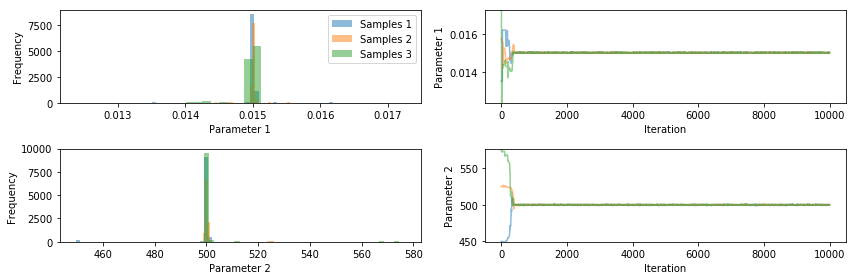

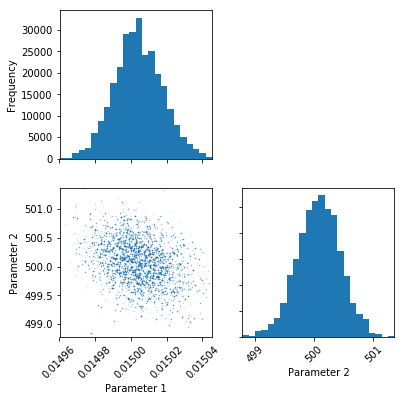

In [35]:
#chains_emu = pints.mcmc_sample(log_posterior_emu, 3, xs)
# Create mcmc routine
mcmc = pints.MCMCController(log_posterior, 3, xs)

# Add stopping criterion
mcmc.set_max_iterations(10000)

# Disable logging mode
mcmc.set_log_to_screen(False)

# Run!
print('Running...')
chains = mcmc.run()
print('Done!')

# Show traces and histograms
pints.plot.trace(chains)

# Discard warm up
chains_thin = chains[:, 1000:, :]

# Check convergence using rhat criterion
print('R-hat:')
print(pints.rhat_all_params(chains_thin))

# Look at distribution in chain 0
pints.plot.pairwise(chains_thin[0])

# Show graphs
plt.show()

Running...
[-2.13721371e-03  4.49066802e+02]
-inf


[1.37888646e-02 5.23350418e+02]
-6297.29736328125
accepted


[2.78515649e-02 5.71767106e+02]
-inf


[1.67489303e-02 4.48408830e+02]
-13319.2861328125
accepted


[1.03502197e-02 5.26288105e+02]
-102035.8828125


[-1.55267077e-03  5.73663737e+02]
-inf


[-7.23928391e-03  4.50607644e+02]
-inf


[2.85985710e-02 5.21946652e+02]
-inf


[1.18882795e-02 5.78222997e+02]
-43275.84765625
accepted


[2.61853284e-02 4.49287630e+02]
-inf


[2.62863666e-02 5.25216068e+02]
-inf


[2.10970265e-02 5.74435963e+02]
-inf


[1.69669359e-02 4.45925671e+02]
-15261.9931640625


[-5.31962368e-03  5.21618176e+02]
-inf


[2.05506458e-02 5.81483511e+02]
-inf


[-2.23604014e-03  4.50302063e+02]
-inf


[3.09832199e-02 5.21929553e+02]
-inf


[3.70224703e-02 5.79299718e+02]
-inf


[1.35554806e-02 4.48449783e+02]
-24729.6875


[1.20017669e-02 5.22705974e+02]
-35930.7890625


[1.71609596e-02 5.78310643e+02]
-55199.54296875


[2.58427060e-02 4.45682178e+02]
-inf


[5.86

[1.01446022e-02 4.50644878e+02]
-144505.421875


[1.56743843e-02 5.19530676e+02]
-5385.95751953125


[1.45760787e-02 5.77370313e+02]
-22522.765625


[1.99350204e-02 4.52228737e+02]
-38744.9609375


[2.74871696e-02 5.25867314e+02]
-inf


[1.24244052e-02 5.74350302e+02]
-31834.482421875


[1.11891545e-02 4.48758789e+02]
-90420.1328125


[1.10893999e-02 5.23578754e+02]
-67134.3359375


[2.30231717e-02 5.76310862e+02]
-inf


[-8.34071440e-03  4.47756301e+02]
-inf


[6.02515040e-03 5.20531023e+02]
-inf


[1.79102949e-02 5.73391539e+02]
-64194.21875


[-4.79630884e-04  4.47900137e+02]
-inf


[2.58198982e-02 5.27385998e+02]
-inf


[3.86977932e-03 5.73203404e+02]
-inf


[1.31865962e-02 4.51908281e+02]
-28753.033203125


[-1.76356477e-02  5.25521616e+02]
-inf


[2.00573941e-02 5.74438593e+02]
-inf


[1.12974590e-02 4.50841903e+02]
-84425.609375


[-7.67399164e-03  5.21312581e+02]
-inf


[2.48881464e-02 5.78544026e+02]
-inf


[4.12950325e-02 4.53058191e+02]
-inf


[1.52283533e-02 5.21209749e+02]

[1.57517620e-02 4.53821484e+02]
-9110.7861328125


[1.46177700e-02 5.23172043e+02]
-2849.562744140625
accepted


[1.41092954e-02 5.72582276e+02]
-18653.25


[1.54941345e-02 4.53795972e+02]
-9133.9697265625


[1.46239596e-02 5.23204643e+02]
-2866.093994140625


[1.40294880e-02 5.72530939e+02]
-18664.98828125


[1.57851930e-02 4.53890137e+02]
-9130.4697265625


[1.45581034e-02 5.23142007e+02]
-2742.148681640625
accepted


[1.42289610e-02 5.72547076e+02]
-18812.455078125


[1.55687479e-02 4.53871117e+02]
-8997.9189453125
accepted


[1.46448977e-02 5.23153941e+02]
-2900.769775390625


[1.42555258e-02 5.72489940e+02]
-18852.283203125


[1.53541811e-02 4.53801928e+02]
-9358.6494140625


[1.44921467e-02 5.23083274e+02]
-2853.426025390625


[1.42823245e-02 5.72525352e+02]
-18946.0703125


[1.54457021e-02 4.53845300e+02]
-9198.7353515625


[1.45592127e-02 5.23115264e+02]
-2742.500244140625


[1.40470421e-02 5.72545058e+02]
-18638.568359375


[1.56604299e-02 4.53889503e+02]
-8978.6572265625
acce

[1.51955053e-02 4.63483777e+02]
-6482.60205078125
accepted


[1.45354256e-02 5.23090657e+02]
-2723.535400390625


[1.39911590e-02 5.67163135e+02]
-15887.3525390625
accepted


[1.50744787e-02 4.65963092e+02]
-5950.04345703125
accepted


[1.45377013e-02 5.23099392e+02]
-2717.437744140625


[1.40119033e-02 5.68165718e+02]
-16333.0458984375


[1.50440621e-02 4.66758561e+02]
-5787.73095703125
accepted


[1.45414173e-02 5.23093265e+02]
-2716.562744140625
accepted


[1.39911756e-02 5.66287901e+02]
-15503.6240234375
accepted


[1.50617389e-02 4.66454416e+02]
-5833.38330078125


[1.45416942e-02 5.23096215e+02]
-2717.051025390625
accepted


[1.39776892e-02 5.65234023e+02]
-15073.9404296875
accepted


[1.48412433e-02 4.71079406e+02]
-5104.78955078125
accepted


[1.45416428e-02 5.23092844e+02]
-2716.617431640625
accepted


[1.39651367e-02 5.64366837e+02]
-14741.4853515625
accepted


[1.45186394e-02 4.78100855e+02]
-4694.22314453125
accepted


[1.45398048e-02 5.23093921e+02]
-2715.804931640625
acce

-7726.79736328125


[1.44420228e-02 4.79882635e+02]
-4813.93798828125


[1.45393412e-02 5.23074891e+02]
-2713.179931640625
accepted


[1.35513244e-02 5.17528310e+02]
-8157.24267578125


[1.44786969e-02 4.79024486e+02]
-4760.80126953125


[1.45408865e-02 5.23075162e+02]
-2713.968994140625
accepted


[1.35759763e-02 5.17289220e+02]
-7919.11767578125


[1.44598200e-02 4.79508589e+02]
-4791.10986328125


[1.45407789e-02 5.23073968e+02]
-2713.777587890625
accepted


[1.35933595e-02 5.19047095e+02]
-7732.92236328125


[1.45114290e-02 4.78392729e+02]
-4677.66064453125


[1.45390199e-02 5.23082303e+02]
-2713.968994140625
accepted


[1.36875497e-02 5.33423316e+02]
-7995.01611328125


[1.43840751e-02 4.81169063e+02]
-4887.25830078125


[1.45398874e-02 5.23083269e+02]
-2714.531494140625
accepted


[1.36697204e-02 5.27373840e+02]
-7603.03173828125
accepted


[1.45791090e-02 4.76843116e+02]
-4694.94189453125


[1.45370815e-02 5.23074712e+02]
-2717.468994140625


[1.37280515e-02 5.32033201e+02]
-756

[1.45287994e-02 4.78050406e+02]
-4638.93798828125


[1.51076775e-02 5.06948338e+02]
-1453.519775390625
accepted


[1.54703614e-02 4.94679564e+02]
-1560.590087890625


[1.45279825e-02 4.78097388e+02]
-4634.57470703125


[1.51762079e-02 5.05258855e+02]
-1464.843994140625


[1.50899504e-02 5.00911768e+02]
-1280.418212890625


[1.45172608e-02 4.78330842e+02]
-4655.06298828125


[1.52678556e-02 5.02179493e+02]
-1499.343994140625


[1.51570312e-02 5.00026925e+02]
-1263.402587890625
accepted


[1.45372088e-02 4.77870561e+02]
-4635.11767578125


[1.45878560e-02 5.22001415e+02]
-2636.281494140625


[1.53573728e-02 5.02737535e+02]
-1803.109619140625


[1.45517942e-02 4.77547535e+02]
-4643.66064453125


[1.50230126e-02 5.09173667e+02]
-1478.871337890625


[1.50906087e-02 5.00719687e+02]
-1282.215087890625


[1.45452790e-02 4.77708507e+02]
-4635.54345703125


[1.50999529e-02 5.07277354e+02]
-1459.133056640625


[1.51265976e-02 5.03563861e+02]
-1254.043212890625
accepted


[1.45264952e-02 4.7808934

[1.51141623e-02 5.05347635e+02]
-1335.676025390625
accepted


[1.52984237e-02 5.00811148e+02]
-1501.840087890625


[1.51776087e-02 5.02319640e+02]
-1243.148681640625


[1.50289132e-02 5.01251072e+02]
-1301.726806640625
accepted


[1.51961840e-02 5.03881177e+02]
-1367.687744140625


[1.50188528e-02 5.02909948e+02]
-1304.863525390625


[1.51098801e-02 5.05608184e+02]
-1343.859619140625


[1.52996293e-02 5.00790249e+02]
-1504.156494140625


[1.53167305e-02 5.00747857e+02]
-1550.949462890625


[1.46516368e-02 4.83447036e+02]
-3141.703369140625


[1.52363640e-02 5.02820964e+02]
-1435.472900390625


[1.51949919e-02 5.03373851e+02]
-1339.019775390625


[1.52694281e-02 5.12792612e+02]
-2413.121337890625


[1.54053538e-02 4.97641662e+02]
-1574.332275390625


[1.50786367e-02 5.05059196e+02]
-1256.890869140625


[1.49192638e-02 4.94963032e+02]
-1517.597900390625


[1.52284154e-02 5.03026530e+02]
-1421.484619140625


[1.50860504e-02 5.03696108e+02]
-1281.476806640625


[1.51595476e-02 5.08370581e+

[1.50849198e-02 5.02020125e+02]
-1273.976806640625


[1.51643102e-02 5.04314949e+02]
-1347.238525390625


[1.51473899e-02 5.03290716e+02]
-1243.797119140625


[1.52907927e-02 5.09798929e+02]
-2188.211181640625


[1.51958751e-02 5.02958526e+02]
-1319.293212890625
accepted


[1.51488978e-02 5.03306567e+02]
-1242.199462890625


[1.51878463e-02 5.05330889e+02]
-1492.394775390625


[1.51972801e-02 5.02809619e+02]
-1315.453369140625
accepted


[1.51761414e-02 5.03114083e+02]
-1276.070556640625


[1.50599283e-02 4.99424054e+02]
-1295.843994140625


[1.52288888e-02 5.01876578e+02]
-1360.797119140625


[1.51705156e-02 5.02693725e+02]
-1235.984619140625
accepted


[1.52836133e-02 5.09764931e+02]
-2163.254150390625


[1.51768044e-02 5.03660415e+02]
-1310.254150390625
accepted


[1.51769485e-02 5.02377587e+02]
-1241.265869140625


[1.51758182e-02 5.05198408e+02]
-1457.937744140625


[1.51929805e-02 5.03536307e+02]
-1341.285400390625


[1.51884334e-02 5.02476230e+02]
-1270.840087890625


[1.5151888

[1.51597789e-02 5.04188905e+02]
-1326.390869140625


[1.51596752e-02 5.03018705e+02]
-1238.289306640625


[1.51629525e-02 5.02718168e+02]
-1241.023681640625


[1.51388731e-02 5.03184370e+02]
-1249.949462890625


[1.51823753e-02 5.02174235e+02]
-1246.754150390625


[1.51779559e-02 5.02320890e+02]
-1243.109619140625


[1.51635965e-02 5.04242917e+02]
-1338.601806640625


[1.51676743e-02 5.02909473e+02]
-1244.226806640625


[1.51710280e-02 5.02419651e+02]
-1241.351806640625


[1.51211904e-02 5.02449163e+02]
-1260.027587890625


[1.51904766e-02 5.02386459e+02]
-1271.871337890625


[1.51773468e-02 5.02446807e+02]
-1238.984619140625


[1.51211176e-02 5.02144153e+02]
-1262.043212890625


[1.51645068e-02 5.03338991e+02]
-1264.965087890625


[1.51655016e-02 5.02597920e+02]
-1241.379150390625


[1.51173761e-02 5.02202344e+02]
-1262.816650390625


[1.51848011e-02 5.02282266e+02]
-1249.207275390625


[1.51790279e-02 5.02436865e+02]
-1240.679931640625


[1.51495570e-02 5.03440748e+02]
-1240.35571289

[1.51446498e-02 5.02821131e+02]
-1250.484619140625


[1.51601785e-02 5.02975599e+02]
-1238.722900390625


[1.51651509e-02 5.02950212e+02]
-1242.152587890625


[1.51515121e-02 5.03180761e+02]
-1242.340087890625


[1.51741974e-02 5.02697228e+02]
-1243.836181640625


[1.51603877e-02 5.03018594e+02]
-1237.687744140625
accepted


[1.51661362e-02 5.03840050e+02]
-1301.574462890625


[1.51691110e-02 5.02652103e+02]
-1237.804931640625


[1.51588829e-02 5.03032140e+02]
-1238.750244140625
accepted


[1.51431976e-02 5.02970558e+02]
-1249.968994140625


[1.51598825e-02 5.03059835e+02]
-1238.156494140625


[1.51541153e-02 5.03065386e+02]
-1242.250244140625


[1.51393599e-02 5.02768279e+02]
-1252.429931640625


[1.51716282e-02 5.02756869e+02]
-1242.371337890625


[1.51592974e-02 5.02994327e+02]
-1239.097900390625
accepted


[1.51683586e-02 5.03853338e+02]
-1306.957275390625


[1.51565238e-02 5.03044966e+02]
-1240.570556640625


[1.51600224e-02 5.03020078e+02]
-1237.961181640625
accepted


[1.5163210

[1.5153357e-02 5.0317966e+02]
-1240.758056640625


[1.51717878e-02 5.02577687e+02]
-1237.551025390625
accepted


[1.51711910e-02 5.02714674e+02]
-1238.621337890625


[1.51592869e-02 5.03361698e+02]
-1255.609619140625


[1.51686202e-02 5.02706592e+02]
-1236.996337890625
accepted


[1.51705706e-02 5.02676317e+02]
-1236.297119140625
accepted


[1.51521146e-02 5.03087818e+02]
-1243.601806640625


[1.51677217e-02 5.02645907e+02]
-1238.867431640625


[1.51673139e-02 5.02759254e+02]
-1236.804931640625
accepted


[1.51528192e-02 5.03125159e+02]
-1242.261962890625


[1.51748869e-02 5.02622161e+02]
-1240.277587890625


[1.51674850e-02 5.02721533e+02]
-1237.472900390625


[1.51562091e-02 5.03402052e+02]
-1251.699462890625


[1.51708141e-02 5.02567561e+02]
-1238.398681640625
accepted


[1.51664038e-02 5.02765881e+02]
-1237.238525390625


[1.51561484e-02 5.03345367e+02]
-1248.101806640625


[1.51722384e-02 5.02607918e+02]
-1236.605712890625
accepted


[1.51710630e-02 5.02607043e+02]
-1237.398681640

[1.51611464e-02 5.03073422e+02]
-1241.660400390625


[1.51627390e-02 5.02698812e+02]
-1241.590087890625
accepted


[1.51698329e-02 5.02722449e+02]
-1236.203369140625
accepted


[1.51608036e-02 5.02938628e+02]
-1238.843994140625


[1.51590106e-02 5.02799806e+02]
-1243.070556640625


[1.51666060e-02 5.02781501e+02]
-1236.797119140625
accepted


[1.51631544e-02 5.03083361e+02]
-1246.371337890625


[1.51622524e-02 5.02742536e+02]
-1241.226806640625
accepted


[1.51631642e-02 5.02919422e+02]
-1237.148681640625
accepted


[1.51597953e-02 5.02974091e+02]
-1239.086181640625
accepted


[1.51618307e-02 5.02723988e+02]
-1241.910400390625
accepted


[1.51636350e-02 5.02840821e+02]
-1238.199462890625


[1.51613117e-02 5.02934124e+02]
-1238.476806640625
accepted


[1.51644386e-02 5.02558108e+02]
-1242.941650390625
accepted


[1.51612764e-02 5.02965042e+02]
-1237.910400390625
accepted


[1.51613050e-02 5.02900774e+02]
-1239.121337890625
accepted


[1.51622021e-02 5.02608244e+02]
-1243.715087890625




[1.51714212e-02 5.02812560e+02]
-1245.672119140625


[1.51728383e-02 5.02555543e+02]
-1237.273681640625


[1.51731525e-02 5.02521407e+02]
-1237.777587890625
accepted


[1.51630321e-02 5.02879186e+02]
-1238.023681640625


[1.51781526e-02 5.02470072e+02]
-1239.847900390625


[1.51800527e-02 5.02332589e+02]
-1242.789306640625


[1.51723396e-02 5.02619206e+02]
-1236.281494140625
accepted


[1.51737234e-02 5.02594418e+02]
-1235.898681640625
accepted


[1.51731894e-02 5.02505377e+02]
-1238.097900390625
accepted


[1.51774705e-02 5.02488993e+02]
-1238.843994140625


[1.51681291e-02 5.02747639e+02]
-1236.468994140625
accepted


[1.51733259e-02 5.02566405e+02]
-1236.683837890625
accepted


[1.51742827e-02 5.02584792e+02]
-1236.441650390625
accepted


[1.51731646e-02 5.02610291e+02]
-1235.902587890625
accepted


[1.51764843e-02 5.02503373e+02]
-1236.871337890625


[1.51727468e-02 5.02606896e+02]
-1236.261962890625
accepted


[1.51735788e-02 5.02559941e+02]
-1236.695556640625
accepted


[1.516951

[1.51554420e-02 5.03150252e+02]
-1239.476806640625
accepted


[1.51788534e-02 5.02412988e+02]
-1240.414306640625


[1.51736053e-02 5.02567231e+02]
-1236.480712890625
accepted


[1.51556021e-02 5.03126860e+02]
-1239.761962890625
accepted


[1.51733855e-02 5.02640319e+02]
-1238.308837890625


[1.51742984e-02 5.02623811e+02]
-1239.105712890625
accepted


[1.51575921e-02 5.02993319e+02]
-1240.582275390625


[1.51768338e-02 5.02687452e+02]
-1248.836181640625


[1.51682041e-02 5.02736523e+02]
-1236.660400390625
accepted


[1.51424345e-02 5.03584591e+02]
-1243.269775390625


[1.51724945e-02 5.02544844e+02]
-1237.730712890625
accepted


[1.51648475e-02 5.02778632e+02]
-1238.222900390625


[1.51549699e-02 5.03208102e+02]
-1238.793212890625
accepted


[1.51715601e-02 5.02612666e+02]
-1236.949462890625
accepted


[1.51723539e-02 5.02600679e+02]
-1236.683837890625
accepted


[1.51614088e-02 5.02986120e+02]
-1237.426025390625
accepted


[1.51758550e-02 5.02479361e+02]
-1237.574462890625
accepted




[1.51676974e-02 5.02619002e+02]
-1239.476806640625


[1.51711202e-02 5.02685797e+02]
-1236.519775390625
accepted


[1.51719538e-02 5.02736565e+02]
-1241.715087890625


[1.51548429e-02 5.03047391e+02]
-1241.988525390625


[1.51723404e-02 5.02522088e+02]
-1238.371337890625


[1.51754144e-02 5.02523412e+02]
-1236.187744140625
accepted


[1.51689377e-02 5.02590457e+02]
-1239.203369140625
accepted


[1.51670827e-02 5.02822890e+02]
-1237.117431640625
accepted


[1.51746474e-02 5.02481440e+02]
-1237.601806640625


[1.51649111e-02 5.02750305e+02]
-1238.738525390625
accepted


[1.51682991e-02 5.02844506e+02]
-1241.199462890625


[1.51773954e-02 5.02528559e+02]
-1240.711181640625


[1.51605657e-02 5.02811076e+02]
-1241.476806640625


[1.51704638e-02 5.02702501e+02]
-1236.234619140625
accepted


[1.51797287e-02 5.02410245e+02]
-1241.351806640625


[1.51676736e-02 5.02591638e+02]
-1240.004150390625


[1.51656774e-02 5.02981670e+02]
-1245.324462890625


[1.51614705e-02 5.03012046e+02]
-1238.5041503

[1.51666008e-02 5.02791296e+02]
-1236.570556640625
accepted


[1.51759324e-02 5.02350820e+02]
-1242.023681640625


[1.51746327e-02 5.02529600e+02]
-1236.609619140625
accepted


[1.51702567e-02 5.02635113e+02]
-1237.371337890625


[1.51758914e-02 5.02478631e+02]
-1237.601806640625


[1.51637716e-02 5.02900273e+02]
-1236.937744140625
accepted


[1.51629629e-02 5.02880018e+02]
-1238.066650390625


[1.51711245e-02 5.02563060e+02]
-1238.304931640625


[1.51598829e-02 5.03020278e+02]
-1238.093994140625


[1.51647363e-02 5.02871516e+02]
-1236.629150390625
accepted


[1.51765011e-02 5.02554367e+02]
-1239.457275390625


[1.51633025e-02 5.02873051e+02]
-1237.890869140625


[1.51598984e-02 5.02988803e+02]
-1238.679931640625


[1.51774873e-02 5.02314027e+02]
-1243.301025390625


[1.51599829e-02 5.03004371e+02]
-1238.328369140625


[1.5167327e-02 5.0279269e+02]
-1236.093994140625
accepted


[1.51720775e-02 5.02536526e+02]
-1238.218994140625


[1.51632940e-02 5.02933643e+02]
-1237.398681640625


[1.

[1.51816114e-02 5.02247526e+02]
-1244.922119140625


[1.51684686e-02 5.02647602e+02]
-1238.328369140625
accepted


[1.51741491e-02 5.02588317e+02]
-1236.418212890625
accepted


[1.51784154e-02 5.02375377e+02]
-1241.621337890625


[1.51888440e-02 5.01965811e+02]
-1253.152587890625


[1.51757973e-02 5.02551394e+02]
-1237.441650390625
accepted


[1.51807684e-02 5.02301035e+02]
-1243.578369140625


[1.51789292e-02 5.02382306e+02]
-1241.453369140625


[1.51702678e-02 5.02739962e+02]
-1238.347900390625


[1.51821918e-02 5.02210418e+02]
-1245.828369140625


[1.51598327e-02 5.02982061e+02]
-1238.890869140625


[1.51764959e-02 5.02500835e+02]
-1236.929931640625
accepted


[1.51746999e-02 5.02540536e+02]
-1236.297119140625
accepted


[1.51707163e-02 5.02553441e+02]
-1238.738525390625
accepted


[1.51740273e-02 5.02559428e+02]
-1236.383056640625
accepted


[1.51718845e-02 5.02608235e+02]
-1236.855712890625
accepted


[1.51837871e-02 5.02139105e+02]
-1247.652587890625


[1.51823960e-02 5.02224564e

[1.51582868e-02 5.03139981e+02]
-1239.836181640625


[1.51647823e-02 5.02813204e+02]
-1237.648681640625
accepted


[1.51747654e-02 5.02650598e+02]
-1241.890869140625


[1.51687243e-02 5.02865859e+02]
-1243.523681640625


[1.51672451e-02 5.02682166e+02]
-1238.429931640625


[1.51698073e-02 5.02623060e+02]
-1237.883056640625


[1.51669643e-02 5.02819502e+02]
-1236.672119140625
accepted


[1.51571037e-02 5.03060566e+02]
-1239.758056640625


[1.51783888e-02 5.02373205e+02]
-1241.695556640625


[1.51684733e-02 5.02758602e+02]
-1236.035400390625
accepted


[1.51672199e-02 5.02716208e+02]
-1237.750244140625
accepted


[1.51719944e-02 5.02513452e+02]
-1238.722900390625


[1.51666341e-02 5.02819471e+02]
-1235.980712890625
accepted


[1.51687323e-02 5.02718142e+02]
-1236.683837890625
accepted


[1.51717030e-02 5.02632193e+02]
-1236.437744140625
accepted


[1.51737955e-02 5.02553888e+02]
-1236.601806640625


[1.51682317e-02 5.02664682e+02]
-1238.113525390625
accepted


[1.51729162e-02 5.02605006e

[1.51717618e-02 5.02674615e+02]
-1237.090087890625


[1.51671139e-02 5.02601405e+02]
-1240.207275390625


[1.51744528e-02 5.02591278e+02]
-1237.258056640625
accepted


[1.5178370e-02 5.0243239e+02]
-1239.590087890625


[1.51612665e-02 5.02908713e+02]
-1239.019775390625


[1.51532190e-02 5.03393379e+02]
-1245.004150390625


[1.51808572e-02 5.02314247e+02]
-1243.258056640625


[1.51643176e-02 5.02842184e+02]
-1237.566650390625
accepted


[1.51650508e-02 5.03004253e+02]
-1245.437744140625


[1.51781933e-02 5.02420046e+02]
-1240.051025390625


[1.51711589e-02 5.02637456e+02]
-1236.691650390625
accepted


[1.51658683e-02 5.02913585e+02]
-1241.047119140625


[1.51645931e-02 5.02856450e+02]
-1237.054931640625


[1.51698476e-02 5.02636672e+02]
-1237.648681640625
accepted


[1.51651024e-02 5.02862080e+02]
-1236.476806640625
accepted


[1.51708621e-02 5.02730401e+02]
-1238.957275390625


[1.51622790e-02 5.02826006e+02]
-1239.738525390625


[1.51701579e-02 5.02735726e+02]
-1237.812744140625


[1.

[1.51707579e-02 5.02600526e+02]
-1237.769775390625
accepted


[1.51593604e-02 5.03072497e+02]
-1237.883056640625
accepted


[1.51697526e-02 5.02770986e+02]
-1239.285400390625


[1.51685583e-02 5.02681304e+02]
-1237.593994140625
accepted


[1.51587833e-02 5.03268641e+02]
-1248.801025390625


[1.51710349e-02 5.02692588e+02]
-1236.777587890625


[1.51734723e-02 5.02496269e+02]
-1238.086181640625


[1.51659987e-02 5.02829920e+02]
-1236.293212890625
accepted


[1.51655035e-02 5.02836071e+02]
-1236.625244140625


[1.51610830e-02 5.02940929e+02]
-1238.625244140625
accepted


[1.51734962e-02 5.02451704e+02]
-1239.027587890625


[1.51683160e-02 5.02858915e+02]
-1242.160400390625


[1.51656906e-02 5.02760930e+02]
-1237.836181640625
accepted


[1.51693561e-02 5.02903475e+02]
-1247.375244140625


[1.51744785e-02 5.02606156e+02]
-1238.343994140625


[1.51580703e-02 5.03017620e+02]
-1239.718994140625


[1.51585020e-02 5.03184672e+02]
-1243.015869140625


[1.51750049e-02 5.02530806e+02]
-1236.3322753

-1240.687744140625


[1.51659808e-02 5.02811462e+02]
-1236.629150390625
accepted


[1.51670903e-02 5.02614985e+02]
-1239.980712890625
accepted


[1.51553121e-02 5.03167120e+02]
-1239.250244140625


[1.51817078e-02 5.02184180e+02]
-1246.504150390625


[1.51670810e-02 5.02810004e+02]
-1236.195556640625
accepted


[1.51688842e-02 5.02842907e+02]
-1242.347900390625


[1.51679817e-02 5.02745503e+02]
-1236.605712890625
accepted


[1.51832957e-02 5.02185835e+02]
-1246.433837890625


[1.51682968e-02 5.02869109e+02]
-1242.840087890625


[1.51577700e-02 5.03111948e+02]
-1238.203369140625


[1.51657639e-02 5.02761882e+02]
-1237.761962890625
accepted


[1.51716977e-02 5.02667972e+02]
-1236.511962890625
accepted


[1.51694176e-02 5.02737630e+02]
-1236.351806640625
accepted


[1.51694772e-02 5.02435633e+02]
-1242.136962890625


[1.51702043e-02 5.02707382e+02]
-1236.011962890625
accepted


[1.51769748e-02 5.02379138e+02]
-1241.215087890625


[1.51541525e-02 5.03029155e+02]
-1242.929931640625


[1.516

[1.51605847e-02 5.03052963e+02]
-1239.179931640625


[1.51744180e-02 5.02501529e+02]
-1237.332275390625
accepted


[1.51744013e-02 5.02619770e+02]
-1239.074462890625


[1.51508704e-02 5.03370454e+02]
-1239.250244140625


[1.51627445e-02 5.02841081e+02]
-1238.976806640625


[1.51732378e-02 5.02718674e+02]
-1243.222900390625


[1.51668740e-02 5.02896147e+02]
-1241.672119140625


[1.51927905e-02 5.01907471e+02]
-1254.863525390625


[1.51597365e-02 5.03027545e+02]
-1238.086181640625


[1.51607043e-02 5.02908484e+02]
-1239.535400390625


[1.51552358e-02 5.02963954e+02]
-1243.222900390625


[1.51827692e-02 5.02358467e+02]
-1247.472900390625


[1.51638361e-02 5.02929217e+02]
-1238.226806640625


[1.51754315e-02 5.02324293e+02]
-1242.804931640625


[1.51776190e-02 5.02447618e+02]
-1238.988525390625


[1.51563049e-02 5.03254876e+02]
-1242.832275390625


[1.51719949e-02 5.02671726e+02]
-1237.390869140625
accepted


[1.51837223e-02 5.02237917e+02]
-1245.133056640625


[1.51649842e-02 5.02857973e+

[1.51755551e-02 5.02496976e+02]
-1236.894775390625


[1.51741905e-02 5.02626347e+02]
-1239.043212890625


[1.51721713e-02 5.02558005e+02]
-1237.695556640625


[1.51634817e-02 5.02829893e+02]
-1238.508056640625


[1.51701886e-02 5.02890282e+02]
-1248.316650390625


[1.51831581e-02 5.02245131e+02]
-1245.004150390625


[1.51600541e-02 5.02999628e+02]
-1238.355712890625
accepted


[1.51803730e-02 5.02294933e+02]
-1243.687744140625


[1.51775001e-02 5.02456990e+02]
-1238.636962890625
accepted


[1.51474812e-02 5.03335441e+02]
-1242.847900390625


[1.52032427e-02 5.01540990e+02]
-1265.144775390625


[1.51909773e-02 5.02060163e+02]
-1256.211181640625


[1.51652624e-02 5.02806077e+02]
-1237.383056640625
accepted


[1.51948727e-02 5.01876183e+02]
-1257.914306640625


[1.51723056e-02 5.02584606e+02]
-1237.011962890625
accepted


[1.51634434e-02 5.02848623e+02]
-1238.226806640625


[1.51585917e-02 5.03019225e+02]
-1239.211181640625


[1.51701550e-02 5.02626271e+02]
-1237.609619140625
accepted


[

[1.51644521e-02 5.02958426e+02]
-1241.367431640625


[1.51643543e-02 5.02906021e+02]
-1237.539306640625
accepted


[1.51736088e-02 5.02654615e+02]
-1239.711181640625


[1.51786764e-02 5.02402542e+02]
-1240.734619140625


[1.51575766e-02 5.03059977e+02]
-1239.343994140625


[1.51841055e-02 5.02315860e+02]
-1249.074462890625


[1.51791759e-02 5.02445365e+02]
-1241.578369140625


[1.51726781e-02 5.02527640e+02]
-1237.961181640625


[1.51445849e-02 5.03617546e+02]
-1242.558837890625


[1.51687695e-02 5.02757238e+02]
-1236.328369140625
accepted


[1.51674769e-02 5.02747593e+02]
-1236.894775390625
accepted


[1.51561090e-02 5.03180056e+02]
-1238.320556640625
accepted


[1.51724371e-02 5.02633250e+02]
-1235.914306640625
accepted


[1.51598219e-02 5.03117519e+02]
-1241.640869140625


[1.51680863e-02 5.02814360e+02]
-1238.691650390625
accepted


[1.51776344e-02 5.02380612e+02]
-1241.254150390625


[1.51564815e-02 5.03224352e+02]
-1241.316650390625


[1.51754003e-02 5.02474080e+02]
-1237.6447753

[1.51672149e-02 5.02746139e+02]
-1237.152587890625
accepted


[1.51672498e-02 5.02719318e+02]
-1237.652587890625
accepted


[1.51733871e-02 5.02691629e+02]
-1241.742431640625


[1.51563548e-02 5.03040829e+02]
-1240.804931640625


[1.5165054e-02 5.0281025e+02]
-1237.492431640625
accepted


[1.51686718e-02 5.02756737e+02]
-1236.066650390625
accepted


[1.51604590e-02 5.02974219e+02]
-1238.476806640625


[1.51562501e-02 5.03117794e+02]
-1239.410400390625


[1.51638807e-02 5.02946679e+02]
-1239.441650390625


[1.51699069e-02 5.02845415e+02]
-1244.660400390625


[1.51695314e-02 5.02725441e+02]
-1235.953369140625
accepted


[1.51615618e-02 5.02960253e+02]
-1237.781494140625


[1.51679315e-02 5.02807982e+02]
-1237.945556640625
accepted


[1.51734735e-02 5.02582668e+02]
-1236.312744140625
accepted


[1.51656768e-02 5.02818016e+02]
-1236.785400390625


[1.51763613e-02 5.02463541e+02]
-1238.207275390625
accepted


[1.51864765e-02 5.02226978e+02]
-1251.133056640625


[1.51791378e-02 5.02444607e+0

[1.51709208e-02 5.02588143e+02]
-1237.926025390625


[1.51745887e-02 5.02538258e+02]
-1236.461181640625
accepted


[1.51642709e-02 5.02931533e+02]
-1239.187744140625


[1.51563852e-02 5.03200494e+02]
-1239.640869140625


[1.51721792e-02 5.02563027e+02]
-1237.558837890625


[1.51539274e-02 5.03227143e+02]
-1239.316650390625


[1.51741850e-02 5.02512002e+02]
-1237.281494140625
accepted


[1.51819120e-02 5.02406776e+02]
-1247.636962890625


[1.51486124e-02 5.03449461e+02]
-1239.691650390625


[1.51743058e-02 5.02503356e+02]
-1237.351806640625
accepted


[1.51728231e-02 5.02716291e+02]
-1242.183837890625


[1.51559507e-02 5.03034765e+02]
-1241.234619140625


[1.51739085e-02 5.02508036e+02]
-1237.539306640625


[1.51686121e-02 5.02715885e+02]
-1236.797119140625


[1.51693879e-02 5.02790707e+02]
-1239.910400390625


[1.51745879e-02 5.02438686e+02]
-1238.722900390625


[1.51808465e-02 5.02396756e+02]
-1243.918212890625


[1.51571754e-02 5.03043708e+02]
-1240.015869140625


[1.51815289e-02 5.0



[1.51746965e-02 5.02461485e+02]
-1238.019775390625
accepted


[1.51817893e-02 5.02364998e+02]
-1244.968994140625


[1.51563240e-02 5.03168661e+02]
-1238.371337890625


[1.51792620e-02 5.02325814e+02]
-1243.000244140625


[1.51570792e-02 5.03067838e+02]
-1239.629150390625


[1.51700961e-02 5.02709046e+02]
-1235.922119140625
accepted


[1.51488343e-02 5.03300769e+02]
-1242.340087890625


[1.51571536e-02 5.03253312e+02]
-1244.480712890625


[1.51594467e-02 5.02911410e+02]
-1240.562744140625


[1.51863624e-02 5.02008160e+02]
-1251.593994140625


[1.51666683e-02 5.02861322e+02]
-1238.840087890625


[1.51542398e-02 5.03208989e+02]
-1239.363525390625


[1.51770394e-02 5.02446442e+02]
-1238.898681640625
accepted


[1.51644202e-02 5.02961433e+02]
-1241.468994140625


[1.51854443e-02 5.02319704e+02]
-1253.261962890625


[1.51963864e-02 5.01851112e+02]
-1261.011962890625


[1.51604374e-02 5.02965524e+02]
-1238.687744140625


[1.51598231e-02 5.03023963e+02]
-1238.066650390625


[1.51809437e-02 5

[1.51633002e-02 5.02864606e+02]
-1238.011962890625
accepted


[1.51695423e-02 5.02681534e+02]
-1236.898681640625
accepted


[1.51861669e-02 5.02013764e+02]
-1251.394775390625


[1.51691124e-02 5.02695215e+02]
-1236.914306640625
accepted


[1.51834571e-02 5.02194037e+02]
-1246.269775390625


[1.51873826e-02 5.02048907e+02]
-1250.531494140625


[1.51731088e-02 5.02556595e+02]
-1237.109619140625
accepted


[1.51761113e-02 5.02484559e+02]
-1237.437744140625
accepted


[1.51909886e-02 5.02041114e+02]
-1255.293212890625


[1.51850246e-02 5.02192001e+02]
-1246.316650390625


[1.51733791e-02 5.02558613e+02]
-1236.859619140625
accepted


[1.51655499e-02 5.02737181e+02]
-1238.468994140625
accepted


[1.51730844e-02 5.02543396e+02]
-1237.371337890625
accepted


[1.51821943e-02 5.02252221e+02]
-1244.797119140625


[1.51709770e-02 5.02613188e+02]
-1237.340087890625
accepted


[1.51816504e-02 5.02264249e+02]
-1244.441650390625


[1.51790997e-02 5.02393844e+02]
-1241.093994140625


[1.51518578e-02 5.

[1.51596915e-02 5.03027841e+02]
-1238.164306640625


[1.51817431e-02 5.02261842e+02]
-1244.562744140625


[1.51564289e-02 5.03176681e+02]
-1238.269775390625


[1.51591376e-02 5.02992880e+02]
-1239.250244140625


[1.51646721e-02 5.02789861e+02]
-1238.199462890625
accepted


[1.51781879e-02 5.02414053e+02]
-1240.250244140625


[1.51748692e-02 5.02473456e+02]
-1237.621337890625


[1.51684330e-02 5.02821469e+02]
-1239.933837890625


[1.51589954e-02 5.03007051e+02]
-1239.129150390625


[1.51749694e-02 5.02287439e+02]
-1243.949462890625


[1.51546273e-02 5.03069447e+02]
-1241.695556640625


[1.51619581e-02 5.03147266e+02]
-1247.867431640625


[1.51813847e-02 5.02534968e+02]
-1253.035400390625


[1.51473903e-02 5.03369924e+02]
-1242.293212890625


[1.51551245e-02 5.03192622e+02]
-1238.910400390625


[1.51705165e-02 5.02647663e+02]
-1236.937744140625
accepted


[1.51604826e-02 5.03054256e+02]
-1239.058837890625


[1.51610618e-02 5.02869663e+02]
-1239.949462890625


[1.51550902e-02 5.03184597e+

[1.51927841e-02 5.01903996e+02]
-1254.965087890625


[1.51776226e-02 5.02433656e+02]
-1239.437744140625


[1.51724642e-02 5.02566738e+02]
-1237.351806640625


[1.51548570e-02 5.03047429e+02]
-1242.008056640625


[1.51743817e-02 5.02516667e+02]
-1237.074462890625
accepted


[1.51820160e-02 5.02192375e+02]
-1246.293212890625


[1.51932540e-02 5.01998429e+02]
-1260.023681640625


[1.51671714e-02 5.02780588e+02]
-1236.429931640625
accepted


[1.51813171e-02 5.02205410e+02]
-1245.980712890625


[1.51852507e-02 5.02200291e+02]
-1246.070556640625


[1.51716108e-02 5.02484661e+02]
-1239.586181640625


[1.51796164e-02 5.02350455e+02]
-1242.347900390625


[1.51869923e-02 5.02118225e+02]
-1248.441650390625


[1.51707384e-02 5.02733944e+02]
-1238.933837890625


[1.51625929e-02 5.02747400e+02]
-1240.812744140625


[1.51913778e-02 5.01926443e+02]
-1254.320556640625


[1.51609375e-02 5.03018136e+02]
-1237.761962890625


[1.51872946e-02 5.02116053e+02]
-1248.531494140625


[1.51513362e-02 5.03309291e+

[1.51543646e-02 5.02957838e+02]
-1244.172119140625


[1.51864855e-02 5.02185205e+02]
-1248.828369140625


[1.51655668e-02 5.02850829e+02]
-1236.242431640625
accepted


[1.51514344e-02 5.03222216e+02]
-1241.562744140625


[1.51822169e-02 5.02283556e+02]
-1244.058837890625


[1.51543266e-02 5.03301878e+02]
-1241.660400390625


[1.51811100e-02 5.02282227e+02]
-1244.015869140625


[1.51831210e-02 5.02202076e+02]
-1246.015869140625


[1.51625682e-02 5.02995780e+02]
-1239.781494140625


[1.51763519e-02 5.02551454e+02]
-1238.832275390625
accepted


[1.51763682e-02 5.02534745e+02]
-1237.945556640625
accepted


[1.51565511e-02 5.03110584e+02]
-1239.269775390625


[1.51785812e-02 5.02299060e+02]
-1243.644775390625


[1.51749918e-02 5.02476564e+02]
-1237.543212890625
accepted


[1.51593639e-02 5.03157767e+02]
-1243.136962890625


[1.51591390e-02 5.03180692e+02]
-1244.093994140625


[1.51746057e-02 5.02563114e+02]
-1235.961181640625
accepted


[1.51782548e-02 5.02370239e+02]
-1241.808837890625


[

[1.51515771e-02 5.03294256e+02]
-1240.125244140625


[1.51655654e-02 5.02871595e+02]
-1237.441650390625
accepted


[1.51886287e-02 5.02246144e+02]
-1258.593994140625


[1.51840876e-02 5.02181823e+02]
-1246.511962890625


[1.51636618e-02 5.02953126e+02]
-1239.375244140625


[1.51617716e-02 5.03046048e+02]
-1241.218994140625


[1.51941662e-02 5.01946246e+02]
-1259.726806640625


[1.51670852e-02 5.02849375e+02]
-1238.937744140625


[1.51892412e-02 5.02157881e+02]
-1255.855712890625


[1.51731384e-02 5.02608446e+02]
-1235.965087890625
accepted


[1.51535552e-02 5.03280293e+02]
-1238.722900390625


[1.51747974e-02 5.02473889e+02]
-1237.676025390625


[1.51719693e-02 5.02774633e+02]
-1244.312744140625


[1.51826963e-02 5.02357092e+02]
-1247.218994140625


[1.51692982e-02 5.02918500e+02]
-1248.277587890625


[1.51675417e-02 5.02813348e+02]
-1237.449462890625
accepted


[1.5170013e-02 5.0271856e+02]
-1236.359619140625
accepted


[1.51624485e-02 5.02917409e+02]
-1237.851806640625


[1.51689202e

[1.51632882e-02 5.03008059e+02]
-1242.043212890625


[1.51586803e-02 5.03007924e+02]
-1239.383056640625


[1.51651621e-02 5.02906457e+02]
-1239.164306640625


[1.51773596e-02 5.02523686e+02]
-1240.347900390625


[1.51644407e-02 5.02877233e+02]
-1236.804931640625
accepted


[1.51650114e-02 5.02824911e+02]
-1237.281494140625


[1.51585321e-02 5.03155737e+02]
-1241.269775390625


[1.51614917e-02 5.02968968e+02]
-1237.668212890625
accepted


[1.51652556e-02 5.02919346e+02]
-1240.234619140625


[1.51638141e-02 5.02840270e+02]
-1238.047119140625


[1.51683485e-02 5.02761347e+02]
-1236.074462890625
accepted


[1.51734027e-02 5.02526166e+02]
-1237.531494140625


[1.51602770e-02 5.03010253e+02]
-1237.926025390625


[1.51696790e-02 5.02727857e+02]
-1236.277587890625
accepted


[1.51472800e-02 5.03464529e+02]
-1240.551025390625


[1.51524974e-02 5.03262863e+02]
-1239.863525390625


[1.51780511e-02 5.02400116e+02]
-1240.707275390625


[1.51923956e-02 5.01979963e+02]
-1256.343994140625


[1.5181930

[1.51803348e-02 5.02285019e+02]
-1243.972900390625


[1.51757460e-02 5.02589712e+02]
-1239.926025390625


[1.51699023e-02 5.02752509e+02]
-1238.383056640625


[1.51686993e-02 5.02825009e+02]
-1240.726806640625


[1.51876327e-02 5.02147363e+02]
-1250.347900390625


[1.51830556e-02 5.02294716e+02]
-1244.777587890625


[1.51652979e-02 5.02708186e+02]
-1239.238525390625


[1.51537030e-02 5.03386492e+02]
-1245.562744140625


[1.51691170e-02 5.02740831e+02]
-1235.953369140625


[1.51846282e-02 5.02135342e+02]
-1247.715087890625


[1.51706741e-02 5.02573299e+02]
-1238.379150390625


[1.51699099e-02 5.02758700e+02]
-1238.847900390625


[1.52038811e-02 5.01543069e+02]
-1266.207275390625


[1.51742758e-02 5.02470904e+02]
-1238.070556640625


[1.51733358e-02 5.02648318e+02]
-1238.730712890625


[1.51705039e-02 5.02676202e+02]
-1236.316650390625
accepted


[1.51821486e-02 5.02259097e+02]
-1244.656494140625


[1.51709571e-02 5.02693008e+02]
-1236.609619140625
accepted


[1.51765378e-02 5.02477728e+

[1.51785943e-02 5.02365626e+02]
-1241.996337890625


[1.51820293e-02 5.02385977e+02]
-1246.793212890625


[1.51678599e-02 5.02728294e+02]
-1237.078369140625
accepted


[1.51851205e-02 5.02288719e+02]
-1250.570556640625


[1.51735596e-02 5.02578225e+02]
-1236.308837890625
accepted


[1.51692482e-02 5.02662384e+02]
-1237.468994140625
accepted


[1.52141666e-02 5.01220582e+02]
-1278.828369140625


[1.51520358e-02 5.03285856e+02]
-1239.840087890625


[1.51798285e-02 5.02299952e+02]
-1243.621337890625


[1.51684960e-02 5.02543083e+02]
-1240.476806640625


[1.51851419e-02 5.02194349e+02]
-1246.242431640625


[1.51934423e-02 5.01799861e+02]
-1257.558837890625


[1.51737736e-02 5.02447906e+02]
-1238.871337890625
accepted


[1.51801585e-02 5.02495145e+02]
-1247.207275390625


[1.51737786e-02 5.02504726e+02]
-1237.707275390625
accepted


[1.51538668e-02 5.03030310e+02]
-1243.191650390625


[1.51498328e-02 5.03511158e+02]
-1245.261962890625


[1.51661720e-02 5.02682924e+02]
-1239.148681640625


[

[1.51629103e-02 5.02880864e+02]
-1238.109619140625


[1.51695437e-02 5.02745141e+02]
-1237.168212890625
accepted


[1.51509936e-02 5.03305124e+02]
-1240.386962890625
accepted


[1.51785487e-02 5.02491043e+02]
-1242.136962890625


[1.51721736e-02 5.02476821e+02]
-1239.371337890625


[1.51717619e-02 5.02614295e+02]
-1236.765869140625
accepted


[1.51779679e-02 5.02401131e+02]
-1240.644775390625


[1.51607029e-02 5.03151328e+02]
-1245.511962890625


[1.51849290e-02 5.02142764e+02]
-1247.543212890625


[1.51676799e-02 5.02747154e+02]
-1236.808837890625
accepted


[1.51581045e-02 5.03139130e+02]
-1239.347900390625


[1.51907797e-02 5.01868307e+02]
-1255.676025390625


[1.51801401e-02 5.02338186e+02]
-1242.656494140625


[1.51828890e-02 5.02202547e+02]
-1246.035400390625


[1.51671742e-02 5.02702140e+02]
-1238.039306640625


[1.51784005e-02 5.02393518e+02]
-1240.988525390625


[1.51631216e-02 5.03052307e+02]
-1244.414306640625


[1.51782436e-02 5.02488135e+02]
-1241.070556640625


[1.5170374

[1.51710867e-02 5.02605710e+02]
-1237.437744140625


[1.51551298e-02 5.03131982e+02]
-1240.125244140625


[1.51576194e-02 5.03200927e+02]
-1242.207275390625


[1.51658410e-02 5.02754911e+02]
-1237.855712890625


[1.51769196e-02 5.02350665e+02]
-1242.179931640625


[1.51639696e-02 5.02969649e+02]
-1241.058837890625
accepted


[1.51651431e-02 5.02801735e+02]
-1237.570556640625
accepted


[1.51470746e-02 5.03566666e+02]
-1243.246337890625


[1.51582781e-02 5.03138166e+02]
-1239.707275390625
accepted


[1.51761611e-02 5.02601595e+02]
-1241.605712890625


[1.51783644e-02 5.02290716e+02]
-1243.859619140625


[1.51572180e-02 5.03160548e+02]
-1238.879150390625
accepted


[1.51750984e-02 5.02539882e+02]
-1236.105712890625
accepted


[1.51410378e-02 5.03761330e+02]
-1249.984619140625


[1.51509844e-02 5.03404484e+02]
-1241.086181640625


[1.51709052e-02 5.02838751e+02]
-1246.308837890625


[1.51570153e-02 5.03015196e+02]
-1240.722900390625


[1.51435239e-02 5.03613097e+02]
-1242.011962890625


[

[1.51566058e-02 5.03182091e+02]
-1238.945556640625


[1.51679068e-02 5.02655229e+02]
-1238.539306640625
accepted


[1.51760460e-02 5.02447519e+02]
-1238.715087890625


[1.51592011e-02 5.03035556e+02]
-1238.418212890625


[1.51575631e-02 5.03044902e+02]
-1239.605712890625


[1.51782616e-02 5.02371143e+02]
-1241.734619140625


[1.51736901e-02 5.02555301e+02]
-1236.707275390625
accepted


[1.51347395e-02 5.03723853e+02]
-1252.625244140625


[1.51674659e-02 5.02829296e+02]
-1238.355712890625


[1.51659129e-02 5.02815438e+02]
-1236.648681640625
accepted


[1.51605512e-02 5.02731721e+02]
-1242.937744140625


[1.51707514e-02 5.02600687e+02]
-1237.777587890625


[1.51679311e-02 5.02737393e+02]
-1236.820556640625
accepted


[1.51398612e-02 5.03724504e+02]
-1246.754150390625


[1.51880997e-02 5.02137510e+02]
-1251.336181640625


[1.51645418e-02 5.02875914e+02]
-1236.765869140625
accepted


[1.51518198e-02 5.03283912e+02]
-1240.097900390625


[1.51734952e-02 5.02651840e+02]
-1239.285400390625


[

[1.51496199e-02 5.03418496e+02]
-1239.398681640625
accepted


[1.51896006e-02 5.01933800e+02]
-1254.023681640625


[1.51666273e-02 5.02878142e+02]
-1239.937744140625


[1.51513054e-02 5.03385556e+02]
-1240.621337890625
accepted


[1.51654675e-02 5.02661477e+02]
-1240.062744140625


[1.51731303e-02 5.02630477e+02]
-1237.023681640625
accepted


[1.51429761e-02 5.03649455e+02]
-1242.238525390625


[1.51551905e-02 5.03242447e+02]
-1239.761962890625


[1.51773335e-02 5.02574450e+02]
-1243.000244140625


[1.51556862e-02 5.03301891e+02]
-1244.433837890625


[1.51577973e-02 5.02955253e+02]
-1241.211181640625


[1.51563164e-02 5.03068800e+02]
-1240.285400390625


[1.51392625e-02 5.03732468e+02]
-1247.562744140625


[1.51948260e-02 5.01818375e+02]
-1257.222900390625


[1.51821430e-02 5.02230977e+02]
-1245.351806640625


[1.51574348e-02 5.03239702e+02]
-1244.215087890625


[1.5169386e-02 5.0278711e+02]
-1239.660400390625
accepted


[1.51866953e-02 5.02229946e+02]
-1251.961181640625


[1.51428298e

[1.51660515e-02 5.02851939e+02]
-1237.004150390625


[1.51770416e-02 5.02066937e+02]
-1249.429931640625


[1.51889298e-02 5.02137399e+02]
-1253.871337890625


[1.51800400e-02 5.02348153e+02]
-1242.383056640625


[1.51958411e-02 5.01960577e+02]
-1265.597900390625


[1.51692701e-02 5.02803291e+02]
-1240.484619140625


[1.51778413e-02 5.02415211e+02]
-1240.144775390625


[1.51819151e-02 5.02105873e+02]
-1248.449462890625


[1.51642718e-02 5.02967457e+02]
-1241.508056640625


[1.51817308e-02 5.02190876e+02]
-1246.375244140625


[1.51973440e-02 5.02004906e+02]
-1272.648681640625


[1.51943626e-02 5.01904232e+02]
-1257.961181640625


[1.51756723e-02 5.02489623e+02]
-1237.179931640625


[1.51917158e-02 5.01759562e+02]
-1258.488525390625


[1.51727987e-02 5.02648183e+02]
-1237.551025390625


[1.51744328e-02 5.02574252e+02]
-1236.047119140625
accepted


[1.51814124e-02 5.02224890e+02]
-1245.468994140625


[1.51846625e-02 5.02177031e+02]
-1246.676025390625


[1.51568939e-02 5.03208900e+02]
-1241

[1.51524356e-02 5.03392235e+02]
-1243.258056640625


[1.51588091e-02 5.03152065e+02]
-1241.672119140625


[1.51490539e-02 5.03198901e+02]
-1244.152587890625


[1.51608325e-02 5.03151763e+02]
-1245.859619140625


[1.51822515e-02 5.02158767e+02]
-1247.121337890625


[1.51712067e-02 5.02614197e+02]
-1237.172119140625
accepted


[1.51530501e-02 5.03301287e+02]
-1239.000244140625
accepted


[1.52078163e-02 5.01573541e+02]
-1279.832275390625


[1.51819921e-02 5.02340462e+02]
-1244.144775390625


[1.51625876e-02 5.03022107e+02]
-1241.449462890625


[1.51637312e-02 5.02849330e+02]
-1237.949462890625


[1.51829420e-02 5.02283784e+02]
-1243.968994140625


[1.51181292e-02 5.04483070e+02]
-1285.340087890625


[1.51896731e-02 5.02204700e+02]
-1259.609619140625


[1.51855316e-02 5.02038720e+02]
-1250.562744140625


[1.51475124e-02 5.03485119e+02]
-1239.933837890625


[1.51932812e-02 5.01897720e+02]
-1255.152587890625


[1.51634949e-02 5.02739555e+02]
-1240.172119140625


[1.51423434e-02 5.03629354e+

[1.51429956e-02 5.03642920e+02]
-1242.281494140625


[1.51544056e-02 5.03217725e+02]
-1239.093994140625


[1.51553913e-02 5.03041149e+02]
-1241.625244140625


[1.51540294e-02 5.03219184e+02]
-1239.394775390625


[1.51737101e-02 5.02819874e+02]
-1251.070556640625


[1.51591622e-02 5.03077496e+02]
-1237.781494140625
accepted


[1.51629808e-02 5.03049687e+02]
-1243.914306640625


[1.51512022e-02 5.03344744e+02]
-1239.437744140625


[1.51889810e-02 5.01984183e+02]
-1252.648681640625


[1.51795761e-02 5.02393887e+02]
-1241.215087890625


[1.51684888e-02 5.02752288e+02]
-1236.156494140625
accepted


[1.51709734e-02 5.02707951e+02]
-1237.722900390625
accepted


[1.51603074e-02 5.03012919e+02]
-1237.898681640625


[1.51388764e-02 5.03736257e+02]
-1248.105712890625


[1.51594886e-02 5.03214458e+02]
-1246.886962890625


[1.51554754e-02 5.03077051e+02]
-1240.836181640625


[1.51957207e-02 5.01858008e+02]
-1259.390869140625


[1.51849711e-02 5.01777674e+02]
-1257.586181640625


[1.51599529e-02 5.0

[1.51666194e-02 5.02878278e+02]
-1239.984619140625


[1.51339997e-02 5.03960268e+02]
-1258.230712890625


[1.51689135e-02 5.02949414e+02]
-1249.543212890625


[1.51901359e-02 5.02030233e+02]
-1252.058837890625


[1.51259187e-02 5.04290505e+02]
-1278.090087890625


[1.51683057e-02 5.02896679e+02]
-1244.703369140625


[1.51632529e-02 5.02909891e+02]
-1237.250244140625
accepted


[1.51564388e-02 5.03281497e+02]
-1244.750244140625


[1.51753250e-02 5.02586406e+02]
-1238.730712890625


[1.51723796e-02 5.02656139e+02]
-1237.199462890625
accepted


[1.51517756e-02 5.03316756e+02]
-1239.453369140625
accepted


[1.51739930e-02 5.02826982e+02]
-1252.144775390625


[1.51765211e-02 5.02577445e+02]
-1240.773681640625


[1.51852428e-02 5.02169416e+02]
-1246.867431640625


[1.51808260e-02 5.02436503e+02]
-1246.023681640625


[1.51689578e-02 5.02749202e+02]
-1236.160400390625
accepted


[1.51474034e-02 5.03333177e+02]
-1242.984619140625


[1.52008581e-02 5.01600496e+02]
-1263.090087890625


[1.5145127

[1.51661455e-02 5.02841008e+02]
-1236.414306640625
accepted


[1.51755677e-02 5.02620933e+02]
-1241.640869140625


[1.51441642e-02 5.03638827e+02]
-1243.476806640625


[1.51514556e-02 5.03322681e+02]
-1239.613525390625


[1.51921060e-02 5.01832895e+02]
-1256.683837890625


[1.51853127e-02 5.02129033e+02]
-1247.898681640625


[1.51642670e-02 5.02869377e+02]
-1237.093994140625


[1.51586988e-02 5.03061125e+02]
-1238.343994140625


[1.51894663e-02 5.02039204e+02]
-1251.086181640625


[1.51561162e-02 5.03200792e+02]
-1239.074462890625
accepted


[1.51388184e-02 5.03596951e+02]
-1246.726806640625


[1.51878956e-02 5.01991984e+02]
-1252.261962890625


[1.51546615e-02 5.03166441e+02]
-1239.871337890625
accepted


[1.51738011e-02 5.02402525e+02]
-1239.832275390625


[1.51805189e-02 5.02348196e+02]
-1242.418212890625


[1.51422745e-02 5.03443490e+02]
-1245.324462890625


[1.51759586e-02 5.02445136e+02]
-1238.765869140625
accepted


[1.51693380e-02 5.02676056e+02]
-1237.148681640625
accepted


[

[1.51588688e-02 5.03200835e+02]
-1244.812744140625


[1.51895547e-02 5.01764807e+02]
-1258.199462890625


[1.51873009e-02 5.02240966e+02]
-1254.336181640625


[1.51870727e-02 5.02134121e+02]
-1247.988525390625


[1.51762766e-02 5.02411992e+02]
-1239.984619140625


[1.51773146e-02 5.02429655e+02]
-1239.515869140625


[1.51757402e-02 5.02507147e+02]
-1236.597900390625
accepted


[1.51574099e-02 5.02918720e+02]
-1242.222900390625


[1.51804096e-02 5.02344969e+02]
-1242.488525390625


[1.51820728e-02 5.02229246e+02]
-1245.379150390625


[1.51564018e-02 5.03177479e+02]
-1238.250244140625


[1.51710946e-02 5.02645484e+02]
-1236.593994140625
accepted


[1.51664974e-02 5.02613758e+02]
-1240.363525390625


[1.51747379e-02 5.02472896e+02]
-1237.683837890625
accepted


[1.51585681e-02 5.03159956e+02]
-1241.652587890625


[1.51853301e-02 5.02165894e+02]
-1246.929931640625


[1.5200580e-02 5.0149757e+02]
-1266.027587890625


[1.51726553e-02 5.02729209e+02]
-1242.679931640625


[1.51636966e-02 5.029

[1.51585767e-02 5.03081819e+02]
-1238.058837890625
accepted


[1.51609543e-02 5.03261685e+02]
-1252.847900390625


[1.51533329e-02 5.03200311e+02]
-1240.367431640625


[1.51880874e-02 5.02146215e+02]
-1251.652587890625


[1.51940163e-02 5.01843290e+02]
-1256.597900390625


[1.51757512e-02 5.02345776e+02]
-1242.160400390625


[1.51579292e-02 5.03071767e+02]
-1238.765869140625


[1.51624625e-02 5.02838919e+02]
-1239.285400390625


[1.51698012e-02 5.02640269e+02]
-1237.582275390625
accepted


[1.51729566e-02 5.02759280e+02]
-1245.363525390625


[1.51831775e-02 5.02176923e+02]
-1246.695556640625


[1.51711669e-02 5.02709457e+02]
-1238.191650390625
accepted


[1.51897217e-02 5.02014812e+02]
-1251.824462890625


[1.51674977e-02 5.02914910e+02]
-1244.226806640625


[1.51771683e-02 5.02642736e+02]
-1246.523681640625


[1.51428226e-02 5.03518178e+02]
-1243.441650390625


[1.51704574e-02 5.02874916e+02]
-1247.804931640625


[1.51667183e-02 5.02880655e+02]
-1240.328369140625
accepted


[1.5151851

[1.51533705e-02 5.03300708e+02]
-1239.593994140625


[1.51664083e-02 5.02827097e+02]
-1235.988525390625
accepted


[1.51365154e-02 5.03328454e+02]
-1249.793212890625


[1.51519044e-02 5.03317903e+02]
-1239.351806640625


[1.51838103e-02 5.02420261e+02]
-1254.027587890625


[1.51715718e-02 5.02458809e+02]
-1240.191650390625


[1.51597745e-02 5.03190664e+02]
-1246.019775390625


[1.51801826e-02 5.02403060e+02]
-1242.347900390625


[1.51790648e-02 5.02495451e+02]
-1243.926025390625


[1.51286257e-02 5.03886710e+02]
-1261.156494140625


[1.51425266e-02 5.03556244e+02]
-1243.406494140625


[1.51552628e-02 5.03032119e+02]
-1241.898681640625


[1.51497235e-02 5.03362690e+02]
-1240.351806640625
accepted


[1.51447840e-02 5.03563737e+02]
-1241.179931640625


[1.51557818e-02 5.03096826e+02]
-1240.199462890625


[1.51619462e-02 5.02942747e+02]
-1237.793212890625
accepted


[1.51774303e-02 5.02413270e+02]
-1240.136962890625


[1.51643542e-02 5.02882475e+02]
-1236.797119140625
accepted


[1.5143872

[1.51625524e-02 5.03088558e+02]
-1245.426025390625


[1.51542109e-02 5.03212725e+02]
-1239.371337890625


[1.51808307e-02 5.02379199e+02]
-1242.922119140625


[1.51775971e-02 5.02323038e+02]
-1243.070556640625


[1.51553881e-02 5.03172523e+02]
-1239.097900390625


[1.51549747e-02 5.03212116e+02]
-1238.711181640625


[1.51585969e-02 5.02893362e+02]
-1241.691650390625


[1.51636405e-02 5.02915755e+02]
-1236.906494140625
accepted


[1.51728044e-02 5.02557082e+02]
-1237.320556640625
accepted


[1.51759144e-02 5.02446103e+02]
-1238.730712890625


[1.51425366e-02 5.03724328e+02]
-1248.793212890625


[1.51719132e-02 5.02690654e+02]
-1238.543212890625


[1.51561597e-02 5.03129923e+02]
-1239.242431640625


[1.51519997e-02 5.03300532e+02]
-1239.597900390625


[1.51491352e-02 5.03250358e+02]
-1243.039306640625


[1.51761630e-02 5.02337553e+02]
-1242.492431640625


[1.51453583e-02 5.03414775e+02]
-1243.183837890625


[1.51526376e-02 5.03177978e+02]
-1241.375244140625


[1.51611515e-02 5.02966900e+

-1254.484619140625


[1.51669413e-02 5.02853864e+02]
-1238.902587890625
accepted


[1.51632034e-02 5.03166013e+02]
-1251.566650390625


[1.51507092e-02 5.03391260e+02]
-1239.711181640625


[1.51510299e-02 5.03461087e+02]
-1244.636962890625


[1.51763971e-02 5.02537210e+02]
-1238.207275390625
accepted


[1.51456601e-02 5.03623914e+02]
-1245.140869140625


[1.51492016e-02 5.03550999e+02]
-1246.429931640625


[1.51863864e-02 5.02300856e+02]
-1254.953369140625


[1.51788081e-02 5.02456984e+02]
-1241.101806640625


[1.51442032e-02 5.03445089e+02]
-1243.590087890625


[1.51711328e-02 5.02872445e+02]
-1249.070556640625


[1.5165106e-02 5.0286287e+02]
-1236.476806640625
accepted


[1.51614227e-02 5.03321271e+02]
-1257.527587890625


[1.51598504e-02 5.03123842e+02]
-1242.039306640625


[1.51567691e-02 5.03143759e+02]
-1238.449462890625


[1.51807241e-02 5.02556764e+02]
-1252.215087890625


[1.51848763e-02 5.02416483e+02]
-1256.984619140625


[1.51569369e-02 5.03120106e+02]
-1238.754150390625




[1.51640098e-02 5.02769339e+02]
-1239.164306640625
accepted


[1.51719136e-02 5.02800131e+02]
-1245.910400390625


[1.51974986e-02 5.01900852e+02]
-1267.238525390625


[1.51569362e-02 5.03015095e+02]
-1240.785400390625


[1.51895976e-02 5.02423166e+02]
-1271.312744140625


[1.51620305e-02 5.02890080e+02]
-1238.722900390625


[1.51724941e-02 5.02513773e+02]
-1238.394775390625
accepted


[1.51662817e-02 5.03043532e+02]
-1250.371337890625


[1.5193531e-02 5.0192655e+02]
-1256.754150390625


[1.51674090e-02 5.02660991e+02]
-1238.765869140625
accepted


[1.51562405e-02 5.03177241e+02]
-1238.265869140625
accepted


[1.51656181e-02 5.02853918e+02]
-1236.316650390625
accepted


[1.51552201e-02 5.03105022e+02]
-1240.511962890625
accepted


[1.51357387e-02 5.03823988e+02]
-1253.000244140625


[1.51825294e-02 5.02230184e+02]
-1245.351806640625


[1.51518605e-02 5.03315269e+02]
-1239.398681640625
accepted


[1.51430278e-02 5.03847472e+02]
-1262.250244140625


[1.51865064e-02 5.02087210e+02]
-1249.

[1.51597958e-02 5.03019929e+02]
-1238.168212890625


[1.51770897e-02 5.02473765e+02]
-1237.976806640625
accepted


[1.51652085e-02 5.02899707e+02]
-1238.742431640625


[1.51722725e-02 5.02710528e+02]
-1240.629150390625


[1.51714718e-02 5.02746321e+02]
-1241.316650390625


[1.51760398e-02 5.02460612e+02]
-1238.258056640625
accepted


[1.51782213e-02 5.02223107e+02]
-1245.551025390625


[1.51793451e-02 5.02466181e+02]
-1243.172119140625


[1.51584747e-02 5.03001235e+02]
-1239.718994140625
accepted


[1.51686769e-02 5.02658640e+02]
-1237.968994140625


[1.51633223e-02 5.02924458e+02]
-1236.937744140625
accepted


[1.51517486e-02 5.03303201e+02]
-1239.754150390625
accepted


[1.51719500e-02 5.02634547e+02]
-1236.238525390625
accepted


[1.51382028e-02 5.03809581e+02]
-1250.031494140625


[1.51255058e-02 5.04135353e+02]
-1269.254150390625


[1.51881744e-02 5.02099975e+02]
-1249.617431640625


[1.51672125e-02 5.02899740e+02]
-1242.590087890625


[1.51512698e-02 5.03227346e+02]
-1241.6408691

[1.51762163e-02 5.02482510e+02]
-1237.531494140625


[1.51590371e-02 5.03035213e+02]
-1238.543212890625
accepted


[1.51776279e-02 5.02368699e+02]
-1241.699462890625


[1.51890636e-02 5.01940826e+02]
-1253.820556640625


[1.51732380e-02 5.02663502e+02]
-1239.515869140625
accepted


[1.51752113e-02 5.02541460e+02]
-1235.953369140625
accepted


[1.51741739e-02 5.02533913e+02]
-1236.840087890625


[1.51646588e-02 5.02886555e+02]
-1236.750244140625
accepted


[1.51959239e-02 5.01584309e+02]
-1263.086181640625


[1.51397652e-02 5.03683454e+02]
-1246.246337890625


[1.51679029e-02 5.02842668e+02]
-1240.179931640625


[1.51778740e-02 5.02321572e+02]
-1243.070556640625


[1.51678244e-02 5.02820803e+02]
-1238.586181640625


[1.51538664e-02 5.03075409e+02]
-1242.289306640625


[1.51798654e-02 5.02361071e+02]
-1242.082275390625


[1.51730508e-02 5.02569078e+02]
-1236.863525390625


[1.51668600e-02 5.02756497e+02]
-1237.113525390625


[1.51706759e-02 5.02704283e+02]
-1236.847900390625
accepted


[

[1.51588977e-02 5.02993062e+02]
-1239.461181640625


[1.51769810e-02 5.02526734e+02]
-1239.383056640625


[1.51614318e-02 5.02973368e+02]
-1237.648681640625
accepted


[1.51578520e-02 5.03278976e+02]
-1247.508056640625


[1.51698266e-02 5.02553284e+02]
-1239.414306640625


[1.51359158e-02 5.03814796e+02]
-1252.629150390625


[1.51702502e-02 5.02818054e+02]
-1243.574462890625


[1.51482161e-02 5.03371951e+02]
-1241.511962890625


[1.51632200e-02 5.02890984e+02]
-1237.625244140625
accepted


[1.51612603e-02 5.02992886e+02]
-1237.429931640625
accepted


[1.51860412e-02 5.02100120e+02]
-1248.840087890625


[1.51632636e-02 5.02979186e+02]
-1240.148681640625


[1.51782011e-02 5.02434873e+02]
-1239.543212890625


[1.51878361e-02 5.02212829e+02]
-1254.359619140625


[1.51433938e-02 5.03525938e+02]
-1242.812744140625


[1.51690779e-02 5.02863355e+02]
-1244.140869140625


[1.51697470e-02 5.02705951e+02]
-1236.242431640625
accepted


[1.51660081e-02 5.02723513e+02]
-1238.422119140625
accepted


[

[1.51690364e-02 5.02560977e+02]
-1239.734619140625


[1.51823331e-02 5.02124654e+02]
-1247.980712890625


[1.51654103e-02 5.02908071e+02]
-1239.742431640625


[1.51816270e-02 5.02514902e+02]
-1252.676025390625


[1.51765463e-02 5.02440338e+02]
-1239.074462890625


[1.51464421e-02 5.03546134e+02]
-1240.410400390625


[1.51643584e-02 5.02954573e+02]
-1240.953369140625


[1.51716863e-02 5.02530304e+02]
-1238.609619140625


[1.51723627e-02 5.02560961e+02]
-1237.492431640625
accepted


[1.51757217e-02 5.02577272e+02]
-1238.996337890625


[1.51803399e-02 5.02266924e+02]
-1244.406494140625


[1.51615943e-02 5.02860203e+02]
-1239.652587890625


[1.51603654e-02 5.03125889e+02]
-1243.254150390625


[1.51846634e-02 5.02204201e+02]
-1245.968994140625


[1.51498244e-02 5.03275205e+02]
-1241.929931640625


[1.51835636e-02 5.02280845e+02]
-1245.484619140625


[1.51855403e-02 5.02179108e+02]
-1246.601806640625


[1.51732504e-02 5.02616591e+02]
-1236.402587890625
accepted


[1.51580085e-02 5.03070576e+

[1.51918377e-02 5.01879799e+02]
-1255.492431640625


[1.51830033e-02 5.02486824e+02]
-1255.246337890625


[1.51510223e-02 5.03276013e+02]
-1240.941650390625


[1.51736323e-02 5.02695382e+02]
-1242.523681640625


[1.51906363e-02 5.02152198e+02]
-1259.875244140625


[1.51765468e-02 5.02445123e+02]
-1238.851806640625


[1.51830030e-02 5.02286098e+02]
-1244.156494140625


[1.51771564e-02 5.02499268e+02]
-1238.418212890625


[1.51624775e-02 5.03012630e+02]
-1240.621337890625


[1.51789044e-02 5.02482153e+02]
-1242.730712890625


[1.51925047e-02 5.02152145e+02]
-1265.676025390625


[1.51602126e-02 5.03125105e+02]
-1242.879150390625


[1.51915322e-02 5.01996409e+02]
-1254.629150390625


[1.51690324e-02 5.02597728e+02]
-1238.984619140625


[1.51644596e-02 5.02849881e+02]
-1237.281494140625
accepted


[1.51677803e-02 5.02798333e+02]
-1236.929931640625
accepted


[1.51731169e-02 5.02438579e+02]
-1239.523681640625


[1.51513025e-02 5.03289762e+02]
-1240.390869140625


[1.51823592e-02 5.02242755e+

[1.51849315e-02 5.02217932e+02]
-1246.031494140625


[1.51232378e-02 5.04190217e+02]
-1271.949462890625


[1.51788268e-02 5.02135851e+02]
-1247.789306640625


[1.51708443e-02 5.02599323e+02]
-1237.738525390625
accepted


[1.51614990e-02 5.03028967e+02]
-1239.582275390625
accepted


[1.51844584e-02 5.02234984e+02]
-1245.597900390625


[1.51801513e-02 5.02281651e+02]
-1244.109619140625


[1.51375744e-02 5.03793366e+02]
-1250.406494140625


[1.51706446e-02 5.02664547e+02]
-1236.453369140625
accepted


[1.51694591e-02 5.02592169e+02]
-1238.804931640625
accepted


[1.51492853e-02 5.03451982e+02]
-1240.527587890625


[1.51682251e-02 5.02701714e+02]
-1237.359619140625


[1.51502416e-02 5.03126235e+02]
-1244.484619140625


[1.51619560e-02 5.03001334e+02]
-1238.816650390625
accepted


[1.51680633e-02 5.02674719e+02]
-1238.027587890625


[1.51681588e-02 5.02724085e+02]
-1236.929931640625
accepted


[1.51401957e-02 5.03674815e+02]
-1245.593994140625


[1.51596023e-02 5.03184603e+02]
-1245.3010253

[1.51725869e-02 5.02517268e+02]
-1238.238525390625
accepted


[1.51791053e-02 5.02353167e+02]
-1242.281494140625


[1.51623305e-02 5.02909934e+02]
-1238.093994140625


[1.51711470e-02 5.02777581e+02]
-1242.754150390625


[1.51953103e-02 5.01818637e+02]
-1257.254150390625


[1.51593148e-02 5.03036553e+02]
-1238.261962890625


[1.51813555e-02 5.02414921e+02]
-1246.480712890625


[1.51900070e-02 5.01999905e+02]
-1252.320556640625


[1.51610483e-02 5.03049759e+02]
-1239.965087890625


[1.51854421e-02 5.02111265e+02]
-1248.433837890625


[1.51515316e-02 5.03261610e+02]
-1240.726806640625


[1.51761904e-02 5.02571884e+02]
-1239.648681640625


[1.51733651e-02 5.02404879e+02]
-1240.066650390625


[1.51918234e-02 5.01876450e+02]
-1255.578369140625


[1.51612643e-02 5.03034254e+02]
-1239.461181640625


[1.51774284e-02 5.02258631e+02]
-1244.648681640625


[1.51672859e-02 5.02756888e+02]
-1236.847900390625
accepted


[1.51798842e-02 5.02378241e+02]
-1241.660400390625


[1.51719442e-02 5.02587795e+

[1.51699267e-02 5.02607443e+02]
-1238.179931640625


[1.51815176e-02 5.02214501e+02]
-1245.707275390625


[1.51816812e-02 5.02244567e+02]
-1245.000244140625


[1.51738768e-02 5.02645096e+02]
-1239.633056640625


[1.51471740e-02 5.03422492e+02]
-1241.441650390625


[1.51890389e-02 5.01899212e+02]
-1254.851806640625


[1.51700386e-02 5.02656948e+02]
-1237.062744140625


[1.51765158e-02 5.02316373e+02]
-1243.226806640625


[1.51564993e-02 5.03071030e+02]
-1240.093994140625


[1.51822588e-02 5.02344025e+02]
-1245.176025390625


[1.51664207e-02 5.02714990e+02]
-1238.328369140625
accepted


[1.51619107e-02 5.02919975e+02]
-1238.261962890625


[1.51514602e-02 5.03333692e+02]
-1239.429931640625


[1.51500789e-02 5.03262048e+02]
-1242.019775390625


[1.51472594e-02 5.03423145e+02]
-1241.398681640625


[1.51729268e-02 5.02607568e+02]
-1236.160400390625
accepted


[1.51800126e-02 5.02291859e+02]
-1243.812744140625


[1.51756922e-02 5.02473252e+02]
-1237.750244140625
accepted


[1.51664864e-02 5.0

[1.51633280e-02 5.02898586e+02]
-1237.375244140625
accepted


[1.51730632e-02 5.02487920e+02]
-1238.500244140625


[1.51647873e-02 5.02742475e+02]
-1238.957275390625


[1.51394014e-02 5.03669364e+02]
-1246.453369140625


[1.51659343e-02 5.02703813e+02]
-1238.859619140625


[1.51644180e-02 5.02903729e+02]
-1237.511962890625
accepted


[1.51662909e-02 5.02913779e+02]
-1241.824462890625


[1.51786847e-02 5.02562415e+02]
-1246.398681640625


[1.51492643e-02 5.03310033e+02]
-1241.840087890625


[1.51536905e-02 5.03269097e+02]
-1238.672119140625


[1.51849610e-02 5.02231242e+02]
-1246.883056640625


[1.51749512e-02 5.02731523e+02]
-1247.750244140625


[1.51586246e-02 5.03051529e+02]
-1238.633056640625


[1.51885130e-02 5.02061774e+02]
-1250.289306640625


[1.51748871e-02 5.02353106e+02]
-1241.726806640625


[1.51453955e-02 5.03451805e+02]
-1242.472900390625


[1.51506428e-02 5.03315475e+02]
-1240.508056640625


[1.51575924e-02 5.03090744e+02]
-1238.765869140625


[1.5156754e-02 5.0308389e+02

[1.51666727e-02 5.02691293e+02]
-1238.629150390625


[1.51512984e-02 5.03352591e+02]
-1239.187744140625


[1.51717357e-02 5.02666864e+02]
-1236.551025390625
accepted


[1.51623139e-02 5.02733701e+02]
-1241.301025390625


[1.51684466e-02 5.02679410e+02]
-1237.718994140625


[1.51688309e-02 5.02529110e+02]
-1240.574462890625


[1.51593080e-02 5.03161544e+02]
-1243.269775390625


[1.51731176e-02 5.02588670e+02]
-1236.383056640625
accepted


[1.51542973e-02 5.03167392e+02]
-1240.136962890625


[1.51852087e-02 5.02343287e+02]
-1253.879150390625


[1.51744314e-02 5.02570348e+02]
-1235.879150390625
accepted


[1.52011695e-02 5.01885212e+02]
-1277.414306640625


[1.51478643e-02 5.03430792e+02]
-1240.636962890625


[1.51768005e-02 5.02515263e+02]
-1238.191650390625


[1.51499644e-02 5.03331362e+02]
-1240.758056640625


[1.51869231e-02 5.02202309e+02]
-1251.051025390625


[1.51655658e-02 5.02769964e+02]
-1237.765869140625


[1.51666722e-02 5.03013651e+02]
-1249.367431640625


[1.51509157e-02 5.0



[1.51482613e-02 5.03313052e+02]
-1242.636962890625


[1.51425565e-02 5.03616982e+02]
-1242.902587890625


[1.51736549e-02 5.02538951e+02]
-1237.043212890625
accepted


[1.51970180e-02 5.01838783e+02]
-1262.250244140625


[1.51579999e-02 5.03100196e+02]
-1238.226806640625


[1.51749228e-02 5.02517111e+02]
-1236.660400390625
accepted


[1.51693966e-02 5.02689196e+02]
-1236.824462890625
accepted


[1.51618696e-02 5.02909866e+02]
-1238.465087890625


[1.51901665e-02 5.01953169e+02]
-1253.586181640625


[1.51888404e-02 5.02190925e+02]
-1256.332275390625


[1.51673486e-02 5.02899054e+02]
-1242.797119140625


[1.51883539e-02 5.02013220e+02]
-1251.672119140625


[1.51668354e-02 5.02637704e+02]
-1239.672119140625


[1.51589950e-02 5.03059954e+02]
-1238.082275390625


[1.51850659e-02 5.02159526e+02]
-1247.078369140625


[1.51703114e-02 5.02553056e+02]
-1239.051025390625


[1.51545826e-02 5.03113335e+02]
-1240.968994140625


[1.51608119e-02 5.02998614e+02]
-1237.699462890625


[1.51746964e-02 5

[1.51691856e-02 5.02598827e+02]
-1238.843994140625


[1.51860803e-02 5.02156311e+02]
-1247.179931640625


[1.51691712e-02 5.02643176e+02]
-1237.961181640625
accepted


[1.51571898e-02 5.02966426e+02]
-1241.492431640625


[1.51788228e-02 5.02509802e+02]
-1243.976806640625


[1.51666213e-02 5.02664619e+02]
-1239.242431640625


[1.51488120e-02 5.03411465e+02]
-1240.218994140625


[1.51638828e-02 5.02775060e+02]
-1239.195556640625


[1.51687081e-02 5.02654213e+02]
-1238.039306640625
accepted


[1.51803734e-02 5.02288646e+02]
-1243.902587890625


[1.51661842e-02 5.02760914e+02]
-1237.511962890625
accepted


[1.51593516e-02 5.03031266e+02]
-1238.332275390625
accepted


[1.51779978e-02 5.02366393e+02]
-1241.840087890625


[1.51700979e-02 5.02612279e+02]
-1237.926025390625


[1.51527185e-02 5.03263546e+02]
-1239.668212890625


[1.51477931e-02 5.03281886e+02]
-1243.625244140625


[1.51597736e-02 5.02922667e+02]
-1240.062744140625


[1.51658701e-02 5.02758317e+02]
-1237.773681640625
accepted


[

[1.51596176e-02 5.03138877e+02]
-1242.496337890625


[1.51785348e-02 5.02394928e+02]
-1240.980712890625


[1.51514185e-02 5.03275376e+02]
-1240.570556640625
accepted


[1.51684446e-02 5.02746894e+02]
-1236.316650390625
accepted


[1.51583963e-02 5.03091842e+02]
-1238.074462890625


[1.51638466e-02 5.02707618e+02]
-1240.468994140625
accepted


[1.51714326e-02 5.02396054e+02]
-1241.566650390625


[1.51801663e-02 5.02400294e+02]
-1242.136962890625


[1.51812883e-02 5.02154080e+02]
-1247.250244140625


[1.51732954e-02 5.02596631e+02]
-1236.093994140625
accepted


[1.51707151e-02 5.02725440e+02]
-1238.343994140625


[1.51676250e-02 5.02652418e+02]
-1238.816650390625
accepted


[1.51690755e-02 5.02811608e+02]
-1240.617431640625


[1.51666993e-02 5.02733998e+02]
-1237.730712890625


[1.51601630e-02 5.02930639e+02]
-1239.597900390625


[1.51686318e-02 5.02954572e+02]
-1249.265869140625


[1.51632327e-02 5.03108563e+02]
-1248.090087890625


[1.51559693e-02 5.02994453e+02]
-1242.023681640625


[

[1.51606999e-02 5.02759980e+02]
-1242.289306640625


[1.51610965e-02 5.02914487e+02]
-1239.023681640625


[1.51785392e-02 5.02586327e+02]
-1247.258056640625


[1.51727494e-02 5.02612784e+02]
-1236.117431640625
accepted


[1.51808099e-02 5.02315845e+02]
-1243.207275390625


[1.51732803e-02 5.02634402e+02]
-1237.695556640625


[1.51727354e-02 5.02780713e+02]
-1246.328369140625


[1.51628664e-02 5.02980160e+02]
-1239.422119140625


[1.51785233e-02 5.02402287e+02]
-1240.718994140625


[1.51661307e-02 5.02923413e+02]
-1242.156494140625


[1.51602856e-02 5.02847027e+02]
-1241.074462890625


[1.51424556e-02 5.03614104e+02]
-1243.039306640625


[1.51693247e-02 5.02673106e+02]
-1237.238525390625
accepted


[1.51744947e-02 5.02515890e+02]
-1237.011962890625
accepted


[1.51780200e-02 5.02373796e+02]
-1241.609619140625


[1.51699463e-02 5.02475616e+02]
-1240.965087890625


[1.51719780e-02 5.02562653e+02]
-1237.742431640625
accepted


[1.51748164e-02 5.02569047e+02]
-1236.496337890625
accepted


[

[1.51841760e-02 5.02152143e+02]
-1247.293212890625


[1.51832607e-02 5.02283848e+02]
-1244.773681640625


[1.51501762e-02 5.03189324e+02]
-1243.304931640625


[1.51646939e-02 5.02814223e+02]
-1237.711181640625


[1.51509973e-02 5.03226301e+02]
-1241.879150390625


[1.51606942e-02 5.02896040e+02]
-1239.758056640625


[1.51676168e-02 5.02836124e+02]
-1239.156494140625


[1.51925728e-02 5.01981213e+02]
-1256.949462890625


[1.51426203e-02 5.03349535e+02]
-1246.816650390625


[1.51590090e-02 5.03099868e+02]
-1238.855712890625


[1.51683839e-02 5.02722090e+02]
-1236.836181640625
accepted


[1.51588500e-02 5.02962837e+02]
-1240.105712890625


[1.51736875e-02 5.02678336e+02]
-1241.511962890625


[1.51833765e-02 5.02387615e+02]
-1250.886962890625


[1.51655662e-02 5.02530838e+02]
-1242.722900390625


[1.51789583e-02 5.02364908e+02]
-1242.011962890625


[1.51568677e-02 5.03130553e+02]
-1238.625244140625


[1.51675176e-02 5.02736950e+02]
-1237.093994140625
accepted


[1.51597228e-02 5.03200639e+

[1.51771612e-02 5.02476383e+02]
-1237.902587890625
accepted


[1.51686407e-02 5.02811823e+02]
-1239.687744140625


[1.51719639e-02 5.02513302e+02]
-1238.773681640625


[1.51816100e-02 5.02470103e+02]
-1250.195556640625


[1.51695785e-02 5.02638938e+02]
-1237.738525390625


[1.51653123e-02 5.02882499e+02]
-1237.754150390625


[1.51721656e-02 5.02752227e+02]
-1243.191650390625


[1.51662856e-02 5.02899671e+02]
-1240.785400390625


[1.51714133e-02 5.02563943e+02]
-1238.086181640625
accepted


[1.51826496e-02 5.02275785e+02]
-1244.218994140625


[1.51750115e-02 5.02578945e+02]
-1237.625244140625
accepted


[1.51590836e-02 5.03056880e+02]
-1238.105712890625
accepted


[1.51810411e-02 5.02320704e+02]
-1243.086181640625


[1.51608104e-02 5.02984225e+02]
-1237.988525390625
accepted


[1.51592885e-02 5.03048757e+02]
-1238.058837890625
accepted


[1.51778044e-02 5.02429547e+02]
-1239.633056640625


[1.51607607e-02 5.02938915e+02]
-1238.898681640625
accepted


[1.51439907e-02 5.03590670e+02]
-124

[1.51807014e-02 5.02275611e+02]
-1244.242431640625


[1.51668611e-02 5.02942141e+02]
-1244.922119140625


[1.51478048e-02 5.03554073e+02]
-1243.769775390625


[1.51632489e-02 5.02782635e+02]
-1239.597900390625


[1.51683537e-02 5.02865316e+02]
-1242.722900390625


[1.51433381e-02 5.03690624e+02]
-1246.691650390625


[1.51742681e-02 5.02471113e+02]
-1238.058837890625
accepted


[1.51939914e-02 5.02021096e+02]
-1263.511962890625


[1.51481116e-02 5.03462709e+02]
-1239.840087890625


[1.51640244e-02 5.02790939e+02]
-1238.754150390625


[1.51749559e-02 5.02477260e+02]
-1237.465087890625
accepted


[1.51538570e-02 5.03172314e+02]
-1240.433837890625
accepted


[1.51836809e-02 5.02096395e+02]
-1248.672119140625


[1.52009191e-02 5.01582771e+02]
-1263.625244140625


[1.51351821e-02 5.03682884e+02]
-1251.551025390625


[1.51676423e-02 5.02752054e+02]
-1236.679931640625
accepted


[1.51835439e-02 5.02290685e+02]
-1246.000244140625


[1.51427423e-02 5.03496664e+02]
-1243.883056640625


[1.5156056

[1.51673689e-02 5.02844916e+02]
-1239.222900390625


[1.51703551e-02 5.02651730e+02]
-1236.980712890625
accepted


[1.51649338e-02 5.02809977e+02]
-1237.574462890625
accepted


[1.51677624e-02 5.02652480e+02]
-1238.718994140625


[1.51755580e-02 5.02608789e+02]
-1240.765869140625


[1.51607778e-02 5.03006173e+02]
-1237.574462890625
accepted


[1.51628594e-02 5.03006798e+02]
-1241.066650390625


[1.51673358e-02 5.02705506e+02]
-1237.879150390625


[1.51639825e-02 5.02892632e+02]
-1236.949462890625
accepted


[1.51572969e-02 5.03046866e+02]
-1239.828369140625


[1.51760879e-02 5.02596504e+02]
-1241.109619140625


[1.51596228e-02 5.03119459e+02]
-1241.320556640625


[1.51849815e-02 5.02108343e+02]
-1248.496337890625


[1.51651253e-02 5.02786781e+02]
-1237.820556640625
accepted


[1.51863356e-02 5.02223101e+02]
-1250.519775390625


[1.51627153e-02 5.02924090e+02]
-1237.472900390625


[1.51733126e-02 5.02463454e+02]
-1238.867431640625
accepted


[1.51671737e-02 5.02807089e+02]
-1236.2580566

[1.51791599e-02 5.02466118e+02]
-1242.640869140625


[1.51477600e-02 5.03403215e+02]
-1241.324462890625


[1.51713693e-02 5.02941187e+02]
-1254.250244140625


[1.51686797e-02 5.02787141e+02]
-1238.097900390625


[1.51466199e-02 5.03424607e+02]
-1241.890869140625


[1.51822603e-02 5.02537051e+02]
-1255.754150390625


[1.51647854e-02 5.02737607e+02]
-1239.070556640625


[1.51604383e-02 5.02924937e+02]
-1239.449462890625


[1.51711041e-02 5.02834186e+02]
-1246.429931640625


[1.51810190e-02 5.02448177e+02]
-1247.261962890625


[1.51572992e-02 5.03152244e+02]
-1238.543212890625


[1.51666811e-02 5.02831415e+02]
-1236.832275390625
accepted


[1.51666256e-02 5.02832440e+02]
-1236.789306640625
accepted


[1.51547756e-02 5.03047598e+02]
-1242.031494140625


[1.51666257e-02 5.02818318e+02]
-1236.011962890625
accepted


[1.51701285e-02 5.02778497e+02]
-1240.636962890625


[1.51687523e-02 5.02575486e+02]
-1239.625244140625
accepted


[1.51849396e-02 5.02217583e+02]
-1246.047119140625


[1.5164286

[1.51742712e-02 5.02567994e+02]
-1236.047119140625
accepted


[1.51387659e-02 5.03452190e+02]
-1248.226806640625


[1.51489147e-02 5.03518872e+02]
-1243.910400390625


[1.51766163e-02 5.02603776e+02]
-1242.687744140625


[1.51556269e-02 5.02961613e+02]
-1242.933837890625
accepted


[1.51456159e-02 5.03300867e+02]
-1245.133056640625


[1.51692119e-02 5.02629521e+02]
-1238.199462890625


[1.51617124e-02 5.02957617e+02]
-1237.679931640625
accepted


[1.51327697e-02 5.03996245e+02]
-1259.773681640625


[1.51823280e-02 5.02372998e+02]
-1246.976806640625


[1.51680040e-02 5.02830329e+02]
-1239.570556640625
accepted


[1.51557769e-02 5.03438339e+02]
-1253.051025390625


[1.51851407e-02 5.02321998e+02]
-1252.484619140625


[1.51668906e-02 5.02802169e+02]
-1236.191650390625
accepted


[1.51307913e-02 5.04049822e+02]
-1262.043212890625


[1.51883211e-02 5.02111898e+02]
-1250.683837890625


[1.51496856e-02 5.03374337e+02]
-1240.211181640625


[1.51371674e-02 5.03820778e+02]
-1251.293212890625


[

[1.51819492e-02 5.02223230e+02]
-1245.504150390625


[1.51822091e-02 5.02343067e+02]
-1244.984619140625


[1.51309175e-02 5.03913180e+02]
-1259.840087890625


[1.51740774e-02 5.02529015e+02]
-1236.972900390625
accepted


[1.51838396e-02 5.01890288e+02]
-1254.699462890625


[1.51725003e-02 5.02473998e+02]
-1239.222900390625


[1.51791852e-02 5.02396497e+02]
-1241.008056640625


[1.51648088e-02 5.02412227e+02]
-1245.761962890625


[1.51823520e-02 5.02297257e+02]
-1243.640869140625


[1.51808165e-02 5.02338572e+02]
-1242.664306640625


[1.51842114e-02 5.02238672e+02]
-1245.109619140625


[1.51977959e-02 5.01652462e+02]
-1261.523681640625


[1.51769992e-02 5.02425128e+02]
-1239.679931640625


[1.52002987e-02 5.01342620e+02]
-1270.539306640625


[1.51818128e-02 5.02260274e+02]
-1244.566650390625


[1.51808239e-02 5.02288647e+02]
-1243.886962890625


[1.51873508e-02 5.01905080e+02]
-1254.582275390625


[1.51880985e-02 5.02019984e+02]
-1251.453369140625


[1.51788035e-02 5.02267451e+02]
-1244

[1.51787499e-02 5.02522520e+02]
-1244.488525390625


[1.51766535e-02 5.02288375e+02]
-1243.926025390625


[1.51797125e-02 5.02346567e+02]
-1242.461181640625


[1.51765736e-02 5.02343447e+02]
-1242.406494140625


[1.51774126e-02 5.02263756e+02]
-1244.551025390625


[1.51569608e-02 5.03144581e+02]
-1238.254150390625


[1.51758440e-02 5.02508518e+02]
-1236.554931640625
accepted


[1.51744055e-02 5.02667440e+02]
-1242.297119140625


[1.52062089e-02 5.01495331e+02]
-1270.558837890625


[1.51760740e-02 5.02420385e+02]
-1239.652587890625


[1.51826600e-02 5.02292332e+02]
-1243.746337890625


[1.51862723e-02 5.02160486e+02]
-1247.093994140625


[1.51845534e-02 5.02230438e+02]
-1245.605712890625


[1.51877890e-02 5.02221304e+02]
-1254.683837890625


[1.51625220e-02 5.02904527e+02]
-1237.992431640625


[1.51697271e-02 5.02759698e+02]
-1238.508056640625


[1.51848032e-02 5.02274465e+02]
-1248.801025390625


[1.51678964e-02 5.02685564e+02]
-1237.922119140625
accepted


[1.51787434e-02 5.02338153e+

[1.51656286e-02 5.02797144e+02]
-1237.238525390625


[1.51350541e-02 5.04083756e+02]
-1272.730712890625


[1.51901894e-02 5.02037566e+02]
-1252.629150390625


[1.51696961e-02 5.02635232e+02]
-1237.785400390625


[1.51507700e-02 5.03139808e+02]
-1243.781494140625


[1.51834827e-02 5.02155066e+02]
-1247.230712890625


[1.51698538e-02 5.02690692e+02]
-1236.476806640625
accepted


[1.51589929e-02 5.02986560e+02]
-1239.527587890625


[1.51465836e-02 5.03366551e+02]
-1243.004150390625


[1.51604481e-02 5.02984208e+02]
-1238.304931640625


[1.51745632e-02 5.02624616e+02]
-1239.703369140625


[1.51829367e-02 5.02120996e+02]
-1248.078369140625


[1.51901920e-02 5.02057141e+02]
-1253.625244140625


[1.51453345e-02 5.03590439e+02]
-1241.847900390625


[1.51661704e-02 5.02701617e+02]
-1238.777587890625


[1.51796040e-02 5.02305586e+02]
-1243.468994140625


[1.51787634e-02 5.02538551e+02]
-1245.351806640625


[1.51418442e-02 5.03545702e+02]
-1244.172119140625


[1.51747048e-02 5.02515003e+02]
-1236

[1.51552425e-02 5.03175705e+02]
-1239.109619140625


[1.51887268e-02 5.02229116e+02]
-1257.910400390625


[1.51694581e-02 5.02769046e+02]
-1238.582275390625


[1.51818590e-02 5.02369969e+02]
-1245.492431640625


[1.51632349e-02 5.03009106e+02]
-1241.996337890625


[1.51697483e-02 5.02566374e+02]
-1239.140869140625


[1.51665171e-02 5.02711565e+02]
-1238.316650390625


[1.51923950e-02 5.01864418e+02]
-1255.941650390625


[1.51940491e-02 5.01762458e+02]
-1258.582275390625


[1.51599628e-02 5.03032382e+02]
-1237.785400390625


[1.51618923e-02 5.02857190e+02]
-1239.476806640625


[1.51701231e-02 5.02854506e+02]
-1245.734619140625


[1.51787827e-02 5.02409924e+02]
-1240.468994140625


[1.51616270e-02 5.03072786e+02]
-1242.590087890625


[1.51786560e-02 5.02471002e+02]
-1241.402587890625


[1.51680149e-02 5.02704839e+02]
-1237.429931640625


[1.51783487e-02 5.02548971e+02]
-1244.679931640625


[1.51634532e-02 5.02843630e+02]
-1238.308837890625


[1.51592745e-02 5.03097941e+02]
-1239.26586914

[1.51584723e-02 5.03189037e+02]
-1243.246337890625


[1.51559007e-02 5.03225220e+02]
-1240.140869140625


[1.51856165e-02 5.02105755e+02]
-1248.625244140625


[1.51574887e-02 5.02992165e+02]
-1240.687744140625


[1.51716611e-02 5.02695424e+02]
-1238.312744140625


[1.51523935e-02 5.03180986e+02]
-1241.535400390625


[1.51682047e-02 5.02752503e+02]
-1236.293212890625
accepted


[1.51517723e-02 5.03341445e+02]
-1239.000244140625
accepted


[1.51859697e-02 5.02224038e+02]
-1249.457275390625


[1.51539515e-02 5.03307663e+02]
-1241.238525390625


[1.51406557e-02 5.03847198e+02]
-1258.125244140625


[1.51796682e-02 5.02486222e+02]
-1245.234619140625


[1.51695837e-02 5.02668978e+02]
-1237.172119140625
accepted


[1.51380495e-02 5.04000212e+02]
-1269.324462890625


[1.5174201e-02 5.0255528e+02]
-1236.340087890625
accepted


[1.51646965e-02 5.02847824e+02]
-1237.101806640625
accepted


[1.51711821e-02 5.02747128e+02]
-1240.742431640625


[1.51679425e-02 5.02890317e+02]
-1243.461181640625


[1.

[1.51716312e-02 5.02730785e+02]
-1240.629150390625


[1.51798604e-02 5.02460542e+02]
-1244.480712890625


[1.51750889e-02 5.02576925e+02]
-1237.629150390625


[1.51644729e-02 5.02952776e+02]
-1241.070556640625
accepted


[1.51672720e-02 5.02630185e+02]
-1239.547119140625


[1.51768580e-02 5.02479668e+02]
-1237.730712890625


[1.51712395e-02 5.02867349e+02]
-1248.984619140625


[1.51609281e-02 5.03041523e+02]
-1239.246337890625


[1.51705889e-02 5.02734592e+02]
-1238.633056640625


[1.51678211e-02 5.02914284e+02]
-1244.824462890625


[1.51593535e-02 5.02977572e+02]
-1239.375244140625


[1.51624681e-02 5.02924951e+02]
-1237.676025390625


[1.51701733e-02 5.02653138e+02]
-1237.078369140625
accepted


[1.51825846e-02 5.02320321e+02]
-1244.812744140625


[1.51734064e-02 5.02582308e+02]
-1236.277587890625
accepted


[1.51682921e-02 5.02644013e+02]
-1238.527587890625


[1.51940503e-02 5.01906112e+02]
-1257.082275390625


[1.51801877e-02 5.02389251e+02]
-1241.558837890625


[1.51790800e-02 5.0

[1.51824905e-02 5.02359435e+02]
-1246.707275390625


[1.51715122e-02 5.02607118e+02]
-1237.140869140625
accepted


[1.51546630e-02 5.03200794e+02]
-1239.215087890625


[1.51657114e-02 5.02718886e+02]
-1238.687744140625


[1.51546777e-02 5.03100745e+02]
-1241.113525390625


[1.51626578e-02 5.02792182e+02]
-1239.968994140625


[1.51565735e-02 5.03151884e+02]
-1238.457275390625


[1.51767506e-02 5.02391495e+02]
-1240.699462890625


[1.51591144e-02 5.03014268e+02]
-1238.890869140625


[1.51543600e-02 5.03184097e+02]
-1239.785400390625


[1.51756789e-02 5.02571860e+02]
-1238.543212890625


[1.51711366e-02 5.02656868e+02]
-1236.324462890625
accepted


[1.51645384e-02 5.02934859e+02]
-1239.961181640625


[1.51750106e-02 5.02498029e+02]
-1237.027587890625
accepted


[1.51757555e-02 5.02429353e+02]
-1239.258056640625


[1.51576212e-02 5.03147695e+02]
-1238.902587890625


[1.51682943e-02 5.02646818e+02]
-1238.457275390625
accepted


[1.51955214e-02 5.01833383e+02]
-1257.394775390625


[1.5163368

[1.51775512e-02 5.02610151e+02]
-1245.601806640625


[1.51685181e-02 5.02682270e+02]
-1237.562744140625
accepted


[1.51484257e-02 5.03357586e+02]
-1241.633056640625


[1.51888522e-02 5.02183214e+02]
-1255.957275390625


[1.51752640e-02 5.02581211e+02]
-1238.297119140625
accepted


[1.51556218e-02 5.03218940e+02]
-1239.191650390625


[1.51733271e-02 5.02427894e+02]
-1239.652587890625


[1.51890202e-02 5.02074701e+02]
-1250.886962890625


[1.51515893e-02 5.03433606e+02]
-1244.093994140625


[1.51826349e-02 5.02275545e+02]
-1244.215087890625


[1.51937033e-02 5.02074750e+02]
-1265.371337890625


[1.51743364e-02 5.02467513e+02]
-1238.086181640625
accepted


[1.51706015e-02 5.02771666e+02]
-1241.168212890625


[1.51855135e-02 5.02277382e+02]
-1251.125244140625


[1.51764793e-02 5.02308966e+02]
-1243.367431640625


[1.51648206e-02 5.02832257e+02]
-1237.301025390625


[1.51784922e-02 5.02498468e+02]
-1242.379150390625


[1.51696707e-02 5.02530184e+02]
-1239.957275390625


[1.51720283e-02 5.0

[1.51774836e-02 5.02514208e+02]
-1240.258056640625


[1.51716772e-02 5.02655576e+02]
-1235.941650390625
accepted


[1.51782133e-02 5.02649315e+02]
-1249.640869140625


[1.51957609e-02 5.01613416e+02]
-1262.336181640625


[1.51761999e-02 5.02525792e+02]
-1237.000244140625


[1.51634784e-02 5.03092797e+02]
-1247.648681640625


[1.51815563e-02 5.02496626e+02]
-1251.488525390625


[1.51671352e-02 5.02879729e+02]
-1241.078369140625


[1.51645474e-02 5.02957156e+02]
-1241.484619140625


[1.51713528e-02 5.02423596e+02]
-1241.039306640625


[1.51814373e-02 5.02358169e+02]
-1243.551025390625


[1.51945392e-02 5.01825281e+02]
-1257.015869140625


[1.51704630e-02 5.02390089e+02]
-1242.371337890625


[1.51657386e-02 5.02919465e+02]
-1241.144775390625


[1.51802456e-02 5.02341609e+02]
-1242.586181640625


[1.51683882e-02 5.02677220e+02]
-1237.808837890625


[1.51482155e-02 5.03425431e+02]
-1240.484619140625


[1.51644393e-02 5.02797578e+02]
-1238.269775390625


[1.51614905e-02 5.02878978e+02]
-1239

[1.51644499e-02 5.02869679e+02]
-1236.898681640625
accepted


[1.51499447e-02 5.03446578e+02]
-1241.543212890625


[1.51298860e-02 5.03838912e+02]
-1259.183837890625


[1.51463678e-02 5.03335275e+02]
-1243.824462890625


[1.51592426e-02 5.02947582e+02]
-1240.023681640625


[1.51538922e-02 5.03359050e+02]
-1244.258056640625


[1.51687210e-02 5.02933302e+02]
-1248.058837890625


[1.51449829e-02 5.03516333e+02]
-1241.586181640625


[1.51509091e-02 5.03225112e+02]
-1241.988525390625


[1.51727583e-02 5.02333243e+02]
-1242.023681640625


[1.51667527e-02 5.02953053e+02]
-1245.457275390625


[1.51447750e-02 5.03558645e+02]
-1241.238525390625


[1.51497002e-02 5.03434010e+02]
-1240.254150390625


[1.51728866e-02 5.02399077e+02]
-1240.535400390625


[1.51407699e-02 5.03510860e+02]
-1245.492431640625


[1.51597607e-02 5.02860154e+02]
-1241.273681640625


[1.51614016e-02 5.03013109e+02]
-1238.441650390625
accepted


[1.51678708e-02 5.02677555e+02]
-1238.109619140625
accepted


[1.51763993e-02 5.0

[1.51614508e-02 5.02912931e+02]
-1238.812744140625


[1.51771458e-02 5.02430262e+02]
-1239.492431640625
accepted


[1.51639352e-02 5.02906035e+02]
-1236.793212890625
accepted


[1.51764830e-02 5.02441512e+02]
-1238.949462890625


[1.51770249e-02 5.02340563e+02]
-1242.551025390625


[1.51747618e-02 5.02716889e+02]
-1246.355712890625


[1.51686802e-02 5.02857512e+02]
-1242.871337890625


[1.51865560e-02 5.02149707e+02]
-1247.433837890625


[1.51688198e-02 5.02870657e+02]
-1244.086181640625


[1.51752235e-02 5.02357618e+02]
-1241.621337890625


[1.51730479e-02 5.02715733e+02]
-1242.672119140625


[1.51621464e-02 5.03051030e+02]
-1242.316650390625


[1.51867336e-02 5.01993857e+02]
-1252.082275390625


[1.51789033e-02 5.02463135e+02]
-1241.769775390625


[1.51771152e-02 5.02413786e+02]
-1240.062744140625


[1.51817150e-02 5.02158037e+02]
-1247.168212890625


[1.51729094e-02 5.02600879e+02]
-1236.304931640625
accepted


[1.51608237e-02 5.03234902e+02]
-1250.945556640625


[1.51772823e-02 5.0

[1.51531707e-02 5.03146377e+02]
-1241.547119140625


[1.51612567e-02 5.02904158e+02]
-1239.156494140625


[1.51672077e-02 5.02747358e+02]
-1237.097900390625
accepted


[1.51526757e-02 5.03382748e+02]
-1243.242431640625


[1.51774802e-02 5.02385112e+02]
-1241.125244140625


[1.51534526e-02 5.03083117e+02]
-1242.484619140625


[1.51621849e-02 5.02693706e+02]
-1242.207275390625


[1.51662013e-02 5.02734551e+02]
-1238.058837890625


[1.51627873e-02 5.02793539e+02]
-1239.804931640625


[1.51599700e-02 5.02812258e+02]
-1241.972900390625


[1.51546953e-02 5.03114068e+02]
-1240.820556640625


[1.51671959e-02 5.02595647e+02]
-1240.316650390625


[1.51610617e-02 5.02924296e+02]
-1238.914306640625


[1.51425731e-02 5.03675785e+02]
-1243.840087890625


[1.51807572e-02 5.02328955e+02]
-1242.894775390625


[1.51691159e-02 5.02504210e+02]
-1240.890869140625


[1.51645631e-02 5.02866577e+02]
-1236.898681640625
accepted


[1.51615278e-02 5.03046194e+02]
-1240.746337890625


[1.51662780e-02 5.02784177e+

[1.51617918e-02 5.02788392e+02]
-1240.801025390625


[1.51820475e-02 5.02376226e+02]
-1246.371337890625


[1.51622625e-02 5.02862649e+02]
-1239.011962890625


[1.51712559e-02 5.02636995e+02]
-1236.664306640625
accepted


[1.51797486e-02 5.02522610e+02]
-1247.468994140625


[1.51755929e-02 5.02443931e+02]
-1238.730712890625


[1.51728387e-02 5.02445293e+02]
-1239.551025390625


[1.51710504e-02 5.02827544e+02]
-1245.886962890625


[1.51536347e-02 5.03261752e+02]
-1238.910400390625


[1.51577675e-02 5.03016515e+02]
-1240.000244140625


[1.51657997e-02 5.02822066e+02]
-1236.625244140625
accepted


[1.51803698e-02 5.02368649e+02]
-1241.898681640625


[1.51642253e-02 5.02794551e+02]
-1238.515869140625


[1.51738036e-02 5.02651981e+02]
-1239.968994140625


[1.51708433e-02 5.02542295e+02]
-1238.922119140625


[1.51638389e-02 5.02770800e+02]
-1239.308837890625


[1.51567938e-02 5.03226290e+02]
-1242.090087890625


[1.51679767e-02 5.02752319e+02]
-1236.461181640625
accepted


[1.51737047e-02 5.0

[1.51776886e-02 5.02306368e+02]
-1243.476806640625


[1.51804566e-02 5.02361452e+02]
-1242.097900390625
accepted


[1.51591197e-02 5.02944177e+02]
-1240.215087890625


[1.51807653e-02 5.02490140e+02]
-1248.769775390625


[1.51647485e-02 5.02878574e+02]
-1236.515869140625
accepted


[1.51714442e-02 5.02533188e+02]
-1238.718994140625


[1.51749037e-02 5.02642328e+02]
-1241.648681640625


[1.51586831e-02 5.03025378e+02]
-1239.058837890625


[1.51829747e-02 5.02216889e+02]
-1245.679931640625


[1.51706874e-02 5.02712729e+02]
-1237.371337890625


[1.51520257e-02 5.03412622e+02]
-1243.722900390625


[1.51696770e-02 5.02722335e+02]
-1235.910400390625
accepted


[1.51603471e-02 5.03024442e+02]
-1237.617431640625


[1.51665151e-02 5.02766416e+02]
-1237.164306640625


[1.51768781e-02 5.02332097e+02]
-1242.793212890625


[1.51814010e-02 5.02365887e+02]
-1243.886962890625


[1.51574087e-02 5.03046357e+02]
-1239.761962890625


[1.51591872e-02 5.03159564e+02]
-1242.879150390625


[1.51676436e-02 5.0

[1.51623944e-02 5.02897191e+02]
-1238.258056640625


[1.51832182e-02 5.02301965e+02]
-1245.613525390625


[1.51729476e-02 5.02557863e+02]
-1237.160400390625
accepted


[1.51591456e-02 5.02889607e+02]
-1241.258056640625


[1.51804745e-02 5.02374477e+02]
-1241.758056640625


[1.51736554e-02 5.02468348e+02]
-1238.523681640625
accepted


[1.51473935e-02 5.03425428e+02]
-1241.195556640625


[1.51880295e-02 5.02227153e+02]
-1255.761962890625


[1.51601192e-02 5.02963388e+02]
-1239.015869140625


[1.51447260e-02 5.03367241e+02]
-1244.644775390625


[1.51811348e-02 5.02421525e+02]
-1246.172119140625


[1.51554296e-02 5.03110666e+02]
-1240.215087890625


[1.51664332e-02 5.02825645e+02]
-1235.992431640625
accepted


[1.51698786e-02 5.02821141e+02]
-1242.953369140625


[1.51690773e-02 5.02658875e+02]
-1237.683837890625
accepted


[1.51444959e-02 5.03490606e+02]
-1242.457275390625


[1.51467398e-02 5.03544583e+02]
-1240.976806640625


[1.51935511e-02 5.01866341e+02]
-1255.926025390625


[1.5169211

[1.51891188e-02 5.02121455e+02]
-1253.609619140625


[1.51627716e-02 5.02934510e+02]
-1237.226806640625
accepted


[1.51796717e-02 5.02371699e+02]
-1241.836181640625


[1.51830240e-02 5.02214366e+02]
-1245.726806640625


[1.51614234e-02 5.03001702e+02]
-1237.804931640625


[1.51737335e-02 5.02554991e+02]
-1236.683837890625
accepted


[1.51777118e-02 5.02291515e+02]
-1243.836181640625


[1.51766795e-02 5.02380896e+02]
-1241.086181640625


[1.51701426e-02 5.02757199e+02]
-1239.211181640625
accepted


[1.51909693e-02 5.01949951e+02]
-1253.718994140625


[1.51534935e-02 5.03300882e+02]
-1239.851806640625


[1.51736664e-02 5.02692775e+02]
-1242.402587890625


[1.51760634e-02 5.02364861e+02]
-1241.535400390625


[1.51690246e-02 5.02707794e+02]
-1236.695556640625
accepted


[1.51733785e-02 5.02718775e+02]
-1243.562744140625


[1.51979267e-02 5.01698572e+02]
-1260.386962890625


[1.51806725e-02 5.02265170e+02]
-1244.504150390625


[1.51820810e-02 5.02308253e+02]
-1243.418212890625


[1.5187878

[1.51838073e-02 5.02192399e+02]
-1246.242431640625


[1.51762696e-02 5.02443441e+02]
-1238.847900390625
accepted


[1.51730192e-02 5.02740561e+02]
-1244.242431640625


[1.51800963e-02 5.02471735e+02]
-1245.722900390625


[1.51895523e-02 5.01971015e+02]
-1253.062744140625


[1.51691333e-02 5.02639315e+02]
-1238.043212890625


[1.51417642e-02 5.03546042e+02]
-1244.222900390625


[1.51573897e-02 5.03092360e+02]
-1238.863525390625
accepted


[1.51712977e-02 5.02561780e+02]
-1238.183837890625


[1.51542743e-02 5.03316972e+02]
-1242.449462890625


[1.51405596e-02 5.03690861e+02]
-1245.492431640625


[1.51707770e-02 5.02659837e+02]
-1236.508056640625
accepted


[1.51508760e-02 5.03535262e+02]
-1248.922119140625


[1.51808212e-02 5.02246154e+02]
-1244.926025390625


[1.51849953e-02 5.02303902e+02]
-1251.058837890625


[1.51715228e-02 5.02629773e+02]
-1236.578369140625
accepted


[1.51670339e-02 5.02688103e+02]
-1238.461181640625
accepted


[1.51888833e-02 5.01866042e+02]
-1255.629150390625


[

[1.51521969e-02 5.03104493e+02]
-1243.218994140625


[1.51630313e-02 5.03021320e+02]
-1242.328369140625


[1.51602604e-02 5.03012608e+02]
-1237.902587890625


[1.51816578e-02 5.02282673e+02]
-1244.058837890625


[1.51750371e-02 5.02417028e+02]
-1239.574462890625
accepted


[1.51758045e-02 5.02479068e+02]
-1237.566650390625


[1.51673774e-02 5.02680485e+02]
-1238.414306640625


[1.51775193e-02 5.02411835e+02]
-1240.187744140625
accepted


[1.51627022e-02 5.02980311e+02]
-1239.093994140625


[1.51674096e-02 5.02968509e+02]
-1247.808837890625


[1.51935062e-02 5.01922527e+02]
-1256.426025390625


[1.51659496e-02 5.02788637e+02]
-1237.093994140625
accepted


[1.51616543e-02 5.03063547e+02]
-1242.062744140625


[1.51830206e-02 5.02223666e+02]
-1245.500244140625


[1.51690925e-02 5.02754275e+02]
-1236.765869140625
accepted


[1.51665810e-02 5.02891614e+02]
-1240.777587890625


[1.51690704e-02 5.02678274e+02]
-1237.258056640625
accepted


[1.51747704e-02 5.02488562e+02]
-1237.363525390625


[

[1.51826733e-02 5.02133589e+02]
-1247.773681640625


[1.51712485e-02 5.02601103e+02]
-1237.410400390625


[1.51791033e-02 5.02420298e+02]
-1240.164306640625


[1.51720535e-02 5.02693313e+02]
-1239.027587890625
accepted


[1.51791115e-02 5.02459368e+02]
-1242.172119140625


[1.51685641e-02 5.02701509e+02]
-1237.113525390625


[1.51690748e-02 5.02799108e+02]
-1239.734619140625


[1.51639691e-02 5.03013114e+02]
-1243.750244140625


[1.51681597e-02 5.02787624e+02]
-1237.051025390625


[1.51855007e-02 5.02200581e+02]
-1246.769775390625


[1.51552685e-02 5.03241530e+02]
-1239.847900390625


[1.51975390e-02 5.01795501e+02]
-1261.359619140625


[1.51719519e-02 5.02692166e+02]
-1238.722900390625
accepted


[1.51612432e-02 5.03031847e+02]
-1239.254150390625


[1.51674289e-02 5.02602941e+02]
-1240.011962890625


[1.51696711e-02 5.02941411e+02]
-1250.652587890625


[1.51680648e-02 5.02587421e+02]
-1239.918212890625


[1.51601792e-02 5.03110999e+02]
-1241.957275390625


[1.51675363e-02 5.02788708e+

[1.51671983e-02 5.02743337e+02]
-1237.195556640625
accepted


[1.51745065e-02 5.02480759e+02]
-1237.703369140625
accepted


[1.51746215e-02 5.02545499e+02]
-1236.250244140625
accepted


[1.51661299e-02 5.02651591e+02]
-1239.847900390625


[1.51865669e-02 5.02371365e+02]
-1259.445556640625


[1.51799030e-02 5.02249849e+02]
-1244.883056640625


[1.51629962e-02 5.02886597e+02]
-1237.941650390625
accepted


[1.51728767e-02 5.02518056e+02]
-1238.039306640625


[1.51699476e-02 5.02641652e+02]
-1237.445556640625


[1.51615497e-02 5.02934183e+02]
-1238.312744140625
accepted


[1.51922839e-02 5.01800053e+02]
-1257.511962890625


[1.51815721e-02 5.02223327e+02]
-1245.508056640625


[1.51723447e-02 5.02557106e+02]
-1237.590087890625
accepted


[1.51788281e-02 5.02316626e+02]
-1243.230712890625


[1.51722475e-02 5.02782488e+02]
-1245.383056640625


[1.51670337e-02 5.02857395e+02]
-1239.355712890625
accepted


[1.51770560e-02 5.02402183e+02]
-1240.445556640625
accepted


[1.51595927e-02 5.02893616e

[1.51621426e-02 5.02620591e+02]
-1243.570556640625


[1.51745231e-02 5.02695589e+02]
-1244.437744140625


[1.51610099e-02 5.02687728e+02]
-1243.355712890625


[1.51685673e-02 5.02804873e+02]
-1239.097900390625
accepted


[1.51729862e-02 5.02663398e+02]
-1238.996337890625


[1.51757503e-02 5.02371361e+02]
-1241.273681640625


[1.51641021e-02 5.03020906e+02]
-1244.476806640625


[1.51766667e-02 5.02416382e+02]
-1239.890869140625


[1.51832376e-02 5.02244121e+02]
-1244.996337890625


[1.51681156e-02 5.02844881e+02]
-1240.793212890625


[1.51684918e-02 5.02726449e+02]
-1236.668212890625
accepted


[1.51561406e-02 5.03253159e+02]
-1242.363525390625


[1.51644774e-02 5.02779351e+02]
-1238.562744140625
accepted


[1.51625071e-02 5.02862873e+02]
-1238.769775390625


[1.51962054e-02 5.01630691e+02]
-1261.945556640625


[1.51708849e-02 5.02675402e+02]
-1236.101806640625
accepted


[1.51711989e-02 5.02761854e+02]
-1241.843994140625


[1.51463054e-02 5.03273814e+02]
-1245.074462890625


[1.5186676

[1.51810097e-02 5.02373520e+02]
-1243.117431640625


[1.51752084e-02 5.02612122e+02]
-1240.261962890625


[1.51535117e-02 5.03347576e+02]
-1242.781494140625


[1.51461121e-02 5.03463902e+02]
-1241.578369140625


[1.51702067e-02 5.02732497e+02]
-1237.715087890625


[1.51249475e-02 5.04317670e+02]
-1279.187744140625


[1.51745971e-02 5.02548815e+02]
-1236.218994140625
accepted


[1.51735262e-02 5.02679041e+02]
-1241.183837890625


[1.51743410e-02 5.02438422e+02]
-1238.715087890625
accepted


[1.51907645e-02 5.02030719e+02]
-1254.019775390625


[1.51614870e-02 5.03079683e+02]
-1242.699462890625


[1.51648473e-02 5.02605673e+02]
-1241.676025390625


[1.51694652e-02 5.02746986e+02]
-1237.109619140625


[1.51744631e-02 5.02535552e+02]
-1236.566650390625
accepted


[1.51800407e-02 5.02231459e+02]
-1245.343994140625


[1.51885138e-02 5.02216968e+02]
-1256.652587890625


[1.51687845e-02 5.02675775e+02]
-1237.519775390625


[1.51932814e-02 5.01799631e+02]
-1257.554931640625


[1.51994855e-02 5.0

[1.51667766e-02 5.02898252e+02]
-1241.652587890625


[1.51494433e-02 5.03283401e+02]
-1242.179931640625


[1.51747247e-02 5.02257333e+02]
-1244.711181640625


[1.51652294e-02 5.02821778e+02]
-1237.109619140625


[1.51865964e-02 5.01992097e+02]
-1252.058837890625


[1.51622204e-02 5.02672986e+02]
-1242.578369140625


[1.51676752e-02 5.02737865e+02]
-1236.949462890625


[1.51676501e-02 5.02774082e+02]
-1236.250244140625
accepted


[1.51700909e-02 5.02676230e+02]
-1236.617431640625
accepted


[1.51619322e-02 5.03153789e+02]
-1248.187744140625


[1.51807855e-02 5.02375890e+02]
-1242.578369140625


[1.51725818e-02 5.02682503e+02]
-1239.383056640625


[1.5156199e-02 5.0315930e+02]
-1238.633056640625


[1.51570375e-02 5.03139570e+02]
-1238.277587890625


[1.51707810e-02 5.02674278e+02]
-1236.176025390625
accepted


[1.51561425e-02 5.03020795e+02]
-1241.418212890625


[1.51574721e-02 5.03130094e+02]
-1238.070556640625


[1.51775345e-02 5.02519967e+02]
-1240.652587890625


[1.51658062e-02 5.028

[1.51746138e-02 5.02470232e+02]
-1237.890869140625
accepted


[1.51956377e-02 5.01668811e+02]
-1260.941650390625


[1.51540917e-02 5.03131573e+02]
-1241.000244140625


[1.51540168e-02 5.03245763e+02]
-1238.894775390625


[1.51758149e-02 5.02412613e+02]
-1239.875244140625


[1.51611630e-02 5.02937695e+02]
-1238.566650390625


[1.51873757e-02 5.02085610e+02]
-1249.422119140625


[1.51652648e-02 5.02791036e+02]
-1237.668212890625
accepted


[1.51528241e-02 5.02940219e+02]
-1245.793212890625


[1.51853616e-02 5.02166167e+02]
-1246.941650390625


[1.51595563e-02 5.02961641e+02]
-1239.519775390625


[1.51741036e-02 5.02605024e+02]
-1237.461181640625
accepted


[1.51704047e-02 5.02509538e+02]
-1239.914306640625
accepted


[1.51678706e-02 5.02540907e+02]
-1240.992431640625


[1.51898222e-02 5.02165562e+02]
-1258.078369140625


[1.51666990e-02 5.02679102e+02]
-1238.883056640625
accepted


[1.51442557e-02 5.03410513e+02]
-1244.250244140625


[1.51562029e-02 5.03247595e+02]
-1242.168212890625


[

[1.51726019e-02 5.02637869e+02]
-1236.441650390625
accepted


[1.51562748e-02 5.03222386e+02]
-1240.750244140625


[1.51683466e-02 5.02848475e+02]
-1241.492431640625


[1.51586349e-02 5.03157297e+02]
-1241.601806640625


[1.51732093e-02 5.02666194e+02]
-1239.664306640625


[1.51795385e-02 5.02517448e+02]
-1246.484619140625


[1.51709012e-02 5.02683818e+02]
-1235.922119140625
accepted


[1.51588325e-02 5.03396093e+02]
-1256.812744140625


[1.52020907e-02 5.01553215e+02]
-1264.636962890625


[1.51754980e-02 5.02451597e+02]
-1238.468994140625


[1.51752679e-02 5.02534818e+02]
-1236.058837890625
accepted


[1.51776913e-02 5.02629589e+02]
-1247.090087890625


[1.51637447e-02 5.02971179e+02]
-1240.652587890625


[1.51832968e-02 5.02187558e+02]
-1246.402587890625


[1.51647753e-02 5.02907790e+02]
-1238.515869140625


[1.51563452e-02 5.03172343e+02]
-1238.254150390625


[1.51594075e-02 5.03090016e+02]
-1239.043212890625


[1.51704154e-02 5.02606852e+02]
-1237.832275390625


[1.51702454e-02 5.0

[1.51601287e-02 5.03061929e+02]
-1238.840087890625


[1.51712965e-02 5.02594803e+02]
-1237.504150390625
accepted


[1.51966694e-02 5.01958230e+02]
-1268.019775390625


[1.51643984e-02 5.02976018e+02]
-1242.312744140625


[1.51642538e-02 5.02844490e+02]
-1237.554931640625
accepted


[1.51677215e-02 5.02889865e+02]
-1243.000244140625


[1.51565356e-02 5.03159166e+02]
-1238.371337890625


[1.51757298e-02 5.02470477e+02]
-1237.855712890625
accepted


[1.51991279e-02 5.01820091e+02]
-1267.535400390625


[1.51708117e-02 5.02694801e+02]
-1236.468994140625
accepted


[1.51934830e-02 5.01897995e+02]
-1255.176025390625


[1.51760632e-02 5.02670119e+02]
-1246.000244140625


[1.51848518e-02 5.02238918e+02]
-1246.957275390625


[1.51827624e-02 5.02175601e+02]
-1246.726806640625


[1.51470040e-02 5.03488739e+02]
-1240.316650390625
accepted


[1.51755701e-02 5.02490737e+02]
-1237.160400390625
accepted


[1.51785762e-02 5.02354093e+02]
-1242.269775390625


[1.51395823e-02 5.03744898e+02]
-1247.3947753

[1.5165498e-02 5.0280762e+02]
-1237.144775390625


[1.51579211e-02 5.03164920e+02]
-1240.597900390625


[1.51670998e-02 5.02537706e+02]
-1241.578369140625


[1.51601731e-02 5.03122689e+02]
-1242.636962890625


[1.51756705e-02 5.02490776e+02]
-1237.125244140625
accepted


[1.51783279e-02 5.02406031e+02]
-1240.539306640625


[1.51532369e-02 5.03134879e+02]
-1241.730712890625


[1.51423078e-02 5.03708496e+02]
-1246.738525390625


[1.51748308e-02 5.02264051e+02]
-1244.519775390625


[1.51678917e-02 5.02962074e+02]
-1248.304931640625


[1.51698019e-02 5.02778237e+02]
-1239.941650390625


[1.51406160e-02 5.03617455e+02]
-1244.769775390625


[1.51705786e-02 5.02580344e+02]
-1238.316650390625
accepted


[1.51719942e-02 5.02539969e+02]
-1238.176025390625
accepted


[1.51653970e-02 5.02733104e+02]
-1238.652587890625
accepted


[1.51587727e-02 5.03069288e+02]
-1238.176025390625
accepted


[1.51568007e-02 5.03094795e+02]
-1239.351806640625


[1.51441746e-02 5.03477517e+02]
-1243.015869140625


[1.

[1.51948428e-02 5.01889869e+02]
-1258.562744140625


[1.51414107e-02 5.03718496e+02]
-1246.269775390625


[1.51334526e-02 5.03914197e+02]
-1256.957275390625


[1.51466581e-02 5.03315823e+02]
-1243.976806640625


[1.51784181e-02 5.02582405e+02]
-1246.703369140625


[1.51537503e-02 5.03425883e+02]
-1248.121337890625


[1.51598423e-02 5.02981157e+02]
-1238.886962890625


[1.51577980e-02 5.02999187e+02]
-1240.336181640625


[1.51572123e-02 5.03106032e+02]
-1238.793212890625


[1.51775483e-02 5.02537453e+02]
-1241.660400390625


[1.51668527e-02 5.02842432e+02]
-1237.949462890625


[1.51500824e-02 5.03387920e+02]
-1239.554931640625


[1.5168163e-02 5.0285182e+02]
-1241.343994140625


[1.51874111e-02 5.02316463e+02]
-1258.871337890625


[1.51672210e-02 5.02893058e+02]
-1242.140869140625


[1.51757761e-02 5.02501639e+02]
-1236.801025390625


[1.51768722e-02 5.02519286e+02]
-1238.683837890625


[1.51539042e-02 5.02984746e+02]
-1244.023681640625


[1.51647822e-02 5.02946177e+02]
-1241.1486816406

[1.51711487e-02 5.02610121e+02]
-1237.293212890625
accepted


[1.51650647e-02 5.02730682e+02]
-1238.933837890625


[1.51622523e-02 5.02876581e+02]
-1238.781494140625


[1.51681470e-02 5.02765768e+02]
-1236.058837890625
accepted


[1.51430275e-02 5.03474604e+02]
-1244.093994140625


[1.51731336e-02 5.02612305e+02]
-1235.890869140625
accepted


[1.51615191e-02 5.02875104e+02]
-1239.422119140625


[1.51700134e-02 5.02593671e+02]
-1238.406494140625
accepted


[1.51802914e-02 5.02286385e+02]
-1243.937744140625


[1.5175705e-02 5.0264573e+02]
-1243.629150390625


[1.51782389e-02 5.02479254e+02]
-1240.609619140625


[1.51760326e-02 5.02442689e+02]
-1238.836181640625


[1.51696341e-02 5.02682505e+02]
-1236.789306640625
accepted


[1.51668681e-02 5.02593657e+02]
-1240.551025390625


[1.51845693e-02 5.02155725e+02]
-1247.160400390625


[1.51752399e-02 5.02559901e+02]
-1236.804931640625
accepted


[1.51503486e-02 5.03077995e+02]
-1245.320556640625


[1.51804320e-02 5.02294599e+02]
-1243.746337890

[1.51784951e-02 5.02288085e+02]
-1243.929931640625


[1.51625032e-02 5.02892407e+02]
-1238.254150390625
accepted


[1.51813466e-02 5.02512396e+02]
-1251.722900390625


[1.51856542e-02 5.01996043e+02]
-1251.871337890625


[1.51397158e-02 5.03578866e+02]
-1245.957275390625


[1.51524138e-02 5.03457061e+02]
-1247.258056640625


[1.51698804e-02 5.02486223e+02]
-1240.726806640625
accepted


[1.51694097e-02 5.02633803e+02]
-1237.980712890625
accepted


[1.51763954e-02 5.02545924e+02]
-1238.660400390625
accepted


[1.51730251e-02 5.02553740e+02]
-1237.168212890625
accepted


[1.51708294e-02 5.02646332e+02]
-1236.722900390625
accepted


[1.51778998e-02 5.02536137e+02]
-1242.672119140625


[1.51490109e-02 5.03071887e+02]
-1246.605712890625


[1.51798573e-02 5.02528067e+02]
-1248.101806640625


[1.51854215e-02 5.02357046e+02]
-1255.242431640625


[1.51833676e-02 5.02287379e+02]
-1245.254150390625


[1.51587681e-02 5.02983997e+02]
-1239.785400390625


[1.51870538e-02 5.02072859e+02]
-1249.7736816

[1.51638841e-02 5.02756386e+02]
-1239.551025390625
accepted


[1.51748093e-02 5.02265787e+02]
-1244.496337890625


[1.51796772e-02 5.02483283e+02]
-1245.105712890625


[1.51725087e-02 5.02659746e+02]
-1237.707275390625
accepted


[1.51801691e-02 5.02281693e+02]
-1244.035400390625


[1.51542000e-02 5.03113314e+02]
-1241.261962890625


[1.51638420e-02 5.02943654e+02]
-1239.148681640625
accepted


[1.51683294e-02 5.02724401e+02]
-1236.804931640625
accepted


[1.51852878e-02 5.02228334e+02]
-1247.660400390625


[1.51589938e-02 5.03088391e+02]
-1238.097900390625
accepted


[1.51753613e-02 5.02439119e+02]
-1238.886962890625


[1.51759093e-02 5.02540818e+02]
-1236.914306640625
accepted


[1.51679371e-02 5.02849421e+02]
-1240.734619140625


[1.51743399e-02 5.02414935e+02]
-1239.515869140625
accepted


[1.51915035e-02 5.02003059e+02]
-1254.953369140625


[1.51665741e-02 5.02877602e+02]
-1239.832275390625


[1.51660743e-02 5.02653907e+02]
-1239.843994140625
accepted


[1.51676031e-02 5.02885336e

accepted


[1.51880326e-02 5.02149193e+02]
-1251.703369140625


[1.51709917e-02 5.02703723e+02]
-1237.422119140625


[1.51736992e-02 5.02592871e+02]
-1235.914306640625
accepted


[1.51674327e-02 5.02971310e+02]
-1248.035400390625


[1.51733417e-02 5.02434673e+02]
-1239.484619140625


[1.51827353e-02 5.02280205e+02]
-1244.062744140625


[1.51868212e-02 5.02180274e+02]
-1249.558837890625


[1.51824599e-02 5.02320825e+02]
-1244.504150390625


[1.51846173e-02 5.02215469e+02]
-1245.679931640625


[1.51764681e-02 5.02591655e+02]
-1241.582275390625


[1.51601743e-02 5.03054154e+02]
-1238.375244140625


[1.51580677e-02 5.03263533e+02]
-1247.043212890625


[1.51710905e-02 5.02738530e+02]
-1240.000244140625


[1.51606331e-02 5.02832634e+02]
-1241.031494140625


[1.51610730e-02 5.02914291e+02]
-1239.097900390625


[1.51855347e-02 5.02089066e+02]
-1249.101806640625


[1.51723472e-02 5.02628293e+02]
-1236.097900390625
accepted


[1.51643539e-02 5.02818202e+02]
-1237.965087890625


[1.51840355e-02 5

[1.51419845e-02 5.03409920e+02]
-1246.218994140625


[1.51598540e-02 5.02790848e+02]
-1242.468994140625


[1.51945927e-02 5.01909776e+02]
-1258.957275390625


[1.51738968e-02 5.02747524e+02]
-1246.609619140625


[1.51627548e-02 5.02654922e+02]
-1242.375244140625


[1.51671318e-02 5.02771041e+02]
-1236.679931640625
accepted


[1.51564534e-02 5.03192461e+02]
-1239.285400390625


[1.51631883e-02 5.02742920e+02]
-1240.363525390625


[1.51732939e-02 5.02653050e+02]
-1238.949462890625


[1.51548738e-02 5.03255722e+02]
-1239.898681640625


[1.51855749e-02 5.02110092e+02]
-1248.476806640625


[1.51650664e-02 5.02870876e+02]
-1236.500244140625
accepted


[1.51781418e-02 5.02451142e+02]
-1238.914306640625


[1.51775438e-02 5.02443581e+02]
-1239.117431640625


[1.51882382e-02 5.02201100e+02]
-1255.011962890625


[1.51619891e-02 5.03176514e+02]
-1249.726806640625


[1.51771239e-02 5.02417948e+02]
-1239.883056640625


[1.51692072e-02 5.02779161e+02]
-1238.687744140625


[1.51806557e-02 5.02385488e+

[1.51715124e-02 5.02691779e+02]
-1237.761962890625
accepted


[1.51737999e-02 5.02432174e+02]
-1239.269775390625


[1.51690708e-02 5.02622981e+02]
-1238.441650390625
accepted


[1.51668221e-02 5.03063363e+02]
-1252.742431640625


[1.51646506e-02 5.02866540e+02]
-1236.808837890625
accepted


[1.51744787e-02 5.02352613e+02]
-1241.679931640625


[1.51754235e-02 5.02686276e+02]
-1245.695556640625


[1.51513054e-02 5.03302183e+02]
-1240.179931640625


[1.51782683e-02 5.02363339e+02]
-1242.004150390625


[1.51859837e-02 5.02260924e+02]
-1251.551025390625


[1.51597604e-02 5.02990001e+02]
-1238.769775390625
accepted


[1.51598439e-02 5.03122630e+02]
-1241.949462890625


[1.51726752e-02 5.02969840e+02]
-1258.965087890625


[1.51491069e-02 5.03234981e+02]
-1243.371337890625


[1.5153298e-02 5.0324494e+02]
-1239.543212890625
accepted


[1.51812787e-02 5.02538066e+02]
-1252.863525390625


[1.51591783e-02 5.03009594e+02]
-1238.890869140625
accepted


[1.51704426e-02 5.02788453e+02]
-1241.957275390

[1.51797053e-02 5.02402517e+02]
-1240.898681640625


[1.51779132e-02 5.02515062e+02]
-1241.562744140625


[1.51547738e-02 5.03130130e+02]
-1240.437744140625
accepted


[1.51647986e-02 5.02891736e+02]
-1237.437744140625


[1.51706331e-02 5.02601557e+02]
-1237.855712890625


[1.51506093e-02 5.03262303e+02]
-1241.527587890625


[1.51632809e-02 5.03067062e+02]
-1245.668212890625


[1.51719950e-02 5.02596316e+02]
-1236.984619140625
accepted


[1.51696215e-02 5.02712001e+02]
-1236.191650390625
accepted


[1.51669850e-02 5.02829689e+02]
-1237.301025390625
accepted


[1.51643895e-02 5.02899987e+02]
-1237.160400390625
accepted


[1.51799672e-02 5.02344903e+02]
-1242.480712890625


[1.51825593e-02 5.02208148e+02]
-1245.933837890625


[1.51643171e-02 5.02870372e+02]
-1237.031494140625
accepted


[1.51656909e-02 5.02805628e+02]
-1237.035400390625


[1.51679155e-02 5.02733088e+02]
-1236.898681640625
accepted


[1.51539224e-02 5.03071020e+02]
-1242.328369140625


[1.51746795e-02 5.02487870e+02]
-123

[1.51836560e-02 5.02281868e+02]
-1245.855712890625


[1.52031771e-02 5.01673718e+02]
-1271.394775390625


[1.51901564e-02 5.02062907e+02]
-1253.840087890625


[1.51641036e-02 5.02676240e+02]
-1240.797119140625


[1.51767066e-02 5.02684735e+02]
-1248.379150390625


[1.51733558e-02 5.02552339e+02]
-1236.992431640625
accepted


[1.51688634e-02 5.02519208e+02]
-1240.758056640625
accepted


[1.51894819e-02 5.02163051e+02]
-1256.879150390625


[1.51774471e-02 5.02408152e+02]
-1240.308837890625


[1.51612209e-02 5.02891328e+02]
-1239.418212890625
accepted


[1.51792223e-02 5.02440531e+02]
-1241.418212890625


[1.51647265e-02 5.02840984e+02]
-1237.238525390625


[1.51818668e-02 5.02148129e+02]
-1247.386962890625


[1.51646339e-02 5.02833491e+02]
-1237.457275390625
accepted


[1.51713789e-02 5.02477880e+02]
-1239.929931640625
accepted


[1.51587812e-02 5.02958016e+02]
-1240.269775390625


[1.51472617e-02 5.03445678e+02]
-1240.929931640625


[1.51847865e-02 5.02153426e+02]
-1247.226806640625


[

[1.51594957e-02 5.02984457e+02]
-1239.156494140625


[1.51669897e-02 5.02795323e+02]
-1236.230712890625


[1.51802440e-02 5.02385392e+02]
-1241.511962890625


[1.51682777e-02 5.02659027e+02]
-1238.238525390625
accepted


[1.51718696e-02 5.02769873e+02]
-1243.750244140625


[1.51985099e-02 5.01783176e+02]
-1263.570556640625


[1.51615599e-02 5.02674405e+02]
-1243.086181640625


[1.51717874e-02 5.02654878e+02]
-1235.863525390625
accepted


[1.51917313e-02 5.01750299e+02]
-1258.676025390625


[1.51617888e-02 5.02805330e+02]
-1240.457275390625


[1.51580525e-02 5.03083932e+02]
-1238.492431640625


[1.51800937e-02 5.02461520e+02]
-1245.218994140625


[1.51687994e-02 5.02804869e+02]
-1239.586181640625


[1.51598608e-02 5.03037762e+02]
-1237.777587890625


[1.51871731e-02 5.02073065e+02]
-1249.785400390625


[1.51696870e-02 5.02791032e+02]
-1240.551025390625


[1.51603047e-02 5.02994122e+02]
-1238.242431640625


[1.51715414e-02 5.02606231e+02]
-1237.078369140625
accepted


[1.51613448e-02 5.0

[1.51711640e-02 5.02679269e+02]
-1236.125244140625
accepted


[1.51835256e-02 5.02180464e+02]
-1246.605712890625


[1.51767249e-02 5.02380242e+02]
-1241.160400390625


[1.51731339e-02 5.02664727e+02]
-1239.390869140625


[1.51692865e-02 5.02565052e+02]
-1239.527587890625


[1.51674190e-02 5.02787228e+02]
-1236.113525390625
accepted


[1.51666519e-02 5.02875439e+02]
-1239.836181640625


[1.51721170e-02 5.02497742e+02]
-1238.988525390625
accepted


[1.51547667e-02 5.03150707e+02]
-1240.062744140625


[1.51714983e-02 5.02887507e+02]
-1250.910400390625


[1.51861274e-02 5.02161576e+02]
-1247.051025390625


[1.51682793e-02 5.02855592e+02]
-1241.863525390625


[1.51830702e-02 5.02329259e+02]
-1246.742431640625


[1.51584339e-02 5.02766542e+02]
-1244.160400390625


[1.5186151e-02 5.0214364e+02]
-1247.547119140625


[1.51708104e-02 5.02726478e+02]
-1238.570556640625


[1.51796652e-02 5.02249779e+02]
-1244.836181640625


[1.51539628e-02 5.03253963e+02]
-1238.758056640625


[1.51638276e-02 5.029

[1.51478170e-02 5.03425936e+02]
-1240.840087890625
accepted


[1.5171254e-02 5.0270741e+02]
-1238.215087890625


[1.51838773e-02 5.02316729e+02]
-1248.414306640625


[1.51467356e-02 5.03460024e+02]
-1241.160400390625
accepted


[1.51733571e-02 5.02536535e+02]
-1237.351806640625
accepted


[1.51611107e-02 5.03083931e+02]
-1242.203369140625


[1.51462557e-02 5.03598854e+02]
-1244.285400390625


[1.51707758e-02 5.02723935e+02]
-1238.332275390625


[1.51798752e-02 5.02318695e+02]
-1243.183837890625


[1.51543677e-02 5.03087794e+02]
-1241.625244140625


[1.51707031e-02 5.02655460e+02]
-1236.636962890625
accepted


[1.51640121e-02 5.02746204e+02]
-1239.590087890625


[1.51594684e-02 5.03083076e+02]
-1238.797119140625
accepted


[1.51771726e-02 5.02556746e+02]
-1241.551025390625


[1.51751861e-02 5.02657990e+02]
-1243.242431640625


[1.51567215e-02 5.02972946e+02]
-1241.801025390625
accepted


[1.51670100e-02 5.02883009e+02]
-1241.039306640625
accepted


[1.51775993e-02 5.02472007e+02]
-1238.

[1.51892531e-02 5.02159096e+02]
-1255.980712890625


[1.51575724e-02 5.02992512e+02]
-1240.625244140625


[1.51766155e-02 5.02478865e+02]
-1237.742431640625


[1.51583828e-02 5.03082974e+02]
-1238.222900390625


[1.51436637e-02 5.03781276e+02]
-1256.593994140625


[1.51723141e-02 5.02599342e+02]
-1236.683837890625
accepted


[1.51760929e-02 5.02470592e+02]
-1237.914306640625


[1.51502531e-02 5.03248655e+02]
-1242.097900390625


[1.51636311e-02 5.02965001e+02]
-1240.070556640625


[1.51744783e-02 5.02475470e+02]
-1237.851806640625


[1.51683907e-02 5.02756649e+02]
-1236.109619140625
accepted


[1.51845527e-02 5.02351764e+02]
-1252.383056640625


[1.51653018e-02 5.02891386e+02]
-1238.351806640625


[1.51598836e-02 5.03008469e+02]
-1238.312744140625


[1.51666542e-02 5.02613495e+02]
-1240.269775390625


[1.51733226e-02 5.02500690e+02]
-1238.066650390625
accepted


[1.51539141e-02 5.03281801e+02]
-1239.554931640625


[1.51349142e-02 5.03787302e+02]
-1253.351806640625


[1.51576041e-02 5.0

[1.51718998e-02 5.02506423e+02]
-1238.980712890625


[1.51524245e-02 5.03078564e+02]
-1243.504150390625


[1.51870586e-02 5.02275238e+02]
-1255.551025390625


[1.51634071e-02 5.02972453e+02]
-1240.039306640625


[1.51810082e-02 5.02245126e+02]
-1244.992431640625


[1.51581747e-02 5.02978833e+02]
-1240.433837890625


[1.51699772e-02 5.02772882e+02]
-1239.929931640625


[1.51590681e-02 5.03286607e+02]
-1250.508056640625


[1.51954708e-02 5.01997099e+02]
-1266.570556640625


[1.51891319e-02 5.02263088e+02]
-1260.992431640625


[1.51340510e-02 5.04060128e+02]
-1268.590087890625


[1.51522517e-02 5.03370586e+02]
-1241.605712890625


[1.51639231e-02 5.03032174e+02]
-1244.828369140625


[1.51468900e-02 5.03312359e+02]
-1243.824462890625


[1.51716231e-02 5.02764880e+02]
-1242.898681640625


[1.51603843e-02 5.03010926e+02]
-1237.847900390625
accepted


[1.51869715e-02 5.02076314e+02]
-1249.672119140625


[1.51924715e-02 5.02181082e+02]
-1267.051025390625


[1.51636831e-02 5.02990802e+02]
-1241


[1.51810031e-02 5.02359220e+02]
-1242.324462890625


[1.51680353e-02 5.02774930e+02]
-1235.945556640625
accepted


[1.51542187e-02 5.03295596e+02]
-1241.043212890625


[1.51637504e-02 5.02812399e+02]
-1238.590087890625


[1.51570980e-02 5.03052699e+02]
-1239.910400390625


[1.51336677e-02 5.04120123e+02]
-1274.066650390625


[1.51880004e-02 5.02254410e+02]
-1257.140869140625


[1.51566811e-02 5.03203678e+02]
-1240.429931640625


[1.51467192e-02 5.03555777e+02]
-1241.754150390625


[1.51669719e-02 5.02902816e+02]
-1242.340087890625


[1.51673932e-02 5.02844523e+02]
-1239.238525390625


[1.51709570e-02 5.02626955e+02]
-1237.062744140625
accepted


[1.51650833e-02 5.02882925e+02]
-1237.320556640625


[1.51552713e-02 5.03254365e+02]
-1240.664306640625


[1.51711771e-02 5.02684864e+02]
-1236.554931640625
accepted


[1.51613003e-02 5.02874350e+02]
-1239.660400390625


[1.51568436e-02 5.03099993e+02]
-1239.234619140625


[1.51662640e-02 5.02877608e+02]
-1239.242431640625


[1.51908114e-02 5.

[1.51549937e-02 5.03069786e+02]
-1241.426025390625


[1.51551249e-02 5.03257443e+02]
-1240.570556640625


[1.51751844e-02 5.02538931e+02]
-1236.066650390625
accepted


[1.51391696e-02 5.03709627e+02]
-1247.347900390625


[1.51787150e-02 5.02534661e+02]
-1245.008056640625


[1.51719525e-02 5.02707248e+02]
-1239.687744140625


[1.51929318e-02 5.02005501e+02]
-1259.414306640625


[1.51723053e-02 5.02816201e+02]
-1247.832275390625


[1.51582527e-02 5.03041285e+02]
-1239.105712890625


[1.51468468e-02 5.03318812e+02]
-1243.758056640625


[1.51425443e-02 5.03652403e+02]
-1242.636962890625


[1.51447839e-02 5.03514030e+02]
-1241.797119140625


[1.51793634e-02 5.02387780e+02]
-1241.340087890625
accepted


[1.51523246e-02 5.03340311e+02]
-1239.875244140625


[1.51703195e-02 5.02736769e+02]
-1238.222900390625


[1.51690392e-02 5.02648918e+02]
-1237.926025390625
accepted


[1.51908234e-02 5.01900619e+02]
-1254.922119140625


[1.51628719e-02 5.03178452e+02]
-1251.695556640625


[1.51671589e-02 5.0

-1251.566650390625


[1.5179473e-02 5.0252784e+02]
-1246.933837890625


[1.51868207e-02 5.02369608e+02]
-1260.082275390625


[1.51638464e-02 5.02680898e+02]
-1240.949462890625


[1.51586182e-02 5.03200175e+02]
-1244.211181640625


[1.51732800e-02 5.02682389e+02]
-1240.855712890625
accepted


[1.5176575e-02 5.0239467e+02]
-1240.601806640625


[1.51626220e-02 5.03081562e+02]
-1245.172119140625


[1.51842301e-02 5.02223831e+02]
-1245.515869140625


[1.51696534e-02 5.02771735e+02]
-1239.172119140625


[1.51665381e-02 5.02753548e+02]
-1237.441650390625
accepted


[1.51468298e-02 5.03527274e+02]
-1240.043212890625
accepted


[1.51752537e-02 5.02421184e+02]
-1239.437744140625
accepted


[1.51803927e-02 5.02140599e+02]
-1247.617431640625


[1.51334943e-02 5.04082086e+02]
-1269.828369140625


[1.51727211e-02 5.02645374e+02]
-1237.207275390625
accepted


[1.51667939e-02 5.02705915e+02]
-1238.226806640625
accepted


[1.51474605e-02 5.03815146e+02]
-1266.640869140625


[1.51793130e-02 5.02463112e+

[1.5159803e-02 5.0290713e+02]
-1240.312744140625


[1.51570951e-02 5.03007988e+02]
-1240.746337890625


[1.51568698e-02 5.03286455e+02]
-1245.961181640625


[1.51658630e-02 5.02744649e+02]
-1238.090087890625
accepted


[1.51790832e-02 5.02381052e+02]
-1241.515869140625


[1.51731525e-02 5.02745049e+02]
-1244.801025390625


[1.51535763e-02 5.03157963e+02]
-1240.988525390625


[1.51710359e-02 5.02551547e+02]
-1238.578369140625
accepted


[1.51763003e-02 5.02544778e+02]
-1238.328369140625


[1.51476754e-02 5.03445647e+02]
-1240.574462890625


[1.51656808e-02 5.02664227e+02]
-1239.890869140625


[1.51687798e-02 5.02726428e+02]
-1236.453369140625


[1.51739846e-02 5.02389960e+02]
-1240.328369140625


[1.51492252e-02 5.03306390e+02]
-1241.898681640625


[1.51778615e-02 5.02440366e+02]
-1239.254150390625


[1.51728512e-02 5.02326276e+02]
-1242.293212890625


[1.51824498e-02 5.02082784e+02]
-1249.043212890625


[1.51688605e-02 5.02678338e+02]
-1237.418212890625


[1.51664205e-02 5.02792724e+02



[1.51708030e-02 5.02604538e+02]
-1237.660400390625
accepted


[1.51801524e-02 5.02217355e+02]
-1245.672119140625


[1.51489687e-02 5.03246700e+02]
-1243.293212890625


[1.52044256e-02 5.01401098e+02]
-1269.394775390625


[1.51690906e-02 5.02750937e+02]
-1236.547119140625
accepted


[1.51675477e-02 5.02906211e+02]
-1243.707275390625


[1.51755802e-02 5.02704539e+02]
-1247.242431640625


[1.51803128e-02 5.02351571e+02]
-1242.312744140625


[1.51561208e-02 5.03188577e+02]
-1238.355712890625


[1.51871584e-02 5.02105760e+02]
-1248.797119140625


[1.51865779e-02 5.02280661e+02]
-1254.406494140625


[1.51674752e-02 5.02769376e+02]
-1236.468994140625
accepted


[1.51470086e-02 5.03364661e+02]
-1242.703369140625


[1.51653773e-02 5.02882670e+02]
-1237.902587890625


[1.51638034e-02 5.02824890e+02]
-1238.363525390625


[1.51686594e-02 5.02633914e+02]
-1238.484619140625
accepted


[1.51581497e-02 5.03065919e+02]
-1238.715087890625


[1.51683919e-02 5.02786706e+02]
-1237.449462890625
accepted



[1.51652860e-02 5.02880486e+02]
-1237.551025390625
accepted


[1.51603010e-02 5.02983157e+02]
-1238.472900390625
accepted


[1.51701594e-02 5.02696580e+02]
-1236.144775390625
accepted


[1.51614815e-02 5.03013864e+02]
-1238.644775390625
accepted


[1.51501299e-02 5.03461217e+02]
-1242.765869140625


[1.51682601e-02 5.02797342e+02]
-1237.906494140625


[1.51684342e-02 5.02771934e+02]
-1236.554931640625
accepted


[1.51738299e-02 5.02449725e+02]
-1238.840087890625
accepted


[1.51722414e-02 5.02666625e+02]
-1237.625244140625
accepted


[1.51566558e-02 5.03205534e+02]
-1240.480712890625


[1.51617845e-02 5.02887748e+02]
-1239.008056640625
accepted


[1.51754256e-02 5.02452667e+02]
-1238.418212890625


[1.51443270e-02 5.03648237e+02]
-1244.515869140625


[1.51719236e-02 5.02640820e+02]
-1236.090087890625
accepted


[1.51794104e-02 5.02563826e+02]
-1248.636962890625


[1.51712742e-02 5.02633017e+02]
-1236.707275390625


[1.51769522e-02 5.02567624e+02]
-1241.504150390625


[1.51698638e-02 5.

[1.51848537e-02 5.02330693e+02]
-1252.152587890625


[1.51579590e-02 5.02918264e+02]
-1241.726806640625


[1.51714813e-02 5.02584537e+02]
-1237.582275390625


[1.51800132e-02 5.02361473e+02]
-1242.082275390625


[1.51521506e-02 5.02968636e+02]
-1245.840087890625


[1.51749377e-02 5.02536069e+02]
-1236.289306640625
accepted


[1.51844482e-02 5.02165654e+02]
-1246.949462890625


[1.51662034e-02 5.02553013e+02]
-1241.883056640625


[1.51766595e-02 5.02615039e+02]
-1243.543212890625


[1.51747522e-02 5.02725237e+02]
-1246.894775390625


[1.51578554e-02 5.03029517e+02]
-1239.683837890625


[1.51803932e-02 5.02353004e+02]
-1242.297119140625


[1.51751916e-02 5.02528658e+02]
-1236.207275390625
accepted


[1.5166181e-02 5.0250555e+02]
-1242.879150390625


[1.51725756e-02 5.02667499e+02]
-1238.328369140625


[1.51855142e-02 5.02158519e+02]
-1247.093994140625


[1.51552560e-02 5.03089829e+02]
-1240.804931640625


[1.51767534e-02 5.02547619e+02]
-1239.851806640625


[1.51719447e-02 5.02570274e+02

[1.51963338e-02 5.01798189e+02]
-1257.843994140625


[1.51590719e-02 5.02833311e+02]
-1242.383056640625


[1.51784990e-02 5.02334128e+02]
-1242.785400390625


[1.51686758e-02 5.02779237e+02]
-1237.601806640625


[1.51582526e-02 5.03047222e+02]
-1238.996337890625


[1.51621056e-02 5.02966826e+02]
-1237.211181640625
accepted


[1.51706957e-02 5.02540884e+02]
-1239.078369140625


[1.51829765e-02 5.02164644e+02]
-1246.984619140625


[1.51705563e-02 5.02836424e+02]
-1245.445556640625


[1.51471855e-02 5.03399098e+02]
-1241.926025390625


[1.51643451e-02 5.02864440e+02]
-1237.144775390625


[1.51717608e-02 5.02677061e+02]
-1237.265869140625
accepted


[1.51550273e-02 5.03232053e+02]
-1238.793212890625


[1.51576605e-02 5.03044740e+02]
-1239.590087890625


[1.51699499e-02 5.02800968e+02]
-1241.773681640625


[1.51752998e-02 5.02521831e+02]
-1236.304931640625
accepted


[1.51768496e-02 5.02486412e+02]
-1237.523681640625


[1.51761841e-02 5.02582609e+02]
-1240.390869140625


[1.51900394e-02 5.0

[1.51587383e-02 5.03251183e+02]
-1247.609619140625


[1.51642676e-02 5.02798372e+02]
-1238.394775390625
accepted


[1.51728507e-02 5.02600181e+02]
-1236.328369140625
accepted


[1.51758607e-02 5.02550586e+02]
-1237.511962890625
accepted


[1.51786280e-02 5.02385636e+02]
-1241.301025390625


[1.51946785e-02 5.01875665e+02]
-1257.261962890625


[1.51794629e-02 5.02564209e+02]
-1248.847900390625


[1.51609775e-02 5.02761854e+02]
-1242.031494140625


[1.51776572e-02 5.02390024e+02]
-1240.961181640625


[1.51839190e-02 5.02321288e+02]
-1248.801025390625


[1.51649587e-02 5.02667162e+02]
-1240.308837890625


[1.51697614e-02 5.02699145e+02]
-1236.390869140625
accepted


[1.51680898e-02 5.02877158e+02]
-1242.890869140625


[1.51506059e-02 5.03348579e+02]
-1239.883056640625


[1.51652087e-02 5.02867920e+02]
-1236.574462890625
accepted


[1.51690253e-02 5.02906565e+02]
-1246.898681640625


[1.51649929e-02 5.02870657e+02]
-1236.414306640625
accepted


[1.51650709e-02 5.02805601e+02]
-1237.5705566

[1.51556256e-02 5.03232810e+02]
-1240.070556640625


[1.51731920e-02 5.02678018e+02]
-1240.402587890625


[1.51720045e-02 5.02575734e+02]
-1237.488525390625
accepted


[1.51483658e-02 5.03431966e+02]
-1240.261962890625


[1.51462804e-02 5.03479201e+02]
-1241.156494140625


[1.51679549e-02 5.02740066e+02]
-1236.750244140625
accepted


[1.51664145e-02 5.02830904e+02]
-1236.222900390625
accepted


[1.51798883e-02 5.02402947e+02]
-1241.406494140625


[1.51781955e-02 5.02436490e+02]
-1239.480712890625


[1.51658879e-02 5.02810859e+02]
-1236.769775390625
accepted


[1.51780533e-02 5.02320721e+02]
-1243.101806640625


[1.51769390e-02 5.02526882e+02]
-1239.277587890625


[1.51523762e-02 5.03296021e+02]
-1239.359619140625


[1.51766907e-02 5.02583877e+02]
-1241.621337890625


[1.51574295e-02 5.03102045e+02]
-1238.652587890625
accepted


[1.51562657e-02 5.02998959e+02]
-1241.660400390625


[1.51715128e-02 5.02602311e+02]
-1237.218994140625
accepted


[1.51581989e-02 5.03040981e+02]
-1239.2150878

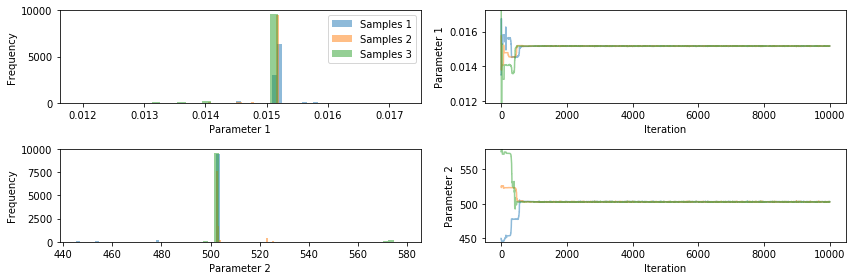

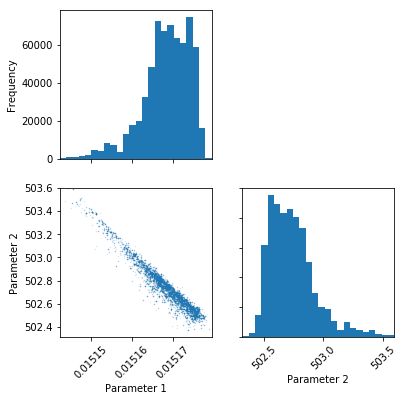

In [36]:
#chains_emu = pints.mcmc_sample(log_posterior_emu, 3, xs)
# Create mcmc routine
mcmc = pints.MCMCController(log_posterior_emu, 3, xs)

# Add stopping criterion
mcmc.set_max_iterations(10000)

# Disable logging mode
mcmc.set_log_to_screen(False)

# Run!
print('Running...')
chains_emu = mcmc.run()
print('Done!')

# Show traces and histograms
pints.plot.trace(chains_emu)

# Discard warm up
chains_emu_thin = chains_emu[:, 1000:, :]

# Check convergence using rhat criterion
print('R-hat:')
print(pints.rhat_all_params(chains_emu_thin))

# Look at distribution in chain 0
pints.plot.pairwise(chains_emu_thin[0])

# Show graphs
plt.show()

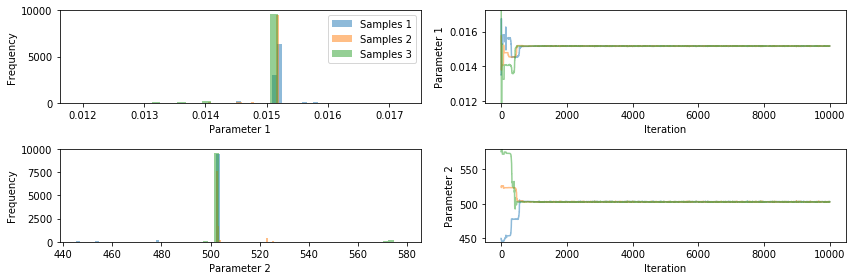

In [37]:
pints.plot.trace(chains_emu)
plt.show()

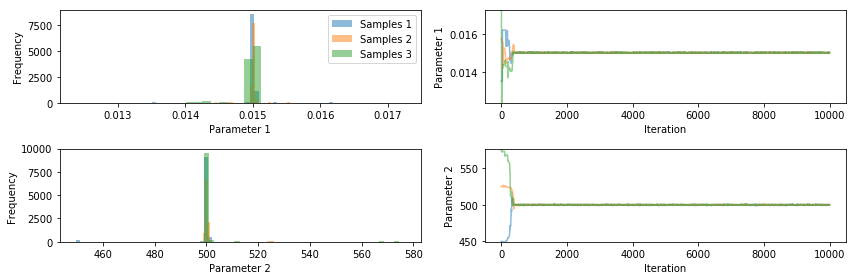

In [38]:
pints.plot.trace(chains)
plt.show()

In [39]:
chain_emu = chains_emu[0]
chain_emu = chain_emu[2000:]
chain = chains[0]
chain = chain[2000:]

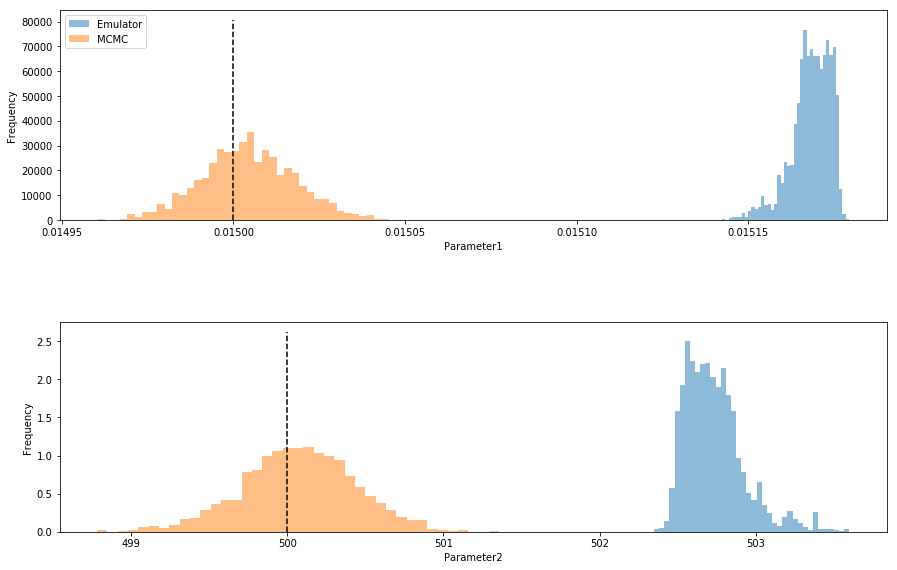

In [40]:
fig, axes = pints.plot.histogram([chain_emu, chain], ref_parameters=true_parameters, sample_names=["Emulator", "MCMC"])
fig.set_size_inches(14, 9)
plt.show()

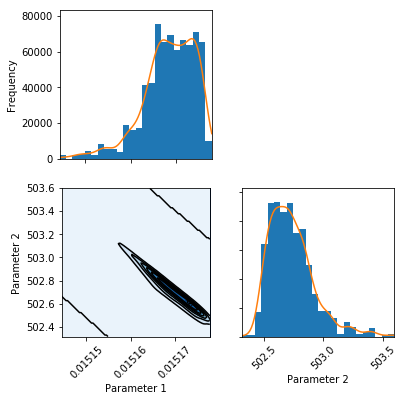

In [41]:
thinned_chain_emu = chain_emu[::10]
pints.plot.pairwise(thinned_chain_emu, kde=True, ref_parameters=true_parameters)
plt.show()

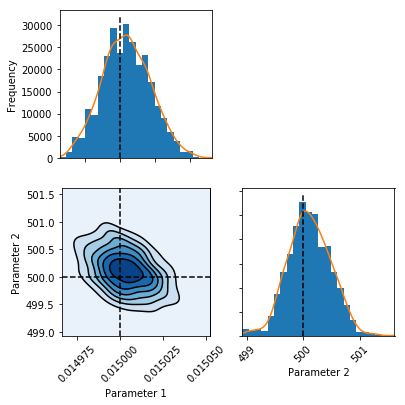

In [42]:
pints.plot.pairwise(thinned_chain, kde=True, ref_parameters=true_parameters)
plt.show()

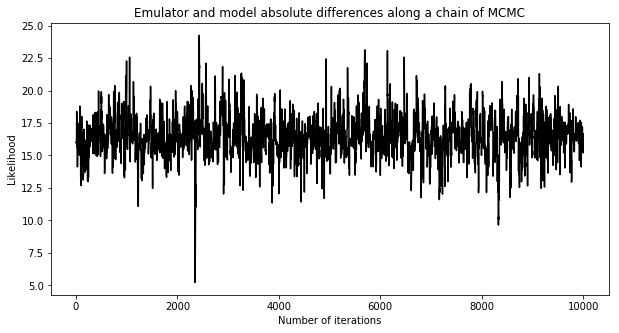

16.65381730117042

In [43]:
emu_prediction = np.apply_along_axis(emu, 1, chain_emu).flatten()
model_prediction = np.apply_along_axis(log_likelihood, 1, chain).flatten()
diffs = np.abs(model_prediction - emu_prediction)

iters = np.linspace(0, 10000, len(chain_emu))
plt.figure(figsize=(10, 5))
plt.title("Emulator and model absolute differences along a chain of MCMC")
plt.xlabel("Number of iterations")
plt.ylabel("Likelihood")
plt.plot(iters, diffs, color = "Black")
plt.show()

diffs[-1]

In [44]:
chain_emu

array([[1.51703229e-02, 5.02677093e+02],
       [1.51703229e-02, 5.02677093e+02],
       [1.51703229e-02, 5.02677093e+02],
       ...,
       [1.51690125e-02, 5.02734553e+02],
       [1.51658441e-02, 5.02816891e+02],
       [1.51658441e-02, 5.02816891e+02]])

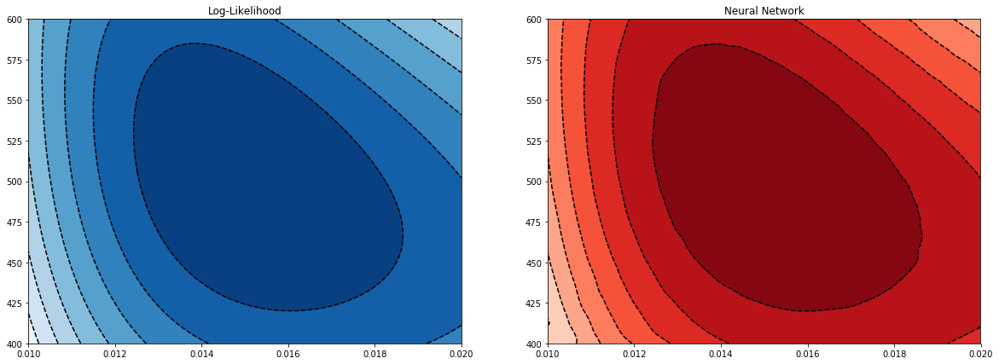

In [67]:
# Create grid
x = [p[0] for p in input_parameters]
y = [p[1] for p in input_parameters]
xmin, xmax = np.min(x), np.max(x)
ymin, ymax = np.min(y), np.max(y)
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
params = [list(n) for n in zip(xx, yy)]
ll = np.apply_along_axis(log_likelihood, 1, params)
ll_emu = np.apply_along_axis(emu, 1, params)
ll_emu = [list(e[0][0]) for e in ll_emu]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
ax1.title.set_text('Log-Likelihood')
ax2.title.set_text('Neural Network')
ax1.contourf(xx, yy, ll, cmap='Blues', extent=[xmin, xmax, ymin, ymax])
ax1.contour(xx, yy, ll, colors='k')
ax2.contourf(xx, yy, ll_emu, cmap='Reds', extent=[xmin, xmax, ymin, ymax])
ax2.contour(xx, yy, ll_emu, colors='k')
plt.show()

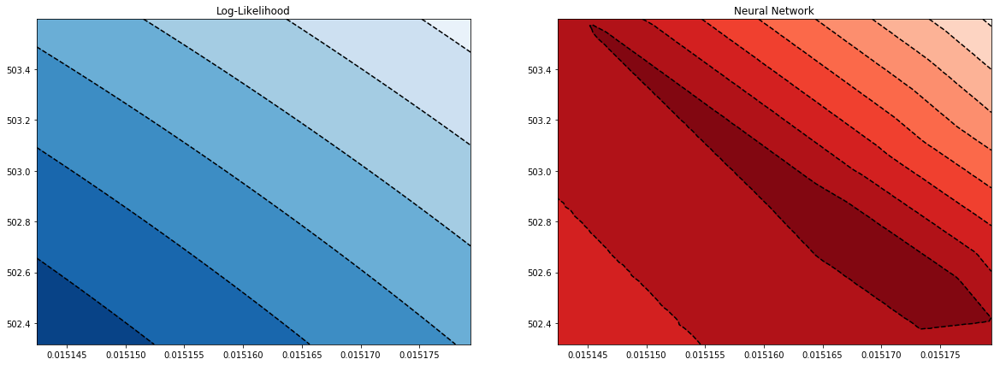

In [46]:
# Create grid
x = [p[0] for p in chain_emu]
y = [p[1] for p in chain_emu]
xmin, xmax = np.min(x), np.max(x)
ymin, ymax = np.min(y), np.max(y)
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
params = [list(n) for n in zip(xx, yy)]
ll = np.apply_along_axis(log_likelihood, 1, params)
ll_emu = np.apply_along_axis(emu, 1, params)
ll_emu = [list(e[0][0]) for e in ll_emu]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
ax1.title.set_text('Log-Likelihood')
ax2.title.set_text('Neural Network')
ax1.contourf(xx, yy, ll, cmap='Blues', extent=[xmin, xmax, ymin, ymax])
ax1.contour(xx, yy, ll, colors='k')
ax2.contourf(xx, yy, ll_emu, cmap='Reds', extent=[xmin, xmax, ymin, ymax])
ax2.contour(xx, yy, ll_emu, colors='k')
plt.show()

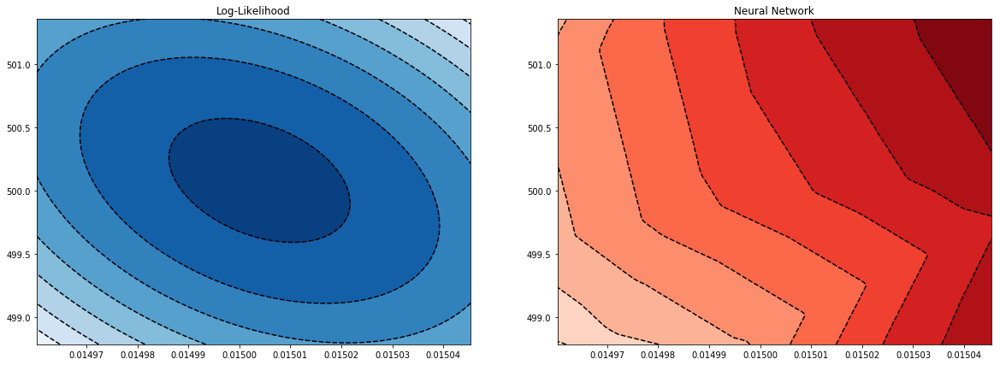

In [47]:
# Create grid
x = [p[0] for p in chain]
y = [p[1] for p in chain]
xmin, xmax = np.min(x), np.max(x)
ymin, ymax = np.min(y), np.max(y)
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
params = [list(n) for n in zip(xx, yy)]
ll = np.apply_along_axis(log_likelihood, 1, params)
ll_emu = np.apply_along_axis(emu, 1, params)
ll_emu = [list(e[0][0]) for e in ll_emu]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
ax1.title.set_text('Log-Likelihood')
ax2.title.set_text('Neural Network')
ax1.contourf(xx, yy, ll, cmap='Blues', extent=[xmin, xmax, ymin, ymax])
ax1.contour(xx, yy, ll, colors='k')
ax2.contourf(xx, yy, ll_emu, cmap='Reds', extent=[xmin, xmax, ymin, ymax])
ax2.contour(xx, yy, ll_emu, colors='k')
plt.show()

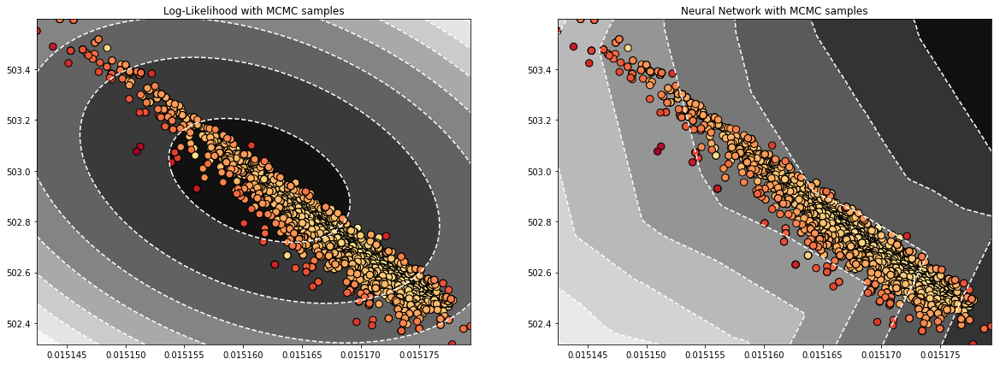

In [48]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
ax1.title.set_text('Log-Likelihood with MCMC samples')
ax2.title.set_text('Neural Network with MCMC samples')

# Show density 
#ax.imshow(np.rot90(ll), cmap=plt.cm.Blues, extent=[xmin, xmax, ymin, ymax])                                                                     

# Plot chain_emu
x = [p[0] for p in chain_emu]
y = [p[1] for p in chain_emu]
xmin, xmax = np.min(x), np.max(x)
ymin, ymax = np.min(y), np.max(y)
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]

idx = diffs.argsort()
x_sorted = np.array(x)[idx]
y_sorted = np.array(y)[idx]
diffs_sorted = diffs[idx]

# Add contour lines
ax1.contourf(xx, yy, ll, cmap='Greys', extent=[xmin, xmax, ymin, ymax])
ax1.contour(xx, yy, ll, colors='w')

# Plot chain_emu    
ax1.set_xlim([xmin, xmax])                                                                           
ax1.set_ylim([ymin, ymax])
ax1.scatter(x_sorted, y_sorted, c=diffs_sorted, s=70, edgecolor='k', cmap="RdYlGn_r")

# Add contour lines
ax2.contourf(xx, yy, ll_emu, cmap='Greys', extent=[xmin, xmax, ymin, ymax])
ax2.contour(xx, yy, ll_emu, colors='w')

# Plot chain_emu    
ax2.set_xlim([xmin, xmax])                                                                           
ax2.set_ylim([ymin, ymax])
ax2.scatter(x_sorted, y_sorted, c=diffs_sorted, s=70, edgecolor='k', cmap="RdYlGn_r")

plt.show()

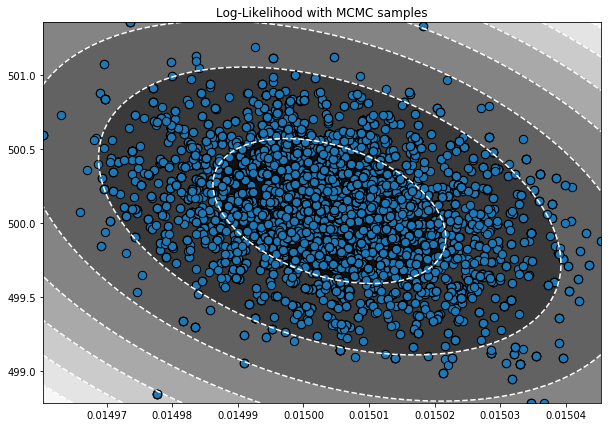

In [49]:
fig, ax = plt.subplots(figsize=(10,7))                   
ax.title.set_text('Log-Likelihood with MCMC samples')

# Show density 
#ax.imshow(np.rot90(ll), cmap=plt.cm.Blues, extent=[xmin, xmax, ymin, ymax])                                                                     

# Plot chain_emu
x = [p[0] for p in chain]
y = [p[1] for p in chain]
xmin, xmax = np.min(x), np.max(x)
ymin, ymax = np.min(y), np.max(y)
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]

idx = diffs.argsort()
x_sorted = np.array(x)[idx]
y_sorted = np.array(y)[idx]
diffs_sorted = diffs[idx]

# Add contour lines
ax.contourf(xx, yy, ll, cmap='Greys', extent=[xmin, xmax, ymin, ymax])
plt.contour(xx, yy, ll, colors='w')

# Plot chain_emu    
ax.set_xlim([xmin, xmax])                                                                           
ax.set_ylim([ymin, ymax])

ax.scatter(x, y, s=70, edgecolor='k', cmap="RdYlGn_r")
#fig.colorbar(ax)
plt.show()